In [1]:
#!pip install --upgrade tf_slim

import gym
import tensorflow as tf
import tensorflow.contrib.slim as slim
import tf_slim as slim
import numpy.random as rnd
import numpy as np
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
from tensorflow import keras
from collections import deque # container em forma de lista, com rapida insercao e remocao nas duas extremidades 
from ns3gym import ns3env

#from sklearn.preprocessing import label_binarize
#from keras.layers import Dense, Flatten, Reshape

/home/sheila/anaconda3/envs/environment_py3_7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/sheila/anaconda3/envs/environment_py3_7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/sheila/anaconda3/envs/environment_py3_7/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/sheila/

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_random_seed(seed)#tf.random.set_seed(seed)
random.seed(seed)

In [3]:
env = gym.make('ns3-v0') # environment ID 

ob_space = env.observation_space
ac_space = env.action_space
print("Observation space: ", ob_space,  ob_space.dtype)
print("Action space: ", ac_space, ac_space.dtype)

# numero de estados
state_size = ob_space.shape[0]

# numero de acoes
action_size = ac_space.shape[0]

print("\n")
print("Numero de Estados: ", state_size)
print("Numero de Acoes: ", action_size) 

Got new port for ns3gm interface:  7007
Observation space:  Box(0, 100, (5,), uint64) uint64
Action space:  Box(0, 100, (5,), uint64) uint64


Numero de Estados:  5
Numero de Acoes:  5


In [4]:
numOfEpisodes = 150 #300 #200
numTimeSlots = 300 #600 #495

discount_rate = 0.99 # gamma 0.618; 0.528; 0.95
learning_rate = 0.85 # Learning rate 0.7


# Epsilon greedy parameters
epsilon = 1 # Epsilon-greedy algorithm in initialized at 1 meaning every step is random at the start
max_epsilon = 1 # You can't explore more than 100% of the time
min_epsilon = 0.01 # At a minimum, we'll always explore 1% of the time
decay = 0.01
epsilon_vec = np.zeros((numOfEpisodes,))

maxNofCollisions = 3

batch_size = 128 # tamanho do batch 128

MIN_REPLAY_SIZE = 1000 # tamanho minimo da memoria de repeticao

inputQueues = 5
cwSize = 100

In [5]:
def createModel(inputQueues, cwSize, loss='mse'):
    learning_rate = 0.001 #0.01
    init = tf.keras.initializers.he_uniform()#tf.keras.initializers.HeUniform()
    model = keras.Sequential()
    # Input layer - número dos estados de entrada 
    model.add(keras.layers.Dense(inputQueues, input_shape=(inputQueues,), activation='relu', kernel_initializer=init))
    # Output layer - número de ações no ambiente
    model.add(keras.layers.Dense(cwSize, activation='linear', kernel_initializer=init))
    #model.add(keras.layers.Flatten())
    
    if(loss=='huber'):
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss=tf.keras.losses.Huber(), metrics=['accuracy'])
        print('Using Huber loss...', "\n")
    elif(loss=='mse'):
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='mse', metrics=['accuracy'])
        print('Using MSE loss...', "\n")
    else:
        print('Loss not defined...', "\n")
    return model

def train(replay_memory, model, model_target, done, batch_size, acc_history=[], loss_history=[]):
    mini_batch = random.sample(replay_memory, batch_size)
    c_states = np.array([transition[0] for transition in mini_batch])    
    #print("CSTATES", c_states, c_states.shape)
    current_qs_list  = model.predict(c_states)
    n_states = np.array([transition[3] for transition in mini_batch]) 
    future_qs_list = model_target.predict(n_states)
    
    
    X = []
    Y = []
    for index, (c_state, actionVec, reward, n_state, done) in enumerate(mini_batch):
        
        if not done:
            max_future_q = reward + discount_rate * np.max(future_qs_list[index])
        else:
            max_future_q = reward

        
        current_qs = current_qs_list[index]
        #print("heyyyy")
        #action != 100
        for action in actionVec:
            if(action != 100):
                current_qs[action] = max_future_q

        X.append(c_state)
        Y.append(current_qs)

    # Train model with a mini-batch.
    history = model.fit(np.array(X), np.array(Y), batch_size=batch_size, verbose=0, shuffle=True)

    # Store metrics.
    acc_history.append(history.history['acc'][0])
    loss_history.append(history.history['loss'][0])

    return history

In [6]:
print("Prediction Network")
# The first model makes the predictions for Q-values which are used to make a action.
model = createModel(inputQueues, cwSize)

print("Target Network")
# Build a target model for the prediction of future rewards.
model_target = createModel(inputQueues, cwSize)
# Initialize target model's weights.
model_target.set_weights(model.get_weights())

Prediction Network
Using MSE loss... 

Target Network
Using MSE loss... 



In [7]:
model.metrics_names

['loss', 'acc']

In [8]:
acc_history = []
loss_history = []

episode_reward = np.zeros((numOfEpisodes,))
max_reward =  np.zeros((numOfEpisodes,))
replay_memory = deque(maxlen=50_000)

steps_to_update_target_model = 0


for episode in range(numOfEpisodes):
    
        
    print('Episode:', episode)

    collisionCnt = 0
    
    state = env.reset()
    state = np.reshape(state, [1, state_size])
    #state = np.array(state)
    
                       
    for iteration in range(numTimeSlots):
        
                        
        steps_to_update_target_model += 1
        
        print("Time Slot   :", iteration)
        print("----------------------")
        
        print("Estado atual:", state[0])
                  
        # Escolha da ação.
        if np.random.uniform() >= epsilon:
            #predicted = model.predict(state.reshape(1,4))
            #action = np.argmax(predicted[0])
            
            act = model.predict(state)
            #print("actions ", act, act[0][0], act[0][1], act[0][2], act[0][3], act[0][4])
            act = act.reshape(20,5)
            
            action0 = np.argmax(act[:,0])            
            action1 = np.argmax(act[:,1])
            action2 = np.argmax(act[:,2])
            action3 = np.argmax(act[:,3])
            action4 = np.argmax(act[:,4])
            #action0 = np.argmax(model.predict(state[:,0]-state[:,1])[0])
            #action1 = np.argmax(model.predict(state[:,1]-state[:,2])[0])
            #action2 = np.argmax(model.predict(state[:,2]-state[:,3])[0])
            #action3 = np.argmax(model.predict(state[:,3]-state[:,4])[0])
            #action4 = np.argmax(model.predict(state[:,4]-state[:,5])[0])
            
            print("Action (Q)") # action0, action1, action2, action3
        else:
            action0 = np.random.randint(1, cwSize)
            action1 = np.random.randint(1, cwSize)
            action2 = np.random.randint(1, cwSize)
            action3 = np.random.randint(1, cwSize)
            action4 = np.random.randint(1, cwSize)
            print("Action (rnd)") # action0, action1, action2, action3
            
        
        actionVec = [action0, action1, action2, action3, action4]
        print("ActionVec   :", actionVec)
        
        next_state, reward, done, _, _ = env.step(actionVec)
        
        #print("reward: ", reward)
      
        next_state = np.reshape(next_state, [1, state_size])
        #next_state = np.reshape(next_state, [state_size, ])
        #next_state = np.array(next_state)
        print("Next State  :", next_state[0])
        
        print("Reward      : ", reward)
        
        # Reward.
        if ((actionVec[3] >= 10) or (actionVec[4] >= 10)):
            reward = 0.0
            collisionCnt += 1
        else:
            reward = 1.0
        
        # Add information to replay buffer.
        replay_memory.append([state[0], actionVec, reward, next_state[0], done])          

        # Accumulate reward.
        #if (reward!=0.0):
        episode_reward[episode] += reward
        #episode_reward[episode] += reward
        #print("episode_reward[episode]:", episode_reward[episode])
      
        # Plot received reward.
        #print("Reward      :", reward)
        print("-------------", "\n")      

        
        
        # Train
        if len(replay_memory) >= MIN_REPLAY_SIZE:
            
            history = train(replay_memory, model, model_target, done, batch_size, acc_history, loss_history)

        # Is it the end of the episode?
        if done:
            #print("Done: ", done)
            collisionCnt = 0
            # Update the the target network with new weights
            model_target.set_weights(model.get_weights())
            print('########## Game Over ##########')
            break
        
        # updates the current state
        state = next_state
        
    # Decrease epsilon along the way.
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * episode)
    epsilon_vec[episode] = epsilon 
        
    # Store maxmim possible reward per episode.
    #max_reward[episode] = iteration + 1
    max_reward[episode] = iteration + 1 #reward + 1 
    #print("max_reward[episode]", max_reward[episode])
        
    print('episode_reward:', episode_reward[episode])

Episode: 0
currentNodeId=4
Time Slot   : 0
----------------------
Estado atual: [100   2   2   2   0]
Action (rnd)
ActionVec   : [15, 72, 61, 21, 83]
Next State  : [100   4   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   4   1   3   0]
Action (rnd)
ActionVec   : [75, 88, 24, 3, 22]
Next State  : [100   4   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   4   1   2   0]
Action (rnd)
ActionVec   : [88, 30, 38, 2, 64]
Next State  : [100   4   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   4   1   1   0]
Action (rnd)
ActionVec   : [33, 76, 58, 22, 89]
Next State  : [100   5   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   5   1   0   0]
Action (rnd)
ActionVec   : [59, 42, 92, 60, 80]
Next State  : [100   4   2   0   0]
Reward      :  1.0
------------- 

Time 

Next State  : [100  36  11   3   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100  36  11   3   0]
Action (rnd)
ActionVec   : [30, 97, 28, 64, 97]
Next State  : [99 31 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 53
----------------------
Estado atual: [99 31 10  5  0]
Action (rnd)
ActionVec   : [61, 48, 19, 4, 35]
Next State  : [99 30 10  4  0]
Reward      :  1.0
------------- 

Time Slot   : 54
----------------------
Estado atual: [99 30 10  4  0]
Action (rnd)
ActionVec   : [17, 44, 92, 30, 93]
Next State  : [98 29  9  4  0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [98 29  9  4  0]
Action (rnd)
ActionVec   : [6, 99, 37, 24, 93]
Next State  : [100  29   9   3   0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [100  29   9   3   0]
Action (rnd)
ActionVec   : [53, 95, 99, 60, 97]
Next State  : [99 26 10  3  0]
Reward      :  1.0
-------

Next State  : [100   7  18  21   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100   7  18  21   0]
Action (rnd)
ActionVec   : [72, 61, 39, 1, 3]
Next State  : [100   7  18  20   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100   7  18  20   0]
Action (rnd)
ActionVec   : [62, 63, 25, 56, 33]
Next State  : [100   7  16  21   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   7  16  21   0]
Action (rnd)
ActionVec   : [6, 58, 44, 45, 32]
Next State  : [100  14  14  16   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  14  14  16   0]
Action (rnd)
ActionVec   : [47, 21, 80, 85, 75]
Next State  : [96 15 14 15  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [96 15 14 15  0]
Action (rnd)
ActionVec   : [36, 99, 19, 20, 57]
Next State  : [100  15  14  14   

Next State  : [100  12  17   9   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  12  17   9   0]
Action (rnd)
ActionVec   : [26, 51, 45, 44, 5]
Next State  : [100  12  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  12  17   8   0]
Action (rnd)
ActionVec   : [68, 19, 84, 97, 20]
Next State  : [100  13  16   8   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  13  16   8   0]
Action (rnd)
ActionVec   : [47, 1, 90, 14, 64]
Next State  : [92 13 15  8  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [92 13 15  8  0]
Action (rnd)
ActionVec   : [11, 77, 3, 33, 6]
Next State  : [100  12  16   7   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  12  16   7   0]
Action (rnd)
ActionVec   : [10, 5, 23, 10, 44]
Next State  : [100  12  16   6   0]

Next State  : [99  0  4 26  0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [99  0  4 26  0]
Action (rnd)
ActionVec   : [7, 93, 8, 65, 57]
Next State  : [100   1   4  25   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100   1   4  25   0]
Action (rnd)
ActionVec   : [88, 87, 59, 72, 54]
Next State  : [100   2   5  24   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   2   5  24   0]
Action (rnd)
ActionVec   : [67, 51, 97, 92, 8]
Next State  : [100   2   5  23   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100   2   5  23   0]
Action (rnd)
ActionVec   : [96, 88, 78, 32, 46]
Next State  : [100   2   5  22   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100   2   5  22   0]
Action (rnd)
ActionVec   : [68, 37, 54, 85, 14]
Next State  : [100   0   7  23   

Time Slot   : 0
----------------------
Estado atual: [100   3   2   3   0]
Action (rnd)
ActionVec   : [74, 98, 57, 90, 41]
Next State  : [100   3   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   2   4   0]
Action (rnd)
ActionVec   : [3, 6, 5, 5, 54]
Next State  : [100   3   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   3   2   3   0]
Action (rnd)
ActionVec   : [49, 9, 99, 20, 61]
Next State  : [100   3   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   3   2   2   0]
Action (rnd)
ActionVec   : [35, 50, 82, 62, 17]
Next State  : [100   3   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   3   2   1   0]
Action (rnd)
ActionVec   : [32, 99, 13, 89, 73]
Next State  : [100   6   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 5
-------------------

Next State  : [100   1   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100   1   1   6   0]
Action (rnd)
ActionVec   : [95, 32, 41, 76, 8]
Next State  : [100   1   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100   1   1   6   0]
Action (rnd)
ActionVec   : [92, 62, 84, 62, 7]
Next State  : [100   1   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 53
----------------------
Estado atual: [100   1   1   5   0]
Action (rnd)
ActionVec   : [80, 4, 6, 58, 22]
Next State  : [100   0   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 54
----------------------
Estado atual: [100   0   0   7   0]
Action (rnd)
ActionVec   : [3, 41, 60, 14, 75]
Next State  : [100   0   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [100   0   0   6   0]
Action (rnd)
ActionVec   : [12, 87, 12, 13, 25]
Next State  : [100   0   0   5

Next State  : [100  41   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  41   3   0   0]
Action (rnd)
ActionVec   : [74, 39, 13, 31, 71]
Next State  : [100  38   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  38   5   0   0]
Action (rnd)
ActionVec   : [42, 61, 42, 56, 36]
Next State  : [99 37  2  4  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [99 37  2  4  0]
Action (rnd)
ActionVec   : [7, 54, 1, 44, 45]
Next State  : [99 37  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [99 37  0  4  0]
Action (rnd)
ActionVec   : [13, 22, 21, 86, 92]
Next State  : [100  38   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  38   1   7   0]
Action (rnd)
ActionVec   : [9, 15, 10, 88, 42]
Next State  : [100  36   1  13   0]
Reward 

Next State  : [92  0 11 30  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [92  0 11 30  0]
Action (rnd)
ActionVec   : [85, 53, 82, 45, 32]
Next State  : [100   0  11  29   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100   0  11  29   0]
Action (rnd)
ActionVec   : [99, 60, 11, 63, 21]
Next State  : [96  1  5 29  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [96  1  5 29  0]
Action (rnd)
ActionVec   : [55, 26, 68, 34, 52]
Next State  : [100   0   5  29   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100   0   5  29   0]
Action (rnd)
ActionVec   : [82, 99, 93, 52, 29]
Next State  : [100   0   5  28   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100   0   5  28   0]
Action (rnd)
ActionVec   : [21, 42, 13, 64, 17]
Next State  : [98  4  0 27  0]
Reward   

Next State  : [89  3  9  2  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [89  3  9  2  0]
Action (rnd)
ActionVec   : [47, 78, 75, 9, 90]
Next State  : [100   3   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100   3   9   1   0]
Action (rnd)
ActionVec   : [61, 10, 50, 3, 77]
Next State  : [100   3   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100   3   9   0   0]
Action (rnd)
ActionVec   : [94, 70, 81, 51, 19]
Next State  : [100   5   7   1   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100   5   7   1   0]
Action (rnd)
ActionVec   : [46, 26, 69, 93, 64]
Next State  : [100   5   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   5   7   0   0]
Action (rnd)
ActionVec   : [49, 21, 74, 64, 5]
Next State  : [99  5  7  0  0]
Re

Next State  : [100  17   9  15   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  17   9  15   0]
Action (rnd)
ActionVec   : [87, 22, 48, 83, 51]
Next State  : [92 12 12 17  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [92 12 12 17  0]
Action (rnd)
ActionVec   : [19, 73, 28, 84, 45]
Next State  : [99 13 11 19  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [99 13 11 19  0]
Action (rnd)
ActionVec   : [63, 73, 19, 47, 14]
Next State  : [99 14  8 21  0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [99 14  8 21  0]
Action (rnd)
ActionVec   : [53, 61, 36, 40, 81]
Next State  : [100  14   7  22   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  14   7  22   0]
Action (rnd)
ActionVec   : [64, 33, 52, 89, 14]
Next State  : [98 13  7 23  0]
Reward      :  1.0


Next State  : [100   1   2   5   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   1   2   5   0]
Action (rnd)
ActionVec   : [68, 1, 92, 63, 24]
Next State  : [100   0   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   0   3   5   0]
Action (Q)
ActionVec   : [18, 14, 1, 4, 15]
Next State  : [100   0   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   0   3   4   0]
Action (rnd)
ActionVec   : [98, 11, 51, 17, 99]
Next State  : [100   0   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100   0   3   3   0]
Action (rnd)
ActionVec   : [86, 24, 19, 37, 85]
Next State  : [100   0   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100   0   3   2   0]
Action (rnd)
ActionVec   : [5, 17, 36, 19, 64]
Next State  : [100   2   4   1 

Next State  : [94 18 16  2  0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [94 18 16  2  0]
Action (rnd)
ActionVec   : [13, 33, 24, 11, 17]
Next State  : [99 17 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [99 17 17  1  0]
Action (rnd)
ActionVec   : [25, 94, 73, 21, 84]
Next State  : [98 16 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [98 16 17  1  0]
Action (rnd)
ActionVec   : [12, 37, 42, 17, 48]
Next State  : [97 16 17  0  0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [97 16 17  0  0]
Action (rnd)
ActionVec   : [41, 99, 47, 18, 78]
Next State  : [100  18  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  18  17   0   0]
Action (rnd)
ActionVec   : [71, 13, 82, 13, 31]
Next State  : [100  18  16   0   0]
Reward      :  1.0
----------

Next State  : [100  75   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  75   4   1   0]
Action (rnd)
ActionVec   : [84, 20, 94, 35, 99]
Next State  : [73 71  7  1  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [73 71  7  1  0]
Action (rnd)
ActionVec   : [91, 90, 78, 17, 18]
Next State  : [99 70  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [99 70  7  0  0]
Action (Q)
ActionVec   : [18, 14, 1, 4, 15]
Next State  : [90 57  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [90 57  3  5  0]
Action (rnd)
ActionVec   : [53, 91, 82, 68, 65]
Next State  : [99 55  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [99 55  4  4  0]
Action (rnd)
ActionVec   : [58, 26, 20, 87, 10]
Next State  : [96 51  6  5  0]
Reward      :  1.0
------------- 

Next State  : [100  20   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  20   2  15   0]
Action (rnd)
ActionVec   : [84, 54, 7, 79, 87]
Next State  : [96 17  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [96 17  0 20  0]
Action (rnd)
ActionVec   : [19, 54, 93, 20, 29]
Next State  : [99 17  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [99 17  0 19  0]
Action (rnd)
ActionVec   : [63, 74, 57, 8, 90]
Next State  : [98 17  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [98 17  0 18  0]
Action (rnd)
ActionVec   : [74, 17, 66, 6, 58]
Next State  : [99 16  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [99 16  0 17  0]
Action (rnd)
ActionVec   : [62, 41, 69, 82, 90]
Next State  : [98 14  1 16  0]
Reward      :  1.0
-------------

Next State  : [99  0 22 10  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [99  0 22 10  0]
Action (rnd)
ActionVec   : [48, 49, 64, 61, 29]
Next State  : [97  3 21 13  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [97  3 21 13  0]
Action (rnd)
ActionVec   : [88, 26, 17, 71, 13]
Next State  : [98  3 20 14  0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [98  3 20 14  0]
Action (rnd)
ActionVec   : [49, 67, 7, 58, 49]
Next State  : [98  3 18 15  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [98  3 18 15  0]
Action (rnd)
ActionVec   : [65, 62, 17, 43, 25]
Next State  : [93  2 15 18  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [93  2 15 18  0]
Action (rnd)
ActionVec   : [3, 79, 29, 32, 26]
Next State  : [100  11  14  17   0]
Reward      :  1.0
------------- 

T

Next State  : [100  21   5   8   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  21   5   8   0]
Action (rnd)
ActionVec   : [62, 7, 80, 45, 59]
Next State  : [64 18  6  8  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [64 18  6  8  0]
Action (rnd)
ActionVec   : [48, 27, 53, 87, 88]
Next State  : [98 16  8  8  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [98 16  8  8  0]
Action (rnd)
ActionVec   : [73, 35, 51, 84, 37]
Next State  : [96 16  8  9  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [96 16  8  9  0]
Action (rnd)
ActionVec   : [95, 57, 8, 79, 95]
Next State  : [98 15  9  8  0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [98 15  9  8  0]
Action (rnd)
ActionVec   : [20, 53, 12, 49, 17]
Next State  : [95 17  6 10  0]
Reward      :  1.0
------------

Next State  : [100  10   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100  10   4  10   0]
Action (rnd)
ActionVec   : [32, 81, 60, 83, 58]
Next State  : [100   9   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100   9   3  11   0]
Action (rnd)
ActionVec   : [56, 28, 1, 42, 82]
Next State  : [100   9   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100   9   3  10   0]
Action (Q)
ActionVec   : [18, 14, 1, 4, 15]
Next State  : [100   9   3   9   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100   9   3   9   0]
Action (rnd)
ActionVec   : [76, 72, 88, 80, 4]
Next State  : [100  10   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  10   2   9   0]
Action (rnd)
ActionVec   : [27, 9, 16, 56, 76]
Next State  : [100   8   4   8  

Next State  : [99 12  5 13  0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [99 12  5 13  0]
Action (rnd)
ActionVec   : [12, 13, 43, 17, 63]
Next State  : [99 11  5 13  0]
Reward      :  1.0
------------- 

Time Slot   : 103
----------------------
Estado atual: [99 11  5 13  0]
Action (rnd)
ActionVec   : [36, 85, 8, 69, 90]
Next State  : [100  11   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 104
----------------------
Estado atual: [100  11   5  12   0]
Action (rnd)
ActionVec   : [28, 93, 47, 76, 30]
Next State  : [100  13   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100  13   7  13   0]
Action (rnd)
ActionVec   : [14, 74, 71, 52, 37]
Next State  : [100  14   6  13   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  14   6  13   0]
Action (rnd)
ActionVec   : [15, 47, 46, 52, 19]
Next State  : [100  14   6  12   0]
Rewar

Time Slot   : 160
----------------------
Estado atual: [100   3   0  15   0]
Action (rnd)
ActionVec   : [30, 22, 75, 66, 12]
Next State  : [100   3   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100   3   0  14   0]
Action (rnd)
ActionVec   : [44, 1, 10, 80, 72]
Next State  : [97  0  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [97  0  2 17  0]
Action (rnd)
ActionVec   : [40, 51, 42, 7, 50]
Next State  : [98  0  1 17  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [98  0  1 17  0]
Action (rnd)
ActionVec   : [85, 23, 29, 78, 90]
Next State  : [100   0   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   0   2  17   0]
Action (rnd)
ActionVec   : [23, 82, 50, 78, 79]
Next State  : [100   1   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
E

Next State  : [99  3 10  7  0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [99  3 10  7  0]
Action (rnd)
ActionVec   : [93, 73, 48, 74, 83]
Next State  : [100   3  11   6   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100   3  11   6   0]
Action (rnd)
ActionVec   : [92, 81, 14, 71, 86]
Next State  : [96  1  5 12  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [96  1  5 12  0]
Action (rnd)
ActionVec   : [88, 97, 16, 8, 93]
Next State  : [97  1  4 12  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [97  1  4 12  0]
Action (rnd)
ActionVec   : [52, 15, 46, 23, 12]
Next State  : [99  1  4 11  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [99  1  4 11  0]
Action (rnd)
ActionVec   : [96, 4, 13, 73, 57]
Next State  : [100   0   0  19   0]
Reward      :  1.0
-------

Time Slot   : 251
----------------------
Estado atual: [100  17   7  14   0]
Action (rnd)
ActionVec   : [45, 45, 79, 84, 84]
Next State  : [100  16   9  14   0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [100  16   9  14   0]
Action (rnd)
ActionVec   : [99, 36, 36, 73, 22]
Next State  : [97 13 10 16  0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [97 13 10 16  0]
Action (rnd)
ActionVec   : [74, 79, 31, 93, 81]
Next State  : [100  12   9  18   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  12   9  18   0]
Action (rnd)
ActionVec   : [3, 58, 89, 97, 17]
Next State  : [100  20   7  18   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  20   7  18   0]
Action (rnd)
ActionVec   : [81, 74, 55, 28, 92]
Next State  : [98 20  6 18  0]
Reward      :  1.0
------------- 

Time Slot   : 256
------------------

----------------------
Estado atual: [100  21   4  21   0]
Action (rnd)
ActionVec   : [70, 43, 74, 23, 79]
Next State  : [100  21   3  21   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100  21   3  21   0]
Action (rnd)
ActionVec   : [48, 69, 74, 28, 79]
Next State  : [100  21   4  20   0]
Reward      :  1.0
------------- 

episode_reward: 1.0
Episode: 4
currentNodeId=4
Got new port for ns3gm interface:  9587
Time Slot   : 0
----------------------
Estado atual: [100   4   2   2   0]
Action (rnd)
ActionVec   : [98, 88, 73, 2, 85]
Next State  : [100   4   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   4   2   1   0]
Action (rnd)
ActionVec   : [5, 69, 47, 74, 40]
Next State  : [100   4   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   4   2   0   0]
Action (rnd)
ActionVec   : [7, 75, 11, 36, 20]
Next State  : [100   6   1   3 

Next State  : [100  26   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  26   0   4   0]
Action (rnd)
ActionVec   : [13, 80, 78, 72, 19]
Next State  : [100  25   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  25   1   3   0]
Action (rnd)
ActionVec   : [39, 52, 86, 3, 29]
Next State  : [100  25   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100  25   1   2   0]
Action (rnd)
ActionVec   : [76, 12, 50, 68, 61]
Next State  : [100  24   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100  24   2   2   0]
Action (rnd)
ActionVec   : [27, 96, 42, 52, 93]
Next State  : [100  24   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100  24   2   2   0]
Action (rnd)
ActionVec   : [83, 78, 36, 11, 27]
Next State  : [100  23   2

Next State  : [100  32  16   9   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  32  16   9   0]
Action (rnd)
ActionVec   : [91, 9, 17, 5, 26]
Next State  : [100  32  16   8   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  32  16   8   0]
Action (rnd)
ActionVec   : [12, 33, 21, 73, 72]
Next State  : [96 25 16 10  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [96 25 16 10  0]
Action (rnd)
ActionVec   : [23, 79, 13, 78, 14]
Next State  : [99 31  0 24  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [99 31  0 24  0]
Action (rnd)
ActionVec   : [68, 93, 30, 13, 15]
Next State  : [100  31   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100  31   0  23   0]
Action (Q)
ActionVec   : [18, 14, 1, 4, 15]
Next State  : [43 30  0 22  0]
Reward      :  1.0
-

Next State  : [100  38   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100  38   0  13   0]
Action (rnd)
ActionVec   : [62, 78, 51, 4, 86]
Next State  : [99 37  0 12  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [99 37  0 12  0]
Action (rnd)
ActionVec   : [60, 20, 98, 98, 63]
Next State  : [99 36  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [99 36  0 11  0]
Action (rnd)
ActionVec   : [23, 71, 7, 65, 18]
Next State  : [99 35  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [99 35  0 10  0]
Action (rnd)
ActionVec   : [49, 27, 28, 88, 97]
Next State  : [99 34  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [99 34  0  9  0]
Action (rnd)
ActionVec   : [1, 41, 18, 1, 39]
Next State  : [99 33  0  8  0]
Reward      :  1.0
------------- 

Next State  : [100  13   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  13   6  15   0]
Action (rnd)
ActionVec   : [11, 12, 97, 86, 53]
Next State  : [100  12   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100  12   6  15   0]
Action (rnd)
ActionVec   : [86, 10, 82, 77, 72]
Next State  : [100   4  15  14   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100   4  15  14   0]
Action (rnd)
ActionVec   : [97, 24, 80, 50, 92]
Next State  : [93  3 16 13  0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [93  3 16 13  0]
Action (rnd)
ActionVec   : [80, 99, 50, 1, 89]
Next State  : [97  3 16 12  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [97  3 16 12  0]
Action (rnd)
ActionVec   : [24, 45, 53, 53, 17]
Next State  : [100   3  17  11   0]
Rewar

Time Slot   : 238
----------------------
Estado atual: [100   1   0  35   0]
Action (rnd)
ActionVec   : [68, 93, 45, 28, 56]
Next State  : [100   1   0  34   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100   1   0  34   0]
Action (rnd)
ActionVec   : [55, 77, 14, 1, 97]
Next State  : [100   1   0  33   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100   1   0  33   0]
Action (rnd)
ActionVec   : [7, 7, 36, 13, 67]
Next State  : [100   1   0  32   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100   1   0  32   0]
Action (rnd)
ActionVec   : [17, 44, 52, 88, 22]
Next State  : [100   0   2  32   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100   0   2  32   0]
Action (rnd)
ActionVec   : [5, 28, 76, 60, 77]
Next State  : [100   8   2  25   0]
Reward      :  1.0
------------- 

Time Slot   : 243
------

Next State  : [100   3   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100   3   3  10   0]
Action (rnd)
ActionVec   : [57, 50, 16, 62, 98]
Next State  : [98  3  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [98  3  1 16  0]
Action (rnd)
ActionVec   : [80, 61, 96, 28, 60]
Next State  : [100   3   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100   3   0  16   0]
Action (rnd)
ActionVec   : [32, 22, 93, 55, 92]
Next State  : [99  2  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [99  2  2 15  0]
Action (rnd)
ActionVec   : [34, 52, 50, 67, 5]
Next State  : [99  1  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [99  1  2 15  0]
Action (rnd)
ActionVec   : [37, 14, 48, 78, 71]
Next State  : [100   3   2  14   0]
Reward      :  

Action (rnd)
ActionVec   : [34, 57, 97, 62, 39]
Next State  : [100  22  27   6   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  22  27   6   0]
Action (rnd)
ActionVec   : [30, 41, 48, 28, 31]
Next State  : [100  22  26   5   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100  22  26   5   0]
Action (rnd)
ActionVec   : [73, 66, 84, 27, 19]
Next State  : [99 22 26  5  0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [99 22 26  5  0]
Action (rnd)
ActionVec   : [79, 26, 38, 38, 55]
Next State  : [99 21 26  4  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [99 21 26  4  0]
Action (Q)
ActionVec   : [7, 14, 1, 4, 15]
Next State  : [100  21  26   3   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  21  26   3   0]
Action (rnd)
ActionVec   : [49, 34, 2, 30, 38]
Nex

Time Slot   : 89
----------------------
Estado atual: [100   1   2  20   0]
Action (rnd)
ActionVec   : [57, 3, 77, 11, 42]
Next State  : [100   0   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   0   2  19   0]
Action (rnd)
ActionVec   : [70, 78, 74, 88, 24]
Next State  : [100   0   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100   0   2  18   0]
Action (rnd)
ActionVec   : [83, 95, 33, 66, 79]
Next State  : [100   0   3  17   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100   0   3  17   0]
Action (rnd)
ActionVec   : [90, 5, 9, 66, 71]
Next State  : [98  0  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [98  0  1 20  0]
Action (rnd)
ActionVec   : [28, 28, 52, 16, 33]
Next State  : [99  0  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Est

Time Slot   : 135
----------------------
Estado atual: [99 27  0  4  0]
Action (rnd)
ActionVec   : [72, 91, 27, 7, 3]
Next State  : [100  27   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  27   0   3   0]
Action (rnd)
ActionVec   : [92, 97, 6, 7, 60]
Next State  : [100  28   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  28   0   2   0]
Action (rnd)
ActionVec   : [5, 55, 36, 72, 94]
Next State  : [100  28   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  28   1   2   0]
Action (rnd)
ActionVec   : [86, 24, 71, 13, 6]
Next State  : [94 26  2  2  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [94 26  2  2  0]
Action (rnd)
ActionVec   : [57, 70, 55, 37, 71]
Next State  : [100  26   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------


Next State  : [100  24  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  24  24   0   0]
Action (rnd)
ActionVec   : [76, 54, 36, 77, 99]
Next State  : [95 25 21  3  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [95 25 21  3  0]
Action (rnd)
ActionVec   : [23, 43, 32, 28, 33]
Next State  : [100  24  22   2   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  24  22   2   0]
Action (rnd)
ActionVec   : [3, 21, 61, 3, 53]
Next State  : [100  24  22   1   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  24  22   1   0]
Action (rnd)
ActionVec   : [92, 82, 86, 20, 80]
Next State  : [100  24  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  24  22   0   0]
Action (rnd)
ActionVec   : [97, 55, 6, 29, 80]
Next State  : [90 24 19  2  0]
Re

Time Slot   : 236
----------------------
Estado atual: [100   9   0  13   0]
Action (rnd)
ActionVec   : [87, 24, 99, 72, 18]
Next State  : [100   5   5  13   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100   5   5  13   0]
Action (Q)
ActionVec   : [18, 14, 1, 8, 15]
Next State  : [100   5   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100   5   5  12   0]
Action (rnd)
ActionVec   : [65, 12, 52, 51, 86]
Next State  : [87  1 10 11  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [87  1 10 11  0]
Action (rnd)
ActionVec   : [91, 3, 99, 52, 82]
Next State  : [99  0 11 10  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [99  0 11 10  0]
Action (rnd)
ActionVec   : [90, 12, 35, 4, 45]
Next State  : [99  0 11  9  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atu

Next State  : [96  0 21  9  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [96  0 21  9  0]
Action (rnd)
ActionVec   : [47, 7, 39, 56, 85]
Next State  : [99  0 20 10  0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [99  0 20 10  0]
Action (rnd)
ActionVec   : [5, 54, 37, 74, 10]
Next State  : [100  16  19  11   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  16  19  11   0]
Action (rnd)
ActionVec   : [44, 85, 80, 64, 20]
Next State  : [100  17  18  11   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  17  18  11   0]
Action (Q)
ActionVec   : [18, 14, 1, 8, 15]
Next State  : [100  16  19  10   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  16  19  10   0]
Action (rnd)
ActionVec   : [75, 59, 18, 66, 35]
Next State  : [100  17  19   9   0]
Reward    

Time Slot   : 33
----------------------
Estado atual: [93 25  0 18  0]
Action (rnd)
ActionVec   : [22, 85, 49, 12, 71]
Next State  : [93 27  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [93 27  0 17  0]
Action (rnd)
ActionVec   : [99, 4, 35, 1, 81]
Next State  : [96 26  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [96 26  0 16  0]
Action (rnd)
ActionVec   : [12, 73, 10, 74, 17]
Next State  : [82 26  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [82 26  0 16  0]
Action (rnd)
ActionVec   : [91, 10, 10, 81, 42]
Next State  : [99 20  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [99 20  0 20  0]
Action (rnd)
ActionVec   : [47, 31, 99, 5, 33]
Next State  : [99 20  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [99 20  0 19  0]
Action 

Time Slot   : 77
----------------------
Estado atual: [100  19   0  14   0]
Action (rnd)
ActionVec   : [25, 71, 62, 61, 45]
Next State  : [80 17  2 13  0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [80 17  2 13  0]
Action (rnd)
ActionVec   : [30, 6, 25, 31, 11]
Next State  : [90 14  4 13  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [90 14  4 13  0]
Action (rnd)
ActionVec   : [20, 43, 70, 8, 45]
Next State  : [93 13  4 12  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [93 13  4 12  0]
Action (rnd)
ActionVec   : [69, 54, 92, 87, 42]
Next State  : [100  14   6  11   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  14   6  11   0]
Action (rnd)
ActionVec   : [37, 75, 34, 10, 78]
Next State  : [100  14   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [10

Next State  : [98  2 28  0  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [98  2 28  0  0]
Action (rnd)
ActionVec   : [17, 15, 40, 75, 3]
Next State  : [100   2  25   1   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100   2  25   1   0]
Action (rnd)
ActionVec   : [25, 66, 36, 65, 44]
Next State  : [99  5 22  2  0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [99  5 22  2  0]
Action (rnd)
ActionVec   : [79, 12, 39, 94, 62]
Next State  : [85  5 19  5  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [85  5 19  5  0]
Action (rnd)
ActionVec   : [51, 90, 26, 92, 9]
Next State  : [100   6  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100   6  17   8   0]
Action (rnd)
ActionVec   : [96, 96, 98, 61, 23]
Next State  : [100   7  17   8   0]
Reward      :  1

Next State  : [100   0   0  25   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   0   0  25   0]
Action (rnd)
ActionVec   : [19, 89, 12, 9, 1]
Next State  : [100   0   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   0   0  24   0]
Action (rnd)
ActionVec   : [39, 6, 18, 65, 82]
Next State  : [99  0  2 23  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [99  0  2 23  0]
Action (rnd)
ActionVec   : [74, 28, 97, 47, 47]
Next State  : [98  0  1 23  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [98  0  1 23  0]
Action (Q)
ActionVec   : [18, 14, 17, 1, 15]
Next State  : [99  0  1 22  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [99  0  1 22  0]
Action (Q)
ActionVec   : [18, 14, 17, 1, 15]
Next State  : [100   0   1  21   0]
Reward      :  1.0
----

Time Slot   : 223
----------------------
Estado atual: [100   1  10  12   0]
Action (rnd)
ActionVec   : [87, 78, 28, 97, 48]
Next State  : [100   1  11  11   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100   1  11  11   0]
Action (rnd)
ActionVec   : [49, 78, 13, 89, 64]
Next State  : [100   1   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100   1   3  19   0]
Action (rnd)
ActionVec   : [51, 58, 94, 30, 64]
Next State  : [95  2  4 19  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [95  2  4 19  0]
Action (rnd)
ActionVec   : [38, 17, 58, 50, 70]
Next State  : [100   3   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100   3   3  19   0]
Action (rnd)
ActionVec   : [25, 40, 26, 19, 20]
Next State  : [100   3   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 228
------------

Next State  : [100  12   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  12   1   5   0]
Action (rnd)
ActionVec   : [86, 11, 89, 26, 10]
Next State  : [100  10   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  10   3   4   0]
Action (rnd)
ActionVec   : [18, 29, 58, 93, 22]
Next State  : [96  6  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [96  6  6  5  0]
Action (rnd)
ActionVec   : [64, 30, 41, 39, 74]
Next State  : [100   7   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100   7   5   5   0]
Action (rnd)
ActionVec   : [64, 93, 87, 47, 87]
Next State  : [100  10   4   6   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  10   4   6   0]
Action (rnd)
ActionVec   : [60, 88, 44, 52, 80]
Next State  : [100  10   4   5

Time Slot   : 11
----------------------
Estado atual: [100  10   0   3   0]
Action (rnd)
ActionVec   : [63, 64, 11, 41, 32]
Next State  : [100   8   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   8   2   2   0]
Action (rnd)
ActionVec   : [44, 36, 68, 11, 8]
Next State  : [100   8   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   8   1   2   0]
Action (Q)
ActionVec   : [18, 14, 17, 1, 15]
Next State  : [100   8   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   8   1   1   0]
Action (rnd)
ActionVec   : [27, 50, 36, 19, 26]
Next State  : [100   7   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   7   1   0   0]
Action (rnd)
ActionVec   : [20, 73, 66, 30, 33]
Next State  : [100   9   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
------------

Time Slot   : 61
----------------------
Estado atual: [100   0   8   8   0]
Action (rnd)
ActionVec   : [7, 41, 32, 7, 40]
Next State  : [100   0   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100   0   8   7   0]
Action (Q)
ActionVec   : [2, 10, 17, 1, 15]
Next State  : [100   0   8   6   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   0   8   6   0]
Action (Q)
ActionVec   : [2, 10, 17, 1, 15]
Next State  : [100   0   8   5   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   0   8   5   0]
Action (rnd)
ActionVec   : [27, 18, 48, 56, 80]
Next State  : [100   1   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   1   8   4   0]
Action (Q)
ActionVec   : [2, 10, 17, 1, 15]
Next State  : [100   1   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------

Estado atual: [83 19  2  5  0]
Action (rnd)
ActionVec   : [15, 30, 71, 27, 72]
Next State  : [100  20   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  20   3   4   0]
Action (rnd)
ActionVec   : [75, 6, 56, 27, 42]
Next State  : [94 18  5  4  0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [94 18  5  4  0]
Action (rnd)
ActionVec   : [91, 85, 21, 58, 96]
Next State  : [95 18  6  3  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [95 18  6  3  0]
Action (rnd)
ActionVec   : [1, 22, 78, 89, 28]
Next State  : [100  18   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  18   5   3   0]
Action (rnd)
ActionVec   : [32, 21, 30, 7, 38]
Next State  : [99 18  5  2  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [99 18  5  2  0]
Action (rnd)
ActionVec

Next State  : [100  14   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  14   2   2   0]
Action (rnd)
ActionVec   : [22, 32, 42, 83, 63]
Next State  : [100  15   3   7   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100  15   3   7   0]
Action (rnd)
ActionVec   : [80, 95, 61, 67, 54]
Next State  : [100  16   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  16   2   8   0]
Action (rnd)
ActionVec   : [10, 53, 93, 77, 63]
Next State  : [100  19   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100  19   2   7   0]
Action (rnd)
ActionVec   : [11, 77, 72, 96, 56]
Next State  : [100  26   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100  26   1   8   0]
Action (rnd)
ActionVec   : [40, 32, 2, 12, 32]
Next State  : [83 26 

Next State  : [100  18  20   8   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  18  20   8   0]
Action (rnd)
ActionVec   : [57, 89, 96, 76, 38]
Next State  : [98 17 21  8  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [98 17 21  8  0]
Action (rnd)
ActionVec   : [40, 61, 61, 69, 52]
Next State  : [99 19 20  8  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 19 20  8  0]
Action (rnd)
ActionVec   : [67, 56, 60, 5, 17]
Next State  : [99 19 20  7  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [99 19 20  7  0]
Action (rnd)
ActionVec   : [83, 19, 89, 71, 16]
Next State  : [97 17 19  8  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [97 17 19  8  0]
Action (rnd)
ActionVec   : [68, 44, 82, 93, 47]
Next State  : [99 18 20  7  0]
Reward      :  1.0
-----------

Next State  : [100  15   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100  15   0  16   0]
Action (rnd)
ActionVec   : [44, 74, 46, 55, 55]
Next State  : [100  15   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  15   0  15   0]
Action (rnd)
ActionVec   : [98, 45, 52, 32, 84]
Next State  : [64 15  0 14  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [64 15  0 14  0]
Action (rnd)
ActionVec   : [41, 4, 23, 25, 78]
Next State  : [98 13  2 13  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [98 13  2 13  0]
Action (rnd)
ActionVec   : [78, 87, 29, 79, 84]
Next State  : [95 12  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [95 12  0 16  0]
Action (rnd)
ActionVec   : [12, 91, 93, 58, 7]
Next State  : [100  17   0  15   0]
Reward      :  1

Time Slot   : 19
----------------------
Estado atual: [99  9 13  3  0]
Action (rnd)
ActionVec   : [9, 23, 88, 96, 4]
Next State  : [99  9 13  2  0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [99  9 13  2  0]
Action (rnd)
ActionVec   : [5, 99, 28, 91, 70]
Next State  : [100  25  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100  25  10   5   0]
Action (rnd)
ActionVec   : [91, 57, 63, 27, 55]
Next State  : [100  24  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100  24  10   5   0]
Action (rnd)
ActionVec   : [65, 16, 24, 88, 2]
Next State  : [100  24  10   4   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  24  10   4   0]
Action (rnd)
ActionVec   : [1, 88, 32, 86, 56]
Next State  : [100  76   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estad

Time Slot   : 73
----------------------
Estado atual: [94 32  1 18  0]
Action (rnd)
ActionVec   : [38, 74, 61, 1, 29]
Next State  : [98 32  1 17  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [98 32  1 17  0]
Action (rnd)
ActionVec   : [3, 15, 45, 2, 10]
Next State  : [100  32   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  32   1  16   0]
Action (rnd)
ActionVec   : [21, 89, 50, 64, 12]
Next State  : [99 35  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [99 35  0 16  0]
Action (rnd)
ActionVec   : [12, 64, 3, 13, 96]
Next State  : [100  37   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100  37   0  15   0]
Action (rnd)
ActionVec   : [74, 81, 3, 56, 92]
Next State  : [100  37   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [

Next State  : [100   4   3  26   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100   4   3  26   0]
Action (rnd)
ActionVec   : [85, 54, 12, 77, 18]
Next State  : [100   4   3  25   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100   4   3  25   0]
Action (rnd)
ActionVec   : [28, 4, 95, 50, 20]
Next State  : [99  4  2 25  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [99  4  2 25  0]
Action (rnd)
ActionVec   : [56, 84, 82, 53, 7]
Next State  : [83  6  2 25  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [83  6  2 25  0]
Action (rnd)
ActionVec   : [35, 30, 96, 2, 98]
Next State  : [100   6   2  24   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100   6   2  24   0]
Action (rnd)
ActionVec   : [63, 58, 49, 71, 43]
Next State  : [100   5   5  24   0]
Reward 

Next State  : [100   6  13   2   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100   6  13   2   0]
Action (rnd)
ActionVec   : [7, 25, 40, 1, 72]
Next State  : [100   6  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100   6  13   1   0]
Action (rnd)
ActionVec   : [44, 42, 40, 92, 31]
Next State  : [100   5  12   4   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100   5  12   4   0]
Action (rnd)
ActionVec   : [54, 90, 62, 60, 63]
Next State  : [98  5 11  3  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [98  5 11  3  0]
Action (rnd)
ActionVec   : [35, 88, 99, 95, 99]
Next State  : [99  5 12  2  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [99  5 12  2  0]
Action (rnd)
ActionVec   : [98, 26, 31, 86, 49]
Next State  : [98  5 12  1  0]
Reward     

Next State  : [100  32   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100  32   0   4   0]
Action (rnd)
ActionVec   : [24, 90, 51, 36, 66]
Next State  : [100  32   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  32   1   3   0]
Action (rnd)
ActionVec   : [66, 10, 87, 85, 9]
Next State  : [100  31   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  31   2   3   0]
Action (Q)
ActionVec   : [10, 17, 3, 14, 6]
Next State  : [100  31   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100  31   2   2   0]
Action (rnd)
ActionVec   : [12, 90, 74, 76, 15]
Next State  : [98 30  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [98 30  3  1  0]
Action (rnd)
ActionVec   : [70, 48, 91, 77, 21]
Next State  : [99 31  4  1  0]
Rewa

Time Slot   : 267
----------------------
Estado atual: [100  20  19  13   0]
Action (rnd)
ActionVec   : [20, 57, 2, 36, 81]
Next State  : [100  22  19  12   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  22  19  12   0]
Action (rnd)
ActionVec   : [94, 22, 56, 58, 28]
Next State  : [100  22  19  12   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100  22  19  12   0]
Action (rnd)
ActionVec   : [54, 57, 5, 89, 35]
Next State  : [100  23  18  11   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  23  18  11   0]
Action (rnd)
ActionVec   : [14, 90, 99, 55, 39]
Next State  : [100  23  17  12   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [100  23  17  12   0]
Action (rnd)
ActionVec   : [38, 43, 51, 91, 14]
Next State  : [100  23  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----

Estado atual: [100   4   1   6   0]
Action (rnd)
ActionVec   : [42, 86, 17, 9, 50]
Next State  : [100   4   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   4   1   5   0]
Action (rnd)
ActionVec   : [34, 81, 72, 15, 16]
Next State  : [100   3   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   3   0   5   0]
Action (rnd)
ActionVec   : [66, 80, 87, 52, 70]
Next State  : [100   3   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   3   0   4   0]
Action (rnd)
ActionVec   : [81, 41, 3, 5, 26]
Next State  : [100   3   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   3   0   3   0]
Action (rnd)
ActionVec   : [24, 71, 65, 40, 8]
Next State  : [94  7  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [94  7  0  2  0]
Act

Time Slot   : 60
----------------------
Estado atual: [100  17   0   7   0]
Action (rnd)
ActionVec   : [84, 7, 69, 63, 81]
Next State  : [100  16   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100  16   0   7   0]
Action (rnd)
ActionVec   : [6, 44, 5, 42, 33]
Next State  : [100  18   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  18   0   6   0]
Action (rnd)
ActionVec   : [97, 72, 71, 7, 94]
Next State  : [100  19   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  19   0   5   0]
Action (rnd)
ActionVec   : [29, 14, 40, 48, 2]
Next State  : [100  16   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  16   3   5   0]
Action (rnd)
ActionVec   : [73, 50, 16, 7, 59]
Next State  : [100  16   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 65
--------------

Time Slot   : 112
----------------------
Estado atual: [100  14   4   4   0]
Action (rnd)
ActionVec   : [28, 32, 88, 71, 26]
Next State  : [100  14   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  14   4   4   0]
Action (rnd)
ActionVec   : [1, 47, 55, 56, 84]
Next State  : [100  31   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  31   5   3   0]
Action (rnd)
ActionVec   : [7, 10, 99, 69, 84]
Next State  : [99 32  8  3  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [99 32  8  3  0]
Action (rnd)
ActionVec   : [21, 20, 38, 67, 11]
Next State  : [97 29 14  4  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [97 29 14  4  0]
Action (rnd)
ActionVec   : [89, 15, 81, 75, 99]
Next State  : [91 21 21  5  0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado

Time Slot   : 164
----------------------
Estado atual: [100   9  21   3   0]
Action (rnd)
ActionVec   : [29, 94, 73, 79, 87]
Next State  : [60 10 20  3  0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [60 10 20  3  0]
Action (Q)
ActionVec   : [16, 4, 4, 7, 12]
Next State  : [99  8 22  2  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [99  8 22  2  0]
Action (rnd)
ActionVec   : [85, 72, 64, 50, 39]
Next State  : [100   9  22   1   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   9  22   1   0]
Action (rnd)
ActionVec   : [93, 36, 92, 12, 46]
Next State  : [99  9 22  0  0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [99  9 22  0  0]
Action (rnd)
ActionVec   : [38, 47, 33, 71, 83]
Next State  : [98 10 18  5  0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [98 1

Next State  : [96 23  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [96 23  2 15  0]
Action (rnd)
ActionVec   : [91, 57, 43, 22, 52]
Next State  : [100  21   3  15   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100  21   3  15   0]
Action (rnd)
ActionVec   : [11, 5, 21, 95, 39]
Next State  : [63 13 11 11  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [63 13 11 11  0]
Action (rnd)
ActionVec   : [66, 84, 16, 69, 55]
Next State  : [100  14   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [100  14   9  13   0]
Action (rnd)
ActionVec   : [85, 97, 65, 31, 43]
Next State  : [100  14   8  12   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  14   8  12   0]
Action (rnd)
ActionVec   : [61, 33, 41, 73, 29]
Next State  : [100  15   8  12   0]
Rewar

Next State  : [87  1  6  8  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [87  1  6  8  0]
Action (rnd)
ActionVec   : [80, 35, 35, 53, 28]
Next State  : [100   1   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   1   6   7   0]
Action (rnd)
ActionVec   : [80, 85, 16, 59, 33]
Next State  : [98  0  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [98  0  2 11  0]
Action (rnd)
ActionVec   : [15, 61, 99, 80, 46]
Next State  : [100   3   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100   3   0  12   0]
Action (rnd)
ActionVec   : [48, 9, 45, 63, 20]
Next State  : [100   0   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100   0   2  14   0]
Action (rnd)
ActionVec   : [35, 9, 88, 96, 25]
Next State  : [98  0  4 15  0]
Reward     

Next State  : [100   1  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 10
----------------------
Estado atual: [100   1  17   0   0]
Action (rnd)
ActionVec   : [56, 32, 21, 7, 23]
Next State  : [99  1 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [99  1 16  0  0]
Action (Q)
ActionVec   : [3, 4, 4, 7, 12]
Next State  : [88  1 15  0  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [88  1 15  0  0]
Action (rnd)
ActionVec   : [9, 49, 12, 42, 16]
Next State  : [70  0 14  1  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [70  0 14  1  0]
Action (rnd)
ActionVec   : [79, 58, 2, 22, 53]
Next State  : [75  0 11  3  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [75  0 11  3  0]
Action (rnd)
ActionVec   : [45, 66, 42, 30, 69]
Next State  : [88  0 10  3  0]
Reward      :  1.0
------------- 

Time Slo

Next State  : [98  0 38  0  0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [98  0 38  0  0]
Action (rnd)
ActionVec   : [81, 38, 32, 13, 62]
Next State  : [100   0  37   0   0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [100   0  37   0   0]
Action (rnd)
ActionVec   : [36, 27, 44, 74, 34]
Next State  : [100   0  31   1   0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [100   0  31   1   0]
Action (rnd)
ActionVec   : [91, 40, 47, 1, 74]
Next State  : [100   0  30   0   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100   0  30   0   0]
Action (rnd)
ActionVec   : [17, 9, 22, 85, 75]
Next State  : [100   0  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100   0  28   0   0]
Action (rnd)
ActionVec   : [37, 73, 14, 81, 2]
Next State  : [99  2 17 10  0]
Reward 

Time Slot   : 100
----------------------
Estado atual: [100  24  15   8   0]
Action (Q)
ActionVec   : [13, 9, 4, 7, 12]
Next State  : [100  23  14   9   0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [100  23  14   9   0]
Action (rnd)
ActionVec   : [87, 99, 74, 85, 38]
Next State  : [94 23 14  9  0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [94 23 14  9  0]
Action (rnd)
ActionVec   : [30, 31, 80, 96, 69]
Next State  : [99 23 14  8  0]
Reward      :  1.0
------------- 

Time Slot   : 103
----------------------
Estado atual: [99 23 14  8  0]
Action (rnd)
ActionVec   : [73, 89, 93, 39, 22]
Next State  : [100  22  13   8   0]
Reward      :  1.0
------------- 

Time Slot   : 104
----------------------
Estado atual: [100  22  13   8   0]
Action (rnd)
ActionVec   : [12, 2, 37, 83, 38]
Next State  : [99  0 36  8  0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atu

Time Slot   : 144
----------------------
Estado atual: [100  10  23  14   0]
Action (rnd)
ActionVec   : [95, 96, 7, 9, 20]
Next State  : [99 10 23 13  0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [99 10 23 13  0]
Action (rnd)
ActionVec   : [27, 38, 73, 38, 58]
Next State  : [100  11  22  14   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  11  22  14   0]
Action (rnd)
ActionVec   : [36, 48, 13, 28, 46]
Next State  : [100  11  22  13   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  11  22  13   0]
Action (rnd)
ActionVec   : [41, 80, 18, 1, 88]
Next State  : [100  10  22  12   0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [100  10  22  12   0]
Action (rnd)
ActionVec   : [12, 44, 83, 97, 23]
Next State  : [100  12  21  13   0]
Reward      :  1.0
------------- 

Time Slot   : 149
---------------

Time Slot   : 191
----------------------
Estado atual: [98 13  0 13  0]
Action (rnd)
ActionVec   : [3, 4, 24, 10, 34]
Next State  : [98 13  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [98 13  0 13  0]
Action (rnd)
ActionVec   : [33, 4, 42, 47, 88]
Next State  : [100  10   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100  10   7  12   0]
Action (rnd)
ActionVec   : [54, 59, 51, 49, 41]
Next State  : [100  10   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  10   7  12   0]
Action (rnd)
ActionVec   : [62, 80, 43, 99, 58]
Next State  : [91  8  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [91  8  7 13  0]
Action (rnd)
ActionVec   : [55, 4, 77, 45, 27]
Next State  : [100   8   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado a

Next State  : [100   3  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100   3  16  11   0]
Action (rnd)
ActionVec   : [90, 84, 64, 93, 25]
Next State  : [100   4  13  13   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100   4  13  13   0]
Action (rnd)
ActionVec   : [80, 30, 33, 82, 54]
Next State  : [99  3 14 14  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [99  3 14 14  0]
Action (rnd)
ActionVec   : [90, 98, 51, 95, 83]
Next State  : [65  3 14 13  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [65  3 14 13  0]
Action (rnd)
ActionVec   : [32, 13, 41, 33, 57]
Next State  : [96  2 13 14  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [96  2 13 14  0]
Action (rnd)
ActionVec   : [97, 43, 35, 33, 23]
Next State  : [100   2  13  13   0]
Reward      : 

Next State  : [96 19  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [96 19  0  5  0]
Action (rnd)
ActionVec   : [43, 42, 56, 13, 82]
Next State  : [82 19  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [82 19  1  4  0]
Action (rnd)
ActionVec   : [32, 46, 89, 96, 71]
Next State  : [100  19   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  19   2   4   0]
Action (rnd)
ActionVec   : [65, 7, 9, 87, 65]
Next State  : [99 14  6  3  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [99 14  6  3  0]
Action (rnd)
ActionVec   : [25, 98, 84, 9, 69]
Next State  : [100  14   6   2   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  14   6   2   0]
Action (rnd)
ActionVec   : [85, 98, 35, 96, 53]
Next State  : [100  16   3   7   0]
Reward      :  1.0
---

Next State  : [99 11  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [99 11  5  0  0]
Action (rnd)
ActionVec   : [32, 25, 89, 58, 76]
Next State  : [100  11   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100  11   6   0   0]
Action (rnd)
ActionVec   : [78, 36, 3, 17, 4]
Next State  : [98 10  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [98 10  0  7  0]
Action (rnd)
ActionVec   : [43, 46, 20, 70, 8]
Next State  : [100  10   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  10   0   8   0]
Action (rnd)
ActionVec   : [75, 5, 49, 29, 45]
Next State  : [100   0  10   9   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   0  10   9   0]
Action (rnd)
ActionVec   : [1, 67, 67, 57, 16]
Next State  : [98  0  9  9  0]
Reward      :  1.0


Next State  : [100  38  16   7   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100  38  16   7   0]
Action (rnd)
ActionVec   : [43, 92, 8, 4, 33]
Next State  : [100  38  16   6   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  38  16   6   0]
Action (rnd)
ActionVec   : [62, 74, 55, 88, 55]
Next State  : [100  39  16   7   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  39  16   7   0]
Action (rnd)
ActionVec   : [98, 63, 47, 41, 81]
Next State  : [100  39  16   6   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100  39  16   6   0]
Action (rnd)
ActionVec   : [19, 23, 69, 21, 32]
Next State  : [100  39  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  39  16   5   0]
Action (rnd)
ActionVec   : [58, 54, 62, 14, 34]
Next State  : [100  38

Time Slot   : 153
----------------------
Estado atual: [100   4   5  13   0]
Action (rnd)
ActionVec   : [25, 15, 93, 62, 64]
Next State  : [100   5   6  14   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100   5   6  14   0]
Action (rnd)
ActionVec   : [47, 43, 88, 36, 36]
Next State  : [100   5   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100   5   7  13   0]
Action (rnd)
ActionVec   : [22, 57, 56, 69, 72]
Next State  : [100   4   8  12   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100   4   8  12   0]
Action (rnd)
ActionVec   : [86, 89, 3, 51, 83]
Next State  : [100   4   8  11   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100   4   8  11   0]
Action (rnd)
ActionVec   : [5, 95, 8, 89, 79]
Next State  : [100  12   8  10   0]
Reward      :  1.0
------------- 

Time Slot   : 158
-----

Next State  : [100   1   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [100   1   1  21   0]
Action (rnd)
ActionVec   : [89, 53, 38, 4, 28]
Next State  : [100   1   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 202
----------------------
Estado atual: [100   1   1  20   0]
Action (rnd)
ActionVec   : [98, 5, 53, 62, 66]
Next State  : [95  1  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Estado atual: [95  1  0 20  0]
Action (rnd)
ActionVec   : [14, 69, 80, 17, 16]
Next State  : [99  1  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [99  1  0 19  0]
Action (rnd)
ActionVec   : [35, 48, 66, 53, 72]
Next State  : [100   0   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100   0   1  18   0]
Action (rnd)
ActionVec   : [82, 24, 18, 68, 69]
Next State  : [100   1   0  18   0]
Reward

Next State  : [100  10   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100  10   5   4   0]
Action (Q)
ActionVec   : [13, 18, 7, 7, 17]
Next State  : [100  10   4   3   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100  10   4   3   0]
Action (Q)
ActionVec   : [13, 18, 7, 7, 17]
Next State  : [100  10   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [100  10   4   2   0]
Action (Q)
ActionVec   : [13, 18, 7, 7, 17]
Next State  : [97 10  3  3  0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [97 10  3  3  0]
Action (rnd)
ActionVec   : [65, 69, 75, 60, 21]
Next State  : [70 11  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [70 11  2  3  0]
Action (rnd)
ActionVec   : [89, 39, 52, 90, 78]
Next State  : [93 10  2  5  0]
Reward      :  1.0
--

Next State  : [100   0   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   0   0   4   0]
Action (rnd)
ActionVec   : [88, 54, 49, 26, 93]
Next State  : [100   1   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   1   0   3   0]
Action (rnd)
ActionVec   : [75, 13, 33, 21, 16]
Next State  : [100   2   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   2   0   2   0]
Action (rnd)
ActionVec   : [35, 71, 15, 96, 81]
Next State  : [100   2   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100   2   0   1   0]
Action (rnd)
ActionVec   : [84, 68, 16, 6, 7]
Next State  : [97  2  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [97  2  0  0  0]
Action (rnd)
ActionVec   : [10, 3, 38, 28, 51]
Next State  : [88  0  5  0  0]
Reward 

Next State  : [99 29  3 15  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [99 29  3 15  0]
Action (rnd)
ActionVec   : [84, 42, 74, 42, 70]
Next State  : [89 25  4 15  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [89 25  4 15  0]
Action (rnd)
ActionVec   : [66, 99, 40, 78, 3]
Next State  : [99 21  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [99 21  2 17  0]
Action (rnd)
ActionVec   : [37, 94, 43, 12, 64]
Next State  : [99 20  2 16  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [99 20  2 16  0]
Action (rnd)
ActionVec   : [1, 69, 36, 11, 99]
Next State  : [99 19  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [99 19  2 15  0]
Action (rnd)
ActionVec   : [95, 98, 97, 91, 89]
Next State  : [100  18   1  16   0]
Reward      :  1.0
------------- 

Time S

Next State  : [85  0 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [85  0 16  1  0]
Action (rnd)
ActionVec   : [63, 30, 71, 85, 86]
Next State  : [99  0 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [99  0 16  1  0]
Action (rnd)
ActionVec   : [83, 6, 32, 72, 15]
Next State  : [80  0 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [80  0 16  1  0]
Action (rnd)
ActionVec   : [40, 60, 25, 70, 23]
Next State  : [100   0  15   1   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   0  15   1   0]
Action (rnd)
ActionVec   : [92, 50, 29, 14, 36]
Next State  : [100   1  15   0   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100   1  15   0   0]
Action (Q)
ActionVec   : [10, 18, 7, 1, 17]
Next State  : [88  0 15  0  0]
Reward      :  1.0
-----

Time Slot   : 156
----------------------
Estado atual: [100  30   6  13   0]
Action (rnd)
ActionVec   : [8, 75, 83, 11, 66]
Next State  : [100  30   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  30   6  12   0]
Action (rnd)
ActionVec   : [2, 10, 44, 10, 41]
Next State  : [100  36   6  11   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  36   6  11   0]
Action (rnd)
ActionVec   : [29, 19, 87, 53, 33]
Next State  : [100  35   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  35   7  11   0]
Action (rnd)
ActionVec   : [82, 54, 74, 61, 99]
Next State  : [100  37   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  37   7  11   0]
Action (rnd)
ActionVec   : [5, 77, 72, 45, 51]
Next State  : [98 35  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------

Time Slot   : 204
----------------------
Estado atual: [100  11  25  13   0]
Action (rnd)
ActionVec   : [59, 85, 43, 6, 77]
Next State  : [100  12  25  12   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100  12  25  12   0]
Action (rnd)
ActionVec   : [47, 71, 62, 51, 70]
Next State  : [100  11  25  12   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100  11  25  12   0]
Action (rnd)
ActionVec   : [7, 34, 68, 90, 59]
Next State  : [100  10  22  16   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100  10  22  16   0]
Action (rnd)
ActionVec   : [29, 12, 48, 93, 51]
Next State  : [96  3 25 17  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [96  3 25 17  0]
Action (rnd)
ActionVec   : [34, 32, 26, 44, 60]
Next State  : [100   4  26  16   0]
Reward      :  1.0
------------- 

Time Slot   : 209
--------------

Time Slot   : 256
----------------------
Estado atual: [95  5  1 23  0]
Action (rnd)
ActionVec   : [58, 58, 34, 52, 82]
Next State  : [84  6  0 23  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [84  6  0 23  0]
Action (rnd)
ActionVec   : [37, 28, 47, 80, 98]
Next State  : [100   6   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [100   6   0  22   0]
Action (rnd)
ActionVec   : [33, 91, 22, 93, 69]
Next State  : [100   8   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100   8   0  22   0]
Action (rnd)
ActionVec   : [32, 22, 48, 47, 53]
Next State  : [100   9   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100   9   0  21   0]
Action (rnd)
ActionVec   : [43, 95, 51, 38, 41]
Next State  : [100   8   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 261
-----------------

Next State  : [99 30  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [99 30  0  9  0]
Action (rnd)
ActionVec   : [26, 16, 87, 27, 62]
Next State  : [99 28  1  8  0]
Reward      :  1.0
------------- 

episode_reward: 4.0
Episode: 13
currentNodeId=4
Got new port for ns3gm interface:  5910
Time Slot   : 0
----------------------
Estado atual: [100   4   1   3   0]
Action (rnd)
ActionVec   : [12, 49, 60, 27, 40]
Next State  : [100   3   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   2   3   0]
Action (rnd)
ActionVec   : [52, 5, 93, 3, 85]
Next State  : [100   3   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   3   2   2   0]
Action (Q)
ActionVec   : [11, 18, 7, 1, 17]
Next State  : [100   3   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   3   2   1   0]
Action (r

Next State  : [100   5   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   5   1   2   0]
Action (rnd)
ActionVec   : [16, 41, 6, 32, 4]
Next State  : [100   5   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   5   1   1   0]
Action (rnd)
ActionVec   : [84, 42, 23, 60, 46]
Next State  : [100   6   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   6   1   1   0]
Action (rnd)
ActionVec   : [39, 61, 4, 75, 68]
Next State  : [100   5   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100   5   0   2   0]
Action (rnd)
ActionVec   : [69, 54, 48, 74, 28]
Next State  : [100   5   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100   5   0   1   0]
Action (rnd)
ActionVec   : [24, 75, 42, 71, 11]
Next State  : [100   6   0  

Next State  : [96 19  0 25  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [96 19  0 25  0]
Action (rnd)
ActionVec   : [52, 4, 51, 85, 49]
Next State  : [100  17   3  24   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  17   3  24   0]
Action (rnd)
ActionVec   : [88, 31, 87, 92, 29]
Next State  : [100  15   4  25   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  15   4  25   0]
Action (rnd)
ActionVec   : [26, 70, 6, 98, 88]
Next State  : [99 13  2 29  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [99 13  2 29  0]
Action (rnd)
ActionVec   : [25, 98, 96, 36, 75]
Next State  : [100  14   1  30   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  14   1  30   0]
Action (rnd)
ActionVec   : [36, 68, 60, 63, 43]
Next State  : [100  15   0  30   0]
Reward     

Estado atual: [99  2  6 19  0]
Action (rnd)
ActionVec   : [62, 95, 78, 61, 27]
Next State  : [100   2   6  18   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   2   6  18   0]
Action (rnd)
ActionVec   : [7, 83, 66, 24, 1]
Next State  : [100   2   5  18   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100   2   5  18   0]
Action (rnd)
ActionVec   : [18, 17, 58, 48, 52]
Next State  : [99  2  5 17  0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [99  2  5 17  0]
Action (rnd)
ActionVec   : [79, 17, 31, 78, 35]
Next State  : [99  0  7 19  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [99  0  7 19  0]
Action (Q)
ActionVec   : [10, 18, 4, 1, 17]
Next State  : [99  0  7 18  0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [99  0  7 18  0]
Action (rnd)
ActionVec   

Time Slot   : 192
----------------------
Estado atual: [100   2  14  12   0]
Action (rnd)
ActionVec   : [36, 10, 73, 7, 39]
Next State  : [100   3  13  12   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100   3  13  12   0]
Action (rnd)
ActionVec   : [4, 53, 23, 35, 78]
Next State  : [100   8  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   8  14  11   0]
Action (rnd)
ActionVec   : [50, 93, 24, 22, 60]
Next State  : [100   8  14  10   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100   8  14  10   0]
Action (rnd)
ActionVec   : [10, 45, 82, 85, 45]
Next State  : [98  7 14 11  0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [98  7 14 11  0]
Action (rnd)
ActionVec   : [18, 79, 14, 10, 56]
Next State  : [100   8  13  11   0]
Reward      :  1.0
------------- 

Time Slot   : 197
--------------

Time Slot   : 237
----------------------
Estado atual: [100   6  17   0   0]
Action (rnd)
ActionVec   : [88, 24, 79, 43, 75]
Next State  : [92  3 19  1  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [92  3 19  1  0]
Action (rnd)
ActionVec   : [88, 35, 56, 73, 62]
Next State  : [99  1 21  0  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [99  1 21  0  0]
Action (rnd)
ActionVec   : [67, 57, 24, 48, 61]
Next State  : [100   1  20   1   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100   1  20   1   0]
Action (rnd)
ActionVec   : [96, 84, 20, 38, 98]
Next State  : [98  0 19  2  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [98  0 19  2  0]
Action (rnd)
ActionVec   : [4, 84, 66, 18, 29]
Next State  : [100   0  18   2   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atu

Time Slot   : 280
----------------------
Estado atual: [99 31  1  1  0]
Action (rnd)
ActionVec   : [65, 66, 1, 93, 55]
Next State  : [100  33   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100  33   0   3   0]
Action (rnd)
ActionVec   : [99, 98, 74, 45, 22]
Next State  : [100  33   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [100  33   0   2   0]
Action (rnd)
ActionVec   : [60, 92, 79, 30, 82]
Next State  : [100  32   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  32   1   1   0]
Action (Q)
ActionVec   : [18, 18, 7, 17, 17]
Next State  : [100  32   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [100  32   1   0   0]
Action (rnd)
ActionVec   : [59, 6, 69, 96, 94]
Next State  : [94 21 13  0  0]
Reward      :  1.0
------------- 

Time Slot   : 285
-----------------

Time Slot   : 34
----------------------
Estado atual: [88 21  0  0  0]
Action (rnd)
ActionVec   : [89, 24, 58, 82, 19]
Next State  : [100  20   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  20   2   0   0]
Action (rnd)
ActionVec   : [81, 86, 86, 69, 65]
Next State  : [97 20  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [97 20  2  0  0]
Action (rnd)
ActionVec   : [86, 66, 57, 79, 26]
Next State  : [100  19   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  19   5   0   0]
Action (rnd)
ActionVec   : [26, 19, 69, 41, 90]
Next State  : [97 16  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [97 16  7  0  0]
Action (rnd)
ActionVec   : [41, 83, 27, 40, 8]
Next State  : [97 14  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [9

Next State  : [100   3   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100   3   0  14   0]
Action (rnd)
ActionVec   : [10, 30, 12, 71, 94]
Next State  : [100   3   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100   3   0  13   0]
Action (rnd)
ActionVec   : [82, 25, 14, 61, 64]
Next State  : [98  2  1 13  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [98  2  1 13  0]
Action (Q)
ActionVec   : [10, 18, 7, 1, 17]
Next State  : [98  2  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [98  2  1 12  0]
Action (rnd)
ActionVec   : [95, 35, 93, 40, 95]
Next State  : [100   1   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100   1   1  12   0]
Action (rnd)
ActionVec   : [53, 8, 58, 87, 43]
Next State  : [97  0  3 12  0]
Reward      :  1.0


Time Slot   : 129
----------------------
Estado atual: [100   1   3   6   0]
Action (rnd)
ActionVec   : [87, 57, 61, 50, 23]
Next State  : [100   2   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100   2   3   5   0]
Action (rnd)
ActionVec   : [89, 75, 25, 24, 90]
Next State  : [99  1  5  4  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99  1  5  4  0]
Action (rnd)
ActionVec   : [14, 35, 25, 97, 81]
Next State  : [97  1  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [97  1  2  6  0]
Action (rnd)
ActionVec   : [35, 96, 20, 85, 75]
Next State  : [99  1  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99  1  0  8  0]
Action (rnd)
ActionVec   : [59, 66, 24, 98, 84]
Next State  : [100   1   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado at

Next State  : [100   7  15  10   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [100   7  15  10   0]
Action (rnd)
ActionVec   : [66, 22, 95, 17, 7]
Next State  : [99  7 14 10  0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [99  7 14 10  0]
Action (rnd)
ActionVec   : [70, 11, 82, 65, 25]
Next State  : [100   0  22   9   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   0  22   9   0]
Action (rnd)
ActionVec   : [98, 14, 90, 12, 38]
Next State  : [85  0 22  8  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [85  0 22  8  0]
Action (rnd)
ActionVec   : [32, 1, 15, 98, 39]
Next State  : [97  0 19 11  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [97  0 19 11  0]
Action (rnd)
ActionVec   : [13, 67, 91, 79, 97]
Next State  : [100   6  18  11   0]
Reward      :  1

Time Slot   : 222
----------------------
Estado atual: [100   9   6  11   0]
Action (rnd)
ActionVec   : [34, 86, 54, 68, 72]
Next State  : [100   9   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100   9   6  10   0]
Action (rnd)
ActionVec   : [92, 97, 1, 91, 64]
Next State  : [97  7  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [97  7  0 17  0]
Action (rnd)
ActionVec   : [78, 27, 2, 19, 75]
Next State  : [100   7   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100   7   0  16   0]
Action (rnd)
ActionVec   : [24, 15, 33, 23, 30]
Next State  : [100   9   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   9   0  15   0]
Action (rnd)
ActionVec   : [12, 85, 21, 8, 92]
Next State  : [100   9   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 227
---------------

Next State  : [100   2  30   5   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100   2  30   5   0]
Action (Q)
ActionVec   : [6, 18, 7, 17, 17]
Next State  : [100   2  30   4   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100   2  30   4   0]
Action (rnd)
ActionVec   : [73, 11, 77, 98, 62]
Next State  : [99  0 32  6  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [99  0 32  6  0]
Action (Q)
ActionVec   : [6, 18, 7, 17, 17]
Next State  : [99  0 32  5  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [99  0 32  5  0]
Action (rnd)
ActionVec   : [10, 81, 57, 62, 93]
Next State  : [100   7  29   7   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100   7  29   7   0]
Action (rnd)
ActionVec   : [12, 72, 44, 22, 75]
Next State  : [100  10  29   7   0]
Reward      

Next State  : [99 22  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [99 22  0  1  0]
Action (rnd)
ActionVec   : [55, 92, 22, 98, 91]
Next State  : [100  22   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  22   0   0   0]
Action (rnd)
ActionVec   : [97, 44, 82, 34, 93]
Next State  : [99 21  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [99 21  3  0  0]
Action (rnd)
ActionVec   : [99, 60, 55, 2, 53]
Next State  : [98 20  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [98 20  3  0  0]
Action (rnd)
ActionVec   : [28, 99, 23, 34, 6]
Next State  : [100  22   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100  22   3   0   0]
Action (rnd)
ActionVec   : [74, 96, 46, 62, 15]
Next State  : [100  22   1   1   0]
Reward      :  1.0
--

ActionVec   : [10, 32, 50, 8, 8]
Next State  : [100  13  16   2   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  13  16   2   0]
Action (rnd)
ActionVec   : [62, 56, 31, 35, 28]
Next State  : [100  13  16   1   0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [100  13  16   1   0]
Action (rnd)
ActionVec   : [73, 49, 33, 20, 79]
Next State  : [100  13  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  13  16   0   0]
Action (rnd)
ActionVec   : [68, 84, 29, 47, 75]
Next State  : [98 12 14  2  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [98 12 14  2  0]
Action (rnd)
ActionVec   : [55, 36, 40, 21, 70]
Next State  : [100  12  13   2   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  12  13   2   0]
Action (rnd)
ActionVec   : [34, 15, 65, 70, 68]
Ne

Time Slot   : 119
----------------------
Estado atual: [93  0 22  9  0]
Action (rnd)
ActionVec   : [48, 95, 16, 82, 20]
Next State  : [95  1 16 14  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [95  1 16 14  0]
Action (rnd)
ActionVec   : [94, 63, 6, 55, 13]
Next State  : [100   1  14  14   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100   1  14  14   0]
Action (rnd)
ActionVec   : [67, 92, 87, 75, 14]
Next State  : [99  4 15 13  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [99  4 15 13  0]
Action (rnd)
ActionVec   : [31, 85, 89, 82, 29]
Next State  : [99  4 15 12  0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [99  4 15 12  0]
Action (rnd)
ActionVec   : [4, 46, 55, 25, 68]
Next State  : [100  10  14  13   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [1

Time Slot   : 164
----------------------
Estado atual: [99  9  7  4  0]
Action (rnd)
ActionVec   : [39, 67, 77, 12, 53]
Next State  : [97  9  7  3  0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [97  9  7  3  0]
Action (Q)
ActionVec   : [6, 18, 7, 7, 17]
Next State  : [100   9   7   2   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   9   7   2   0]
Action (rnd)
ActionVec   : [11, 55, 77, 69, 81]
Next State  : [99  8  7  2  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [99  8  7  2  0]
Action (rnd)
ActionVec   : [83, 99, 83, 45, 38]
Next State  : [100   6   9   2   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   6   9   2   0]
Action (rnd)
ActionVec   : [76, 99, 48, 78, 92]
Next State  : [100   7   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado at

Next State  : [100   4  18  18   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100   4  18  18   0]
Action (rnd)
ActionVec   : [84, 61, 14, 22, 40]
Next State  : [100   4  17  19   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100   4  17  19   0]
Action (rnd)
ActionVec   : [36, 48, 94, 97, 96]
Next State  : [100   5  17  19   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100   5  17  19   0]
Action (rnd)
ActionVec   : [40, 54, 89, 93, 81]
Next State  : [100   8  15  22   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   8  15  22   0]
Action (rnd)
ActionVec   : [38, 27, 67, 30, 52]
Next State  : [100   8  15  21   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100   8  15  21   0]
Action (rnd)
ActionVec   : [15, 17, 86, 19, 74]
Next State  : [100  

Time Slot   : 255
----------------------
Estado atual: [100   7   0  17   0]
Action (rnd)
ActionVec   : [19, 4, 97, 53, 42]
Next State  : [96  4  3 16  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [96  4  3 16  0]
Action (rnd)
ActionVec   : [25, 27, 80, 9, 11]
Next State  : [100   3   4  15   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100   3   4  15   0]
Action (rnd)
ActionVec   : [6, 67, 22, 2, 24]
Next State  : [100   3   4  14   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [100   3   4  14   0]
Action (rnd)
ActionVec   : [89, 99, 60, 28, 57]
Next State  : [100   3   4  13   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100   3   4  13   0]
Action (rnd)
ActionVec   : [38, 83, 33, 64, 41]
Next State  : [99  4  3 14  0]
Reward      :  1.0
------------- 

Time Slot   : 260
---------------------

Time Slot   : 0
----------------------
Estado atual: [100   0   3   2   0]
Action (rnd)
ActionVec   : [79, 45, 33, 94, 9]
Next State  : [100   0   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   0   1   3   0]
Action (rnd)
ActionVec   : [17, 50, 32, 99, 60]
Next State  : [100   1   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   1   0   2   0]
Action (rnd)
ActionVec   : [44, 6, 16, 53, 3]
Next State  : [100   0   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   0   1   3   0]
Action (rnd)
ActionVec   : [58, 74, 32, 80, 52]
Next State  : [100   1   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   1   1   5   0]
Action (rnd)
ActionVec   : [83, 82, 23, 41, 37]
Next State  : [100   1   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 5
-----------------

Next State  : [100   0   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   0   2   1   0]
Action (rnd)
ActionVec   : [31, 89, 28, 76, 58]
Next State  : [100   2   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   2   1   2   0]
Action (rnd)
ActionVec   : [87, 97, 58, 66, 54]
Next State  : [100   1   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   1   2   2   0]
Action (rnd)
ActionVec   : [15, 87, 1, 17, 3]
Next State  : [100   1   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   1   2   1   0]
Action (rnd)
ActionVec   : [42, 11, 27, 67, 12]
Next State  : [100   2   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100   2   1   1   0]
Action (rnd)
ActionVec   : [8, 39, 56, 38, 90]
Next State  : [100  14   2  

Time Slot   : 89
----------------------
Estado atual: [93  6  5  4  0]
Action (rnd)
ActionVec   : [44, 75, 56, 74, 48]
Next State  : [98  6  5  3  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [98  6  5  3  0]
Action (rnd)
ActionVec   : [48, 41, 85, 76, 85]
Next State  : [100   6   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100   6   6   4   0]
Action (rnd)
ActionVec   : [32, 84, 91, 6, 97]
Next State  : [99  6  5  3  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [99  6  5  3  0]
Action (rnd)
ActionVec   : [85, 95, 58, 25, 7]
Next State  : [99  6  6  3  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [99  6  6  3  0]
Action (rnd)
ActionVec   : [42, 44, 50, 99, 71]
Next State  : [58  3  8  5  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [58  3  8  5 

Time Slot   : 142
----------------------
Estado atual: [98 32  5  0  0]
Action (rnd)
ActionVec   : [28, 32, 42, 47, 73]
Next State  : [100  31   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  31   6   0   0]
Action (rnd)
ActionVec   : [8, 11, 4, 98, 38]
Next State  : [100  18   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100  18   1   9   0]
Action (rnd)
ActionVec   : [89, 80, 87, 73, 69]
Next State  : [100  18   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  18   1   9   0]
Action (Q)
ActionVec   : [6, 18, 7, 1, 12]
Next State  : [100  18   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  18   1   8   0]
Action (rnd)
ActionVec   : [70, 47, 7, 63, 29]
Next State  : [100  18   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 147
---------------

Next State  : [100  34  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100  34  13   1   0]
Action (rnd)
ActionVec   : [96, 26, 4, 56, 62]
Next State  : [100  34  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100  34  13   0   0]
Action (rnd)
ActionVec   : [20, 1, 27, 67, 36]
Next State  : [88  8 34  3  0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [88  8 34  3  0]
Action (rnd)
ActionVec   : [86, 78, 1, 92, 27]
Next State  : [24  6  0 37  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [24  6  0 37  0]
Action (rnd)
ActionVec   : [28, 52, 12, 89, 50]
Next State  : [100   8   0  40   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100   8   0  40   0]
Action (Q)
ActionVec   : [11, 19, 19, 7, 17]
Next State  : [100   8   0  39   0]
Reward    

Time Slot   : 241
----------------------
Estado atual: [100   0   0  15   0]
Action (rnd)
ActionVec   : [20, 48, 30, 95, 8]
Next State  : [100   4   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100   4   2  14   0]
Action (rnd)
ActionVec   : [38, 33, 91, 52, 80]
Next State  : [100   1   5  14   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100   1   5  14   0]
Action (Q)
ActionVec   : [11, 19, 17, 17, 17]
Next State  : [98  1  5 14  0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [98  1  5 14  0]
Action (rnd)
ActionVec   : [84, 37, 92, 83, 67]
Next State  : [99  0  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [99  0  7 13  0]
Action (rnd)
ActionVec   : [36, 87, 22, 51, 9]
Next State  : [100   3   4  18   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Est

Time Slot   : 286
----------------------
Estado atual: [100   8   4   4   0]
Action (rnd)
ActionVec   : [20, 91, 91, 61, 17]
Next State  : [100  11   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  11   4   4   0]
Action (rnd)
ActionVec   : [66, 39, 55, 67, 7]
Next State  : [100  13   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  13   3   5   0]
Action (Q)
ActionVec   : [11, 19, 17, 1, 17]
Next State  : [99 13  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [99 13  3  4  0]
Action (rnd)
ActionVec   : [70, 22, 47, 70, 20]
Next State  : [98 10  5  5  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [98 10  5  5  0]
Action (rnd)
ActionVec   : [18, 36, 67, 17, 56]
Next State  : [100  10   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Est

Next State  : [99  6  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [99  6  5  0  0]
Action (rnd)
ActionVec   : [83, 19, 16, 89, 83]
Next State  : [100   5   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   5   5   0   0]
Action (rnd)
ActionVec   : [82, 99, 97, 89, 98]
Next State  : [32  2  7  1  0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [32  2  7  1  0]
Action (rnd)
ActionVec   : [32, 16, 3, 24, 25]
Next State  : [96  3  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [96  3  7  0  0]
Action (rnd)
ActionVec   : [30, 5, 97, 82, 92]
Next State  : [100   0  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100   0  10   0   0]
Action (rnd)
ActionVec   : [23, 71, 39, 67, 73]
Next State  : [100   6  11   1   0]
Reward      :  1.0
--

Next State  : [100  33   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  33   5   1   0]
Action (rnd)
ActionVec   : [32, 70, 85, 64, 54]
Next State  : [100  33   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  33   4   0   0]
Action (rnd)
ActionVec   : [88, 57, 19, 70, 14]
Next State  : [100  31   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  31   5   0   0]
Action (rnd)
ActionVec   : [49, 90, 88, 80, 9]
Next State  : [100  34   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  34   4   0   0]
Action (rnd)
ActionVec   : [86, 51, 49, 1, 82]
Next State  : [100  33   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100  33   5   0   0]
Action (rnd)
ActionVec   : [71, 66, 54, 80, 38]
Next State  : [100  33   2 

Next State  : [100   7   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100   7   0  21   0]
Action (Q)
ActionVec   : [18, 19, 7, 17, 17]
Next State  : [99  7  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99  7  0 20  0]
Action (rnd)
ActionVec   : [35, 18, 84, 75, 10]
Next State  : [100   7   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100   7   0  19   0]
Action (rnd)
ActionVec   : [27, 55, 21, 81, 78]
Next State  : [100   7   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100   7   0  19   0]
Action (Q)
ActionVec   : [18, 19, 7, 17, 17]
Next State  : [100   8   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100   8   0  18   0]
Action (rnd)
ActionVec   : [57, 79, 70, 49, 42]
Next State  : [100   9   0  17   0]


Time Slot   : 176
----------------------
Estado atual: [100   1   3  11   0]
Action (rnd)
ActionVec   : [27, 38, 50, 7, 23]
Next State  : [100   1   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [100   1   3  10   0]
Action (rnd)
ActionVec   : [92, 91, 21, 30, 2]
Next State  : [100   3   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   3   1  12   0]
Action (rnd)
ActionVec   : [40, 51, 82, 5, 75]
Next State  : [100   4   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   4   0  12   0]
Action (rnd)
ActionVec   : [44, 19, 37, 62, 12]
Next State  : [100   6   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100   6   0  12   0]
Action (rnd)
ActionVec   : [6, 57, 83, 14, 3]
Next State  : [100   5   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 181
-------

Next State  : [100   0   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100   0   8   0   0]
Action (rnd)
ActionVec   : [44, 62, 15, 42, 76]
Next State  : [100   1   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100   1   7   0   0]
Action (rnd)
ActionVec   : [23, 86, 72, 25, 36]
Next State  : [100   4   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100   4   5   1   0]
Action (rnd)
ActionVec   : [47, 51, 49, 17, 25]
Next State  : [100   4   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   4   5   0   0]
Action (Q)
ActionVec   : [11, 8, 17, 1, 17]
Next State  : [99  4  8  0  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [99  4  8  0  0]
Action (Q)
ActionVec   : [11, 8, 17, 1, 17]
Next State  : [100   0  12   0   0]
Re

Next State  : [100  16  11   8   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [100  16  11   8   0]
Action (Q)
ActionVec   : [7, 12, 7, 8, 17]
Next State  : [98 15 13  7  0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [98 15 13  7  0]
Action (rnd)
ActionVec   : [87, 85, 6, 31, 8]
Next State  : [100  15  14   6   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  15  14   6   0]
Action (rnd)
ActionVec   : [68, 73, 5, 51, 92]
Next State  : [100  16  14   5   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100  16  14   5   0]
Action (rnd)
ActionVec   : [20, 16, 87, 3, 22]
Next State  : [100  16  14   4   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  16  14   4   0]
Action (rnd)
ActionVec   : [34, 6, 81, 2, 92]
Next State  : [100  16  14   3   0]
Rewar

Time Slot   : 14
----------------------
Estado atual: [100   2   1   1   0]
Action (rnd)
ActionVec   : [95, 78, 61, 84, 42]
Next State  : [100   1   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   1   3   0   0]
Action (rnd)
ActionVec   : [23, 53, 17, 31, 94]
Next State  : [100   1   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   1   1   1   0]
Action (rnd)
ActionVec   : [51, 31, 43, 40, 55]
Next State  : [100   2   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100   2   0   1   0]
Action (rnd)
ActionVec   : [45, 5, 38, 54, 19]
Next State  : [62  0  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [62  0  0  3  0]
Action (Q)
ActionVec   : [6, 19, 18, 1, 17]
Next State  : [94  0  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estad

Next State  : [100  22   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100  22   1  16   0]
Action (Q)
ActionVec   : [18, 19, 18, 8, 17]
Next State  : [100  22   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100  22   1  15   0]
Action (Q)
ActionVec   : [6, 19, 18, 8, 17]
Next State  : [100  23   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100  23   1  14   0]
Action (rnd)
ActionVec   : [95, 30, 66, 5, 92]
Next State  : [100  24   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  24   1  13   0]
Action (rnd)
ActionVec   : [81, 91, 39, 59, 29]
Next State  : [99 24  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [99 24  1 12  0]
Action (rnd)
ActionVec   : [46, 48, 9, 96, 53]
Next State  : [100  24   1  14   0]
Reward  

Time Slot   : 107
----------------------
Estado atual: [100  15  11  14   0]
Action (rnd)
ActionVec   : [85, 3, 48, 97, 18]
Next State  : [50  0 25 15  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [50  0 25 15  0]
Action (rnd)
ActionVec   : [34, 80, 56, 76, 46]
Next State  : [100   0  23  16   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100   0  23  16   0]
Action (Q)
ActionVec   : [18, 18, 7, 1, 17]
Next State  : [100   0  23  15   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100   0  23  15   0]
Action (rnd)
ActionVec   : [65, 98, 86, 7, 53]
Next State  : [100   0  23  14   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   0  23  14   0]
Action (Q)
ActionVec   : [18, 18, 19, 1, 17]
Next State  : [100   0  23  13   0]
Reward      :  1.0
------------- 

Time Slot   : 112
---------------------

Time Slot   : 153
----------------------
Estado atual: [100   1  13   6   0]
Action (rnd)
ActionVec   : [94, 26, 44, 2, 16]
Next State  : [100   1  13   5   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100   1  13   5   0]
Action (rnd)
ActionVec   : [87, 30, 63, 1, 14]
Next State  : [100   1  13   4   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100   1  13   4   0]
Action (Q)
ActionVec   : [6, 19, 4, 1, 17]
Next State  : [100   1  12   3   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100   1  12   3   0]
Action (rnd)
ActionVec   : [65, 61, 23, 77, 56]
Next State  : [99  1 12  3  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [99  1 12  3  0]
Action (rnd)
ActionVec   : [27, 18, 16, 28, 15]
Next State  : [98  1  9  5  0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
E

Next State  : [100  31   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [100  31   0   6   0]
Action (rnd)
ActionVec   : [15, 34, 33, 36, 93]
Next State  : [100  32   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 202
----------------------
Estado atual: [100  32   0   5   0]
Action (rnd)
ActionVec   : [95, 56, 50, 65, 71]
Next State  : [100  36   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Estado atual: [100  36   0   5   0]
Action (Q)
ActionVec   : [6, 18, 4, 2, 17]
Next State  : [100  35   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [100  35   0   4   0]
Action (Q)
ActionVec   : [6, 18, 4, 2, 17]
Next State  : [61 35  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [61 35  0  3  0]
Action (rnd)
ActionVec   : [23, 3, 80, 23, 33]
Next State  : [96 32  2  2  0]
Reward    

Next State  : [99 20 13  0  0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [99 20 13  0  0]
Action (rnd)
ActionVec   : [38, 4, 87, 75, 24]
Next State  : [100  21  12   0   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100  21  12   0   0]
Action (rnd)
ActionVec   : [4, 23, 20, 15, 71]
Next State  : [100  41  14   0   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  41  14   0   0]
Action (rnd)
ActionVec   : [86, 64, 12, 3, 34]
Next State  : [100  40  14   0   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  40  14   0   0]
Action (Q)
ActionVec   : [6, 18, 7, 1, 17]
Next State  : [98 38 13  0  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [98 38 13  0  0]
Action (rnd)
ActionVec   : [63, 26, 10, 86, 29]
Next State  : [100  32   0  17   0]
Reward      

Next State  : [94  8  1 22  0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [94  8  1 22  0]
Action (rnd)
ActionVec   : [59, 33, 76, 13, 98]
Next State  : [100   8   1  21   0]
Reward      :  1.0
------------- 

episode_reward: 3.0
Episode: 19
currentNodeId=4
Got new port for ns3gm interface:  6213
Time Slot   : 0
----------------------
Estado atual: [100   1   1   3   0]
Action (rnd)
ActionVec   : [75, 25, 51, 75, 83]
Next State  : [100   0   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   0   2   3   0]
Action (rnd)
ActionVec   : [36, 95, 5, 1, 43]
Next State  : [100   0   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   0   2   2   0]
Action (rnd)
ActionVec   : [5, 82, 72, 3, 14]
Next State  : [100   0   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   0   2   1   0]
Ac

Next State  : [99  6  1 11  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [99  6  1 11  0]
Action (rnd)
ActionVec   : [43, 12, 16, 57, 41]
Next State  : [100   5   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   5   1  12   0]
Action (rnd)
ActionVec   : [51, 97, 18, 58, 2]
Next State  : [98  4  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [98  4  1 12  0]
Action (rnd)
ActionVec   : [74, 16, 74, 45, 84]
Next State  : [100   5   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   5   1  11   0]
Action (rnd)
ActionVec   : [16, 33, 39, 77, 93]
Next State  : [100   6   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   6   0  11   0]
Action (rnd)
ActionVec   : [33, 48, 89, 98, 53]
Next State  : [100   7   0  11   0]
Reward    

Next State  : [100  14   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100  14   6  10   0]
Action (rnd)
ActionVec   : [22, 38, 41, 42, 48]
Next State  : [100  16   5  10   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  16   5  10   0]
Action (rnd)
ActionVec   : [42, 73, 62, 2, 1]
Next State  : [100  16   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  16   5   9   0]
Action (rnd)
ActionVec   : [35, 39, 23, 87, 65]
Next State  : [100  17   5  11   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  17   5  11   0]
Action (rnd)
ActionVec   : [15, 91, 83, 75, 67]
Next State  : [99 23  3 13  0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [99 23  3 13  0]
Action (rnd)
ActionVec   : [26, 59, 99, 25, 21]
Next State  : [100  24   3  12   0]


Time Slot   : 144
----------------------
Estado atual: [99 24  2 11  0]
Action (rnd)
ActionVec   : [49, 83, 81, 68, 93]
Next State  : [100  25   2  11   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  25   2  11   0]
Action (rnd)
ActionVec   : [72, 54, 67, 21, 76]
Next State  : [100  26   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  26   2  10   0]
Action (rnd)
ActionVec   : [53, 97, 58, 52, 94]
Next State  : [100  24   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  24   3  10   0]
Action (Q)
ActionVec   : [12, 19, 6, 17, 17]
Next State  : [100  25   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [100  25   2  10   0]
Action (rnd)
ActionVec   : [40, 73, 69, 49, 93]
Next State  : [100  25   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------

Time Slot   : 197
----------------------
Estado atual: [100  26   0  14   0]
Action (Q)
ActionVec   : [7, 19, 15, 17, 17]
Next State  : [100  26   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [100  26   0  13   0]
Action (Q)
ActionVec   : [7, 19, 15, 17, 17]
Next State  : [100  27   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [100  27   0  12   0]
Action (rnd)
ActionVec   : [83, 75, 97, 65, 26]
Next State  : [97 27  1 11  0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [97 27  1 11  0]
Action (Q)
ActionVec   : [7, 19, 15, 17, 17]
Next State  : [100  28   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [100  28   1  10   0]
Action (rnd)
ActionVec   : [80, 58, 69, 99, 87]
Next State  : [100  29   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 202
---------------------

Time Slot   : 240
----------------------
Estado atual: [100  34   7   2   0]
Action (Q)
ActionVec   : [6, 19, 15, 1, 17]
Next State  : [100  33   7   1   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100  33   7   1   0]
Action (Q)
ActionVec   : [6, 19, 15, 1, 17]
Next State  : [100  33   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  33   7   0   0]
Action (rnd)
ActionVec   : [48, 55, 84, 75, 14]
Next State  : [100  32   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100  32   6   0   0]
Action (rnd)
ActionVec   : [9, 45, 25, 75, 8]
Next State  : [100  35   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  35   7   0   0]
Action (rnd)
ActionVec   : [16, 50, 87, 34, 63]
Next State  : [100  37   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 245
------------

Time Slot   : 291
----------------------
Estado atual: [96  0  0 10  0]
Action (rnd)
ActionVec   : [28, 8, 70, 50, 99]
Next State  : [95  1  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [95  1  1  9  0]
Action (rnd)
ActionVec   : [71, 34, 1, 18, 28]
Next State  : [100   1   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100   1   1   8   0]
Action (Q)
ActionVec   : [11, 19, 8, 17, 17]
Next State  : [99  0  2  7  0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [99  0  2  7  0]
Action (rnd)
ActionVec   : [22, 2, 41, 16, 2]
Next State  : [100   0   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [100   0   2   6   0]
Action (rnd)
ActionVec   : [25, 6, 40, 47, 83]
Next State  : [99  0  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [99

Time Slot   : 43
----------------------
Estado atual: [100  15   0  16   0]
Action (rnd)
ActionVec   : [64, 18, 26, 28, 49]
Next State  : [100  16   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  16   0  15   0]
Action (rnd)
ActionVec   : [90, 85, 16, 33, 41]
Next State  : [100  15   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  15   1  14   0]
Action (rnd)
ActionVec   : [74, 72, 75, 48, 62]
Next State  : [99 14  0 14  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [99 14  0 14  0]
Action (rnd)
ActionVec   : [38, 36, 3, 40, 91]
Next State  : [100  15   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100  15   0  13   0]
Action (Q)
ActionVec   : [7, 18, 9, 17, 17]
Next State  : [100  17   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------


Next State  : [100   2  14  19   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   2  14  19   0]
Action (rnd)
ActionVec   : [29, 78, 74, 52, 47]
Next State  : [100   2  14  19   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100   2  14  19   0]
Action (rnd)
ActionVec   : [58, 67, 84, 3, 35]
Next State  : [89  2 14 18  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [89  2 14 18  0]
Action (rnd)
ActionVec   : [84, 1, 80, 54, 37]
Next State  : [100   0  17  17   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   0  17  17   0]
Action (rnd)
ActionVec   : [20, 47, 62, 67, 43]
Next State  : [100   0  17  16   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   0  17  16   0]
Action (rnd)
ActionVec   : [12, 55, 3, 73, 17]
Next State  : [100   0   0  30   0]
Re

Next State  : [99 20  6  8  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99 20  6  8  0]
Action (rnd)
ActionVec   : [44, 42, 95, 29, 94]
Next State  : [99 21  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [99 21  6  7  0]
Action (Q)
ActionVec   : [7, 8, 17, 8, 6]
Next State  : [100  20   7   6   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100  20   7   6   0]
Action (rnd)
ActionVec   : [14, 36, 39, 70, 70]
Next State  : [100  18  12   5   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  18  12   5   0]
Action (rnd)
ActionVec   : [39, 26, 76, 9, 62]
Next State  : [97 18 11  5  0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [97 18 11  5  0]
Action (Q)
ActionVec   : [7, 8, 17, 8, 6]
Next State  : [79 21 11  4  0]
Reward      :  1.0
-------------

Next State  : [98 23  8 16  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [98 23  8 16  0]
Action (rnd)
ActionVec   : [23, 45, 79, 66, 43]
Next State  : [99 25  7 16  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [99 25  7 16  0]
Action (rnd)
ActionVec   : [76, 44, 98, 52, 56]
Next State  : [100  26   8  15   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  26   8  15   0]
Action (rnd)
ActionVec   : [84, 85, 67, 43, 67]
Next State  : [100  25   8  14   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  25   8  14   0]
Action (rnd)
ActionVec   : [88, 25, 13, 53, 66]
Next State  : [99 24  8 14  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [99 24  8 14  0]
Action (rnd)
ActionVec   : [79, 84, 65, 33, 80]
Next State  : [94 21  8 14  0]
Reward      :  1.0


Time Slot   : 225
----------------------
Estado atual: [100  36   0  11   0]
Action (rnd)
ActionVec   : [2, 2, 39, 38, 57]
Next State  : [100  36   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100  36   0  10   0]
Action (rnd)
ActionVec   : [58, 29, 90, 77, 37]
Next State  : [100  35   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100  35   2   9   0]
Action (rnd)
ActionVec   : [20, 80, 83, 30, 23]
Next State  : [97 34  2  9  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [97 34  2  9  0]
Action (rnd)
ActionVec   : [81, 15, 67, 38, 70]
Next State  : [100  35   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100  35   0  10   0]
Action (Q)
ActionVec   : [11, 8, 18, 8, 17]
Next State  : [99 35  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------


Time Slot   : 280
----------------------
Estado atual: [98 16  0 10  0]
Action (rnd)
ActionVec   : [90, 43, 32, 53, 84]
Next State  : [100  17   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100  17   0   9   0]
Action (rnd)
ActionVec   : [72, 55, 28, 57, 75]
Next State  : [98 16  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [98 16  2  8  0]
Action (rnd)
ActionVec   : [46, 28, 70, 33, 81]
Next State  : [99 16  1  8  0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [99 16  1  8  0]
Action (rnd)
ActionVec   : [74, 17, 86, 37, 23]
Next State  : [99 16  1  7  0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [99 16  1  7  0]
Action (rnd)
ActionVec   : [12, 73, 43, 29, 59]
Next State  : [100  17   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: 

Time Slot   : 32
----------------------
Estado atual: [95 11 20  5  0]
Action (Q)
ActionVec   : [18, 1, 9, 17, 17]
Next State  : [93  0 32  4  0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [93  0 32  4  0]
Action (rnd)
ActionVec   : [91, 19, 5, 43, 25]
Next State  : [99  0 32  3  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [99  0 32  3  0]
Action (rnd)
ActionVec   : [67, 65, 25, 74, 64]
Next State  : [85  0 31  3  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [85  0 31  3  0]
Action (rnd)
ActionVec   : [18, 64, 45, 85, 32]
Next State  : [100   3  30   3   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   3  30   3   0]
Action (rnd)
ActionVec   : [88, 61, 91, 37, 66]
Next State  : [100   1  32   3   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100   1  3

Next State  : [100   5   3  26   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100   5   3  26   0]
Action (rnd)
ActionVec   : [52, 49, 64, 18, 85]
Next State  : [100   5   3  25   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100   5   3  25   0]
Action (rnd)
ActionVec   : [23, 18, 7, 93, 49]
Next State  : [98  5  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [98  5  1 20  0]
Action (rnd)
ActionVec   : [92, 68, 65, 99, 14]
Next State  : [100   4   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100   4   2  20   0]
Action (rnd)
ActionVec   : [74, 95, 92, 74, 11]
Next State  : [100   4   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100   4   1  21   0]
Action (Q)
ActionVec   : [11, 18, 17, 2, 17]
Next State  : [100   4   1  20   0]
Rew

Next State  : [100  16   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  16   0   1   0]
Action (Q)
ActionVec   : [18, 18, 17, 17, 17]
Next State  : [100  16   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  16   0   0   0]
Action (rnd)
ActionVec   : [65, 81, 41, 81, 77]
Next State  : [99 16  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [99 16  0  0  0]
Action (rnd)
ActionVec   : [56, 59, 99, 87, 25]
Next State  : [100  13   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  13   7   0   0]
Action (rnd)
ActionVec   : [37, 92, 15, 26, 4]
Next State  : [100  13   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  13   4   2   0]
Action (rnd)
ActionVec   : [1, 54, 62, 78, 15]
Next State  : [100  26   3   1   0

Time Slot   : 184
----------------------
Estado atual: [99 18  0 12  0]
Action (rnd)
ActionVec   : [46, 79, 6, 79, 68]
Next State  : [99 17  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [99 17  0 13  0]
Action (rnd)
ActionVec   : [68, 16, 33, 30, 16]
Next State  : [100  16   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  16   2  12   0]
Action (rnd)
ActionVec   : [4, 53, 12, 35, 30]
Next State  : [100  16   2  11   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  16   2  11   0]
Action (rnd)
ActionVec   : [60, 70, 24, 40, 62]
Next State  : [99 16  2 10  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [99 16  2 10  0]
Action (rnd)
ActionVec   : [77, 83, 25, 8, 6]
Next State  : [100  16   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado a

Next State  : [97  0  2 18  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [97  0  2 18  0]
Action (Q)
ActionVec   : [11, 18, 6, 11, 6]
Next State  : [99  0  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [99  0  0 19  0]
Action (rnd)
ActionVec   : [53, 12, 36, 46, 73]
Next State  : [98  0  1 18  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [98  0  1 18  0]
Action (rnd)
ActionVec   : [58, 77, 69, 71, 89]
Next State  : [99  1  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [99  1  0 18  0]
Action (rnd)
ActionVec   : [10, 53, 80, 72, 96]
Next State  : [100   5   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100   5   0  18   0]
Action (Q)
ActionVec   : [11, 18, 6, 8, 6]
Next State  : [100   6   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [96 14 11  7  0]
Action (rnd)
ActionVec   : [1, 30, 24, 11, 97]
Next State  : [99 14 11  6  0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [99 14 11  6  0]
Action (rnd)
ActionVec   : [38, 4, 50, 5, 58]
Next State  : [98 12 10  6  0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [98 12 10  6  0]
Action (rnd)
ActionVec   : [28, 21, 32, 90, 64]
Next State  : [100  12  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [100  12  10   5   0]
Action (Q)
ActionVec   : [11, 1, 7, 11, 17]
Next State  : [100  12  10   4   0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [100  12  10   4   0]
Action (rnd)
ActionVec   : [41, 71, 2, 88, 75]
Next State  : [98 11  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [98

Next State  : [100   4  33   6   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   4  33   6   0]
Action (rnd)
ActionVec   : [60, 74, 91, 22, 19]
Next State  : [100   4  32   5   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   4  32   5   0]
Action (rnd)
ActionVec   : [46, 64, 28, 93, 60]
Next State  : [100   5  24   7   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100   5  24   7   0]
Action (rnd)
ActionVec   : [65, 98, 42, 81, 38]
Next State  : [100   5  23   6   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100   5  23   6   0]
Action (Q)
ActionVec   : [2, 18, 17, 2, 17]
Next State  : [100   5  22   5   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100   5  22   5   0]
Action (rnd)
ActionVec   : [2, 90, 9, 8, 66]
Next State  : [100   6  18   4  

Time Slot   : 91
----------------------
Estado atual: [87  0  7 14  0]
Action (rnd)
ActionVec   : [75, 35, 23, 79, 38]
Next State  : [92  0  3 20  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [92  0  3 20  0]
Action (rnd)
ActionVec   : [89, 52, 65, 41, 79]
Next State  : [100   1   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100   1   1  21   0]
Action (rnd)
ActionVec   : [85, 67, 66, 13, 59]
Next State  : [99  1  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [99  1  1 20  0]
Action (rnd)
ActionVec   : [40, 27, 90, 65, 5]
Next State  : [97  0  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [97  0  1 20  0]
Action (rnd)
ActionVec   : [86, 46, 24, 11, 52]
Next State  : [100   0   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   

Time Slot   : 140
----------------------
Estado atual: [100   2   0   0   0]
Action (Q)
ActionVec   : [11, 18, 9, 2, 17]
Next State  : [100   1   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   1   1   0   0]
Action (rnd)
ActionVec   : [38, 19, 80, 80, 57]
Next State  : [100   0   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   0   4   1   0]
Action (Q)
ActionVec   : [11, 18, 9, 7, 17]
Next State  : [100   0   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100   0   3   1   0]
Action (rnd)
ActionVec   : [26, 75, 32, 30, 52]
Next State  : [100   1   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   1   2   1   0]
Action (rnd)
ActionVec   : [62, 84, 20, 23, 34]
Next State  : [100   1   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------

Estado atual: [100   6   8   8   0]
Action (Q)
ActionVec   : [7, 9, 7, 8, 17]
Next State  : [100   8   9   7   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100   8   9   7   0]
Action (rnd)
ActionVec   : [96, 81, 53, 81, 90]
Next State  : [99  7  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [99  7  6 11  0]
Action (rnd)
ActionVec   : [71, 37, 60, 68, 54]
Next State  : [99  6  7 10  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [99  6  7 10  0]
Action (rnd)
ActionVec   : [12, 12, 75, 42, 21]
Next State  : [92  1 11 10  0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [92  1 11 10  0]
Action (rnd)
ActionVec   : [9, 98, 19, 38, 54]
Next State  : [100   6  11  10   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100   6  11  10   0]
Action (rnd)
ActionVe

Next State  : [99  0 27 14  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [99  0 27 14  0]
Action (rnd)
ActionVec   : [52, 90, 56, 41, 22]
Next State  : [100   2  22  15   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100   2  22  15   0]
Action (rnd)
ActionVec   : [15, 3, 10, 91, 82]
Next State  : [100   2  20  14   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100   2  20  14   0]
Action (rnd)
ActionVec   : [49, 5, 48, 47, 24]
Next State  : [100   2  17  15   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100   2  17  15   0]
Action (Q)
ActionVec   : [7, 10, 7, 8, 17]
Next State  : [90  2 17 14  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [90  2 17 14  0]
Action (rnd)
ActionVec   : [42, 88, 89, 41, 71]
Next State  : [100   1  17  13   0]
Reward     

Time Slot   : 280
----------------------
Estado atual: [95 20 24  0  0]
Action (rnd)
ActionVec   : [93, 42, 45, 69, 98]
Next State  : [99 21 28  0  0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [99 21 28  0  0]
Action (Q)
ActionVec   : [7, 18, 7, 8, 17]
Next State  : [100  20  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [100  20  28   0   0]
Action (rnd)
ActionVec   : [40, 65, 91, 4, 7]
Next State  : [100  20  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  20  27   0   0]
Action (rnd)
ActionVec   : [38, 1, 54, 74, 67]
Next State  : [100   0  40   0   0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [100   0  40   0   0]
Action (rnd)
ActionVec   : [31, 5, 94, 88, 16]
Next State  : [99  0 42  1  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado a

Action (rnd)
ActionVec   : [69, 24, 83, 93, 27]
Next State  : [100   1   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   1   2   1   0]
Action (Q)
ActionVec   : [6, 18, 4, 11, 6]
Next State  : [100   1   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   1   2   0   0]
Action (rnd)
ActionVec   : [65, 96, 72, 51, 54]
Next State  : [100   1   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   1   2   0   0]
Action (rnd)
ActionVec   : [6, 1, 8, 14, 96]
Next State  : [100   1   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100   1   0   1   0]
Action (rnd)
ActionVec   : [33, 32, 7, 70, 34]
Next State  : [100   1   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100   1   0   0   0]
Action (rnd)
ActionVec   : [9, 31,

Time Slot   : 75
----------------------
Estado atual: [100   4   4   0   0]
Action (rnd)
ActionVec   : [69, 17, 26, 8, 26]
Next State  : [100   4   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   4   3   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 14, 17]
Next State  : [100   7   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100   7   4   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 14, 17]
Next State  : [100   7   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   7   3   0   0]
Action (rnd)
ActionVec   : [64, 5, 73, 75, 10]
Next State  : [100   3   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100   3   8   0   0]
Action (Q)
ActionVec   : [11, 18, 9, 14, 17]
Next State  : [100   0  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 80
-----------------

Time Slot   : 124
----------------------
Estado atual: [99  0 22  3  0]
Action (Q)
ActionVec   : [7, 18, 7, 11, 12]
Next State  : [100   0  22   2   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100   0  22   2   0]
Action (rnd)
ActionVec   : [45, 80, 94, 34, 50]
Next State  : [100   0  22   2   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100   0  22   2   0]
Action (rnd)
ActionVec   : [11, 74, 97, 20, 10]
Next State  : [100   0  22   1   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100   0  22   1   0]
Action (rnd)
ActionVec   : [77, 99, 13, 96, 67]
Next State  : [100   4  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100   4  22   0   0]
Action (rnd)
ActionVec   : [49, 4, 51, 79, 64]
Next State  : [100   0  25   1   0]
Reward      :  1.0
------------- 

Time Slot   : 129
------------

Next State  : [100   2  11  21   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   2  11  21   0]
Action (rnd)
ActionVec   : [58, 28, 6, 38, 57]
Next State  : [100   4   0  30   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   4   0  30   0]
Action (rnd)
ActionVec   : [33, 48, 94, 8, 47]
Next State  : [100   4   0  29   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100   4   0  29   0]
Action (rnd)
ActionVec   : [2, 1, 82, 90, 3]
Next State  : [95  0  3 29  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [95  0  3 29  0]
Action (rnd)
ActionVec   : [37, 95, 87, 65, 21]
Next State  : [100   0   4  28   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100   0   4  28   0]
Action (rnd)
ActionVec   : [53, 91, 44, 13, 76]
Next State  : [100   0   4  27   0]

Next State  : [100   7   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100   7   4  10   0]
Action (Q)
ActionVec   : [7, 18, 9, 8, 6]
Next State  : [100   7   4   9   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100   7   4   9   0]
Action (rnd)
ActionVec   : [63, 8, 15, 88, 34]
Next State  : [95  4  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [95  4  5 10  0]
Action (rnd)
ActionVec   : [99, 87, 67, 44, 9]
Next State  : [100   4   4  11   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   4   4  11   0]
Action (Q)
ActionVec   : [2, 18, 9, 8, 6]
Next State  : [99  3  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [99  3  5 10  0]
Action (rnd)
ActionVec   : [40, 76, 1, 83, 81]
Next State  : [95  2  0 17  0]
Reward      :  1.0
-----

Next State  : [100  72   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100  72   0   2   0]
Action (rnd)
ActionVec   : [19, 91, 38, 95, 92]
Next State  : [100  78   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100  78   0   0   0]
Action (rnd)
ActionVec   : [63, 4, 74, 50, 36]
Next State  : [90 39 34  1  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [90 39 34  1  0]
Action (rnd)
ActionVec   : [2, 7, 86, 14, 13]
Next State  : [99 38 34  0  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [99 38 34  0  0]
Action (Q)
ActionVec   : [7, 18, 9, 1, 17]
Next State  : [99 28 41  0  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [99 28 41  0  0]
Action (rnd)
ActionVec   : [71, 50, 72, 8, 20]
Next State  : [97 25 41  0  0]
Reward      :  1.0
---------

Next State  : [100  14   7   1   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  14   7   1   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 17]
Next State  : [100  14   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  14   7   0   0]
Action (rnd)
ActionVec   : [32, 68, 93, 96, 60]
Next State  : [88 15  9  1  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [88 15  9  1  0]
Action (rnd)
ActionVec   : [42, 50, 88, 77, 63]
Next State  : [100  14  11   1   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  14  11   1   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 17]
Next State  : [100  16  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  16  10   1   0]
Action (rnd)
ActionVec   : [19, 68, 56, 45, 55]
Next State  : [100  15  10   1   0]
Rewar

Next State  : [85  1 43  2  0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [85  1 43  2  0]
Action (rnd)
ActionVec   : [47, 14, 92, 97, 30]
Next State  : [98  1 45  1  0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [98  1 45  1  0]
Action (Q)
ActionVec   : [7, 18, 12, 8, 17]
Next State  : [100   0  45   0   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   0  45   0   0]
Action (rnd)
ActionVec   : [83, 15, 13, 71, 35]
Next State  : [89  0 32  9  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [89  0 32  9  0]
Action (rnd)
ActionVec   : [23, 60, 39, 71, 44]
Next State  : [88  2 29 11  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [88  2 29 11  0]
Action (rnd)
ActionVec   : [44, 6, 21, 63, 5]
Next State  : [78  0 29 13  0]
Reward      :  1.0
------------- 

Time 

Time Slot   : 112
----------------------
Estado atual: [100  29   1   8   0]
Action (rnd)
ActionVec   : [26, 26, 7, 63, 5]
Next State  : [100  29   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  29   0  11   0]
Action (rnd)
ActionVec   : [85, 92, 80, 4, 20]
Next State  : [100  29   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  29   0  10   0]
Action (rnd)
ActionVec   : [45, 99, 3, 97, 74]
Next State  : [100  29   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  29   0  12   0]
Action (Q)
ActionVec   : [2, 4, 7, 11, 13]
Next State  : [100  29   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  29   0  11   0]
Action (rnd)
ActionVec   : [19, 88, 12, 5, 8]
Next State  : [100  29   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 117
-------------

Time Slot   : 162
----------------------
Estado atual: [100  16   5  11   0]
Action (Q)
ActionVec   : [7, 18, 7, 1, 12]
Next State  : [100  16   5  10   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  16   5  10   0]
Action (rnd)
ActionVec   : [55, 1, 21, 55, 89]
Next State  : [96  0 20 10  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [96  0 20 10  0]
Action (rnd)
ActionVec   : [94, 77, 69, 94, 85]
Next State  : [100   1  19  10   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   1  19  10   0]
Action (rnd)
ActionVec   : [40, 53, 52, 20, 17]
Next State  : [100   2  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   2  19   9   0]
Action (Q)
ActionVec   : [7, 18, 7, 1, 17]
Next State  : [100   2  19   8   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------


Time Slot   : 205
----------------------
Estado atual: [98  0 29  6  0]
Action (rnd)
ActionVec   : [6, 36, 51, 56, 98]
Next State  : [100   4  28   7   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100   4  28   7   0]
Action (Q)
ActionVec   : [6, 19, 18, 8, 17]
Next State  : [100   7  27   7   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   7  27   7   0]
Action (rnd)
ActionVec   : [42, 7, 4, 33, 53]
Next State  : [65  3 24 14  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [65  3 24 14  0]
Action (Q)
ActionVec   : [6, 19, 9, 17, 17]
Next State  : [96  3 23 15  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [96  3 23 15  0]
Action (rnd)
ActionVec   : [26, 7, 65, 92, 50]
Next State  : [100   0  25  17   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [1

Time Slot   : 259
----------------------
Estado atual: [100   8   1  12   0]
Action (rnd)
ActionVec   : [67, 1, 87, 30, 85]
Next State  : [97  0 10 11  0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [97  0 10 11  0]
Action (rnd)
ActionVec   : [34, 5, 31, 78, 18]
Next State  : [100   0   9  11   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100   0   9  11   0]
Action (rnd)
ActionVec   : [35, 73, 4, 56, 78]
Next State  : [100   1   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   1   0  20   0]
Action (rnd)
ActionVec   : [57, 64, 25, 17, 91]
Next State  : [100   1   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100   1   0  19   0]
Action (Q)
ActionVec   : [7, 15, 19, 7, 17]
Next State  : [100   0   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 264
-------------------

Next State  : [100   2   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   2   1   2   0]
Action (rnd)
ActionVec   : [92, 46, 39, 18, 4]
Next State  : [100   1   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   1   2   0]
Action (rnd)
ActionVec   : [41, 83, 60, 58, 50]
Next State  : [100   2   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   2   1   1   0]
Action (rnd)
ActionVec   : [32, 45, 33, 72, 76]
Next State  : [100   1   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   1   1   3   0]
Action (rnd)
ActionVec   : [2, 63, 39, 15, 60]
Next State  : [95  4  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [95  4  0  3  0]
Action (Q)
ActionVec   : [11, 1, 9, 2, 17]
Next State  : [88  2  1  2  0]
Reward     

Next State  : [98  0  3  2  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [98  0  3  2  0]
Action (rnd)
ActionVec   : [66, 83, 53, 50, 37]
Next State  : [100   0   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   0   3   1   0]
Action (Q)
ActionVec   : [7, 12, 17, 14, 17]
Next State  : [100   0   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   0   3   0   0]
Action (rnd)
ActionVec   : [72, 48, 97, 40, 26]
Next State  : [99  0  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [99  0  2  0  0]
Action (rnd)
ActionVec   : [56, 54, 3, 90, 33]
Next State  : [100   1   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100   1   0   2   0]
Action (rnd)
ActionVec   : [80, 7, 76, 47, 89]
Next State  : [100   0   1   1   0]
Reward      : 

Time Slot   : 112
----------------------
Estado atual: [99 14 12 20  0]
Action (rnd)
ActionVec   : [62, 73, 98, 10, 85]
Next State  : [66 13 12 20  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [66 13 12 20  0]
Action (rnd)
ActionVec   : [86, 56, 12, 39, 31]
Next State  : [100  13  11  20   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  13  11  20   0]
Action (rnd)
ActionVec   : [25, 60, 36, 31, 78]
Next State  : [100  14  10  20   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  14  10  20   0]
Action (rnd)
ActionVec   : [64, 56, 69, 6, 40]
Next State  : [100  14  10  19   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  14  10  19   0]
Action (rnd)
ActionVec   : [18, 19, 85, 34, 79]
Next State  : [99 14 10 18  0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------


Estado atual: [100   1   5  18   0]
Action (rnd)
ActionVec   : [99, 28, 12, 47, 83]
Next State  : [96  0  6 17  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [96  0  6 17  0]
Action (rnd)
ActionVec   : [15, 9, 53, 74, 50]
Next State  : [100   0   4  19   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100   0   4  19   0]
Action (rnd)
ActionVec   : [91, 84, 83, 44, 31]
Next State  : [100   0   4  18   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100   0   4  18   0]
Action (rnd)
ActionVec   : [74, 69, 77, 78, 25]
Next State  : [97  2  4 17  0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [97  2  4 17  0]
Action (rnd)
ActionVec   : [40, 4, 40, 10, 2]
Next State  : [100   2   3  17   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100   2   3  17   0]
Action 

Next State  : [100  10  25   6   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  10  25   6   0]
Action (Q)
ActionVec   : [7, 18, 9, 17, 6]
Next State  : [100  13  21   9   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  13  21   9   0]
Action (rnd)
ActionVec   : [41, 91, 94, 26, 11]
Next State  : [100  16  20   9   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  16  20   9   0]
Action (rnd)
ActionVec   : [51, 97, 97, 29, 43]
Next State  : [100  15  21   8   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100  15  21   8   0]
Action (rnd)
ActionVec   : [27, 68, 54, 80, 86]
Next State  : [100  18  19   7   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  18  19   7   0]
Action (rnd)
ActionVec   : [42, 3, 65, 80, 69]
Next State  : [100  18  19

Next State  : [57 50  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [57 50  0 11  0]
Action (rnd)
ActionVec   : [38, 18, 43, 25, 62]
Next State  : [97 51  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [97 51  0 10  0]
Action (rnd)
ActionVec   : [34, 20, 35, 66, 88]
Next State  : [100  50   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  50   0  11   0]
Action (rnd)
ActionVec   : [8, 33, 76, 67, 78]
Next State  : [98 47  3 11  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [98 47  3 11  0]
Action (rnd)
ActionVec   : [80, 27, 5, 23, 80]
Next State  : [99 46  3 10  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [99 46  3 10  0]
Action (rnd)
ActionVec   : [49, 92, 53, 27, 52]
Next State  : [99 43  3 10  0]
Reward      :  1.0
------------

Next State  : [100  21   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  21   2   3   0]
Action (rnd)
ActionVec   : [20, 10, 91, 75, 88]
Next State  : [100  20   9   3   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  20   9   3   0]
Action (rnd)
ActionVec   : [5, 82, 68, 13, 80]
Next State  : [100  21  10   2   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  21  10   2   0]
Action (rnd)
ActionVec   : [35, 34, 36, 51, 19]
Next State  : [100  21   9   5   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  21   9   5   0]
Action (Q)
ActionVec   : [7, 15, 7, 7, 13]
Next State  : [100  21   9   4   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  21   9   4   0]
Action (Q)
ActionVec   : [7, 15, 7, 7, 14]
Next State  : [100  21   9   3   0]


Next State  : [100  13   0  26   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100  13   0  26   0]
Action (rnd)
ActionVec   : [35, 49, 67, 71, 25]
Next State  : [100  15   1  26   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100  15   1  26   0]
Action (Q)
ActionVec   : [7, 18, 7, 8, 6]
Next State  : [100  15   1  25   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100  15   1  25   0]
Action (rnd)
ActionVec   : [9, 21, 61, 13, 79]
Next State  : [100  16   1  24   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  16   1  24   0]
Action (rnd)
ActionVec   : [33, 93, 2, 29, 70]
Next State  : [100  16   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  16   1  23   0]
Action (rnd)
ActionVec   : [11, 23, 32, 10, 32]
Next State  : [100  16   1  22   

Next State  : [99  4  3 18  0]
Reward      :  1.0
------------- 

Time Slot   : 104
----------------------
Estado atual: [99  4  3 18  0]
Action (rnd)
ActionVec   : [55, 27, 55, 12, 54]
Next State  : [100   4   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100   4   3  18   0]
Action (rnd)
ActionVec   : [67, 32, 6, 2, 74]
Next State  : [100   4   3  17   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100   4   3  17   0]
Action (rnd)
ActionVec   : [36, 70, 39, 43, 19]
Next State  : [100   4   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   4   3  16   0]
Action (Q)
ActionVec   : [11, 11, 18, 17, 17]
Next State  : [99  4  3 15  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [99  4  3 15  0]
Action (Q)
ActionVec   : [11, 9, 18, 17, 17]
Next State  : [100   4   3  14   0]
Reward     

Time Slot   : 147
----------------------
Estado atual: [100   6   9  11   0]
Action (rnd)
ActionVec   : [56, 49, 51, 8, 17]
Next State  : [100   6   8  11   0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [100   6   8  11   0]
Action (rnd)
ActionVec   : [53, 68, 26, 57, 65]
Next State  : [96  4  9 11  0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [96  4  9 11  0]
Action (rnd)
ActionVec   : [59, 16, 97, 94, 8]
Next State  : [100   3  10  12   0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [100   3  10  12   0]
Action (Q)
ActionVec   : [11, 18, 7, 17, 2]
Next State  : [100   3  10  11   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100   3  10  11   0]
Action (Q)
ActionVec   : [11, 18, 7, 17, 2]
Next State  : [100   3  11  10   0]
Reward      :  1.0
------------- 

Time Slot   : 152
----------------------

Time Slot   : 198
----------------------
Estado atual: [100   5   2  19   0]
Action (rnd)
ActionVec   : [3, 74, 39, 43, 22]
Next State  : [100   4   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [100   4   2  19   0]
Action (rnd)
ActionVec   : [21, 81, 82, 48, 97]
Next State  : [100   4   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [100   4   2  18   0]
Action (rnd)
ActionVec   : [97, 85, 12, 10, 63]
Next State  : [99  4  1 18  0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [99  4  1 18  0]
Action (rnd)
ActionVec   : [21, 9, 7, 46, 40]
Next State  : [99  4  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 202
----------------------
Estado atual: [99  4  0 18  0]
Action (rnd)
ActionVec   : [50, 71, 21, 23, 33]
Next State  : [100   4   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Es

Next State  : [100   0  51   9   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100   0  51   9   0]
Action (rnd)
ActionVec   : [51, 50, 78, 23, 33]
Next State  : [99  0 50  9  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [99  0 50  9  0]
Action (rnd)
ActionVec   : [13, 63, 81, 67, 26]
Next State  : [100   7  50   9   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100   7  50   9   0]
Action (Q)
ActionVec   : [18, 1, 7, 17, 14]
Next State  : [100   0  45  16   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100   0  45  16   0]
Action (rnd)
ActionVec   : [66, 72, 65, 68, 2]
Next State  : [100   0  42  17   0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [100   0  42  17   0]
Action (rnd)
ActionVec   : [47, 64, 37, 68, 89]
Next State  : [100   1  41  16   0]

Next State  : [100   0   3  20   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100   0   3  20   0]
Action (Q)
ActionVec   : [18, 12, 15, 8, 4]
Next State  : [100   0   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100   0   3  19   0]
Action (rnd)
ActionVec   : [11, 77, 15, 56, 64]
Next State  : [100   0   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100   0   3  19   0]
Action (Q)
ActionVec   : [18, 12, 15, 8, 4]
Next State  : [100   0   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [100   0   3  18   0]
Action (rnd)
ActionVec   : [55, 84, 98, 93, 2]
Next State  : [100   2   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [100   2   2  18   0]
Action (rnd)
ActionVec   : [88, 71, 15, 95, 42]
Next State  : [100   2   0  2

Next State  : [100   6   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   6   3   0   0]
Action (Q)
ActionVec   : [18, 11, 17, 1, 6]
Next State  : [98  7  4  0  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [98  7  4  0  0]
Action (rnd)
ActionVec   : [20, 61, 33, 71, 46]
Next State  : [100  11   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  11   2   2   0]
Action (rnd)
ActionVec   : [95, 99, 18, 66, 86]
Next State  : [100  10   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  10   0   3   0]
Action (rnd)
ActionVec   : [48, 45, 64, 19, 55]
Next State  : [100  10   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  10   0   2   0]
Action (Q)
ActionVec   : [18, 18, 17, 0, 6]
Next State  : [83 10  0  1  0]
Reward      

Time Slot   : 84
----------------------
Estado atual: [99  9 19  0  0]
Action (rnd)
ActionVec   : [45, 51, 68, 5, 38]
Next State  : [96  9 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [96  9 19  0  0]
Action (rnd)
ActionVec   : [50, 91, 58, 8, 49]
Next State  : [100  11  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100  11  19   0   0]
Action (rnd)
ActionVec   : [78, 1, 99, 83, 95]
Next State  : [86  0 27  1  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [86  0 27  1  0]
Action (rnd)
ActionVec   : [2, 85, 6, 76, 49]
Next State  : [99  0 27  0  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [99  0 27  0  0]
Action (rnd)
ActionVec   : [32, 49, 3, 45, 26]
Next State  : [100   0  23   3   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   0  23

Time Slot   : 132
----------------------
Estado atual: [100   8   6  15   0]
Action (rnd)
ActionVec   : [8, 99, 33, 2, 53]
Next State  : [100   8   6  14   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100   8   6  14   0]
Action (rnd)
ActionVec   : [63, 71, 68, 49, 13]
Next State  : [100  11   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  11   7  14   0]
Action (rnd)
ActionVec   : [94, 66, 16, 68, 63]
Next State  : [100  10   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  10   2  20   0]
Action (rnd)
ActionVec   : [20, 32, 13, 46, 71]
Next State  : [100   8   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100   8   2  19   0]
Action (rnd)
ActionVec   : [85, 95, 83, 86, 43]
Next State  : [100  10   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----

Next State  : [100  11   8  14   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100  11   8  14   0]
Action (rnd)
ActionVec   : [86, 32, 77, 14, 47]
Next State  : [97 11  6 15  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [97 11  6 15  0]
Action (rnd)
ActionVec   : [38, 17, 62, 6, 9]
Next State  : [100  10   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100  10   7  14   0]
Action (rnd)
ActionVec   : [27, 97, 17, 59, 95]
Next State  : [100  11   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  11   6  15   0]
Action (rnd)
ActionVec   : [33, 99, 25, 13, 43]
Next State  : [61 11  5 15  0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [61 11  5 15  0]
Action (rnd)
ActionVec   : [1, 72, 27, 20, 88]
Next State  : [100  15   4  15   0]
Reward 

Time Slot   : 223
----------------------
Estado atual: [100  29  11   0   0]
Action (Q)
ActionVec   : [7, 1, 15, 17, 1]
Next State  : [99  0 39  1  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [99  0 39  1  0]
Action (Q)
ActionVec   : [7, 1, 15, 17, 1]
Next State  : [99  0 40  3  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [99  0 40  3  0]
Action (Q)
ActionVec   : [7, 1, 15, 17, 1]
Next State  : [96  0 41  3  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [96  0 41  3  0]
Action (Q)
ActionVec   : [7, 1, 15, 17, 1]
Next State  : [68  0 41  4  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [68  0 41  4  0]
Action (rnd)
ActionVec   : [39, 74, 80, 36, 17]
Next State  : [98  0 40  4  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [98  0 40  4  0]
Action (Q)
Ac

Next State  : [100   3   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   3   0  18   0]
Action (Q)
ActionVec   : [0, 18, 1, 8, 1]
Next State  : [100   3   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   3   0  17   0]
Action (rnd)
ActionVec   : [12, 85, 8, 43, 31]
Next State  : [99  2  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [99  2  0 17  0]
Action (rnd)
ActionVec   : [60, 66, 66, 72, 3]
Next State  : [100   4   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100   4   0  16   0]
Action (Q)
ActionVec   : [0, 18, 7, 8, 1]
Next State  : [100   4   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100   4   0  15   0]
Action (Q)
ActionVec   : [0, 18, 7, 8, 2]
Next State  : [100   4   0  14   0]
Reward      :  1.0


Next State  : [100  26   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100  26   0   8   0]
Action (rnd)
ActionVec   : [52, 61, 74, 91, 8]
Next State  : [100  26   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [100  26   0   7   0]
Action (rnd)
ActionVec   : [58, 49, 40, 47, 76]
Next State  : [100  25   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  25   1   6   0]
Action (rnd)
ActionVec   : [25, 3, 78, 16, 17]
Next State  : [100  25   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [100  25   0   6   0]
Action (Q)
ActionVec   : [0, 18, 18, 8, 4]
Next State  : [100  25   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  25   0   5   0]
Action (rnd)
ActionVec   : [35, 65, 67, 21, 68]
Next State  : [100  26   0   4  

Time Slot   : 122
----------------------
Estado atual: [100  11   1  15   0]
Action (rnd)
ActionVec   : [72, 2, 79, 2, 98]
Next State  : [100  11   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  11   1  14   0]
Action (Q)
ActionVec   : [0, 19, 19, 11, 3]
Next State  : [100  11   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100  11   1  13   0]
Action (rnd)
ActionVec   : [83, 64, 15, 86, 74]
Next State  : [100  10   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  10   0  15   0]
Action (rnd)
ActionVec   : [58, 43, 25, 5, 73]
Next State  : [100  10   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100  10   0  14   0]
Action (Q)
ActionVec   : [0, 19, 19, 11, 14]
Next State  : [100  10   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 127
------------

Next State  : [100   3  14   8   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   3  14   8   0]
Action (Q)
ActionVec   : [9, 19, 7, 8, 12]
Next State  : [100   2  15   7   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   2  15   7   0]
Action (rnd)
ActionVec   : [46, 92, 70, 81, 70]
Next State  : [100   1  16   6   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   1  16   6   0]
Action (rnd)
ActionVec   : [36, 38, 13, 1, 45]
Next State  : [100   1  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   1  16   5   0]
Action (Q)
ActionVec   : [9, 19, 7, 8, 12]
Next State  : [100   1  16   4   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   1  16   4   0]
Action (rnd)
ActionVec   : [80, 41, 54, 52, 20]
Next State  : [100   1  16   4 

Next State  : [100  18   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  18   0  13   0]
Action (rnd)
ActionVec   : [75, 19, 78, 89, 33]
Next State  : [96 17  3 12  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [96 17  3 12  0]
Action (rnd)
ActionVec   : [25, 33, 74, 3, 77]
Next State  : [100  17   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  17   3  11   0]
Action (Q)
ActionVec   : [0, 18, 7, 17, 6]
Next State  : [100  17   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100  17   4  10   0]
Action (rnd)
ActionVec   : [91, 21, 43, 51, 65]
Next State  : [98 14  7  9  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [98 14  7  9  0]
Action (rnd)
ActionVec   : [69, 56, 4, 73, 22]
Next State  : [99 14  7  8  0]
Reward      :  1

Time Slot   : 263
----------------------
Estado atual: [100   9   4  12   0]
Action (rnd)
ActionVec   : [65, 4, 96, 44, 21]
Next State  : [97  4  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [97  4  8 11  0]
Action (rnd)
ActionVec   : [81, 21, 63, 97, 48]
Next State  : [100   1   9  15   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   1   9  15   0]
Action (rnd)
ActionVec   : [74, 33, 21, 82, 18]
Next State  : [96  0 10 14  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [96  0 10 14  0]
Action (rnd)
ActionVec   : [9, 98, 86, 94, 56]
Next State  : [100   6  10  14   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100   6  10  14   0]
Action (rnd)
ActionVec   : [13, 50, 56, 80, 17]
Next State  : [100   8  11  13   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
E

Next State  : [88 13 15  1  0]
Reward      :  1.0
------------- 

Time Slot   : 9
----------------------
Estado atual: [88 13 15  1  0]
Action (rnd)
ActionVec   : [89, 29, 87, 51, 56]
Next State  : [93 13 15  0  0]
Reward      :  1.0
------------- 

Time Slot   : 10
----------------------
Estado atual: [93 13 15  0  0]
Action (rnd)
ActionVec   : [20, 53, 81, 82, 93]
Next State  : [100  12  18   1   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  12  18   1   0]
Action (rnd)
ActionVec   : [18, 8, 95, 75, 90]
Next State  : [100  12  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  12  18   0   0]
Action (rnd)
ActionVec   : [9, 56, 66, 28, 90]
Next State  : [100  25  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  25  17   0   0]
Action (rnd)
ActionVec   : [93, 37, 16, 86, 95]
Next State  : [100  26  11   5   0]
Reward      

Time Slot   : 62
----------------------
Estado atual: [100   6   0  22   0]
Action (rnd)
ActionVec   : [16, 21, 82, 36, 98]
Next State  : [100   6   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   6   0  21   0]
Action (rnd)
ActionVec   : [84, 29, 19, 73, 43]
Next State  : [98  5  2 21  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [98  5  2 21  0]
Action (Q)
ActionVec   : [0, 11, 7, 8, 1]
Next State  : [100   5   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   5   2  20   0]
Action (rnd)
ActionVec   : [42, 27, 70, 46, 27]
Next State  : [100   4   2  21   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   4   2  21   0]
Action (Q)
ActionVec   : [0, 11, 7, 8, 15]
Next State  : [99  3  3 20  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atua

Next State  : [100   3   9   8   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   3   9   8   0]
Action (rnd)
ActionVec   : [33, 92, 75, 16, 53]
Next State  : [100   3   9   7   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100   3   9   7   0]
Action (rnd)
ActionVec   : [99, 48, 76, 92, 41]
Next State  : [98  1 11  7  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [98  1 11  7  0]
Action (rnd)
ActionVec   : [87, 64, 86, 52, 13]
Next State  : [99  0 11  7  0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [99  0 11  7  0]
Action (Q)
ActionVec   : [0, 18, 10, 11, 4]
Next State  : [100   1  11   6   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   1  11   6   0]
Action (rnd)
ActionVec   : [92, 10, 45, 56, 44]
Next State  : [100   0  12   5   0]
Reward  

Time Slot   : 152
----------------------
Estado atual: [96  0 14  8  0]
Action (rnd)
ActionVec   : [24, 80, 67, 84, 39]
Next State  : [100   4  12  10   0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
Estado atual: [100   4  12  10   0]
Action (Q)
ActionVec   : [0, 18, 1, 17, 4]
Next State  : [100   5  12   9   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100   5  12   9   0]
Action (Q)
ActionVec   : [0, 18, 1, 17, 4]
Next State  : [100   5  12   8   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100   5  12   8   0]
Action (rnd)
ActionVec   : [46, 71, 36, 73, 37]
Next State  : [100   5  12   7   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100   5  12   7   0]
Action (rnd)
ActionVec   : [77, 4, 58, 2, 44]
Next State  : [100   5  12   6   0]
Reward      :  1.0
------------- 

Time Slot   : 157
-------------------

Next State  : [100   7  13  18   0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [100   7  13  18   0]
Action (rnd)
ActionVec   : [17, 13, 53, 76, 44]
Next State  : [100   9  16  20   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100   9  16  20   0]
Action (rnd)
ActionVec   : [93, 7, 20, 82, 94]
Next State  : [100   0  21  19   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100   0  21  19   0]
Action (rnd)
ActionVec   : [42, 13, 80, 42, 85]
Next State  : [100   0  21  18   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   0  21  18   0]
Action (rnd)
ActionVec   : [41, 67, 96, 46, 59]
Next State  : [100   0  20  18   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100   0  20  18   0]
Action (rnd)
ActionVec   : [25, 92, 24, 1, 58]
Next State  : [100   0

Time Slot   : 255
----------------------
Estado atual: [100   0   6  16   0]
Action (rnd)
ActionVec   : [39, 60, 89, 37, 13]
Next State  : [100   1   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100   1   6  15   0]
Action (rnd)
ActionVec   : [59, 62, 73, 39, 18]
Next State  : [99  1  6 16  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [99  1  6 16  0]
Action (rnd)
ActionVec   : [38, 25, 74, 76, 7]
Next State  : [99  2  6 16  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [99  2  6 16  0]
Action (rnd)
ActionVec   : [9, 7, 10, 75, 45]
Next State  : [100   0  10  15   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100   0  10  15   0]
Action (Q)
ActionVec   : [13, 18, 7, 8, 4]
Next State  : [100   0   9  15   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado 

Got new port for ns3gm interface:  5453
Time Slot   : 0
----------------------
Estado atual: [100   5   1   3   0]
Action (rnd)
ActionVec   : [34, 56, 22, 90, 57]
Next State  : [100   5   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   5   1   6   0]
Action (rnd)
ActionVec   : [81, 72, 82, 99, 62]
Next State  : [100   6   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   6   1   7   0]
Action (rnd)
ActionVec   : [15, 93, 89, 75, 72]
Next State  : [100   7   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   7   0   7   0]
Action (Q)
ActionVec   : [0, 8, 18, 8, 12]
Next State  : [100   7   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   7   0   6   0]
Action (rnd)
ActionVec   : [72, 28, 51, 16, 24]
Next State  : [100   9   0   5   0]
Reward      :  1.0
-----------

Time Slot   : 45
----------------------
Estado atual: [100  11   1   1   0]
Action (rnd)
ActionVec   : [53, 29, 65, 81, 61]
Next State  : [100   9   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   9   3   2   0]
Action (rnd)
ActionVec   : [28, 78, 74, 76, 63]
Next State  : [100   8   4   3   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   8   4   3   0]
Action (rnd)
ActionVec   : [85, 31, 4, 37, 72]
Next State  : [100   7   5   2   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   7   5   2   0]
Action (rnd)
ActionVec   : [98, 53, 30, 38, 93]
Next State  : [100   7   6   1   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   7   6   1   0]
Action (rnd)
ActionVec   : [38, 48, 64, 4, 80]
Next State  : [100   7   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------

Time Slot   : 93
----------------------
Estado atual: [100  31  16   1   0]
Action (rnd)
ActionVec   : [19, 2, 56, 53, 19]
Next State  : [52 18 25  3  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [52 18 25  3  0]
Action (Q)
ActionVec   : [17, 18, 15, 17, 17]
Next State  : [99 19 24  3  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [99 19 24  3  0]
Action (rnd)
ActionVec   : [35, 25, 15, 33, 70]
Next State  : [97 17 22  6  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [97 17 22  6  0]
Action (rnd)
ActionVec   : [87, 95, 97, 41, 43]
Next State  : [100  15  22   6   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  15  22   6   0]
Action (rnd)
ActionVec   : [43, 25, 81, 54, 80]
Next State  : [100  14  23   5   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100

Time Slot   : 143
----------------------
Estado atual: [100   1  15  12   0]
Action (rnd)
ActionVec   : [80, 59, 36, 13, 21]
Next State  : [100   1  15  11   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   1  15  11   0]
Action (rnd)
ActionVec   : [16, 50, 39, 60, 27]
Next State  : [85  2 15 10  0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [85  2 15 10  0]
Action (rnd)
ActionVec   : [74, 72, 58, 46, 51]
Next State  : [99  3 15 10  0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [99  3 15 10  0]
Action (rnd)
ActionVec   : [47, 85, 14, 70, 73]
Next State  : [100   3  13  11   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100   3  13  11   0]
Action (rnd)
ActionVec   : [76, 53, 46, 49, 92]
Next State  : [99  2 13 11  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Esta

Next State  : [100  18   1  24   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  18   1  24   0]
Action (rnd)
ActionVec   : [81, 41, 87, 57, 96]
Next State  : [99 18  1 22  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [99 18  1 22  0]
Action (rnd)
ActionVec   : [94, 59, 93, 35, 59]
Next State  : [100  18   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100  18   2  20   0]
Action (rnd)
ActionVec   : [9, 16, 48, 20, 24]
Next State  : [100  18   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [100  18   1  20   0]
Action (Q)
ActionVec   : [7, 8, 7, 7, 4]
Next State  : [100  18   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [100  18   1  19   0]
Action (rnd)
ActionVec   : [56, 22, 73, 31, 49]
Next State  : [100  18   0  19   0]
Re

Time Slot   : 238
----------------------
Estado atual: [100  10   9  17   0]
Action (rnd)
ActionVec   : [26, 41, 5, 74, 85]
Next State  : [100  12   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  12   0  23   0]
Action (rnd)
ActionVec   : [21, 53, 28, 53, 94]
Next State  : [100  12   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  12   0  22   0]
Action (rnd)
ActionVec   : [60, 68, 33, 85, 40]
Next State  : [100  12   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100  12   1  21   0]
Action (Q)
ActionVec   : [11, 18, 9, 8, 4]
Next State  : [100  12   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  12   1  20   0]
Action (Q)
ActionVec   : [11, 18, 9, 8, 4]
Next State  : [100  12   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 243
-------------

Time Slot   : 284
----------------------
Estado atual: [100  11   4   6   0]
Action (rnd)
ActionVec   : [2, 86, 93, 50, 98]
Next State  : [100  12   4   6   0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [100  12   4   6   0]
Action (rnd)
ActionVec   : [25, 73, 62, 75, 54]
Next State  : [100  14   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  14   4   5   0]
Action (rnd)
ActionVec   : [9, 25, 74, 37, 58]
Next State  : [100  13   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  13   4   5   0]
Action (Q)
ActionVec   : [9, 11, 7, 0, 6]
Next State  : [100  14   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  14   8   4   0]
Action (rnd)
ActionVec   : [16, 71, 31, 96, 39]
Next State  : [100  19   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------

Time Slot   : 31
----------------------
Estado atual: [100  17   3   1   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 17]
Next State  : [100  18   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  18   3   0   0]
Action (rnd)
ActionVec   : [72, 82, 12, 58, 40]
Next State  : [100  18   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  18   0   4   0]
Action (rnd)
ActionVec   : [67, 58, 1, 45, 15]
Next State  : [100  19   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  19   0   3   0]
Action (rnd)
ActionVec   : [4, 37, 41, 83, 20]
Next State  : [100  38   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  38   4   4   0]
Action (rnd)
ActionVec   : [84, 4, 26, 59, 41]
Next State  : [99 31 11  4  0]
Reward      :  1.0
------------- 

Time Slot   : 36
--------------------

Next State  : [99 14 17 13  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [99 14 17 13  0]
Action (Q)
ActionVec   : [2, 18, 18, 8, 17]
Next State  : [99 13 18 12  0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [99 13 18 12  0]
Action (rnd)
ActionVec   : [32, 77, 80, 63, 38]
Next State  : [100  13  17  13   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100  13  17  13   0]
Action (rnd)
ActionVec   : [56, 26, 54, 20, 39]
Next State  : [100  13  17  12   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100  13  17  12   0]
Action (rnd)
ActionVec   : [96, 11, 96, 80, 90]
Next State  : [100  10  22  11   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100  10  22  11   0]
Action (rnd)
ActionVec   : [31, 1, 23, 62, 79]
Next State  : [97  0 27 13  0]
Reward      :  1.0


Time Slot   : 123
----------------------
Estado atual: [100   0  22   7   0]
Action (rnd)
ActionVec   : [53, 77, 53, 69, 69]
Next State  : [99  0 19  8  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [99  0 19  8  0]
Action (rnd)
ActionVec   : [82, 70, 64, 22, 6]
Next State  : [99  0 19  7  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [99  0 19  7  0]
Action (Q)
ActionVec   : [9, 18, 15, 8, 17]
Next State  : [99  0 17  7  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [99  0 17  7  0]
Action (rnd)
ActionVec   : [52, 42, 18, 84, 38]
Next State  : [68  1  6 19  0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [68  1  6 19  0]
Action (Q)
ActionVec   : [9, 12, 15, 8, 17]
Next State  : [100   0   4  19   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100   0   4  

Time Slot   : 172
----------------------
Estado atual: [98 10 18 12  0]
Action (rnd)
ActionVec   : [47, 70, 48, 36, 64]
Next State  : [100  10  17  13   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100  10  17  13   0]
Action (rnd)
ActionVec   : [32, 66, 27, 71, 94]
Next State  : [96 11 14 14  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [96 11 14 14  0]
Action (rnd)
ActionVec   : [99, 95, 93, 10, 13]
Next State  : [99 11 14 13  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [99 11 14 13  0]
Action (rnd)
ActionVec   : [16, 73, 7, 69, 65]
Next State  : [97 11 15 12  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [97 11 15 12  0]
Action (rnd)
ActionVec   : [38, 87, 87, 42, 46]
Next State  : [97 12 15 12  0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [97 12

Next State  : [93  9 20 20  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [93  9 20 20  0]
Action (rnd)
ActionVec   : [52, 9, 84, 25, 38]
Next State  : [100   9  19  20   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   9  19  20   0]
Action (rnd)
ActionVec   : [93, 70, 60, 41, 53]
Next State  : [100   9  17  21   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100   9  17  21   0]
Action (rnd)
ActionVec   : [4, 83, 88, 24, 82]
Next State  : [100   8  17  20   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100   8  17  20   0]
Action (rnd)
ActionVec   : [34, 89, 34, 21, 92]
Next State  : [100   7  17  19   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   7  17  19   0]
Action (rnd)
ActionVec   : [35, 40, 34, 19, 73]
Next State  : [99  8 14 21  0]
R

Next State  : [100   5   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   5   0   8   0]
Action (rnd)
ActionVec   : [63, 53, 79, 79, 47]
Next State  : [100   5   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   5   1   7   0]
Action (Q)
ActionVec   : [11, 18, 7, 2, 14]
Next State  : [71  5  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [71  5  1  6  0]
Action (rnd)
ActionVec   : [22, 64, 73, 1, 52]
Next State  : [100   5   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   5   1   5   0]
Action (Q)
ActionVec   : [10, 18, 7, 2, 14]
Next State  : [100   5   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   5   1   4   0]
Action (rnd)
ActionVec   : [14, 47, 5, 7, 45]
Next State  : [100   5   0   3   0]
Reward    

Next State  : [99 46  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [99 46  1  6  0]
Action (rnd)
ActionVec   : [25, 76, 26, 28, 65]
Next State  : [99 45  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [99 45  1  5  0]
Action (rnd)
ActionVec   : [98, 89, 95, 63, 91]
Next State  : [100  44   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  44   1   5   0]
Action (rnd)
ActionVec   : [90, 29, 7, 83, 13]
Next State  : [100  44   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100  44   1   4   0]
Action (rnd)
ActionVec   : [10, 46, 95, 19, 7]
Next State  : [99 44  1  3  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99 44  1  3  0]
Action (rnd)
ActionVec   : [15, 6, 41, 26, 24]
Next State  : [100  43   1   2   0]
Reward      :  1.0
---

Time Slot   : 106
----------------------
Estado atual: [98  4  0 14  0]
Action (rnd)
ActionVec   : [95, 47, 53, 32, 77]
Next State  : [100   4   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   4   0  13   0]
Action (Q)
ActionVec   : [16, 12, 7, 8, 6]
Next State  : [100   4   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100   4   0  12   0]
Action (Q)
ActionVec   : [15, 12, 7, 8, 6]
Next State  : [100   4   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100   4   0  11   0]
Action (rnd)
ActionVec   : [78, 86, 76, 69, 94]
Next State  : [100   5   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100   5   0  11   0]
Action (rnd)
ActionVec   : [42, 90, 80, 65, 6]
Next State  : [100   6   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 111
------------------

Time Slot   : 158
----------------------
Estado atual: [100  37   8   0   0]
Action (Q)
ActionVec   : [18, 18, 18, 17, 14]
Next State  : [100  37   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  37   7   0   0]
Action (rnd)
ActionVec   : [72, 31, 18, 30, 66]
Next State  : [100  38   6   1   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  38   6   1   0]
Action (rnd)
ActionVec   : [78, 84, 8, 53, 74]
Next State  : [91 37  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [91 37  1  5  0]
Action (rnd)
ActionVec   : [89, 72, 43, 15, 12]
Next State  : [99 37  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [99 37  1  4  0]
Action (rnd)
ActionVec   : [50, 47, 34, 78, 43]
Next State  : [99 36  1  3  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado 

Next State  : [99 12 24  3  0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [99 12 24  3  0]
Action (rnd)
ActionVec   : [71, 30, 22, 88, 2]
Next State  : [97  9 26  4  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [97  9 26  4  0]
Action (Q)
ActionVec   : [3, 18, 17, 14, 4]
Next State  : [100  10  27   3   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100  10  27   3   0]
Action (rnd)
ActionVec   : [26, 97, 17, 26, 66]
Next State  : [100  12  24   6   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100  12  24   6   0]
Action (rnd)
ActionVec   : [55, 91, 22, 75, 87]
Next State  : [100  12  24   5   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  12  24   5   0]
Action (rnd)
ActionVec   : [78, 1, 41, 38, 77]
Next State  : [100   0  35   5   0]
Reward    

Time Slot   : 258
----------------------
Estado atual: [100   3   9   4   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 14]
Next State  : [100   3   9   3   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100   3   9   3   0]
Action (rnd)
ActionVec   : [77, 95, 74, 76, 55]
Next State  : [100   2  10   4   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100   2  10   4   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 14]
Next State  : [100   2  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100   2  10   3   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 14]
Next State  : [99  2  8  4  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [99  2  8  4  0]
Action (rnd)
ActionVec   : [24, 33, 36, 9, 51]
Next State  : [97  2  7  3  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado 

Next State  : [98  6  0 14  0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [98  6  0 14  0]
Action (rnd)
ActionVec   : [42, 66, 7, 66, 99]
Next State  : [100   8   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100   8   0  14   0]
Action (rnd)
ActionVec   : [79, 43, 81, 89, 49]
Next State  : [100   7   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100   7   1  13   0]
Action (Q)
ActionVec   : [17, 18, 7, 6, 17]
Next State  : [99  7  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [99  7  1 12  0]
Action (Q)
ActionVec   : [17, 18, 7, 6, 17]
Next State  : [100   7   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   7   1  11   0]
Action (rnd)
ActionVec   : [57, 31, 33, 93, 80]
Next State  : [100   6   3  12   0]
Reward      :  1.0

Time Slot   : 74
----------------------
Estado atual: [100  22   0   8   0]
Action (rnd)
ActionVec   : [40, 86, 9, 11, 56]
Next State  : [100  22   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  22   0   7   0]
Action (Q)
ActionVec   : [10, 18, 7, 17, 15]
Next State  : [100  22   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100  22   1   7   0]
Action (rnd)
ActionVec   : [80, 89, 18, 49, 78]
Next State  : [100  22   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100  22   0   7   0]
Action (rnd)
ActionVec   : [6, 27, 10, 7, 80]
Next State  : [100  22   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  22   0   6   0]
Action (rnd)
ActionVec   : [74, 10, 17, 87, 14]
Next State  : [98  9  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 79
-------------------

Next State  : [100   9   0  26   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100   9   0  26   0]
Action (rnd)
ActionVec   : [5, 24, 43, 46, 2]
Next State  : [100   6   3  26   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100   6   3  26   0]
Action (rnd)
ActionVec   : [77, 49, 63, 67, 52]
Next State  : [100   5   5  24   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100   5   5  24   0]
Action (rnd)
ActionVec   : [45, 28, 14, 69, 57]
Next State  : [100   2   5  25   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100   2   5  25   0]
Action (rnd)
ActionVec   : [15, 4, 30, 46, 99]
Next State  : [100   0   6  26   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   0   6  26   0]
Action (rnd)
ActionVec   : [97, 78, 45, 72, 49]
Next State  : [97  0  4

Next State  : [100   1   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100   1   3  19   0]
Action (Q)
ActionVec   : [10, 19, 7, 17, 4]
Next State  : [100   1   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   1   2  20   0]
Action (rnd)
ActionVec   : [86, 86, 1, 8, 99]
Next State  : [100   1   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   1   1  19   0]
Action (rnd)
ActionVec   : [74, 18, 73, 6, 97]
Next State  : [100   1   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   1   1  19   0]
Action (Q)
ActionVec   : [10, 19, 9, 17, 4]
Next State  : [100   1   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   1   1  18   0]
Action (rnd)
ActionVec   : [1, 77, 18, 19, 90]
Next State  : [100   6   2  17  

Time Slot   : 210
----------------------
Estado atual: [100   0  37   2   0]
Action (rnd)
ActionVec   : [19, 75, 75, 44, 12]
Next State  : [100   2  39   1   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   2  39   1   0]
Action (Q)
ActionVec   : [9, 18, 9, 8, 6]
Next State  : [99  2 39  0  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99  2 39  0  0]
Action (rnd)
ActionVec   : [7, 80, 24, 26, 28]
Next State  : [100  10  38   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  10  38   0   0]
Action (Q)
ActionVec   : [9, 18, 9, 8, 6]
Next State  : [98 10 37  0  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [98 10 37  0  0]
Action (Q)
ActionVec   : [9, 18, 9, 8, 6]
Next State  : [100  12  34   2   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100

Next State  : [100  17   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100  17   5   4   0]
Action (Q)
ActionVec   : [10, 18, 3, 8, 17]
Next State  : [91 16  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [91 16  4  3  0]
Action (Q)
ActionVec   : [10, 18, 3, 8, 17]
Next State  : [93 16  1  7  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [93 16  1  7  0]
Action (rnd)
ActionVec   : [25, 13, 43, 46, 55]
Next State  : [93  9  6 10  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [93  9  6 10  0]
Action (Q)
ActionVec   : [10, 18, 3, 8, 17]
Next State  : [97  8  7  9  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [97  8  7  9  0]
Action (rnd)
ActionVec   : [95, 21, 59, 18, 43]
Next State  : [100   8   6   8   0]
Reward      :  1.0
------------- 

T

Time Slot   : 12
----------------------
Estado atual: [100   0   2   1   0]
Action (rnd)
ActionVec   : [54, 64, 35, 99, 77]
Next State  : [100   1   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   1   1   2   0]
Action (rnd)
ActionVec   : [91, 6, 65, 99, 58]
Next State  : [100   1   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   0   1   0]
Action (rnd)
ActionVec   : [64, 8, 31, 91, 51]
Next State  : [100   2   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   2   0   0   0]
Action (Q)
ActionVec   : [3, 19, 7, 8, 17]
Next State  : [100   2   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   2   0   0   0]
Action (rnd)
ActionVec   : [33, 55, 91, 54, 73]
Next State  : [100   4   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 17
---------------

----------------------
Estado atual: [97 45  4  0  0]
Action (rnd)
ActionVec   : [36, 46, 47, 26, 2]
Next State  : [99 42  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [99 42  2  0  0]
Action (rnd)
ActionVec   : [72, 8, 62, 73, 58]
Next State  : [96 26 13  0  0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [96 26 13  0  0]
Action (Q)
ActionVec   : [10, 18, 7, 8, 12]
Next State  : [100  17  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  17  17   2   0]
Action (rnd)
ActionVec   : [42, 18, 80, 65, 28]
Next State  : [99 15 17  2  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [99 15 17  2  0]
Action (Q)
ActionVec   : [19, 18, 7, 8, 12]
Next State  : [98 13 15  2  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [98 13 15  2  0]
Action (rnd)
ActionVe

Next State  : [99  3  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [99  3  0  9  0]
Action (rnd)
ActionVec   : [87, 13, 53, 28, 37]
Next State  : [99  3  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [99  3  0  8  0]
Action (Q)
ActionVec   : [6, 18, 19, 8, 12]
Next State  : [99  3  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [99  3  0  7  0]
Action (Q)
ActionVec   : [6, 18, 19, 8, 12]
Next State  : [99  3  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [99  3  0  6  0]
Action (rnd)
ActionVec   : [9, 98, 48, 97, 63]
Next State  : [100  15   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  15   0   6   0]
Action (rnd)
ActionVec   : [24, 52, 82, 14, 28]
Next State  : [100  16   0   5   0]
Reward      :  1.0
------------- 

Next State  : [99  0 14 10  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [99  0 14 10  0]
Action (rnd)
ActionVec   : [63, 47, 16, 32, 8]
Next State  : [97  1 10 13  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [97  1 10 13  0]
Action (rnd)
ActionVec   : [84, 77, 51, 3, 52]
Next State  : [98  1 10 12  0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [98  1 10 12  0]
Action (rnd)
ActionVec   : [97, 97, 45, 12, 1]
Next State  : [99  0 10 11  0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [99  0 10 11  0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 12]
Next State  : [99  0 10 10  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [99  0 10 10  0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 12]
Next State  : [100   0  10   9   0]
Reward      :  1.0
------------- 

Time Slot 

Next State  : [98  1 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [98  1 16  1  0]
Action (rnd)
ActionVec   : [51, 54, 3, 57, 69]
Next State  : [100   2   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100   2   4  12   0]
Action (Q)
ActionVec   : [17, 18, 7, 8, 12]
Next State  : [99  1  5 11  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [99  1  5 11  0]
Action (rnd)
ActionVec   : [6, 43, 71, 30, 56]
Next State  : [99  1  5 11  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99  1  5 11  0]
Action (rnd)
ActionVec   : [72, 49, 10, 68, 2]
Next State  : [99  0  5 11  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [99  0  5 11  0]
Action (rnd)
ActionVec   : [45, 90, 42, 38, 35]
Next State  : [100   1   4  11   0]
Reward      :  1.0
------------

Next State  : [97 30  4 20  0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [97 30  4 20  0]
Action (rnd)
ActionVec   : [12, 63, 81, 81, 49]
Next State  : [100  34   3  20   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  34   3  20   0]
Action (rnd)
ActionVec   : [21, 17, 32, 69, 62]
Next State  : [100  35   4  18   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 7.0
Episode: 35
currentNodeId=4
Got new port for ns3gm interface:  5849
Time Slot   : 0
----------------------
Estado atual: [100   2   4   2   0]
Action (rnd)
ActionVec   : [80, 74, 75, 94, 83]
Next State  : [100   3   4   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   4   3   0]
Action (Q)
ActionVec   : [7, 19, 19, 17, 17]
Next State  : [100   3   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Est

Next State  : [100   0   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100   0   0   6   0]
Action (rnd)
ActionVec   : [87, 79, 14, 44, 82]
Next State  : [100   1   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100   1   0   5   0]
Action (Q)
ActionVec   : [3, 18, 7, 8, 2]
Next State  : [100   1   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   1   0   4   0]
Action (rnd)
ActionVec   : [54, 94, 85, 6, 98]
Next State  : [100   1   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   1   0   3   0]
Action (rnd)
ActionVec   : [47, 30, 16, 28, 13]
Next State  : [99  1  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [99  1  0  2  0]
Action (rnd)
ActionVec   : [42, 85, 27, 97, 42]
Next State  : [99  1  0  1  0]
Reward     

Next State  : [100   6  17   1   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   6  17   1   0]
Action (rnd)
ActionVec   : [13, 41, 50, 51, 77]
Next State  : [100  11  19   1   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  11  19   1   0]
Action (rnd)
ActionVec   : [90, 56, 49, 4, 90]
Next State  : [100  11  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  11  19   0   0]
Action (Q)
ActionVec   : [7, 18, 18, 8, 4]
Next State  : [100  19  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  19  18   0   0]
Action (rnd)
ActionVec   : [9, 75, 18, 57, 5]
Next State  : [99 23 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [99 23 17  1  0]
Action (Q)
ActionVec   : [7, 18, 18, 14, 4]
Next State  : [100  26  15   2   0]
Reward     

Time Slot   : 140
----------------------
Estado atual: [99 37  0 12  0]
Action (rnd)
ActionVec   : [92, 7, 58, 18, 30]
Next State  : [99 36  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [99 36  0 11  0]
Action (rnd)
ActionVec   : [17, 54, 96, 6, 42]
Next State  : [99 35  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [99 35  0 10  0]
Action (rnd)
ActionVec   : [52, 8, 70, 82, 28]
Next State  : [100  35   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  35   0   9   0]
Action (rnd)
ActionVec   : [34, 8, 88, 5, 96]
Next State  : [99 34  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [99 34  0  8  0]
Action (rnd)
ActionVec   : [42, 46, 29, 1, 6]
Next State  : [100  33   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  3

Next State  : [100   6   1  29   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100   6   1  29   0]
Action (rnd)
ActionVec   : [67, 80, 76, 61, 17]
Next State  : [100   6   0  29   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100   6   0  29   0]
Action (Q)
ActionVec   : [7, 18, 7, 8, 12]
Next State  : [100   6   0  28   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100   6   0  28   0]
Action (Q)
ActionVec   : [7, 18, 7, 8, 12]
Next State  : [100   6   0  27   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   6   0  27   0]
Action (rnd)
ActionVec   : [96, 56, 56, 9, 14]
Next State  : [100   6   0  26   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100   6   0  26   0]
Action (rnd)
ActionVec   : [93, 22, 58, 21, 32]
Next State  : [100   7   0  25 

Action (Q)
ActionVec   : [6, 18, 19, 8, 17]
Next State  : [98  7  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [98  7  1  6  0]
Action (rnd)
ActionVec   : [91, 56, 28, 93, 17]
Next State  : [100   7   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100   7   1   5   0]
Action (Q)
ActionVec   : [6, 18, 10, 8, 17]
Next State  : [100   7   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100   7   1   4   0]
Action (rnd)
ActionVec   : [34, 7, 71, 70, 68]
Next State  : [100   8   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [100   8   1   3   0]
Action (rnd)
ActionVec   : [7, 6, 54, 5, 38]
Next State  : [100   8   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100   8   0   3   0]
Action (rnd)
ActionVec   : [21, 39, 26, 33

Next State  : [99 14  3  2  0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [99 14  3  2  0]
Action (rnd)
ActionVec   : [2, 19, 89, 31, 2]
Next State  : [100  26   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  26   3   1   0]
Action (rnd)
ActionVec   : [60, 44, 75, 28, 19]
Next State  : [100  27   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  27   3   1   0]
Action (rnd)
ActionVec   : [80, 20, 58, 29, 56]
Next State  : [100  27   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  27   4   0   0]
Action (Q)
ActionVec   : [18, 1, 8, 8, 17]
Next State  : [98  0 30  1  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [98  0 30  1  0]
Action (rnd)
ActionVec   : [12, 36, 90, 61, 75]
Next State  : [100   4  31   2   0]
Reward     

Time Slot   : 41
----------------------
Estado atual: [98 10  1  3  0]
Action (Q)
ActionVec   : [7, 7, 7, 19, 17]
Next State  : [99 10  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [99 10  0  3  0]
Action (rnd)
ActionVec   : [7, 15, 28, 51, 52]
Next State  : [100  12   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  12   0   2   0]
Action (rnd)
ActionVec   : [7, 25, 70, 46, 64]
Next State  : [100  18   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  18   3   2   0]
Action (rnd)
ActionVec   : [14, 76, 18, 11, 92]
Next State  : [100  17   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  17   2   4   0]
Action (Q)
ActionVec   : [11, 7, 7, 19, 12]
Next State  : [100  18   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atua

Time Slot   : 94
----------------------
Estado atual: [100   9  11  22   0]
Action (rnd)
ActionVec   : [30, 55, 37, 71, 35]
Next State  : [100   7  11  21   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100   7  11  21   0]
Action (rnd)
ActionVec   : [39, 49, 70, 14, 54]
Next State  : [100   7  11  20   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   7  11  20   0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 12]
Next State  : [100   7   9  22   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100   7   9  22   0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 12]
Next State  : [100   7   7  23   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100   7   7  23   0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 12]
Next State  : [100   7   6  23   0]
Reward      :  1.0
------------- 

Time Slot   : 99
--------------------

Time Slot   : 140
----------------------
Estado atual: [100   9   1   8   0]
Action (Q)
ActionVec   : [9, 8, 7, 11, 17]
Next State  : [100   9   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   9   0   8   0]
Action (rnd)
ActionVec   : [87, 85, 12, 2, 49]
Next State  : [96  9  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [96  9  0  7  0]
Action (Q)
ActionVec   : [9, 8, 7, 11, 17]
Next State  : [100  10   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  10   0   6   0]
Action (Q)
ActionVec   : [9, 8, 7, 11, 17]
Next State  : [100   9   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   9   0   6   0]
Action (rnd)
ActionVec   : [50, 46, 40, 81, 78]
Next State  : [99 10  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atu

Next State  : [100  30   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  30   0  12   0]
Action (rnd)
ActionVec   : [69, 3, 49, 89, 35]
Next State  : [100  30   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  30   0  11   0]
Action (rnd)
ActionVec   : [63, 63, 34, 94, 31]
Next State  : [98 30  1 10  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [98 30  1 10  0]
Action (rnd)
ActionVec   : [37, 19, 60, 33, 71]
Next State  : [99 31  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [99 31  0 10  0]
Action (rnd)
ActionVec   : [93, 4, 59, 22, 76]
Next State  : [99 30  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [99 30  0  9  0]
Action (rnd)
ActionVec   : [53, 89, 45, 97, 23]
Next State  : [100  30   2   9   0]
Reward      :  1

Next State  : [100  11   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  11   6  12   0]
Action (rnd)
ActionVec   : [38, 19, 14, 77, 92]
Next State  : [99 13  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [99 13  1 16  0]
Action (rnd)
ActionVec   : [74, 45, 84, 36, 20]
Next State  : [100  13   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  13   0  16   0]
Action (rnd)
ActionVec   : [68, 29, 65, 11, 19]
Next State  : [100  13   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100  13   0  15   0]
Action (rnd)
ActionVec   : [34, 19, 34, 87, 11]
Next State  : [99 12  3 14  0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [99 12  3 14  0]
Action (rnd)
ActionVec   : [91, 94, 47, 80, 56]
Next State  : [98 12  3 14  0]
Reward   

Estado atual: [100   6  19   3   0]
Action (rnd)
ActionVec   : [66, 66, 51, 24, 60]
Next State  : [98  7 19  3  0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [98  7 19  3  0]
Action (rnd)
ActionVec   : [88, 22, 94, 82, 86]
Next State  : [100   8  18   3   0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [100   8  18   3   0]
Action (rnd)
ActionVec   : [58, 53, 53, 44, 29]
Next State  : [96  8 18  2  0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [96  8 18  2  0]
Action (rnd)
ActionVec   : [6, 99, 40, 27, 50]
Next State  : [99  7 19  1  0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [99  7 19  1  0]
Action (rnd)
ActionVec   : [19, 97, 94, 97, 58]
Next State  : [95  7 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [95  7 19  0  0]
Action (Q)
ActionVec   : 

Next State  : [100   4   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   4   1   9   0]
Action (rnd)
ActionVec   : [45, 61, 51, 92, 35]
Next State  : [100   3   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   3   2   9   0]
Action (Q)
ActionVec   : [9, 3, 7, 8, 12]
Next State  : [100   4   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   4   2   8   0]
Action (rnd)
ActionVec   : [24, 34, 5, 74, 65]
Next State  : [100   6   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   6   0  10   0]
Action (rnd)
ActionVec   : [87, 17, 15, 44, 31]
Next State  : [99  0  3 13  0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [99  0  3 13  0]
Action (rnd)
ActionVec   : [3, 87, 37, 40, 22]
Next State  : [79  0  1 14  0]
Reward      

Time Slot   : 93
----------------------
Estado atual: [100   0  12  12   0]
Action (Q)
ActionVec   : [13, 18, 9, 8, 17]
Next State  : [100   0  12  11   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100   0  12  11   0]
Action (Q)
ActionVec   : [13, 18, 9, 8, 17]
Next State  : [100   0  11  11   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100   0  11  11   0]
Action (rnd)
ActionVec   : [81, 17, 32, 46, 62]
Next State  : [100   0  10  12   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   0  10  12   0]
Action (rnd)
ActionVec   : [92, 95, 43, 22, 9]
Next State  : [100   1   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100   1   7  14   0]
Action (rnd)
ActionVec   : [11, 16, 91, 40, 11]
Next State  : [100   1   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 98
-----------------

Time Slot   : 140
----------------------
Estado atual: [94  0  4  5  0]
Action (Q)
ActionVec   : [7, 19, 11, 17, 12]
Next State  : [100   0   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   0   4   4   0]
Action (rnd)
ActionVec   : [32, 15, 31, 92, 45]
Next State  : [100   1   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   1   1   8   0]
Action (Q)
ActionVec   : [7, 19, 11, 17, 12]
Next State  : [100   0   3   7   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100   0   3   7   0]
Action (rnd)
ActionVec   : [57, 68, 46, 76, 59]
Next State  : [100   3   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   3   0   9   0]
Action (rnd)
ActionVec   : [23, 55, 45, 87, 73]
Next State  : [100   4   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 145
-------------

Next State  : [100   8   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100   8   0  14   0]
Action (rnd)
ActionVec   : [37, 40, 73, 27, 44]
Next State  : [100   9   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100   9   0  13   0]
Action (rnd)
ActionVec   : [4, 17, 21, 29, 40]
Next State  : [100   8   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100   8   1  12   0]
Action (rnd)
ActionVec   : [54, 73, 59, 44, 20]
Next State  : [100   7   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   7   1  13   0]
Action (rnd)
ActionVec   : [17, 62, 79, 9, 61]
Next State  : [100   7   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100   7   1  12   0]
Action (rnd)
ActionVec   : [51, 17, 10, 3, 97]
Next State  : [100   7 

Time Slot   : 237
----------------------
Estado atual: [100  21   1   3   0]
Action (rnd)
ActionVec   : [87, 60, 61, 79, 68]
Next State  : [100  20   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  20   2   2   0]
Action (Q)
ActionVec   : [7, 18, 13, 14, 17]
Next State  : [100  20   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  20   1   2   0]
Action (rnd)
ActionVec   : [97, 49, 33, 13, 1]
Next State  : [100  20   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  20   1   1   0]
Action (rnd)
ActionVec   : [91, 53, 36, 86, 47]
Next State  : [100  20   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100  20   0   1   0]
Action (rnd)
ActionVec   : [94, 79, 22, 12, 34]
Next State  : [100  20   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 242
------

Next State  : [100  12   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  12   5   1   0]
Action (rnd)
ActionVec   : [18, 38, 11, 78, 60]
Next State  : [100  10   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  10   0   7   0]
Action (rnd)
ActionVec   : [88, 37, 24, 11, 98]
Next State  : [99 11  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [99 11  1  6  0]
Action (rnd)
ActionVec   : [64, 59, 21, 28, 74]
Next State  : [98 10  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [98 10  0  6  0]
Action (Q)
ActionVec   : [9, 8, 7, 8, 8]
Next State  : [100  10   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100  10   0   5   0]
Action (rnd)
ActionVec   : [51, 4, 2, 48, 21]
Next State  : [98 10  0  4  0]
Reward      :  1.0

Time Slot   : 38
----------------------
Estado atual: [100   8   5  14   0]
Action (rnd)
ActionVec   : [17, 3, 3, 67, 18]
Next State  : [65  0  0 28  0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [65  0  0 28  0]
Action (rnd)
ActionVec   : [41, 55, 9, 13, 14]
Next State  : [100   0   0  27   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100   0   0  27   0]
Action (rnd)
ActionVec   : [35, 36, 87, 95, 27]
Next State  : [88  2  1 24  0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [88  2  1 24  0]
Action (rnd)
ActionVec   : [46, 47, 37, 3, 89]
Next State  : [99  2  1 23  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [99  2  1 23  0]
Action (rnd)
ActionVec   : [34, 73, 30, 97, 49]
Next State  : [100   4   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100 

Next State  : [100  12  18  10   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  12  18  10   0]
Action (rnd)
ActionVec   : [15, 22, 18, 26, 31]
Next State  : [99 11 19 11  0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [99 11 19 11  0]
Action (rnd)
ActionVec   : [50, 32, 83, 53, 56]
Next State  : [98 11 19 11  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [98 11 19 11  0]
Action (rnd)
ActionVec   : [8, 84, 83, 64, 5]
Next State  : [100  21  21  10   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  21  21  10   0]
Action (rnd)
ActionVec   : [48, 2, 50, 11, 95]
Next State  : [100  21  21   9   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  21  21   9   0]
Action (rnd)
ActionVec   : [61, 49, 94, 17, 46]
Next State  : [100  21  20   9   0]
Reward      

Time Slot   : 140
----------------------
Estado atual: [89 41  0  3  0]
Action (Q)
ActionVec   : [9, 12, 0, 17, 12]
Next State  : [100  41   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  41   0   2   0]
Action (rnd)
ActionVec   : [10, 3, 88, 32, 43]
Next State  : [100  38   6   1   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  38   6   1   0]
Action (rnd)
ActionVec   : [4, 92, 92, 75, 83]
Next State  : [100  40   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  40   7   0   0]
Action (rnd)
ActionVec   : [46, 31, 53, 47, 73]
Next State  : [100  38   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100  38   6   0   0]
Action (rnd)
ActionVec   : [23, 2, 56, 13, 20]
Next State  : [98 36  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 145
-------------------

Next State  : [100  12  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100  12  17   8   0]
Action (rnd)
ActionVec   : [62, 2, 21, 32, 37]
Next State  : [100  12  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  12  17   7   0]
Action (rnd)
ActionVec   : [77, 60, 72, 49, 50]
Next State  : [99 12 17  7  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [99 12 17  7  0]
Action (rnd)
ActionVec   : [94, 50, 94, 77, 5]
Next State  : [88 10 18  8  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [88 10 18  8  0]
Action (Q)
ActionVec   : [11, 19, 9, 8, 12]
Next State  : [100  12  18   7   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  12  18   7   0]
Action (rnd)
ActionVec   : [61, 48, 65, 61, 68]
Next State  : [99 12 19  6  0]
Reward      :  

Time Slot   : 241
----------------------
Estado atual: [99  5 15  6  0]
Action (rnd)
ActionVec   : [53, 39, 4, 35, 69]
Next State  : [100   4  16   7   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100   4  16   7   0]
Action (Q)
ActionVec   : [9, 18, 17, 2, 6]
Next State  : [98  4 16  6  0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [98  4 16  6  0]
Action (Q)
ActionVec   : [9, 18, 17, 2, 6]
Next State  : [100   4  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100   4  16   5   0]
Action (Q)
ActionVec   : [9, 18, 17, 2, 6]
Next State  : [95  4 15  5  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [95  4 15  5  0]
Action (rnd)
ActionVec   : [44, 59, 29, 49, 74]
Next State  : [100   3  14   6   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100  

Action (rnd)
ActionVec   : [36, 2, 75, 33, 30]
Next State  : [100  11   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  11   4  12   0]
Action (rnd)
ActionVec   : [63, 92, 15, 27, 61]
Next State  : [99 11  4 11  0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [99 11  4 11  0]
Action (rnd)
ActionVec   : [55, 41, 75, 21, 6]
Next State  : [99 11  3 11  0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [99 11  3 11  0]
Action (rnd)
ActionVec   : [56, 72, 31, 60, 63]
Next State  : [100  11   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  11   3  10   0]
Action (rnd)
ActionVec   : [4, 48, 38, 8, 12]
Next State  : [99 11  3  9  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [99 11  3  9  0]
Action (rnd)
ActionVec   : [55, 38, 90, 73, 42]
Next S

Next State  : [100  20   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  20   1   6   0]
Action (rnd)
ActionVec   : [16, 86, 93, 48, 55]
Next State  : [100  23   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  23   2   6   0]
Action (rnd)
ActionVec   : [93, 28, 61, 3, 4]
Next State  : [100  23   2   5   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  23   2   5   0]
Action (rnd)
ActionVec   : [10, 94, 9, 38, 19]
Next State  : [100  23   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100  23   1   5   0]
Action (Q)
ActionVec   : [11, 18, 9, 17, 12]
Next State  : [100  23   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  23   1   5   0]
Action (rnd)
ActionVec   : [29, 98, 29, 30, 43]
Next State  : [100  24   0   6 

Next State  : [100  24   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  24   0   2   0]
Action (rnd)
ActionVec   : [90, 6, 26, 14, 13]
Next State  : [100  24   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  24   0   1   0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 12]
Next State  : [100  24   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  24   0   0   0]
Action (rnd)
ActionVec   : [61, 38, 87, 62, 76]
Next State  : [100  24   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100  24   3   1   0]
Action (Q)
ActionVec   : [11, 18, 19, 11, 12]
Next State  : [100  24   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100  24   3   0   0]
Action (rnd)
ActionVec   : [55, 8, 98, 23, 75]
Next State  : [85  9 19  0  0]
R

Estado atual: [100  18   4   3   0]
Action (rnd)
ActionVec   : [29, 11, 32, 91, 55]
Next State  : [100  18   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  18   0   6   0]
Action (rnd)
ActionVec   : [87, 75, 75, 93, 80]
Next State  : [100  17   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100  17   1   5   0]
Action (Q)
ActionVec   : [17, 18, 13, 17, 11]
Next State  : [100  16   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  16   2   4   0]
Action (rnd)
ActionVec   : [64, 75, 5, 82, 95]
Next State  : [93 15  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [93 15  0  5  0]
Action (Q)
ActionVec   : [17, 18, 13, 17, 11]
Next State  : [100  15   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100  15   1   5   0]

Time Slot   : 171
----------------------
Estado atual: [96 42  5  6  0]
Action (rnd)
ActionVec   : [69, 55, 24, 26, 4]
Next State  : [99 40  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [99 40  6  5  0]
Action (Q)
ActionVec   : [9, 8, 7, 8, 12]
Next State  : [99 39  5  4  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [99 39  5  4  0]
Action (rnd)
ActionVec   : [73, 77, 73, 97, 84]
Next State  : [98 37  6  3  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [98 37  6  3  0]
Action (rnd)
ActionVec   : [30, 9, 42, 98, 59]
Next State  : [94 22 19  3  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [94 22 19  3  0]
Action (rnd)
ActionVec   : [8, 29, 20, 83, 57]
Next State  : [99 20 20  2  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [99 20 20  2  0]
Action 

Next State  : [94  7  3 17  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [94  7  3 17  0]
Action (rnd)
ActionVec   : [13, 75, 64, 35, 48]
Next State  : [100   8   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100   8   4  17   0]
Action (Q)
ActionVec   : [11, 19, 7, 6, 17]
Next State  : [100   9   4  16   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   9   4  16   0]
Action (rnd)
ActionVec   : [93, 22, 59, 37, 32]
Next State  : [92  9  4 15  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [92  9  4 15  0]
Action (rnd)
ActionVec   : [33, 66, 43, 7, 27]
Next State  : [100   9   4  14   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100   9   4  14   0]
Action (rnd)
ActionVec   : [2, 3, 32, 29, 49]
Next State  : [100  15   4  13   0]
Reward     

Time Slot   : 267
----------------------
Estado atual: [99 38  2  3  0]
Action (rnd)
ActionVec   : [97, 42, 9, 15, 85]
Next State  : [100  37   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  37   2   2   0]
Action (rnd)
ActionVec   : [65, 70, 97, 86, 97]
Next State  : [98 36  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [98 36  3  1  0]
Action (rnd)
ActionVec   : [53, 79, 16, 37, 71]
Next State  : [94 34  4  0  0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [94 34  4  0  0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 17]
Next State  : [100  34   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [100  34   3   1   0]
Action (rnd)
ActionVec   : [91, 40, 79, 28, 71]
Next State  : [100  34   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado at

Time Slot   : 10
----------------------
Estado atual: [100   3  12   6   0]
Action (rnd)
ActionVec   : [72, 76, 48, 28, 95]
Next State  : [100   2  13   5   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100   2  13   5   0]
Action (rnd)
ActionVec   : [62, 68, 33, 73, 63]
Next State  : [93  2 13  4  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [93  2 13  4  0]
Action (rnd)
ActionVec   : [51, 15, 81, 8, 72]
Next State  : [94  2 13  3  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [94  2 13  3  0]
Action (rnd)
ActionVec   : [15, 16, 71, 47, 17]
Next State  : [100   2  13   3   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   2  13   3   0]
Action (rnd)
ActionVec   : [72, 79, 23, 45, 3]
Next State  : [74  2 13  2  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual

Next State  : [96  6  7 10  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [96  6  7 10  0]
Action (rnd)
ActionVec   : [85, 81, 48, 4, 71]
Next State  : [98  6  6 10  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [98  6  6 10  0]
Action (rnd)
ActionVec   : [80, 77, 39, 78, 42]
Next State  : [100   7   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   7   4  12   0]
Action (rnd)
ActionVec   : [83, 59, 70, 64, 98]
Next State  : [100   7   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   7   1  14   0]
Action (rnd)
ActionVec   : [59, 82, 83, 74, 5]
Next State  : [99  8  1 14  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99  8  1 14  0]
Action (rnd)
ActionVec   : [54, 38, 42, 77, 32]
Next State  : [100   9   1  13   0]
Reward      :  1.0
--

Next State  : [100  42   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  42   1   1   0]
Action (rnd)
ActionVec   : [49, 98, 16, 69, 77]
Next State  : [100  41   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  41   0   3   0]
Action (rnd)
ActionVec   : [90, 89, 31, 74, 71]
Next State  : [99 42  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [99 42  0  2  0]
Action (Q)
ActionVec   : [11, 18, 8, 2, 8]
Next State  : [100  42   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  42   0   1   0]
Action (rnd)
ActionVec   : [47, 89, 27, 63, 47]
Next State  : [62 41  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [62 41  0  1  0]
Action (Q)
ActionVec   : [3, 18, 8, 2, 8]
Next State  : [100  41   0   0   0]
Reward      :  

Next State  : [100  16   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  16   0  16   0]
Action (rnd)
ActionVec   : [15, 51, 73, 70, 2]
Next State  : [100  17   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  17   1  15   0]
Action (rnd)
ActionVec   : [99, 12, 64, 66, 57]
Next State  : [100  13   5  14   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100  13   5  14   0]
Action (rnd)
ActionVec   : [74, 28, 71, 26, 41]
Next State  : [100  13   5  13   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  13   5  13   0]
Action (rnd)
ActionVec   : [18, 74, 83, 56, 12]
Next State  : [98 12  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [98 12  6 12  0]
Action (Q)
ActionVec   : [7, 19, 2, 0, 6]
Next State  : [100  17   0  19   0]
R

Time Slot   : 210
----------------------
Estado atual: [98 18  6 20  0]
Action (rnd)
ActionVec   : [98, 14, 33, 99, 60]
Next State  : [98 13 12 19  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [98 13 12 19  0]
Action (rnd)
ActionVec   : [26, 6, 89, 89, 50]
Next State  : [100   8  18  18   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100   8  18  18   0]
Action (rnd)
ActionVec   : [8, 6, 79, 24, 3]
Next State  : [100   7  19  17   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100   7  19  17   0]
Action (Q)
ActionVec   : [7, 5, 9, 19, 17]
Next State  : [96  6 19 18  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [96  6 19 18  0]
Action (rnd)
ActionVec   : [16, 73, 89, 47, 17]
Next State  : [100   7  19  18   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual:

Time Slot   : 12
----------------------
Estado atual: [100   1   5   1   0]
Action (rnd)
ActionVec   : [26, 50, 41, 75, 59]
Next State  : [82  3  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [82  3  4  4  0]
Action (Q)
ActionVec   : [13, 19, 7, 8, 12]
Next State  : [94  3  3  3  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [94  3  3  3  0]
Action (Q)
ActionVec   : [13, 8, 7, 8, 12]
Next State  : [95  4  3  2  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [95  4  3  2  0]
Action (Q)
ActionVec   : [13, 8, 7, 8, 12]
Next State  : [81  3  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [81  3  4  2  0]
Action (Q)
ActionVec   : [13, 8, 7, 8, 12]
Next State  : [94  3  4  1  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [94  3  4  1  0]
Action (rnd)
Actio

Time Slot   : 59
----------------------
Estado atual: [84  0 27  2  0]
Action (rnd)
ActionVec   : [44, 84, 66, 67, 17]
Next State  : [89  1 26  2  0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [89  1 26  2  0]
Action (Q)
ActionVec   : [1, 18, 8, 17, 12]
Next State  : [100   3  25   2   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   3  25   2   0]
Action (rnd)
ActionVec   : [75, 27, 9, 43, 31]
Next State  : [99  5 19  7  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [99  5 19  7  0]
Action (Q)
ActionVec   : [9, 18, 19, 17, 12]
Next State  : [100   5  18   7   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   5  18   7   0]
Action (rnd)
ActionVec   : [2, 64, 78, 57, 87]
Next State  : [98  4 18  7  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [98  4 18 

Next State  : [100  20   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  20   9  13   0]
Action (Q)
ActionVec   : [7, 8, 2, 7, 14]
Next State  : [100  20   6  14   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  20   6  14   0]
Action (rnd)
ActionVec   : [66, 31, 22, 2, 13]
Next State  : [100  20   6  13   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  20   6  13   0]
Action (rnd)
ActionVec   : [60, 88, 43, 86, 57]
Next State  : [100  20   8  13   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100  20   8  13   0]
Action (rnd)
ActionVec   : [24, 74, 80, 64, 87]
Next State  : [100  20   9  11   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  20   9  11   0]
Action (Q)
ActionVec   : [7, 8, 2, 7, 14]
Next State  : [100  20   9  10   

Next State  : [60 20  6 14  0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
Estado atual: [60 20  6 14  0]
Action (rnd)
ActionVec   : [97, 43, 55, 42, 88]
Next State  : [100  20   6  13   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100  20   6  13   0]
Action (rnd)
ActionVec   : [83, 75, 81, 34, 38]
Next State  : [100  21   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  21   6  12   0]
Action (rnd)
ActionVec   : [22, 49, 10, 6, 53]
Next State  : [98 21  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [98 21  6 11  0]
Action (rnd)
ActionVec   : [72, 40, 47, 43, 74]
Next State  : [80 20  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [80 20  6 11  0]
Action (Q)
ActionVec   : [16, 16, 7, 7, 17]
Next State  : [99 20  6 10  0]
Reward      :  1.0
-----

Time Slot   : 203
----------------------
Estado atual: [100   0  15   8   0]
Action (rnd)
ActionVec   : [56, 23, 91, 9, 50]
Next State  : [100   0  15   7   0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [100   0  15   7   0]
Action (rnd)
ActionVec   : [34, 45, 44, 41, 26]
Next State  : [100   0  13  10   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100   0  13  10   0]
Action (rnd)
ActionVec   : [39, 18, 24, 3, 34]
Next State  : [98  0 13  9  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [98  0 13  9  0]
Action (rnd)
ActionVec   : [99, 23, 77, 13, 58]
Next State  : [99  0 13  8  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [99  0 13  8  0]
Action (rnd)
ActionVec   : [35, 53, 42, 77, 93]
Next State  : [100   1  13   7   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
E

Next State  : [100  22  15   3   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  22  15   3   0]
Action (rnd)
ActionVec   : [47, 56, 92, 83, 4]
Next State  : [100  24  12   5   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100  24  12   5   0]
Action (rnd)
ActionVec   : [40, 77, 32, 3, 61]
Next State  : [100  24  12   4   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100  24  12   4   0]
Action (rnd)
ActionVec   : [8, 81, 44, 58, 9]
Next State  : [100  26  13   3   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [100  26  13   3   0]
Action (rnd)
ActionVec   : [71, 52, 80, 24, 20]
Next State  : [100  27  13   2   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100  27  13   2   0]
Action (Q)
ActionVec   : [11, 19, 7, 17, 9]
Next State  : [97 26 10  4  

Next State  : [100   3   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100   3   0  24   0]
Action (rnd)
ActionVec   : [40, 81, 12, 27, 24]
Next State  : [100   3   0  23   0]
Reward      :  1.0
------------- 

episode_reward: 11.0
Episode: 42
currentNodeId=4
Got new port for ns3gm interface:  5080
Time Slot   : 0
----------------------
Estado atual: [100   2   4   1   0]
Action (rnd)
ActionVec   : [8, 66, 55, 56, 81]
Next State  : [100  11   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100  11   4   2   0]
Action (rnd)
ActionVec   : [42, 69, 19, 34, 95]
Next State  : [100  12   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100  12   4   1   0]
Action (rnd)
ActionVec   : [71, 12, 50, 91, 27]
Next State  : [100   4  12   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   4  

Next State  : [100   0   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 53
----------------------
Estado atual: [100   0   1   2   0]
Action (rnd)
ActionVec   : [85, 42, 71, 69, 43]
Next State  : [100   2   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 54
----------------------
Estado atual: [100   2   0   2   0]
Action (rnd)
ActionVec   : [74, 73, 47, 64, 83]
Next State  : [100   1   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [100   1   1   2   0]
Action (rnd)
ActionVec   : [52, 56, 55, 49, 1]
Next State  : [100   1   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [100   1   1   2   0]
Action (Q)
ActionVec   : [0, 8, 7, 13, 12]
Next State  : [100   1   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [100   1   0   2   0]
Action (rnd)
ActionVec   : [83, 40, 54, 18, 4]
Next State  : [100   1   0   1  

Next State  : [100  37   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  37   3   0   0]
Action (rnd)
ActionVec   : [20, 91, 29, 20, 29]
Next State  : [100  38   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [100  38   4   0   0]
Action (Q)
ActionVec   : [17, 19, 7, 17, 12]
Next State  : [99 36  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [99 36  0  3  0]
Action (Q)
ActionVec   : [17, 19, 7, 17, 12]
Next State  : [100  35   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [100  35   0   2   0]
Action (rnd)
ActionVec   : [58, 42, 81, 50, 88]
Next State  : [100  35   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 103
----------------------
Estado atual: [100  35   0   1   0]
Action (rnd)
ActionVec   : [39, 67, 20, 48, 9]
Next State  : [97 33  2  0  0]
Reward 

Next State  : [92 15 11 12  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [92 15 11 12  0]
Action (Q)
ActionVec   : [13, 19, 8, 8, 14]
Next State  : [100  15  11  11   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100  15  11  11   0]
Action (rnd)
ActionVec   : [72, 27, 68, 52, 86]
Next State  : [61 16  9 12  0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [61 16  9 12  0]
Action (Q)
ActionVec   : [13, 19, 8, 8, 14]
Next State  : [100  16   9  11   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100  16   9  11   0]
Action (Q)
ActionVec   : [13, 19, 8, 8, 12]
Next State  : [97 15  9 11  0]
Reward      :  1.0
------------- 

Time Slot   : 152
----------------------
Estado atual: [97 15  9 11  0]
Action (Q)
ActionVec   : [13, 19, 8, 8, 12]
Next State  : [99 15  9 10  0]
Reward      :  1.0
------------- 



Time Slot   : 194
----------------------
Estado atual: [100  14  13   4   0]
Action (rnd)
ActionVec   : [31, 82, 8, 16, 18]
Next State  : [100  14  13   3   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100  14  13   3   0]
Action (Q)
ActionVec   : [10, 8, 7, 8, 12]
Next State  : [100  13  13   3   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100  13  13   3   0]
Action (rnd)
ActionVec   : [59, 35, 89, 39, 9]
Next State  : [100  12  12   4   0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [100  12  12   4   0]
Action (rnd)
ActionVec   : [71, 48, 46, 74, 14]
Next State  : [95 11 14  4  0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [95 11 14  4  0]
Action (Q)
ActionVec   : [10, 8, 7, 8, 12]
Next State  : [99 11 14  3  0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado

Time Slot   : 245
----------------------
Estado atual: [100  23  12   4   0]
Action (rnd)
ActionVec   : [12, 21, 13, 50, 21]
Next State  : [100  23  12   3   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100  23  12   3   0]
Action (rnd)
ActionVec   : [20, 88, 94, 69, 56]
Next State  : [100  26  12   3   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100  26  12   3   0]
Action (Q)
ActionVec   : [4, 18, 7, 8, 17]
Next State  : [100  29  12   2   0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [100  29  12   2   0]
Action (rnd)
ActionVec   : [16, 31, 57, 94, 86]
Next State  : [100  31  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [100  31  13   1   0]
Action (Q)
ActionVec   : [3, 18, 7, 8, 17]
Next State  : [100  31  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 250
------------

Time Slot   : 299
----------------------
Estado atual: [100  14   3   7   0]
Action (Q)
ActionVec   : [17, 11, 15, 8, 17]
Next State  : [100  14   3   6   0]
Reward      :  1.0
------------- 

episode_reward: 5.0
Episode: 43
currentNodeId=4
Got new port for ns3gm interface:  9686
Time Slot   : 0
----------------------
Estado atual: [100   2   2   2   0]
Action (rnd)
ActionVec   : [36, 80, 77, 32, 62]
Next State  : [100   3   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   2   2   0]
Action (rnd)
ActionVec   : [31, 3, 61, 65, 40]
Next State  : [100   5   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   5   2   1   0]
Action (Q)
ActionVec   : [17, 11, 15, 2, 17]
Next State  : [100   5   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   5   2   0   0]
Action (rnd)
ActionVec   : [41, 23, 28, 6, 41]
Next State  : [100 

Time Slot   : 46
----------------------
Estado atual: [98 16 14 16  0]
Action (rnd)
ActionVec   : [83, 25, 56, 95, 3]
Next State  : [98 15 14 18  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [98 15 14 18  0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 17]
Next State  : [100  17  14  17   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  17  14  17   0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 17]
Next State  : [100  16  15  16   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  16  15  16   0]
Action (rnd)
ActionVec   : [17, 10, 52, 58, 62]
Next State  : [90 17 14 16  0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [90 17 14 16  0]
Action (Q)
ActionVec   : [9, 18, 7, 17, 17]
Next State  : [83 16 15 15  0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [83 16 15 15  

Action (rnd)
ActionVec   : [17, 83, 14, 95, 24]
Next State  : [100  11   4  13   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  11   4  13   0]
Action (Q)
ActionVec   : [7, 5, 8, 8, 4]
Next State  : [100  10   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  10   6  12   0]
Action (rnd)
ActionVec   : [7, 81, 6, 45, 35]
Next State  : [76 19  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [76 19  0 18  0]
Action (Q)
ActionVec   : [7, 5, 8, 8, 4]
Next State  : [100  20   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [100  20   0  17   0]
Action (rnd)
ActionVec   : [26, 79, 18, 87, 18]
Next State  : [99 21  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [99 21  1 16  0]
Action (rnd)
ActionVec   : [5, 81, 11, 63, 54]
Next State 

Next State  : [100  11   0  25   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  11   0  25   0]
Action (rnd)
ActionVec   : [38, 52, 63, 45, 88]
Next State  : [100  11   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [100  11   0  24   0]
Action (rnd)
ActionVec   : [80, 95, 34, 51, 95]
Next State  : [100   9   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100   9   0  23   0]
Action (Q)
ActionVec   : [10, 18, 17, 8, 14]
Next State  : [81  9  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [81  9  0 22  0]
Action (Q)
ActionVec   : [9, 18, 17, 8, 14]
Next State  : [100   9   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100   9   0  21   0]
Action (Q)
ActionVec   : [9, 18, 17, 8, 14]
Next State  : [100   9   0  20   0]
Rewar

Next State  : [59 19 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [59 19 24  0  0]
Action (rnd)
ActionVec   : [4, 55, 58, 10, 20]
Next State  : [100  20  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100  20  24   0   0]
Action (Q)
ActionVec   : [7, 18, 9, 14, 6]
Next State  : [100  21  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  21  23   0   0]
Action (Q)
ActionVec   : [7, 18, 9, 14, 6]
Next State  : [100  22  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100  22  22   0   0]
Action (rnd)
ActionVec   : [48, 39, 4, 65, 62]
Next State  : [100  19   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100  19   0  23   0]
Action (Q)
ActionVec   : [7, 18, 9, 14, 6]
Next State  : [98 20  0 22  0]
Reward      :  1

Next State  : [100  17   5   7   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  17   5   7   0]
Action (Q)
ActionVec   : [7, 8, 7, 17, 17]
Next State  : [100  17   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100  17   6   6   0]
Action (Q)
ActionVec   : [7, 8, 7, 17, 17]
Next State  : [100  17   5  11   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  17   5  11   0]
Action (Q)
ActionVec   : [7, 8, 7, 17, 17]
Next State  : [97 23  3 14  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [97 23  3 14  0]
Action (Q)
ActionVec   : [7, 8, 7, 17, 17]
Next State  : [99 23  5 14  0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [99 23  5 14  0]
Action (rnd)
ActionVec   : [16, 65, 18, 69, 18]
Next State  : [100  23   5  13   0]
Reward      :  1.0
-----

Time Slot   : 0
----------------------
Estado atual: [100   1   4   2   0]
Action (rnd)
ActionVec   : [37, 58, 58, 2, 40]
Next State  : [100   1   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   1   4   1   0]
Action (rnd)
ActionVec   : [63, 15, 87, 94, 3]
Next State  : [100   1   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   1   3   1   0]
Action (rnd)
ActionVec   : [75, 98, 87, 4, 33]
Next State  : [100   2   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   2   3   0   0]
Action (rnd)
ActionVec   : [96, 17, 26, 73, 74]
Next State  : [100   0   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   0   3   1   0]
Action (rnd)
ActionVec   : [31, 75, 78, 63, 12]
Next State  : [100   0   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 5
-----------------

Next State  : [99 16 14 15  0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [99 16 14 15  0]
Action (rnd)
ActionVec   : [20, 32, 37, 5, 72]
Next State  : [100  16  14  14   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100  16  14  14   0]
Action (rnd)
ActionVec   : [74, 44, 75, 98, 50]
Next State  : [89 16 15 13  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [89 16 15 13  0]
Action (rnd)
ActionVec   : [29, 44, 93, 12, 23]
Next State  : [94 15 16 12  0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [94 15 16 12  0]
Action (rnd)
ActionVec   : [37, 72, 46, 60, 34]
Next State  : [92 15 15 11  0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [92 15 15 11  0]
Action (Q)
ActionVec   : [11, 11, 16, 14, 12]
Next State  : [100  15  15  10   0]
Reward      :  1.0
-------------

Next State  : [100  15  19  11   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  15  19  11   0]
Action (Q)
ActionVec   : [7, 11, 19, 7, 16]
Next State  : [100  15  19  10   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  15  19  10   0]
Action (rnd)
ActionVec   : [85, 15, 13, 13, 58]
Next State  : [99 14 19 10  0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [99 14 19 10  0]
Action (rnd)
ActionVec   : [92, 79, 31, 6, 67]
Next State  : [100  14  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [100  14  19   9   0]
Action (Q)
ActionVec   : [7, 11, 19, 14, 16]
Next State  : [100  14  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [100  14  19   9   0]
Action (Q)
ActionVec   : [7, 11, 19, 14, 16]
Next State  : [100  14  19   8   0]
Reward  

Next State  : [100   4   5  37   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   4   5  37   0]
Action (Q)
ActionVec   : [4, 11, 9, 17, 11]
Next State  : [100  11   1  34   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  11   1  34   0]
Action (rnd)
ActionVec   : [84, 48, 91, 76, 23]
Next State  : [100  10   1  34   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  10   1  34   0]
Action (rnd)
ActionVec   : [76, 98, 94, 79, 97]
Next State  : [96  8  3 33  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [96  8  3 33  0]
Action (rnd)
ActionVec   : [73, 20, 63, 57, 62]
Next State  : [99  6  5 33  0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [99  6  5 33  0]
Action (rnd)
ActionVec   : [27, 30, 69, 68, 5]
Next State  : [92  5  5 33  0]
Reward      : 

Next State  : [98  1 15  9  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [98  1 15  9  0]
Action (Q)
ActionVec   : [17, 3, 16, 11, 1]
Next State  : [99  1 15  8  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [99  1 15  8  0]
Action (rnd)
ActionVec   : [37, 46, 22, 48, 91]
Next State  : [100   1  15   7   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   1  15   7   0]
Action (rnd)
ActionVec   : [63, 79, 22, 10, 96]
Next State  : [59  1 13  8  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [59  1 13  8  0]
Action (Q)
ActionVec   : [17, 3, 3, 11, 1]
Next State  : [100   1  13   7   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100   1  13   7   0]
Action (Q)
ActionVec   : [17, 3, 16, 11, 1]
Next State  : [100   1  12   7   0]
Reward      :  1.0
--------

Next State  : [100  18   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  18   1  14   0]
Action (Q)
ActionVec   : [17, 13, 9, 12, 12]
Next State  : [100  18   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [100  18   2  13   0]
Action (rnd)
ActionVec   : [2, 99, 35, 22, 83]
Next State  : [100  28   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100  28   3  12   0]
Action (rnd)
ActionVec   : [62, 66, 4, 30, 7]
Next State  : [100  26   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100  26   0  14   0]
Action (rnd)
ActionVec   : [11, 70, 87, 32, 26]
Next State  : [100  25   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [100  25   1  13   0]
Action (rnd)
ActionVec   : [7, 31, 45, 18, 66]
Next State  : [100  25   1 

Time Slot   : 291
----------------------
Estado atual: [100  15  15   6   0]
Action (rnd)
ActionVec   : [90, 8, 23, 12, 88]
Next State  : [97 13 17  5  0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [97 13 17  5  0]
Action (rnd)
ActionVec   : [92, 78, 73, 64, 60]
Next State  : [100  13  18   5   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100  13  18   5   0]
Action (Q)
ActionVec   : [11, 16, 15, 8, 12]
Next State  : [97 13 18  4  0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [97 13 18  4  0]
Action (rnd)
ActionVec   : [81, 98, 98, 66, 26]
Next State  : [100  12  19   4   0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [100  12  19   4   0]
Action (Q)
ActionVec   : [11, 16, 15, 8, 12]
Next State  : [100  12  19   3   0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado

Time Slot   : 41
----------------------
Estado atual: [100  17   0   9   0]
Action (Q)
ActionVec   : [7, 19, 7, 17, 12]
Next State  : [100  15   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  15   0  10   0]
Action (Q)
ActionVec   : [7, 19, 7, 17, 12]
Next State  : [100  15   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  15   0   9   0]
Action (rnd)
ActionVec   : [69, 22, 48, 73, 31]
Next State  : [100  16   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  16   0   8   0]
Action (Q)
ActionVec   : [7, 19, 8, 17, 12]
Next State  : [100  16   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  16   0   7   0]
Action (Q)
ActionVec   : [7, 19, 8, 17, 12]
Next State  : [94 16  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado

Time Slot   : 95
----------------------
Estado atual: [98 11  0  9  0]
Action (rnd)
ActionVec   : [63, 54, 14, 26, 13]
Next State  : [100  11   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100  11   0   8   0]
Action (rnd)
ActionVec   : [33, 6, 34, 15, 20]
Next State  : [100  12   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  12   0   7   0]
Action (rnd)
ActionVec   : [25, 19, 75, 95, 71]
Next State  : [100  15   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  15   1   6   0]
Action (rnd)
ActionVec   : [90, 98, 48, 84, 3]
Next State  : [100  14   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  14   0   6   0]
Action (Q)
ActionVec   : [11, 18, 9, 8, 12]
Next State  : [100  14   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 100
------------------

Next State  : [100  38   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  38   2   7   0]
Action (rnd)
ActionVec   : [66, 24, 4, 1, 6]
Next State  : [100  38   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  38   2   6   0]
Action (rnd)
ActionVec   : [68, 32, 80, 81, 47]
Next State  : [100  35   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  35   1   9   0]
Action (rnd)
ActionVec   : [81, 51, 34, 79, 12]
Next State  : [94 29  1 13  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [94 29  1 13  0]
Action (rnd)
ActionVec   : [31, 39, 95, 92, 88]
Next State  : [100  28   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100  28   3  14   0]
Action (Q)
ActionVec   : [6, 19, 19, 19, 12]
Next State  : [100  28   3  13   0]


ActionVec   : [8, 29, 3, 51, 86]
Next State  : [100  10   5  17   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100  10   5  17   0]
Action (Q)
ActionVec   : [9, 19, 18, 8, 12]
Next State  : [100  10   5  16   0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [100  10   5  16   0]
Action (rnd)
ActionVec   : [85, 6, 6, 99, 86]
Next State  : [90  4  6 15  0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [90  4  6 15  0]
Action (rnd)
ActionVec   : [96, 7, 32, 97, 7]
Next State  : [98  0  7 17  0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [98  0  7 17  0]
Action (Q)
ActionVec   : [9, 19, 18, 8, 12]
Next State  : [100   0   7  16   0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [100   0   7  16   0]
Action (rnd)
ActionVec   : [85, 75, 81, 50, 13]
Next State  : [100 

Next State  : [99 15  0 12  0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [99 15  0 12  0]
Action (Q)
ActionVec   : [10, 19, 7, 17, 17]
Next State  : [100  15   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [100  15   0  11   0]
Action (Q)
ActionVec   : [10, 19, 7, 17, 17]
Next State  : [99 15  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [99 15  0 10  0]
Action (rnd)
ActionVec   : [99, 99, 77, 35, 49]
Next State  : [100  15   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [100  15   0   9   0]
Action (rnd)
ActionVec   : [84, 41, 60, 97, 32]
Next State  : [94  7  5 11  0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [94  7  5 11  0]
Action (rnd)
ActionVec   : [42, 90, 71, 89, 26]
Next State  : [100   9   3  13   0]
Reward      :  1.0
-

Next State  : [87  8  6  8  0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [87  8  6  8  0]
Action (rnd)
ActionVec   : [4, 58, 31, 55, 37]
Next State  : [100  15   5  10   0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [100  15   5  10   0]
Action (rnd)
ActionVec   : [54, 42, 72, 7, 31]
Next State  : [100  14   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [100  14   4  10   0]
Action (Q)
ActionVec   : [11, 18, 9, 8, 14]
Next State  : [100  15   4   9   0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [100  15   4   9   0]
Action (rnd)
ActionVec   : [7, 16, 98, 37, 82]
Next State  : [100  17   8   8   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100  17   8   8   0]
Action (rnd)
ActionVec   : [81, 90, 95, 12, 40]
Next State  : [100  18   8   7   0]
R

Time Slot   : 41
----------------------
Estado atual: [100  15   9   5   0]
Action (Q)
ActionVec   : [7, 14, 7, 17, 6]
Next State  : [100  19   7   7   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  19   7   7   0]
Action (rnd)
ActionVec   : [84, 91, 63, 64, 43]
Next State  : [100  19   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  19   4  10   0]
Action (Q)
ActionVec   : [7, 14, 7, 17, 6]
Next State  : [100  23   4   9   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  23   4   9   0]
Action (rnd)
ActionVec   : [32, 44, 93, 38, 23]
Next State  : [99 23  5  9  0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [99 23  5  9  0]
Action (rnd)
ActionVec   : [38, 80, 33, 4, 40]
Next State  : [95 23  5  8  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atua

Time Slot   : 90
----------------------
Estado atual: [100  12   0  20   0]
Action (rnd)
ActionVec   : [25, 61, 92, 83, 7]
Next State  : [100  16   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  16   1  19   0]
Action (rnd)
ActionVec   : [55, 23, 50, 17, 6]
Next State  : [100  16   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  16   1  18   0]
Action (Q)
ActionVec   : [5, 11, 7, 15, 12]
Next State  : [100  20   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  20   1  17   0]
Action (rnd)
ActionVec   : [36, 41, 32, 89, 50]
Next State  : [100  21   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  21   1  16   0]
Action (rnd)
ActionVec   : [85, 41, 92, 73, 8]
Next State  : [100  19   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 95
---------------

Next State  : [100   2   4  18   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100   2   4  18   0]
Action (Q)
ActionVec   : [9, 1, 18, 8, 12]
Next State  : [100   2   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   2   4  17   0]
Action (Q)
ActionVec   : [9, 1, 18, 8, 12]
Next State  : [100   2   4  16   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   2   4  16   0]
Action (Q)
ActionVec   : [9, 1, 18, 8, 12]
Next State  : [99  0  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [99  0  7 13  0]
Action (rnd)
ActionVec   : [63, 58, 90, 10, 94]
Next State  : [100   1   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100   1   7  12   0]
Action (Q)
ActionVec   : [9, 1, 18, 8, 12]
Next State  : [100   1   6  12   0]
Reward      : 

Next State  : [99  4  1 15  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [99  4  1 15  0]
Action (rnd)
ActionVec   : [40, 37, 50, 54, 65]
Next State  : [100   4   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100   4   1  15   0]
Action (Q)
ActionVec   : [12, 18, 18, 8, 17]
Next State  : [100   3   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100   3   2  14   0]
Action (Q)
ActionVec   : [12, 18, 18, 8, 17]
Next State  : [100   3   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100   3   2  13   0]
Action (Q)
ActionVec   : [16, 18, 18, 8, 17]
Next State  : [100   3   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100   3   2  12   0]
Action (rnd)
ActionVec   : [36, 71, 25, 53, 19]
Next State  : [100   3   0  14   0]
Rew

Time Slot   : 230
----------------------
Estado atual: [100   0   1  13   0]
Action (rnd)
ActionVec   : [42, 47, 11, 35, 54]
Next State  : [100   1   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100   1   1  12   0]
Action (Q)
ActionVec   : [7, 3, 9, 8, 17]
Next State  : [100   1   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   1   1  11   0]
Action (rnd)
ActionVec   : [47, 94, 33, 7, 7]
Next State  : [100   1   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100   1   0  11   0]
Action (rnd)
ActionVec   : [11, 71, 8, 42, 35]
Next State  : [100   1   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100   1   0  10   0]
Action (rnd)
ActionVec   : [26, 65, 72, 10, 39]
Next State  : [100   1   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 235
-----------

Time Slot   : 282
----------------------
Estado atual: [98  4 17 10  0]
Action (rnd)
ActionVec   : [7, 31, 70, 79, 40]
Next State  : [100  11  17   9   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  11  17   9   0]
Action (Q)
ActionVec   : [11, 8, 19, 19, 6]
Next State  : [100  14  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [100  14  17   8   0]
Action (Q)
ActionVec   : [11, 8, 19, 19, 6]
Next State  : [100  15  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [100  15  17   7   0]
Action (rnd)
ActionVec   : [89, 56, 45, 46, 96]
Next State  : [100  17  16   7   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  17  16   7   0]
Action (rnd)
ActionVec   : [64, 74, 1, 29, 81]
Next State  : [100  17   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 287
-----------------

Time Slot   : 30
----------------------
Estado atual: [100   1   5   7   0]
Action (Q)
ActionVec   : [11, 19, 18, 8, 12]
Next State  : [99  1  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [99  1  4  6  0]
Action (Q)
ActionVec   : [11, 19, 18, 8, 12]
Next State  : [100   1   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100   1   4   5   0]
Action (rnd)
ActionVec   : [86, 87, 17, 43, 27]
Next State  : [81  0  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [81  0  3  7  0]
Action (rnd)
ActionVec   : [13, 94, 82, 93, 25]
Next State  : [100   2   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   2   2   7   0]
Action (rnd)
ActionVec   : [13, 83, 69, 57, 13]
Next State  : [100  13   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atua

Next State  : [99 11 28  8  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [99 11 28  8  0]
Action (Q)
ActionVec   : [3, 3, 6, 8, 17]
Next State  : [99 11 28  7  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [99 11 28  7  0]
Action (rnd)
ActionVec   : [38, 87, 82, 18, 39]
Next State  : [100  11  28   6   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  11  28   6   0]
Action (Q)
ActionVec   : [3, 3, 6, 8, 17]
Next State  : [99 11 25  8  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [99 11 25  8  0]
Action (rnd)
ActionVec   : [90, 57, 16, 50, 88]
Next State  : [98 10 21 12  0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [98 10 21 12  0]
Action (Q)
ActionVec   : [3, 3, 10, 8, 17]
Next State  : [100  10  21  11   0]
Reward      :  1.0
------------- 

Time Slot  

Time Slot   : 123
----------------------
Estado atual: [100   1   0  20   0]
Action (rnd)
ActionVec   : [78, 11, 12, 86, 2]
Next State  : [100   2   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   2   0  19   0]
Action (Q)
ActionVec   : [7, 16, 7, 17, 14]
Next State  : [100   1   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100   1   1  19   0]
Action (Q)
ActionVec   : [7, 16, 7, 17, 14]
Next State  : [99  2  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [99  2  0 18  0]
Action (rnd)
ActionVec   : [66, 17, 27, 59, 35]
Next State  : [96  0  2 18  0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [96  0  2 18  0]
Action (rnd)
ActionVec   : [20, 72, 24, 58, 74]
Next State  : [88  0  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual:

Next State  : [100   4   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   4   3   5   0]
Action (rnd)
ActionVec   : [24, 15, 19, 70, 22]
Next State  : [100   2   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   2   5   6   0]
Action (Q)
ActionVec   : [7, 18, 6, 8, 6]
Next State  : [100   2   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   2   5   5   0]
Action (Q)
ActionVec   : [7, 18, 6, 8, 6]
Next State  : [98  1  5  6  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [98  1  5  6  0]
Action (Q)
ActionVec   : [7, 18, 6, 8, 6]
Next State  : [97  1  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [97  1  2  8  0]
Action (Q)
ActionVec   : [0, 18, 7, 8, 6]
Next State  : [100   1   2   7   0]
Reward      :  1.0
---------

Time Slot   : 219
----------------------
Estado atual: [100   0   6   8   0]
Action (Q)
ActionVec   : [15, 16, 7, 0, 12]
Next State  : [100   3   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100   3   3  18   0]
Action (Q)
ActionVec   : [15, 16, 7, 0, 12]
Next State  : [100   3   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   3   1  23   0]
Action (Q)
ActionVec   : [15, 16, 7, 0, 12]
Next State  : [100   3   1  30   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100   3   1  30   0]
Action (rnd)
ActionVec   : [83, 15, 93, 87, 78]
Next State  : [100   0   3  30   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100   0   3  30   0]
Action (Q)
ActionVec   : [15, 16, 7, 19, 12]
Next State  : [100   0   3  29   0]
Reward      :  1.0
------------- 

Time Slot   : 224
-----------------

Next State  : [100  22   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  22   0  18   0]
Action (Q)
ActionVec   : [7, 9, 16, 8, 12]
Next State  : [100  22   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100  22   0  17   0]
Action (rnd)
ActionVec   : [56, 37, 65, 29, 63]
Next State  : [100  22   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  22   0  16   0]
Action (Q)
ActionVec   : [7, 9, 16, 8, 12]
Next State  : [100  21   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  21   0  15   0]
Action (Q)
ActionVec   : [7, 9, 16, 8, 12]
Next State  : [100  21   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  21   0  14   0]
Action (rnd)
ActionVec   : [11, 52, 18, 92, 73]
Next State  : [100  25   0  17   0]

Next State  : [77  5 11  4  0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [77  5 11  4  0]
Action (rnd)
ActionVec   : [34, 65, 98, 10, 59]
Next State  : [94  5 11  3  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [94  5 11  3  0]
Action (rnd)
ActionVec   : [90, 71, 46, 45, 33]
Next State  : [82  5 10  4  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [82  5 10  4  0]
Action (rnd)
ActionVec   : [82, 90, 84, 60, 83]
Next State  : [100   5   9   4   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   5   9   4   0]
Action (rnd)
ActionVec   : [20, 95, 71, 75, 9]
Next State  : [100   6  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   6  10   3   0]
Action (rnd)
ActionVec   : [28, 93, 99, 3, 29]
Next State  : [100   6  10   2   0]
Reward      :  1.0
--

Next State  : [99  6 12 15  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [99  6 12 15  0]
Action (rnd)
ActionVec   : [45, 35, 75, 67, 11]
Next State  : [100   5  15  16   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   5  15  16   0]
Action (rnd)
ActionVec   : [27, 91, 11, 99, 66]
Next State  : [99  9  6 25  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [99  9  6 25  0]
Action (rnd)
ActionVec   : [95, 50, 87, 17, 53]
Next State  : [100   8   6  25   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   8   6  25   0]
Action (rnd)
ActionVec   : [83, 11, 27, 59, 35]
Next State  : [100   5   7  23   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   5   7  23   0]
Action (Q)
ActionVec   : [0, 8, 9, 15, 12]
Next State  : [97  2 10 23  0]
Reward      :  1.0


Time Slot   : 110
----------------------
Estado atual: [100   2   0  15   0]
Action (rnd)
ActionVec   : [77, 62, 94, 91, 18]
Next State  : [100   3   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   3   1  14   0]
Action (rnd)
ActionVec   : [31, 52, 93, 44, 70]
Next State  : [100   0   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100   0   3  14   0]
Action (Q)
ActionVec   : [17, 5, 9, 8, 12]
Next State  : [100   0   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100   0   3  13   0]
Action (rnd)
ActionVec   : [25, 41, 75, 64, 89]
Next State  : [100   2   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100   2   3  12   0]
Action (Q)
ActionVec   : [17, 5, 9, 8, 12]
Next State  : [100   4   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 115
------------

Next State  : [100  10  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  10  10   0   0]
Action (rnd)
ActionVec   : [3, 15, 33, 41, 33]
Next State  : [100  15  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  15  10   0   0]
Action (rnd)
ActionVec   : [74, 49, 86, 61, 84]
Next State  : [99 15 10  0  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [99 15 10  0  0]
Action (rnd)
ActionVec   : [90, 96, 43, 51, 33]
Next State  : [100  17  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  17  10   0   0]
Action (Q)
ActionVec   : [5, 11, 12, 8, 12]
Next State  : [100  21   7   2   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  21   7   2   0]
Action (Q)
ActionVec   : [5, 11, 12, 8, 12]
Next State  : [100  21   7   1   0]
Rew

Time Slot   : 209
----------------------
Estado atual: [100  13  25   2   0]
Action (Q)
ActionVec   : [4, 15, 7, 17, 14]
Next State  : [100  13  23   2   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  13  23   2   0]
Action (rnd)
ActionVec   : [96, 77, 56, 30, 7]
Next State  : [99 12 24  1  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [99 12 24  1  0]
Action (Q)
ActionVec   : [4, 15, 7, 17, 14]
Next State  : [99 12 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 12 24  0  0]
Action (rnd)
ActionVec   : [37, 35, 25, 43, 2]
Next State  : [100  13  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  13  24   0   0]
Action (rnd)
ActionVec   : [52, 6, 86, 46, 81]
Next State  : [99  5 32  0  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [

Time Slot   : 259
----------------------
Estado atual: [100  29   1  15   0]
Action (Q)
ActionVec   : [11, 8, 19, 8, 11]
Next State  : [100  30   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  30   1  13   0]
Action (rnd)
ActionVec   : [78, 14, 80, 66, 25]
Next State  : [100  32   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100  32   0  13   0]
Action (rnd)
ActionVec   : [74, 48, 42, 21, 85]
Next State  : [99 32  0 12  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [99 32  0 12  0]
Action (Q)
ActionVec   : [11, 8, 11, 8, 11]
Next State  : [100  32   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100  32   0  11   0]
Action (rnd)
ActionVec   : [56, 6, 27, 26, 75]
Next State  : [96 29  3 10  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Est

Time Slot   : 12
----------------------
Estado atual: [98  9  5  4  0]
Action (rnd)
ActionVec   : [4, 23, 24, 74, 20]
Next State  : [100  20   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  20   5   6   0]
Action (Q)
ActionVec   : [7, 18, 7, 17, 12]
Next State  : [100  20   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  20   6   5   0]
Action (Q)
ActionVec   : [7, 18, 7, 17, 12]
Next State  : [99 21  7  4  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [99 21  7  4  0]
Action (rnd)
ActionVec   : [31, 26, 93, 37, 25]
Next State  : [100  21   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  21   7   3   0]
Action (Q)
ActionVec   : [7, 9, 7, 17, 12]
Next State  : [99 22  4  9  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [99 2

Time Slot   : 61
----------------------
Estado atual: [100  21   7   5   0]
Action (rnd)
ActionVec   : [78, 82, 99, 56, 29]
Next State  : [97 22  5  6  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [97 22  5  6  0]
Action (rnd)
ActionVec   : [58, 87, 98, 24, 46]
Next State  : [98 21  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [98 21  6  5  0]
Action (Q)
ActionVec   : [0, 18, 9, 14, 17]
Next State  : [100  21   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  21   6   4   0]
Action (rnd)
ActionVec   : [12, 51, 5, 83, 8]
Next State  : [100  20   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  20   7   3   0]
Action (Q)
ActionVec   : [0, 18, 9, 14, 17]
Next State  : [100  20   7   2   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [

Time Slot   : 105
----------------------
Estado atual: [99 15  1  7  0]
Action (Q)
ActionVec   : [11, 18, 7, 19, 12]
Next State  : [100  15   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  15   1   6   0]
Action (rnd)
ActionVec   : [24, 22, 7, 33, 31]
Next State  : [100  15   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  15   1   5   0]
Action (rnd)
ActionVec   : [11, 93, 54, 42, 45]
Next State  : [100  19   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  19   1   6   0]
Action (Q)
ActionVec   : [11, 18, 7, 19, 12]
Next State  : [99 19  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [99 19  1  5  0]
Action (rnd)
ActionVec   : [2, 50, 85, 97, 55]
Next State  : [100  52   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Es

Next State  : [100  15   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100  15   7   3   0]
Action (Q)
ActionVec   : [5, 6, 15, 8, 12]
Next State  : [100  15   7   2   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  15   7   2   0]
Action (Q)
ActionVec   : [5, 6, 15, 8, 12]
Next State  : [100  16   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  16   8   1   0]
Action (Q)
ActionVec   : [5, 6, 15, 8, 12]
Next State  : [100  16  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  16  10   0   0]
Action (rnd)
ActionVec   : [60, 47, 12, 5, 98]
Next State  : [71 15 10  0  0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [71 15 10  0  0]
Action (Q)
ActionVec   : [6, 6, 9, 8, 12]
Next State  : [98 15  9  0  0]
Reward      :  1.0
--

Time Slot   : 208
----------------------
Estado atual: [99  5 23  0  0]
Action (rnd)
ActionVec   : [76, 77, 75, 1, 88]
Next State  : [100   6  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100   6  22   0   0]
Action (rnd)
ActionVec   : [71, 58, 53, 25, 36]
Next State  : [97  6 21  1  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [97  6 21  1  0]
Action (Q)
ActionVec   : [9, 6, 18, 8, 6]
Next State  : [100   6  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   6  21   0   0]
Action (rnd)
ActionVec   : [85, 34, 73, 97, 68]
Next State  : [100   4  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100   4  22   0   0]
Action (Q)
ActionVec   : [9, 6, 18, 8, 6]
Next State  : [100   4  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado 

Time Slot   : 252
----------------------
Estado atual: [100  13  10   9   0]
Action (rnd)
ActionVec   : [4, 71, 50, 49, 57]
Next State  : [100  18  11   8   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100  18  11   8   0]
Action (Q)
ActionVec   : [11, 18, 12, 11, 12]
Next State  : [99 18 12  7  0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [99 18 12  7  0]
Action (Q)
ActionVec   : [11, 18, 12, 11, 12]
Next State  : [95 19 12  7  0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [95 19 12  7  0]
Action (rnd)
ActionVec   : [8, 9, 40, 16, 88]
Next State  : [99 19 12  6  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [99 19 12  6  0]
Action (rnd)
ActionVec   : [59, 82, 34, 11, 68]
Next State  : [100  19  12   5   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [1

Time Slot   : 42
----------------------
Estado atual: [88 42  1  3  0]
Action (rnd)
ActionVec   : [43, 98, 3, 71, 88]
Next State  : [98 36  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [98 36  0  5  0]
Action (Q)
ActionVec   : [3, 18, 8, 8, 17]
Next State  : [99 35  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [99 35  0  4  0]
Action (rnd)
ActionVec   : [55, 87, 32, 63, 51]
Next State  : [99 34  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [99 34  0  3  0]
Action (Q)
ActionVec   : [3, 18, 8, 8, 17]
Next State  : [99 32  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [99 32  1  2  0]
Action (Q)
ActionVec   : [3, 18, 8, 8, 17]
Next State  : [97 29  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [97 29  1  2  0]
Action (Q)
ActionVec

Time Slot   : 89
----------------------
Estado atual: [96  9  2  4  0]
Action (rnd)
ActionVec   : [96, 59, 43, 15, 71]
Next State  : [100   8   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   8   3   3   0]
Action (rnd)
ActionVec   : [38, 3, 75, 50, 55]
Next State  : [100   8   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100   8   3   2   0]
Action (Q)
ActionVec   : [4, 18, 7, 8, 12]
Next State  : [99  8  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [99  8  3  1  0]
Action (rnd)
ActionVec   : [93, 61, 28, 30, 22]
Next State  : [99  8  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [99  8  3  0  0]
Action (rnd)
ActionVec   : [88, 1, 43, 14, 45]
Next State  : [100   8   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [10

Next State  : [100   3  28   9   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   3  28   9   0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 16]
Next State  : [100   3  28   8   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   3  28   8   0]
Action (rnd)
ActionVec   : [91, 57, 2, 4, 79]
Next State  : [100   3  28   7   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   3  28   7   0]
Action (rnd)
ActionVec   : [37, 39, 94, 53, 86]
Next State  : [100   3  28   8   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100   3  28   8   0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 16]
Next State  : [100   4  26   7   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   4  26   7   0]
Action (rnd)
ActionVec   : [71, 72, 72, 9, 60]
Next State  : [99  3 26  6  0

Time Slot   : 189
----------------------
Estado atual: [100  18   0  19   0]
Action (rnd)
ActionVec   : [28, 8, 40, 90, 1]
Next State  : [100   0  13  19   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100   0  13  19   0]
Action (rnd)
ActionVec   : [90, 93, 27, 70, 80]
Next State  : [100   0  13  18   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100   0  13  18   0]
Action (rnd)
ActionVec   : [25, 89, 72, 33, 70]
Next State  : [100   3  13  17   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100   3  13  17   0]
Action (rnd)
ActionVec   : [25, 34, 59, 1, 15]
Next State  : [99  3 13 16  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [99  3 13 16  0]
Action (rnd)
ActionVec   : [8, 18, 85, 19, 83]
Next State  : [100   3  13  15   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------

Time Slot   : 240
----------------------
Estado atual: [98 21  9  8  0]
Action (rnd)
ActionVec   : [86, 93, 53, 66, 70]
Next State  : [77 19 10  7  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [77 19 10  7  0]
Action (rnd)
ActionVec   : [84, 93, 8, 97, 19]
Next State  : [97 15  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [97 15  6 11  0]
Action (rnd)
ActionVec   : [29, 95, 2, 38, 43]
Next State  : [99 15  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [99 15  0 16  0]
Action (rnd)
ActionVec   : [50, 90, 82, 33, 22]
Next State  : [100  17   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  17   1  15   0]
Action (rnd)
ActionVec   : [57, 83, 76, 52, 73]
Next State  : [99 17  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [99 17 

Next State  : [100  18   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  18   0   1   0]
Action (rnd)
ActionVec   : [93, 30, 84, 65, 48]
Next State  : [99 18  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [99 18  2  0  0]
Action (Q)
ActionVec   : [10, 19, 7, 0, 17]
Next State  : [46 14  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [46 14  2  3  0]
Action (Q)
ActionVec   : [8, 19, 9, 0, 2]
Next State  : [84 14  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [84 14  0  4  0]
Action (rnd)
ActionVec   : [49, 72, 68, 95, 28]
Next State  : [100  19   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  19   0   5   0]
Action (rnd)
ActionVec   : [13, 36, 69, 29, 70]
Next State  : [100  19   0   4   0]
Reward      :  1.0
----------

Next State  : [98 23  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [98 23  2  0  0]
Action (rnd)
ActionVec   : [83, 68, 26, 20, 55]
Next State  : [98 23  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [98 23  1  2  0]
Action (Q)
ActionVec   : [0, 3, 7, 17, 16]
Next State  : [96 18  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [96 18  2  5  0]
Action (rnd)
ActionVec   : [42, 48, 19, 86, 2]
Next State  : [100  19   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100  19   0   8   0]
Action (rnd)
ActionVec   : [69, 63, 66, 72, 53]
Next State  : [100  18   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100  18   1   7   0]
Action (rnd)
ActionVec   : [79, 48, 52, 27, 11]
Next State  : [100  17   2   6   0]
Reward      :  1.0
------

Time Slot   : 106
----------------------
Estado atual: [97 21  0  4  0]
Action (Q)
ActionVec   : [9, 19, 19, 14, 14]
Next State  : [99 21  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [99 21  0  3  0]
Action (Q)
ActionVec   : [7, 19, 19, 14, 14]
Next State  : [98 21  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [98 21  1  2  0]
Action (rnd)
ActionVec   : [37, 53, 52, 47, 49]
Next State  : [100  21   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100  21   1   2   0]
Action (rnd)
ActionVec   : [11, 54, 20, 76, 63]
Next State  : [100  21   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  21   1   1   0]
Action (rnd)
ActionVec   : [28, 46, 74, 24, 51]
Next State  : [100  21   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atu

Next State  : [99 14  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [99 14  1 16  0]
Action (rnd)
ActionVec   : [62, 4, 84, 21, 23]
Next State  : [100  12   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  12   2  16   0]
Action (Q)
ActionVec   : [11, 14, 7, 19, 17]
Next State  : [99 12  2 16  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [99 12  2 16  0]
Action (Q)
ActionVec   : [11, 14, 7, 19, 17]
Next State  : [99 12  1 15  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [99 12  1 15  0]
Action (rnd)
ActionVec   : [89, 62, 70, 6, 4]
Next State  : [100  12   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100  12   1  14   0]
Action (rnd)
ActionVec   : [80, 7, 22, 43, 48]
Next State  : [99  6  7 13  0]
Reward      :  1.0
----------

Next State  : [100  17   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  17   6   0   0]
Action (rnd)
ActionVec   : [84, 27, 58, 26, 17]
Next State  : [97 17  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [97 17  7  0  0]
Action (rnd)
ActionVec   : [24, 59, 3, 53, 92]
Next State  : [96 16  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [96 16  0  7  0]
Action (rnd)
ActionVec   : [27, 81, 60, 91, 24]
Next State  : [100  16   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100  16   1   6   0]
Action (rnd)
ActionVec   : [69, 84, 95, 64, 16]
Next State  : [100  17   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  17   0   7   0]
Action (rnd)
ActionVec   : [8, 51, 68, 81, 68]
Next State  : [100  30   0   7   0]
Reward

Estado atual: [100  11   0  26   0]
Action (Q)
ActionVec   : [9, 18, 19, 17, 15]
Next State  : [100  11   0  25   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100  11   0  25   0]
Action (rnd)
ActionVec   : [56, 66, 46, 24, 10]
Next State  : [100  11   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  11   0  24   0]
Action (rnd)
ActionVec   : [36, 19, 33, 19, 88]
Next State  : [100  11   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100  11   0  23   0]
Action (rnd)
ActionVec   : [20, 42, 71, 88, 35]
Next State  : [100  10   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  10   1  23   0]
Action (rnd)
ActionVec   : [59, 38, 87, 97, 26]
Next State  : [100   8   3  24   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100   8 

------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   1   1   0]
Action (rnd)
ActionVec   : [36, 93, 41, 97, 84]
Next State  : [100   3   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   3   0   2   0]
Action (rnd)
ActionVec   : [41, 5, 98, 88, 27]
Next State  : [80  0  4  1  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [80  0  4  1  0]
Action (rnd)
ActionVec   : [11, 11, 97, 60, 11]
Next State  : [100   0   8   2   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100   0   8   2   0]
Action (rnd)
ActionVec   : [66, 55, 37, 15, 43]
Next State  : [100   0   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [100   0   9   1   0]
Action (rnd)
ActionVec   : [19, 79, 94, 19, 32]
Next State  : [100   0   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 19
---

Next State  : [100  40   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  40   2   8   0]
Action (rnd)
ActionVec   : [39, 83, 5, 14, 60]
Next State  : [100  41   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  41   2   7   0]
Action (rnd)
ActionVec   : [65, 40, 40, 53, 6]
Next State  : [98 41  2  7  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [98 41  2  7  0]
Action (Q)
ActionVec   : [3, 7, 7, 19, 12]
Next State  : [99 40  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [99 40  2  6  0]
Action (rnd)
ActionVec   : [8, 12, 91, 86, 73]
Next State  : [97 35  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [97 35  3  7  0]
Action (rnd)
ActionVec   : [69, 81, 38, 19, 88]
Next State  : [100  35   4   6   0]
Reward      :  1.0
--------

Time Slot   : 110
----------------------
Estado atual: [100   1   0  16   0]
Action (Q)
ActionVec   : [7, 11, 0, 7, 1]
Next State  : [99  1  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [99  1  0 15  0]
Action (rnd)
ActionVec   : [43, 34, 15, 21, 2]
Next State  : [100   2   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100   2   0  14   0]
Action (Q)
ActionVec   : [7, 11, 0, 7, 1]
Next State  : [100   1   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100   1   0  14   0]
Action (rnd)
ActionVec   : [1, 76, 58, 38, 70]
Next State  : [100   1   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100   1   0  13   0]
Action (Q)
ActionVec   : [7, 11, 0, 14, 17]
Next State  : [93  0  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual

Next State  : [100  37   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100  37   7  14   0]
Action (rnd)
ActionVec   : [31, 39, 87, 48, 99]
Next State  : [100  35   8  11   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  35   8  11   0]
Action (rnd)
ActionVec   : [95, 24, 99, 67, 99]
Next State  : [100  35   9  10   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100  35   9  10   0]
Action (rnd)
ActionVec   : [21, 31, 62, 82, 50]
Next State  : [100  35   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100  35   9   9   0]
Action (rnd)
ActionVec   : [35, 94, 79, 31, 86]
Next State  : [100  34   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  34   9   9   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 7]
Next State  : [100  34  

Next State  : [99  2  1 25  0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [99  2  1 25  0]
Action (rnd)
ActionVec   : [54, 17, 75, 78, 68]
Next State  : [98  0  2 26  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [98  0  2 26  0]
Action (rnd)
ActionVec   : [31, 7, 15, 77, 19]
Next State  : [100   1   7  25   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   1   7  25   0]
Action (rnd)
ActionVec   : [5, 55, 94, 12, 60]
Next State  : [99  1  5 25  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [99  1  5 25  0]
Action (Q)
ActionVec   : [5, 18, 7, 17, 17]
Next State  : [91  0  4 27  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [91  0  4 27  0]
Action (rnd)
ActionVec   : [68, 87, 47, 62, 96]
Next State  : [100   2   2  28   0]
Reward      :  1.0
-----------

Time Slot   : 252
----------------------
Estado atual: [98 36  1 12  0]
Action (rnd)
ActionVec   : [39, 47, 15, 31, 97]
Next State  : [99 36  1 11  0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [99 36  1 11  0]
Action (Q)
ActionVec   : [7, 8, 9, 14, 12]
Next State  : [100  35   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  35   1  10   0]
Action (Q)
ActionVec   : [7, 0, 9, 14, 12]
Next State  : [100  35   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  35   0  10   0]
Action (rnd)
ActionVec   : [24, 27, 62, 40, 88]
Next State  : [100  32   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100  32   1  12   0]
Action (rnd)
ActionVec   : [88, 64, 40, 81, 51]
Next State  : [95 29  1 14  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado at

Next State  : [99 22 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [99 22 17  1  0]
Action (Q)
ActionVec   : [11, 18, 14, 8, 4]
Next State  : [97 22 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [97 22 17  1  0]
Action (rnd)
ActionVec   : [57, 95, 84, 85, 62]
Next State  : [97 22 16  2  0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [97 22 16  2  0]
Action (rnd)
ActionVec   : [10, 70, 41, 1, 34]
Next State  : [99 22 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [99 22 16  1  0]
Action (rnd)
ActionVec   : [71, 6, 27, 47, 30]
Next State  : [60 16 23  0  0]
Reward      :  1.0
------------- 

episode_reward: 19.0
Episode: 53
currentNodeId=4
Got new port for ns3gm interface:  7015
Time Slot   : 0
----------------------
Estado atual: [100   1   3   3   0]
Action (rnd)
ActionVec   : [25, 

Time Slot   : 44
----------------------
Estado atual: [99  0  0  8  0]
Action (rnd)
ActionVec   : [20, 67, 5, 97, 71]
Next State  : [100   3   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   3   0   8   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 12]
Next State  : [100   3   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   3   0   7   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 12]
Next State  : [100   3   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   3   0   6   0]
Action (Q)
ActionVec   : [11, 18, 7, 8, 12]
Next State  : [100   3   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   3   0   5   0]
Action (rnd)
ActionVec   : [25, 90, 53, 42, 50]
Next State  : [100   4   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Est

Time Slot   : 95
----------------------
Estado atual: [100   8   6  13   0]
Action (Q)
ActionVec   : [3, 18, 19, 19, 5]
Next State  : [100   8   4  13   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   8   4  13   0]
Action (rnd)
ActionVec   : [20, 51, 26, 80, 57]
Next State  : [100   9   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100   9   4  12   0]
Action (rnd)
ActionVec   : [32, 61, 66, 19, 37]
Next State  : [100   9   4  11   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100   9   4  11   0]
Action (rnd)
ActionVec   : [44, 37, 98, 22, 99]
Next State  : [99  8  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [99  8  5 10  0]
Action (rnd)
ActionVec   : [55, 33, 59, 61, 58]
Next State  : [98  7  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Est

Next State  : [98 12  5 18  0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [98 12  5 18  0]
Action (Q)
ActionVec   : [11, 15, 19, 17, 16]
Next State  : [99 12  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [99 12  0 21  0]
Action (Q)
ActionVec   : [11, 15, 19, 17, 16]
Next State  : [100  12   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100  12   1  20   0]
Action (rnd)
ActionVec   : [52, 59, 42, 49, 85]
Next State  : [100  16   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [100  16   0  22   0]
Action (rnd)
ActionVec   : [19, 55, 40, 67, 98]
Next State  : [100  19   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100  19   1  19   0]
Action (Q)
ActionVec   : [11, 15, 19, 17, 16]
Next State  : [100  17   2  18   0]
Reward    

Time Slot   : 197
----------------------
Estado atual: [100   6  19   4   0]
Action (rnd)
ActionVec   : [94, 86, 18, 21, 82]
Next State  : [100   6  19   3   0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [100   6  19   3   0]
Action (rnd)
ActionVec   : [21, 79, 33, 48, 48]
Next State  : [100   9  18   4   0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [100   9  18   4   0]
Action (Q)
ActionVec   : [17, 19, 15, 14, 14]
Next State  : [44 10 18  3  0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [44 10 18  3  0]
Action (Q)
ActionVec   : [17, 19, 15, 2, 14]
Next State  : [100  10  18   2   0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [100  10  18   2   0]
Action (rnd)
ActionVec   : [37, 8, 21, 57, 91]
Next State  : [100  13  16   4   0]
Reward      :  1.0
------------- 

Time Slot   : 202
------------------

Time Slot   : 243
----------------------
Estado atual: [100   0  22   4   0]
Action (rnd)
ActionVec   : [67, 89, 27, 85, 98]
Next State  : [100   0  18   9   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100   0  18   9   0]
Action (rnd)
ActionVec   : [20, 88, 69, 83, 94]
Next State  : [100   0  17   9   0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [100   0  17   9   0]
Action (Q)
ActionVec   : [11, 1, 19, 2, 6]
Next State  : [100   0  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100   0  17   8   0]
Action (rnd)
ActionVec   : [99, 67, 30, 76, 65]
Next State  : [100   2  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100   2  14  11   0]
Action (Q)
ActionVec   : [11, 1, 19, 2, 6]
Next State  : [100   2  14  10   0]
Reward      :  1.0
------------- 

Time Slot   : 248
------------

Time Slot   : 289
----------------------
Estado atual: [100  23  24  18   0]
Action (rnd)
ActionVec   : [5, 80, 24, 19, 86]
Next State  : [100  23  24  17   0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [100  23  24  17   0]
Action (rnd)
ActionVec   : [31, 21, 31, 6, 46]
Next State  : [100  23  24  16   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [100  23  24  16   0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 4]
Next State  : [100  23  24  15   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100  23  24  15   0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 4]
Next State  : [100  24  23  15   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100  24  23  15   0]
Action (rnd)
ActionVec   : [73, 23, 32, 71, 89]
Next State  : [100  25  22  15   0]
Reward      :  1.0
------------- 

Time Slot   : 294
------------

Next State  : [99 28  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [99 28  3  0  0]
Action (rnd)
ActionVec   : [17, 73, 39, 14, 9]
Next State  : [99 28  4  0  0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [99 28  4  0  0]
Action (rnd)
ActionVec   : [23, 81, 36, 55, 86]
Next State  : [100  32   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  32   2   2   0]
Action (Q)
ActionVec   : [11, 12, 7, 2, 5]
Next State  : [100  33   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  33   2   1   0]
Action (Q)
ActionVec   : [11, 12, 15, 2, 5]
Next State  : [100  33   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  33   1   0   0]
Action (rnd)
ActionVec   : [26, 5, 31, 19, 70]
Next State  : [100  35   1   0   0]
Reward      :  1.0
-

Time Slot   : 87
----------------------
Estado atual: [99 29 14  1  0]
Action (rnd)
ActionVec   : [90, 76, 59, 17, 34]
Next State  : [99 29 14  0  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [99 29 14  0  0]
Action (Q)
ActionVec   : [11, 12, 18, 19, 5]
Next State  : [100  33  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  33  10   1   0]
Action (rnd)
ActionVec   : [90, 43, 2, 17, 54]
Next State  : [91 28  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [91 28  0 10  0]
Action (rnd)
ActionVec   : [27, 93, 6, 90, 27]
Next State  : [96 21  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [96 21  0 13  0]
Action (rnd)
ActionVec   : [6, 97, 71, 86, 34]
Next State  : [100  29   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  29   2

Next State  : [100   6  23   7   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100   6  23   7   0]
Action (rnd)
ActionVec   : [41, 30, 78, 33, 46]
Next State  : [97  6 22  8  0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [97  6 22  8  0]
Action (rnd)
ActionVec   : [14, 70, 62, 86, 99]
Next State  : [100   8  23   8   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   8  23   8   0]
Action (Q)
ActionVec   : [7, 14, 19, 19, 16]
Next State  : [100  11  22   8   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100  11  22   8   0]
Action (Q)
ActionVec   : [7, 18, 19, 19, 16]
Next State  : [100  13  22   7   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  13  22   7   0]
Action (rnd)
ActionVec   : [67, 35, 54, 55, 1]
Next State  : [100  10  25   8   0]
R

Time Slot   : 186
----------------------
Estado atual: [100  34   9   7   0]
Action (rnd)
ActionVec   : [51, 20, 72, 69, 97]
Next State  : [100  34  11   6   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  34  11   6   0]
Action (rnd)
ActionVec   : [68, 73, 33, 45, 70]
Next State  : [99 34 12  5  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [99 34 12  5  0]
Action (Q)
ActionVec   : [11, 8, 7, 2, 5]
Next State  : [100  34  12   4   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  34  12   4   0]
Action (Q)
ActionVec   : [11, 8, 7, 2, 5]
Next State  : [99 34 12  3  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [99 34 12  3  0]
Action (rnd)
ActionVec   : [19, 71, 66, 47, 26]
Next State  : [97 37 12  3  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [9

Time Slot   : 230
----------------------
Estado atual: [100  15   0   8   0]
Action (rnd)
ActionVec   : [42, 73, 38, 28, 77]
Next State  : [99 15  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [99 15  0  7  0]
Action (rnd)
ActionVec   : [87, 11, 66, 61, 54]
Next State  : [99 12  3  6  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [99 12  3  6  0]
Action (Q)
ActionVec   : [15, 0, 7, 4, 17]
Next State  : [99 12  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [99 12  3  5  0]
Action (rnd)
ActionVec   : [20, 24, 60, 36, 43]
Next State  : [99 11  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [99 11  4  4  0]
Action (Q)
ActionVec   : [15, 11, 7, 4, 17]
Next State  : [100  11   4   3   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100  11   4  

Next State  : [100   2   3  27   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100   2   3  27   0]
Action (rnd)
ActionVec   : [87, 52, 18, 33, 3]
Next State  : [98  2  1 28  0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [98  2  1 28  0]
Action (Q)
ActionVec   : [11, 19, 15, 0, 17]
Next State  : [99  2  0 28  0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [99  2  0 28  0]
Action (Q)
ActionVec   : [11, 19, 16, 0, 17]
Next State  : [100   1   1  29   0]
Reward      :  1.0
------------- 

Time Slot   : 280
----------------------
Estado atual: [100   1   1  29   0]
Action (Q)
ActionVec   : [11, 19, 16, 0, 17]
Next State  : [89  4  0 30  0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [89  4  0 30  0]
Action (rnd)
ActionVec   : [89, 86, 61, 38, 24]
Next State  : [100   5   1  30   0]
Reward      :  1.0
-----

Next State  : [93 10  2  4  0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [93 10  2  4  0]
Action (rnd)
ActionVec   : [90, 99, 12, 45, 47]
Next State  : [88 10  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [88 10  0  6  0]
Action (Q)
ActionVec   : [9, 8, 19, 13, 5]
Next State  : [100  10   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  10   0   5   0]
Action (Q)
ActionVec   : [9, 8, 19, 13, 5]
Next State  : [100   9   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   9   1   4   0]
Action (Q)
ActionVec   : [9, 8, 19, 13, 5]
Next State  : [72  8  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [72  8  2  3  0]
Action (Q)
ActionVec   : [9, 8, 0, 13, 5]
Next State  : [99  4  3  3  0]
Reward      :  1.0
------------- 

Time Slot 

Next State  : [99  0  3 22  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [99  0  3 22  0]
Action (rnd)
ActionVec   : [4, 89, 66, 72, 36]
Next State  : [100   3   3  21   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100   3   3  21   0]
Action (rnd)
ActionVec   : [69, 59, 73, 45, 85]
Next State  : [100   4   2  21   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   4   2  21   0]
Action (Q)
ActionVec   : [0, 3, 18, 8, 14]
Next State  : [100   4   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100   4   2  20   0]
Action (Q)
ActionVec   : [0, 3, 18, 8, 14]
Next State  : [100   4   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100   4   2  19   0]
Action (Q)
ActionVec   : [0, 3, 18, 8, 14]
Next State  : [100   4   2  18   0]
Reward      :  

Next State  : [41  5  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [41  5  2  5  0]
Action (Q)
ActionVec   : [17, 19, 7, 0, 17]
Next State  : [100   5   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   5   2   6   0]
Action (Q)
ActionVec   : [4, 0, 7, 8, 17]
Next State  : [100   5   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100   5   1   6   0]
Action (rnd)
ActionVec   : [49, 79, 9, 78, 1]
Next State  : [100   6   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100   6   0   7   0]
Action (rnd)
ActionVec   : [47, 8, 54, 48, 83]
Next State  : [100   0   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100   0   5   9   0]
Action (Q)
ActionVec   : [4, 0, 7, 8, 17]
Next State  : [100   0   5   8   0]
Reward      :

Next State  : [98  6  7 23  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [98  6  7 23  0]
Action (rnd)
ActionVec   : [71, 59, 15, 64, 61]
Next State  : [100   4   4  25   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100   4   4  25   0]
Action (rnd)
ActionVec   : [15, 74, 33, 57, 32]
Next State  : [100   5   4  25   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100   5   4  25   0]
Action (rnd)
ActionVec   : [62, 92, 29, 82, 79]
Next State  : [100   4   3  27   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100   4   3  27   0]
Action (rnd)
ActionVec   : [17, 39, 42, 34, 50]
Next State  : [100   4   3  27   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100   4   3  27   0]
Action (Q)
ActionVec   : [0, 14, 7, 0, 14]
Next State  : [99  1  4 25  0]
Rewa

Next State  : [94  8  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [94  8  2  3  0]
Action (Q)
ActionVec   : [1, 19, 7, 11, 12]
Next State  : [100   8   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100   8   2   2   0]
Action (rnd)
ActionVec   : [41, 11, 48, 95, 54]
Next State  : [99  7  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [99  7  4  2  0]
Action (Q)
ActionVec   : [1, 19, 7, 11, 12]
Next State  : [100   7   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   7   4   1   0]
Action (rnd)
ActionVec   : [25, 29, 49, 47, 2]
Next State  : [100   6   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100   6   4   1   0]
Action (Q)
ActionVec   : [1, 19, 7, 11, 12]
Next State  : [100   6   4   0   0]
Reward      :  1.

Time Slot   : 271
----------------------
Estado atual: [100  47   0  13   0]
Action (rnd)
ActionVec   : [92, 88, 65, 98, 93]
Next State  : [96 42  1 13  0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [96 42  1 13  0]
Action (rnd)
ActionVec   : [7, 84, 18, 66, 18]
Next State  : [99 41  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [99 41  1 12  0]
Action (rnd)
ActionVec   : [40, 72, 28, 45, 76]
Next State  : [100  39   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100  39   0  13   0]
Action (Q)
ActionVec   : [10, 19, 7, 7, 4]
Next State  : [100  39   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  39   0  12   0]
Action (Q)
ActionVec   : [10, 19, 7, 7, 12]
Next State  : [100  38   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado at

Time Slot   : 19
----------------------
Estado atual: [100   4   4  11   0]
Action (Q)
ActionVec   : [11, 6, 10, 11, 12]
Next State  : [100   3   5  10   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100   3   5  10   0]
Action (rnd)
ActionVec   : [81, 42, 19, 77, 12]
Next State  : [100   1   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100   1   1  16   0]
Action (rnd)
ActionVec   : [44, 95, 6, 93, 76]
Next State  : [99  1  1 15  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [99  1  1 15  0]
Action (rnd)
ActionVec   : [84, 15, 50, 55, 43]
Next State  : [99  1  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [99  1  0 15  0]
Action (Q)
ActionVec   : [11, 6, 8, 11, 12]
Next State  : [100   3   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual:

Time Slot   : 64
----------------------
Estado atual: [100  11   1   1   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 12]
Next State  : [100  11   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  11   0   1   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 17]
Next State  : [100  16   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100  16   0   0   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 17]
Next State  : [100  17   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100  17   0   0   0]
Action (Q)
ActionVec   : [15, 18, 18, 17, 17]
Next State  : [100  14   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100  14   4   1   0]
Action (Q)
ActionVec   : [15, 18, 18, 17, 17]
Next State  : [100  12   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 69
---------------------

Next State  : [98 24 11  0  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [98 24 11  0  0]
Action (rnd)
ActionVec   : [80, 74, 64, 39, 61]
Next State  : [98 24 11  0  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [98 24 11  0  0]
Action (rnd)
ActionVec   : [21, 78, 94, 5, 73]
Next State  : [100  23  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  23  10   0   0]
Action (Q)
ActionVec   : [13, 18, 17, 8, 12]
Next State  : [100  25  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  25  10   0   0]
Action (Q)
ActionVec   : [13, 18, 17, 8, 12]
Next State  : [100  25   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  25   9   0   0]
Action (Q)
ActionVec   : [13, 18, 17, 0, 12]
Next State  : [100  22  13   1   0]
Reward      : 

Action (Q)
ActionVec   : [11, 18, 18, 0, 14]
Next State  : [100   5   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   5   1  23   0]
Action (rnd)
ActionVec   : [53, 34, 40, 43, 33]
Next State  : [100   5   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   5   1  23   0]
Action (Q)
ActionVec   : [11, 18, 17, 0, 14]
Next State  : [100   8   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   8   1  23   0]
Action (Q)
ActionVec   : [11, 18, 17, 0, 14]
Next State  : [100   8   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   8   0  23   0]
Action (rnd)
ActionVec   : [80, 17, 32, 41, 84]
Next State  : [100   7   2  23   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   7   2  23   0]
Action (rnd)
ActionVec   : [7

Time Slot   : 208
----------------------
Estado atual: [100  10   1   0   0]
Action (Q)
ActionVec   : [14, 19, 7, 8, 17]
Next State  : [100  12   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  12   0   1   0]
Action (Q)
ActionVec   : [14, 19, 7, 8, 17]
Next State  : [100  12   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  12   0   0   0]
Action (Q)
ActionVec   : [14, 19, 7, 8, 17]
Next State  : [95 12  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [95 12  0  1  0]
Action (rnd)
ActionVec   : [28, 72, 94, 47, 80]
Next State  : [100  13   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100  13   0   1   0]
Action (Q)
ActionVec   : [14, 19, 7, 8, 17]
Next State  : [100  12   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estad

Next State  : [100  10   4   8   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  10   4   8   0]
Action (rnd)
ActionVec   : [16, 8, 40, 7, 3]
Next State  : [97 10  3  8  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [97 10  3  8  0]
Action (Q)
ActionVec   : [11, 6, 7, 19, 17]
Next State  : [100  10   3   7   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100  10   3   7   0]
Action (rnd)
ActionVec   : [24, 97, 92, 53, 52]
Next State  : [100  12   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100  12   2   9   0]
Action (Q)
ActionVec   : [11, 14, 7, 19, 17]
Next State  : [100  13   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  13   2   8   0]
Action (rnd)
ActionVec   : [37, 98, 83, 98, 3]
Next State  : [95 16  2  8  0]
Reward    

Time Slot   : 12
----------------------
Estado atual: [100   2   1   2   0]
Action (Q)
ActionVec   : [9, 18, 7, 11, 12]
Next State  : [100   0   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   0   2   1   0]
Action (Q)
ActionVec   : [9, 18, 7, 11, 12]
Next State  : [100   1   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   2   0   0]
Action (rnd)
ActionVec   : [77, 87, 53, 96, 28]
Next State  : [100   2   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   2   2   0   0]
Action (rnd)
ActionVec   : [13, 35, 59, 1, 47]
Next State  : [97  3  4  0  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [97  3  4  0  0]
Action (rnd)
ActionVec   : [21, 78, 4, 1, 84]
Next State  : [88  5  4  0  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atua

Next State  : [59 14 17 12  0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [59 14 17 12  0]
Action (rnd)
ActionVec   : [41, 3, 84, 69, 40]
Next State  : [100   1  27  11   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100   1  27  11   0]
Action (Q)
ActionVec   : [11, 13, 7, 11, 12]
Next State  : [100   1  27  10   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   1  27  10   0]
Action (Q)
ActionVec   : [11, 13, 7, 11, 12]
Next State  : [100   1  27   9   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100   1  27   9   0]
Action (Q)
ActionVec   : [11, 13, 7, 11, 12]
Next State  : [100   1  27   8   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   1  27   8   0]
Action (rnd)
ActionVec   : [42, 29, 46, 48, 12]
Next State  : [99  2 28  8  0]
Reward      : 

Time Slot   : 104
----------------------
Estado atual: [98  2 26 11  0]
Action (Q)
ActionVec   : [11, 19, 14, 17, 4]
Next State  : [100   4  25  11   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100   4  25  11   0]
Action (rnd)
ActionVec   : [85, 29, 77, 38, 20]
Next State  : [100   3  26  11   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100   3  26  11   0]
Action (Q)
ActionVec   : [11, 19, 0, 17, 4]
Next State  : [100   3  26  10   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   3  26  10   0]
Action (rnd)
ActionVec   : [43, 99, 53, 12, 63]
Next State  : [100   3  26   9   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100   3  26   9   0]
Action (rnd)
ActionVec   : [66, 41, 63, 10, 28]
Next State  : [100   3  26   8   0]
Reward      :  1.0
------------- 

Time Slot   : 109
--------------

Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100   0  13   3   0]
Action (Q)
ActionVec   : [5, 3, 18, 8, 7]
Next State  : [100   0  13   2   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100   0  13   2   0]
Action (rnd)
ActionVec   : [55, 90, 20, 86, 74]
Next State  : [100   1   6   8   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100   1   6   8   0]
Action (Q)
ActionVec   : [5, 3, 18, 8, 17]
Next State  : [99  1  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [99  1  6  7  0]
Action (rnd)
ActionVec   : [88, 46, 21, 42, 77]
Next State  : [99  2  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [99  2  2 11  0]
Action (Q)
ActionVec   : [5, 3, 18, 8, 17]
Next State  : [97  2  2 10  0]
Reward      :  1.0
------------- 

Time Slot   : 160
--------

Next State  : [91  3 21  7  0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Estado atual: [91  3 21  7  0]
Action (Q)
ActionVec   : [11, 18, 11, 13, 12]
Next State  : [100   2  23   6   0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [100   2  23   6   0]
Action (rnd)
ActionVec   : [45, 89, 1, 11, 14]
Next State  : [100   2  23   5   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100   2  23   5   0]
Action (Q)
ActionVec   : [11, 18, 11, 13, 12]
Next State  : [99  1 24  4  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [99  1 24  4  0]
Action (rnd)
ActionVec   : [42, 37, 7, 91, 50]
Next State  : [100   2   5  24   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   2   5  24   0]
Action (Q)
ActionVec   : [11, 18, 11, 13, 12]
Next State  : [100   0   5  25   0]
Reward      

Next State  : [100   2  15  12   0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [100   2  15  12   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 12]
Next State  : [100   1  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [100   1  16  11   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 12]
Next State  : [100   2  16  10   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   2  16  10   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 12]
Next State  : [100   2  16   9   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   2  16   9   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 12]
Next State  : [100   2  16   9   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   2  16   9   0]
Action (rnd)
ActionVec   : [15, 72, 74, 9, 87]
Next State  : [100   3  15   9   

Next State  : [97  8 19  3  0]
Reward      :  1.0
------------- 

Time Slot   : 296
----------------------
Estado atual: [97  8 19  3  0]
Action (rnd)
ActionVec   : [85, 42, 24, 95, 36]
Next State  : [98  5 19  6  0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [98  5 19  6  0]
Action (Q)
ActionVec   : [15, 19, 7, 19, 17]
Next State  : [100   7  15   9   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100   7  15   9   0]
Action (rnd)
ActionVec   : [62, 82, 80, 80, 16]
Next State  : [100   8  14  10   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100   8  14  10   0]
Action (rnd)
ActionVec   : [21, 19, 94, 32, 80]
Next State  : [100   7  15   9   0]
Reward      :  1.0
------------- 

episode_reward: 14.0
Episode: 58
currentNodeId=4
Got new port for ns3gm interface:  7331
Time Slot   : 0
----------------------
Estado atual: [100   0   1   2   0]
Acti

Time Slot   : 40
----------------------
Estado atual: [100  12  22   6   0]
Action (Q)
ActionVec   : [7, 9, 19, 8, 6]
Next State  : [100  12  22   5   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  12  22   5   0]
Action (rnd)
ActionVec   : [98, 82, 80, 93, 4]
Next State  : [82 12 21  6  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [82 12 21  6  0]
Action (Q)
ActionVec   : [7, 12, 19, 8, 6]
Next State  : [94 13 21  5  0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [94 13 21  5  0]
Action (Q)
ActionVec   : [7, 12, 19, 8, 6]
Next State  : [93 13 20  5  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [93 13 20  5  0]
Action (Q)
ActionVec   : [7, 12, 19, 8, 6]
Next State  : [100  12  20   4   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  12  20   4   0]
A

Next State  : [91 12 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [91 12 19  0  0]
Action (Q)
ActionVec   : [7, 19, 11, 8, 11]
Next State  : [96 11 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [96 11 19  0  0]
Action (rnd)
ActionVec   : [43, 1, 17, 84, 26]
Next State  : [98  0 25  5  0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [98  0 25  5  0]
Action (rnd)
ActionVec   : [93, 20, 81, 48, 27]
Next State  : [100   0  25   4   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100   0  25   4   0]
Action (Q)
ActionVec   : [7, 19, 11, 8, 11]
Next State  : [100   0  25   3   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100   0  25   3   0]
Action (Q)
ActionVec   : [7, 19, 11, 8, 11]
Next State  : [100   0  25   3   0]
Reward      :  1.0
-------------

Time Slot   : 140
----------------------
Estado atual: [100   9   6   3   0]
Action (rnd)
ActionVec   : [63, 9, 58, 82, 70]
Next State  : [100  10   6   2   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  10   6   2   0]
Action (rnd)
ActionVec   : [34, 9, 60, 31, 97]
Next State  : [100  10   6   1   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  10   6   1   0]
Action (rnd)
ActionVec   : [42, 56, 64, 25, 52]
Next State  : [34 10  6  1  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [34 10  6  1  0]
Action (rnd)
ActionVec   : [20, 70, 32, 75, 90]
Next State  : [100  14   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100  14   3   5   0]
Action (rnd)
ActionVec   : [94, 12, 36, 26, 26]
Next State  : [100  12   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 145
--------------

Time Slot   : 186
----------------------
Estado atual: [100  18  20   5   0]
Action (rnd)
ActionVec   : [23, 47, 16, 47, 3]
Next State  : [100  22  16   8   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  22  16   8   0]
Action (Q)
ActionVec   : [11, 8, 7, 7, 4]
Next State  : [100  22  15   7   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  22  15   7   0]
Action (Q)
ActionVec   : [11, 8, 7, 7, 4]
Next State  : [100  22  14   6   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  22  14   6   0]
Action (rnd)
ActionVec   : [40, 55, 33, 77, 82]
Next State  : [100  21  11   7   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100  21  11   7   0]
Action (rnd)
ActionVec   : [7, 67, 23, 22, 28]
Next State  : [100  21   9   7   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------

Next State  : [97 37  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [97 37  0  3  0]
Action (Q)
ActionVec   : [3, 18, 17, 7, 17]
Next State  : [100  37   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100  37   0   2   0]
Action (Q)
ActionVec   : [11, 18, 17, 7, 17]
Next State  : [99 37  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [99 37  0  1  0]
Action (Q)
ActionVec   : [11, 18, 17, 7, 17]
Next State  : [100  36   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  36   0   0   0]
Action (rnd)
ActionVec   : [49, 18, 65, 12, 29]
Next State  : [98 33  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [98 33  2  0  0]
Action (rnd)
ActionVec   : [55, 66, 77, 98, 43]
Next State  : [100  33   1   2   0]
Reward      :  1.0
-----

Time Slot   : 287
----------------------
Estado atual: [100  19   0   7   0]
Action (rnd)
ActionVec   : [72, 63, 16, 20, 35]
Next State  : [56 18  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [56 18  0  7  0]
Action (Q)
ActionVec   : [5, 8, 8, 12, 14]
Next State  : [100  18   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  18   0   6   0]
Action (rnd)
ActionVec   : [21, 43, 1, 15, 50]
Next State  : [98 18  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [98 18  0  5  0]
Action (rnd)
ActionVec   : [21, 37, 2, 8, 97]
Next State  : [98 18  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [98 18  0  4  0]
Action (Q)
ActionVec   : [5, 8, 8, 12, 14]
Next State  : [94 16  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [94 16  0  3 

Next State  : [100  11   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  11   1  22   0]
Action (rnd)
ActionVec   : [95, 12, 6, 75, 64]
Next State  : [97  8  0 25  0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [97  8  0 25  0]
Action (rnd)
ActionVec   : [75, 90, 36, 72, 18]
Next State  : [100   6   1  25   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100   6   1  25   0]
Action (Q)
ActionVec   : [11, 17, 15, 19, 5]
Next State  : [100   8   1  24   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   8   1  24   0]
Action (Q)
ActionVec   : [11, 12, 15, 19, 5]
Next State  : [84 12  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [84 12  0 21  0]
Action (rnd)
ActionVec   : [77, 32, 96, 82, 54]
Next State  : [100  10   4  18   0]
Reward      :  1

Next State  : [97  0 17 15  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [97  0 17 15  0]
Action (rnd)
ActionVec   : [25, 72, 47, 30, 66]
Next State  : [100   0  17  14   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100   0  17  14   0]
Action (rnd)
ActionVec   : [99, 85, 22, 56, 90]
Next State  : [100   0  16  15   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   0  16  15   0]
Action (rnd)
ActionVec   : [38, 46, 24, 89, 98]
Next State  : [100   1  11  20   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100   1  11  20   0]
Action (rnd)
ActionVec   : [83, 68, 47, 62, 30]
Next State  : [100   1  11  19   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   1  11  19   0]
Action (rnd)
ActionVec   : [8, 58, 90, 60, 2]
Next State  : [100   7  10  18   0]
R

Next State  : [36  0 38  3  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [36  0 38  3  0]
Action (Q)
ActionVec   : [1, 2, 15, 8, 0]
Next State  : [100   0  38   2   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100   0  38   2   0]
Action (Q)
ActionVec   : [4, 18, 18, 4, 12]
Next State  : [97  0 38  1  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [97  0 38  1  0]
Action (Q)
ActionVec   : [4, 18, 18, 4, 12]
Next State  : [100   0  38   0   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100   0  38   0   0]
Action (rnd)
ActionVec   : [54, 18, 90, 97, 89]
Next State  : [99  0 36  1  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [99  0 36  1  0]
Action (rnd)
ActionVec   : [93, 62, 35, 85, 11]
Next State  : [99  1 32  4  0]
Reward      :  1.0
------------- 

Next State  : [100   2  12   9   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   2  12   9   0]
Action (rnd)
ActionVec   : [25, 23, 53, 49, 31]
Next State  : [100   2  12   9   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   2  12   9   0]
Action (rnd)
ActionVec   : [14, 40, 80, 13, 72]
Next State  : [100   2  12   8   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   2  12   8   0]
Action (Q)
ActionVec   : [11, 13, 11, 0, 10]
Next State  : [100   0  14   7   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   0  14   7   0]
Action (Q)
ActionVec   : [11, 13, 11, 0, 10]
Next State  : [98  0 14  6  0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [98  0 14  6  0]
Action (rnd)
ActionVec   : [8, 96, 37, 68, 54]
Next State  : [100  12  10   9   0]
R

Next State  : [100  24  11  16   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  24  11  16   0]
Action (rnd)
ActionVec   : [67, 16, 29, 44, 95]
Next State  : [99 24 11 15  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [99 24 11 15  0]
Action (Q)
ActionVec   : [0, 18, 19, 17, 2]
Next State  : [99 25 12 14  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [99 25 12 14  0]
Action (Q)
ActionVec   : [0, 18, 19, 17, 2]
Next State  : [96 23 11 16  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [96 23 11 16  0]
Action (rnd)
ActionVec   : [47, 58, 75, 22, 57]
Next State  : [100  23  10  16   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  23  10  16   0]
Action (Q)
ActionVec   : [0, 18, 19, 17, 2]
Next State  : [99 23 10 15  0]
Reward      :  1.0
------------

Next State  : [100   0  26   4   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   0  26   4   0]
Action (rnd)
ActionVec   : [51, 78, 39, 2, 45]
Next State  : [100   0  25   3   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   0  25   3   0]
Action (Q)
ActionVec   : [3, 13, 11, 14, 14]
Next State  : [100   1  25   3   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   1  25   3   0]
Action (Q)
ActionVec   : [3, 13, 11, 14, 14]
Next State  : [100   2  25   2   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100   2  25   2   0]
Action (rnd)
ActionVec   : [3, 80, 26, 67, 79]
Next State  : [100   8  24   1   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100   8  24   1   0]
Action (rnd)
ActionVec   : [89, 10, 76, 76, 41]
Next State  : [99  1 32  3  

Time Slot   : 21
----------------------
Estado atual: [100  19   1   4   0]
Action (rnd)
ActionVec   : [81, 71, 87, 63, 73]
Next State  : [100  19   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100  19   2   4   0]
Action (rnd)
ActionVec   : [34, 20, 33, 44, 44]
Next State  : [99 16  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [99 16  3  5  0]
Action (Q)
ActionVec   : [11, 18, 7, 6, 7]
Next State  : [98 16  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [98 16  2  5  0]
Action (rnd)
ActionVec   : [63, 43, 46, 13, 14]
Next State  : [98 14  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [98 14  3  5  0]
Action (Q)
ActionVec   : [11, 18, 7, 6, 15]
Next State  : [99 14  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [99 14  3  4  0

Next State  : [100   8  12   8   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100   8  12   8   0]
Action (rnd)
ActionVec   : [55, 81, 17, 24, 74]
Next State  : [100   7  13   8   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100   7  13   8   0]
Action (rnd)
ActionVec   : [65, 38, 38, 53, 1]
Next State  : [96  7 12  8  0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [96  7 12  8  0]
Action (Q)
ActionVec   : [14, 16, 7, 17, 17]
Next State  : [99  7  8 10  0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [99  7  8 10  0]
Action (Q)
ActionVec   : [14, 16, 7, 17, 17]
Next State  : [100   7   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [100   7   7  11   0]
Action (Q)
ActionVec   : [7, 16, 7, 17, 17]
Next State  : [99  7  7 10  0]
Reward      :  1.0
------

Next State  : [99 12  6 17  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [99 12  6 17  0]
Action (rnd)
ActionVec   : [41, 27, 54, 45, 97]
Next State  : [62 12  6 16  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [62 12  6 16  0]
Action (Q)
ActionVec   : [11, 15, 7, 11, 1]
Next State  : [97 11  6 16  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [97 11  6 16  0]
Action (rnd)
ActionVec   : [74, 90, 34, 58, 71]
Next State  : [100  11   5  17   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100  11   5  17   0]
Action (rnd)
ActionVec   : [60, 5, 29, 61, 19]
Next State  : [99 12  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [99 12  1 20  0]
Action (rnd)
ActionVec   : [71, 28, 58, 3, 79]
Next State  : [100  12   1  19   0]
Reward      :  1.0
-----------

Time Slot   : 168
----------------------
Estado atual: [99 26  1  7  0]
Action (rnd)
ActionVec   : [51, 51, 26, 19, 89]
Next State  : [100  28   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  28   1   6   0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 17]
Next State  : [100  28   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100  28   1   5   0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 17]
Next State  : [100  28   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100  28   1   4   0]
Action (rnd)
ActionVec   : [21, 28, 95, 41, 27]
Next State  : [100  26   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100  26   1   5   0]
Action (rnd)
ActionVec   : [43, 40, 42, 27, 19]
Next State  : [100  25   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 173
-------------

Action (rnd)
ActionVec   : [87, 87, 73, 33, 98]
Next State  : [100  11   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  11   1  12   0]
Action (rnd)
ActionVec   : [20, 97, 54, 30, 4]
Next State  : [100  13   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100  13   1  11   0]
Action (rnd)
ActionVec   : [43, 46, 60, 2, 18]
Next State  : [80 13  1 10  0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [80 13  1 10  0]
Action (rnd)
ActionVec   : [32, 24, 44, 37, 20]
Next State  : [100  14   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  14   0  10   0]
Action (Q)
ActionVec   : [3, 15, 7, 17, 6]
Next State  : [100  14   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  14   0   9   0]
Action (Q)
ActionVec   : [3, 15, 7, 1

Next State  : [98 14  5 15  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [98 14  5 15  0]
Action (rnd)
ActionVec   : [39, 74, 83, 2, 97]
Next State  : [100  14   5  14   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  14   5  14   0]
Action (rnd)
ActionVec   : [11, 18, 20, 4, 4]
Next State  : [100  14   5  13   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  14   5  13   0]
Action (rnd)
ActionVec   : [46, 39, 30, 35, 34]
Next State  : [99 13  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [99 13  6 12  0]
Action (Q)
ActionVec   : [11, 12, 11, 2, 5]
Next State  : [100  13   6  11   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100  13   6  11   0]
Action (Q)
ActionVec   : [11, 12, 11, 2, 5]
Next State  : [100  12   7  10   0]
Reward      :  

Time Slot   : 12
----------------------
Estado atual: [100   4   1   3   0]
Action (Q)
ActionVec   : [19, 19, 9, 15, 17]
Next State  : [100   3   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   3   1   3   0]
Action (rnd)
ActionVec   : [25, 6, 42, 96, 19]
Next State  : [100   1   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   3   3   0]
Action (Q)
ActionVec   : [19, 19, 9, 15, 17]
Next State  : [100   0   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   0   4   2   0]
Action (rnd)
ActionVec   : [25, 82, 70, 33, 83]
Next State  : [88  1  3  3  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [88  1  3  3  0]
Action (Q)
ActionVec   : [19, 19, 9, 17, 17]
Next State  : [94  1  3  2  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atu

Time Slot   : 60
----------------------
Estado atual: [100  12   9   4   0]
Action (rnd)
ActionVec   : [22, 18, 67, 43, 18]
Next State  : [100  12   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100  12   8   4   0]
Action (rnd)
ActionVec   : [64, 16, 64, 1, 3]
Next State  : [100  12   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  12   8   3   0]
Action (rnd)
ActionVec   : [10, 16, 25, 14, 82]
Next State  : [100  12   8   2   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  12   8   2   0]
Action (Q)
ActionVec   : [11, 3, 15, 17, 16]
Next State  : [100   8  11   1   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   8  11   1   0]
Action (rnd)
ActionVec   : [53, 45, 82, 28, 54]
Next State  : [100   9  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 65
-------------

Action (Q)
ActionVec   : [10, 5, 19, 8, 14]
Next State  : [100   3  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100   3  17   7   0]
Action (Q)
ActionVec   : [10, 5, 19, 8, 14]
Next State  : [100   3  18   6   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100   3  18   6   0]
Action (Q)
ActionVec   : [10, 5, 19, 8, 14]
Next State  : [100   2  19   5   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100   2  19   5   0]
Action (Q)
ActionVec   : [10, 5, 19, 8, 14]
Next State  : [100   1  20   4   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   1  20   4   0]
Action (Q)
ActionVec   : [10, 5, 19, 8, 14]
Next State  : [100   0  22   3   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100   0  22   3   0]
Action (rnd)
ActionVec   : [88, 10, 25, 

Time Slot   : 151
----------------------
Estado atual: [100   3   0  12   0]
Action (rnd)
ActionVec   : [78, 85, 88, 81, 22]
Next State  : [100   4   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 152
----------------------
Estado atual: [100   4   1  11   0]
Action (Q)
ActionVec   : [11, 13, 18, 8, 12]
Next State  : [100   3   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
Estado atual: [100   3   2  10   0]
Action (rnd)
ActionVec   : [94, 72, 21, 59, 70]
Next State  : [99  3  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [99  3  1 12  0]
Action (Q)
ActionVec   : [11, 13, 18, 8, 12]
Next State  : [100   3   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100   3   1  11   0]
Action (rnd)
ActionVec   : [80, 44, 8, 14, 34]
Next State  : [99  2  2 10  0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
E

Time Slot   : 201
----------------------
Estado atual: [100  18   0  11   0]
Action (Q)
ActionVec   : [11, 17, 7, 0, 7]
Next State  : [100  18   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 202
----------------------
Estado atual: [100  18   0  10   0]
Action (rnd)
ActionVec   : [78, 57, 75, 97, 37]
Next State  : [100  18   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Estado atual: [100  18   0  10   0]
Action (rnd)
ActionVec   : [7, 54, 2, 4, 8]
Next State  : [97 19  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [97 19  0  9  0]
Action (Q)
ActionVec   : [11, 17, 7, 0, 7]
Next State  : [99 19  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [99 19  0  8  0]
Action (rnd)
ActionVec   : [33, 22, 15, 8, 88]
Next State  : [100  18   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: 

Next State  : [100  40   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  40   6   4   0]
Action (rnd)
ActionVec   : [31, 32, 52, 55, 12]
Next State  : [100  42   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100  42   6   3   0]
Action (rnd)
ActionVec   : [59, 93, 27, 80, 62]
Next State  : [99 42  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [99 42  2 11  0]
Action (rnd)
ActionVec   : [38, 33, 49, 49, 32]
Next State  : [100  42   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [100  42   2  10   0]
Action (Q)
ActionVec   : [16, 17, 19, 17, 12]
Next State  : [97 43  1 10  0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [97 43  1 10  0]
Action (rnd)
ActionVec   : [86, 16, 59, 7, 35]
Next State  : [100  43   1   9   0]
Reward 

Next State  : [100  21   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100  21   8   1   0]
Action (rnd)
ActionVec   : [32, 74, 5, 18, 20]
Next State  : [100  21   8   0   0]
Reward      :  1.0
------------- 

episode_reward: 17.0
Episode: 62
currentNodeId=4
Got new port for ns3gm interface:  7398
Time Slot   : 0
----------------------
Estado atual: [100   3   0   3   0]
Action (Q)
ActionVec   : [17, 18, 0, 17, 6]
Next State  : [100   3   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   1   2   0]
Action (Q)
ActionVec   : [17, 18, 0, 17, 6]
Next State  : [100   3   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   3   0   2   0]
Action (Q)
ActionVec   : [17, 18, 0, 17, 17]
Next State  : [100   3   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   3   0   2   0]

Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   0   0   0   0]
Action (rnd)
ActionVec   : [22, 48, 79, 57, 71]
Next State  : [100   8   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   8   2   1   0]
Action (rnd)
ActionVec   : [80, 94, 33, 37, 53]
Next State  : [100   9   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   9   2   0   0]
Action (rnd)
ActionVec   : [39, 49, 56, 25, 85]
Next State  : [100   9   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   9   1   0   0]
Action (rnd)
ActionVec   : [35, 13, 21, 31, 96]
Next State  : [100   3   7   1   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   3   7   1   0]
Action (rnd)
ActionVec   : [95, 44, 46, 21, 2]
Next State  : [100   3   6   2   0]
Reward      :  1.0
-------

Time Slot   : 90
----------------------
Estado atual: [100   4   7   7   0]
Action (rnd)
ActionVec   : [3, 75, 60, 92, 45]
Next State  : [100  15   7  10   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  15   7  10   0]
Action (rnd)
ActionVec   : [70, 96, 5, 68, 93]
Next State  : [100  16   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  16   0  17   0]
Action (Q)
ActionVec   : [7, 15, 7, 8, 12]
Next State  : [100  16   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  16   0  16   0]
Action (Q)
ActionVec   : [7, 15, 7, 8, 8]
Next State  : [100  16   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  16   0  15   0]
Action (rnd)
ActionVec   : [65, 12, 85, 30, 27]
Next State  : [100  16   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 95
---------------------

Next State  : [100  47   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  47   7   9   0]
Action (rnd)
ActionVec   : [36, 25, 4, 31, 72]
Next State  : [100  41   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  41   0  22   0]
Action (rnd)
ActionVec   : [47, 29, 39, 65, 62]
Next State  : [100  41   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100  41   1  19   0]
Action (rnd)
ActionVec   : [29, 12, 8, 96, 44]
Next State  : [48 23  0 29  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [48 23  0 29  0]
Action (rnd)
ActionVec   : [55, 75, 1, 87, 51]
Next State  : [97 18  0 30  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [97 18  0 30  0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 11]
Next State  : [99 17  0 29  0]
Reward      : 

Time Slot   : 184
----------------------
Estado atual: [98 19 10  8  0]
Action (rnd)
ActionVec   : [57, 61, 98, 15, 44]
Next State  : [100  20  10   7   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  20  10   7   0]
Action (rnd)
ActionVec   : [35, 54, 75, 44, 51]
Next State  : [99 19 11  6  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [99 19 11  6  0]
Action (rnd)
ActionVec   : [41, 48, 42, 63, 89]
Next State  : [100  20  12   6   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  20  12   6   0]
Action (Q)
ActionVec   : [11, 8, 19, 8, 17]
Next State  : [100  20  10   7   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  20  10   7   0]
Action (rnd)
ActionVec   : [13, 71, 27, 75, 55]
Next State  : [100  23   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 189
---------------------

Time Slot   : 236
----------------------
Estado atual: [97 26  0  2  0]
Action (rnd)
ActionVec   : [28, 16, 42, 62, 56]
Next State  : [94 22  7  1  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [94 22  7  1  0]
Action (rnd)
ActionVec   : [29, 1, 12, 40, 22]
Next State  : [90 15 12  2  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [90 15 12  2  0]
Action (rnd)
ActionVec   : [86, 9, 68, 66, 1]
Next State  : [95  8 21  2  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [95  8 21  2  0]
Action (rnd)
ActionVec   : [15, 14, 82, 23, 60]
Next State  : [99  6 23  2  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [99  6 23  2  0]
Action (Q)
ActionVec   : [11, 13, 19, 12, 12]
Next State  : [98  4 25  1  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [98  4 25  1  0]
Act

Next State  : [95  5 20  8  0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [95  5 20  8  0]
Action (Q)
ActionVec   : [15, 18, 19, 17, 1]
Next State  : [100   5  19   8   0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [100   5  19   8   0]
Action (rnd)
ActionVec   : [75, 72, 22, 15, 80]
Next State  : [100   5  18   8   0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [100   5  18   8   0]
Action (rnd)
ActionVec   : [65, 30, 38, 19, 93]
Next State  : [97  3 19  8  0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [97  3 19  8  0]
Action (Q)
ActionVec   : [15, 18, 19, 17, 12]
Next State  : [100   5  19   7   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100   5  19   7   0]
Action (Q)
ActionVec   : [15, 18, 19, 17, 12]
Next State  : [100   5  19   6   0]
Reward     

Time Slot   : 25
----------------------
Estado atual: [100  12  28   0   0]
Action (Q)
ActionVec   : [11, 13, 0, 7, 12]
Next State  : [100  12  26   0   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100  12  26   0   0]
Action (Q)
ActionVec   : [11, 18, 0, 7, 12]
Next State  : [100  15  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100  15  24   0   0]
Action (Q)
ActionVec   : [11, 18, 0, 8, 12]
Next State  : [100  16  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100  16  24   0   0]
Action (Q)
ActionVec   : [11, 18, 0, 8, 12]
Next State  : [100  15  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  15  23   0   0]
Action (rnd)
ActionVec   : [72, 73, 94, 68, 76]
Next State  : [100  14  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
E

Next State  : [100   0  17  14   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   0  17  14   0]
Action (rnd)
ActionVec   : [67, 39, 81, 67, 2]
Next State  : [100   1  17  14   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100   1  17  14   0]
Action (rnd)
ActionVec   : [51, 28, 66, 59, 50]
Next State  : [100   0  19  13   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   0  19  13   0]
Action (Q)
ActionVec   : [7, 6, 10, 8, 14]
Next State  : [99  2 18 13  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [99  2 18 13  0]
Action (rnd)
ActionVec   : [88, 27, 89, 86, 74]
Next State  : [100   0  19  15   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100   0  19  15   0]
Action (Q)
ActionVec   : [7, 6, 10, 8, 14]
Next State  : [100   0  19  14   0]
Reward    

Next State  : [100  12   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  12   1   8   0]
Action (Q)
ActionVec   : [17, 15, 7, 19, 5]
Next State  : [100  12   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100  12   1   7   0]
Action (Q)
ActionVec   : [17, 15, 7, 19, 5]
Next State  : [100  13   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [100  13   1   7   0]
Action (rnd)
ActionVec   : [68, 27, 30, 57, 31]
Next State  : [100  12   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  12   2   7   0]
Action (rnd)
ActionVec   : [68, 81, 50, 44, 64]
Next State  : [97 12  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [97 12  0  9  0]
Action (rnd)
ActionVec   : [52, 36, 84, 76, 49]
Next State  : [100  11   2   8   0]
Re

Next State  : [97  3  1 27  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [97  3  1 27  0]
Action (rnd)
ActionVec   : [50, 80, 73, 79, 71]
Next State  : [100   2   1  27   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [100   2   1  27   0]
Action (rnd)
ActionVec   : [83, 70, 86, 12, 57]
Next State  : [100   1   2  26   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   1   2  26   0]
Action (Q)
ActionVec   : [0, 16, 7, 19, 17]
Next State  : [97  0  0 28  0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [97  0  0 28  0]
Action (Q)
ActionVec   : [0, 16, 11, 19, 17]
Next State  : [100   0   0  27   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100   0   0  27   0]
Action (rnd)
ActionVec   : [90, 64, 59, 97, 30]
Next State  : [95  0  1 27  0]
Reward      :  1

Next State  : [100  11   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  11   0  12   0]
Action (Q)
ActionVec   : [11, 1, 11, 15, 17]
Next State  : [97  0 10 11  0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [97  0 10 11  0]
Action (rnd)
ActionVec   : [6, 47, 82, 33, 36]
Next State  : [100   2  10  11   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   2  10  11   0]
Action (rnd)
ActionVec   : [70, 23, 24, 1, 98]
Next State  : [100   2  10  10   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100   2  10  10   0]
Action (rnd)
ActionVec   : [30, 70, 97, 72, 94]
Next State  : [100   2  10   9   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100   2  10   9   0]
Action (rnd)
ActionVec   : [55, 87, 2, 95, 95]
Next State  : [95  2  0 19  0]
Rewar

Next State  : [100   7   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   7   2   4   0]
Action (rnd)
ActionVec   : [58, 69, 57, 12, 58]
Next State  : [100   8   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100   8   2   3   0]
Action (rnd)
ActionVec   : [34, 2, 2, 49, 64]
Next State  : [100   4   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100   4   2   4   0]
Action (rnd)
ActionVec   : [6, 55, 66, 4, 91]
Next State  : [100   4   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   4   3   4   0]
Action (Q)
ActionVec   : [11, 18, 1, 2, 15]
Next State  : [100   4   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100   4   3   3   0]
Action (rnd)
ActionVec   : [14, 30, 61, 52, 1]
Next State  : [100   5   4   

Time Slot   : 10
----------------------
Estado atual: [82  0 11  6  0]
Action (rnd)
ActionVec   : [54, 82, 21, 80, 16]
Next State  : [100   3   7  10   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100   3   7  10   0]
Action (Q)
ActionVec   : [11, 13, 12, 19, 11]
Next State  : [99  3  7  9  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [99  3  7  9  0]
Action (rnd)
ActionVec   : [50, 1, 90, 97, 37]
Next State  : [100   0  13  11   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   0  13  11   0]
Action (rnd)
ActionVec   : [22, 37, 68, 73, 85]
Next State  : [100   3  13  11   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   3  13  11   0]
Action (Q)
ActionVec   : [11, 13, 12, 19, 11]
Next State  : [100   4  14  10   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estad

Next State  : [99 12  9  0  0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [99 12  9  0  0]
Action (rnd)
ActionVec   : [59, 94, 54, 2, 2]
Next State  : [100  13  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [100  13  10   0   0]
Action (rnd)
ActionVec   : [70, 44, 35, 75, 65]
Next State  : [100  14   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [100  14   9   0   0]
Action (rnd)
ActionVec   : [82, 69, 58, 81, 91]
Next State  : [100  12  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100  12  10   1   0]
Action (rnd)
ActionVec   : [27, 56, 45, 15, 50]
Next State  : [97 13  8  2  0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [97 13  8  2  0]
Action (rnd)
ActionVec   : [88, 86, 82, 19, 90]
Next State  : [99 13  8  1  0]
Reward      :  1

Next State  : [100  13   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100  13   1  21   0]
Action (rnd)
ActionVec   : [16, 33, 99, 30, 10]
Next State  : [100  13   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  13   1  21   0]
Action (Q)
ActionVec   : [11, 19, 18, 17, 17]
Next State  : [100  15   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  15   4  20   0]
Action (Q)
ActionVec   : [11, 19, 18, 17, 11]
Next State  : [100  14   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  14   6  19   0]
Action (Q)
ActionVec   : [11, 19, 18, 17, 11]
Next State  : [100  16   8  18   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100  16   8  18   0]
Action (Q)
ActionVec   : [11, 19, 18, 17, 11]
Next State  : [100  16   8  

Next State  : [98 21  7  4  0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [98 21  7  4  0]
Action (Q)
ActionVec   : [11, 6, 11, 19, 17]
Next State  : [97 20  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [97 20  6  6  0]
Action (rnd)
ActionVec   : [15, 39, 45, 66, 18]
Next State  : [100  22   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  22   6   5   0]
Action (rnd)
ActionVec   : [77, 35, 33, 19, 26]
Next State  : [100  23   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  23   6   5   0]
Action (Q)
ActionVec   : [11, 6, 11, 19, 17]
Next State  : [100  23   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100  23   6   4   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 17]
Next State  : [100  23   6   3   0]
Reward      

Time Slot   : 209
----------------------
Estado atual: [97  2 17  7  0]
Action (rnd)
ActionVec   : [46, 71, 81, 41, 87]
Next State  : [98  1 18  6  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [98  1 18  6  0]
Action (rnd)
ActionVec   : [83, 65, 87, 46, 27]
Next State  : [100   1  19   5   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   1  19   5   0]
Action (Q)
ActionVec   : [11, 13, 7, 17, 17]
Next State  : [100   1  19   4   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100   1  19   4   0]
Action (rnd)
ActionVec   : [52, 10, 85, 91, 26]
Next State  : [98  1 19  3  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [98  1 19  3  0]
Action (Q)
ActionVec   : [11, 13, 7, 17, 17]
Next State  : [99  0 18  4  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [

Time Slot   : 254
----------------------
Estado atual: [100   7   4  19   0]
Action (rnd)
ActionVec   : [15, 19, 26, 66, 11]
Next State  : [100   6   5  24   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   6   5  24   0]
Action (rnd)
ActionVec   : [42, 35, 54, 51, 52]
Next State  : [100   6   6  23   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100   6   6  23   0]
Action (rnd)
ActionVec   : [7, 68, 79, 55, 27]
Next State  : [100  14   6  23   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100  14   6  23   0]
Action (Q)
ActionVec   : [11, 8, 8, 8, 17]
Next State  : [98 14  6 22  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [98 14  6 22  0]
Action (Q)
ActionVec   : [11, 8, 8, 8, 17]
Next State  : [100  15   6  21   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------


------------- 

episode_reward: 12.0
Episode: 65
currentNodeId=4
Got new port for ns3gm interface:  6126
Time Slot   : 0
----------------------
Estado atual: [100   1   1   2   0]
Action (rnd)
ActionVec   : [35, 69, 98, 85, 38]
Next State  : [100   2   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   2   1   3   0]
Action (Q)
ActionVec   : [11, 19, 11, 13, 12]
Next State  : [100   2   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   2   1   2   0]
Action (Q)
ActionVec   : [11, 19, 9, 13, 12]
Next State  : [100   2   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   2   1   1   0]
Action (Q)
ActionVec   : [11, 19, 9, 16, 12]
Next State  : [100   3   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   3   1   0   0]
Action (rnd)
ActionVec   : [24, 33, 15, 43, 38]
Next

Next State  : [100   7   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   7   0  21   0]
Action (rnd)
ActionVec   : [58, 43, 56, 78, 12]
Next State  : [100   7   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   7   1  21   0]
Action (rnd)
ActionVec   : [33, 21, 18, 72, 55]
Next State  : [100   7   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   7   1  20   0]
Action (rnd)
ActionVec   : [87, 4, 12, 26, 3]
Next State  : [100   7   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   7   0  20   0]
Action (rnd)
ActionVec   : [37, 61, 84, 70, 44]
Next State  : [100   7   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   7   0  19   0]
Action (Q)
ActionVec   : [11, 19, 7, 0, 12]
Next State  : [100   9   1  22 

Time Slot   : 93
----------------------
Estado atual: [100  13   3  14   0]
Action (Q)
ActionVec   : [16, 19, 17, 17, 4]
Next State  : [100  14   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  14   1  15   0]
Action (Q)
ActionVec   : [10, 19, 17, 17, 4]
Next State  : [100  15   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100  15   1  15   0]
Action (rnd)
ActionVec   : [33, 3, 73, 92, 3]
Next State  : [100   0  15  16   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   0  15  16   0]
Action (rnd)
ActionVec   : [80, 95, 40, 37, 4]
Next State  : [100   0  15  16   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100   0  15  16   0]
Action (rnd)
ActionVec   : [73, 37, 59, 92, 84]
Next State  : [99  2 14 16  0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------

Time Slot   : 146
----------------------
Estado atual: [98 15 11 11  0]
Action (rnd)
ActionVec   : [57, 29, 1, 71, 76]
Next State  : [91 14  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [91 14  0 22  0]
Action (rnd)
ActionVec   : [62, 61, 13, 48, 93]
Next State  : [99 14  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------------
Estado atual: [99 14  0 22  0]
Action (Q)
ActionVec   : [11, 5, 19, 0, 10]
Next State  : [100  12   3  21   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100  12   3  21   0]
Action (Q)
ActionVec   : [11, 5, 19, 0, 10]
Next State  : [100   0  17  21   0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [100   0  17  21   0]
Action (rnd)
ActionVec   : [22, 41, 96, 50, 30]
Next State  : [100   0  17  20   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual:

Time Slot   : 191
----------------------
Estado atual: [100  27   1  14   0]
Action (rnd)
ActionVec   : [97, 23, 9, 2, 59]
Next State  : [100  27   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100  27   1  13   0]
Action (rnd)
ActionVec   : [30, 63, 99, 83, 21]
Next State  : [100  29   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100  29   2  13   0]
Action (rnd)
ActionVec   : [49, 89, 65, 81, 98]
Next State  : [100  29   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  29   4  12   0]
Action (Q)
ActionVec   : [18, 13, 11, 17, 14]
Next State  : [100  30   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [100  30   2  13   0]
Action (rnd)
ActionVec   : [31, 77, 81, 87, 82]
Next State  : [100  30   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 196
------

Time Slot   : 234
----------------------
Estado atual: [100   7  10   4   0]
Action (rnd)
ActionVec   : [89, 9, 49, 63, 46]
Next State  : [100   7  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100   7  10   3   0]
Action (rnd)
ActionVec   : [40, 37, 4, 54, 2]
Next State  : [99  7 10  2  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [99  7 10  2  0]
Action (Q)
ActionVec   : [11, 5, 8, 13, 17]
Next State  : [100   7  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100   7  10   1   0]
Action (rnd)
ActionVec   : [34, 13, 41, 51, 25]
Next State  : [100   8   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100   8   9   1   0]
Action (Q)
ActionVec   : [11, 5, 8, 13, 17]
Next State  : [100   8   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------


Next State  : [100  11  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  11  10   0   0]
Action (rnd)
ActionVec   : [79, 36, 79, 10, 71]
Next State  : [85 10 10  0  0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [85 10 10  0  0]
Action (rnd)
ActionVec   : [60, 49, 50, 2, 40]
Next State  : [100   9   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [100   9   9   0   0]
Action (Q)
ActionVec   : [18, 19, 0, 13, 4]
Next State  : [100   9   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [100   9   8   0   0]
Action (rnd)
ActionVec   : [49, 75, 53, 54, 67]
Next State  : [100  11   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100  11   8   0   0]
Action (Q)
ActionVec   : [18, 19, 0, 13, 4]
Next State  : [52 10  8  0  0]
Reward  

Time Slot   : 32
----------------------
Estado atual: [100  12  18   0   0]
Action (rnd)
ActionVec   : [3, 58, 4, 44, 7]
Next State  : [100  33   5  15   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  33   5  15   0]
Action (Q)
ActionVec   : [7, 18, 18, 4, 17]
Next State  : [100  33   4  15   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  33   4  15   0]
Action (Q)
ActionVec   : [7, 18, 18, 4, 17]
Next State  : [100  33   4  14   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  33   4  14   0]
Action (Q)
ActionVec   : [7, 18, 18, 4, 17]
Next State  : [99 33  4 13  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [99 33  4 13  0]
Action (rnd)
ActionVec   : [3, 68, 23, 87, 91]
Next State  : [100  68   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atua

Next State  : [99 16 17  2  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [99 16 17  2  0]
Action (rnd)
ActionVec   : [90, 53, 10, 41, 68]
Next State  : [99 16  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [99 16  8 11  0]
Action (Q)
ActionVec   : [0, 18, 9, 14, 17]
Next State  : [99 16  7 10  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [99 16  7 10  0]
Action (Q)
ActionVec   : [0, 18, 9, 14, 17]
Next State  : [100  16   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  16   7   9   0]
Action (rnd)
ActionVec   : [97, 95, 29, 43, 16]
Next State  : [100  16   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  16   7   9   0]
Action (rnd)
ActionVec   : [5, 53, 54, 78, 7]
Next State  : [99 16  6  9  0]
Reward      :  1.0
------------- 


Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  12  15   4   0]
Action (rnd)
ActionVec   : [12, 75, 75, 23, 1]
Next State  : [100  14  16   3   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  14  16   3   0]
Action (rnd)
ActionVec   : [77, 77, 81, 66, 98]
Next State  : [99 14 16  3  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [99 14 16  3  0]
Action (rnd)
ActionVec   : [35, 44, 73, 65, 74]
Next State  : [100  14  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  14  16   5   0]
Action (Q)
ActionVec   : [5, 19, 18, 8, 17]
Next State  : [100  14  16   4   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  14  16   4   0]
Action (Q)
ActionVec   : [5, 19, 18, 8, 17]
Next State  : [100  14  16   3   0]
Reward      :  1.0
------------- 

Time

Next State  : [97 16  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [97 16  0 18  0]
Action (rnd)
ActionVec   : [3, 9, 61, 84, 9]
Next State  : [100  26   9  12   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  26   9  12   0]
Action (rnd)
ActionVec   : [27, 76, 24, 79, 18]
Next State  : [100  30   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  30   7  12   0]
Action (rnd)
ActionVec   : [54, 9, 3, 3, 91]
Next State  : [100  30   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  30   7  11   0]
Action (rnd)
ActionVec   : [9, 9, 83, 52, 33]
Next State  : [92 32 11 12  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [92 32 11 12  0]
Action (rnd)
ActionVec   : [58, 89, 37, 21, 61]
Next State  : [100  33  11  11   0]
Reward      

Next State  : [99 26 12 11  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [99 26 12 11  0]
Action (Q)
ActionVec   : [11, 18, 7, 19, 17]
Next State  : [100  27  12  10   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  27  12  10   0]
Action (rnd)
ActionVec   : [43, 87, 56, 87, 38]
Next State  : [97 27 12 11  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [97 27 12 11  0]
Action (rnd)
ActionVec   : [39, 31, 10, 36, 59]
Next State  : [98 26 10 12  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [98 26 10 12  0]
Action (rnd)
ActionVec   : [9, 7, 84, 96, 60]
Next State  : [100  20  18  12   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100  20  18  12   0]
Action (rnd)
ActionVec   : [55, 82, 13, 59, 21]
Next State  : [100  22  18  12   0]
Reward      :  1.0


Next State  : [100  41   7  15   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 2.0
Episode: 67
currentNodeId=4
Got new port for ns3gm interface:  9506
Time Slot   : 0
----------------------
Estado atual: [100   2   1   4   0]
Action (Q)
ActionVec   : [11, 8, 7, 17, 17]
Next State  : [100   2   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   2   1   3   0]
Action (Q)
ActionVec   : [11, 8, 7, 17, 17]
Next State  : [100   2   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   2   0   3   0]
Action (rnd)
ActionVec   : [26, 76, 37, 79, 27]
Next State  : [100   6   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   6   1   3   0]
Action (Q)
ActionVec   : [11, 8, 7, 17, 17]
Next State  : [100   9   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado

Next State  : [95  0 11  8  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [95  0 11  8  0]
Action (rnd)
ActionVec   : [50, 2, 13, 63, 78]
Next State  : [53  0  5 15  0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [53  0  5 15  0]
Action (Q)
ActionVec   : [3, 18, 18, 13, 8]
Next State  : [98  0  5 14  0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [98  0  5 14  0]
Action (Q)
ActionVec   : [16, 18, 18, 13, 12]
Next State  : [100   0   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100   0   2  15   0]
Action (rnd)
ActionVec   : [80, 55, 25, 1, 1]
Next State  : [100   0   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100   0   2  14   0]
Action (Q)
ActionVec   : [16, 18, 18, 13, 8]
Next State  : [100   1   2  13   0]
Reward      :  1.0
------------

Time Slot   : 93
----------------------
Estado atual: [100   9  18  22   0]
Action (Q)
ActionVec   : [11, 17, 18, 0, 14]
Next State  : [100   9  18  21   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100   9  18  21   0]
Action (rnd)
ActionVec   : [67, 21, 55, 88, 55]
Next State  : [100   5  21  21   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100   5  21  21   0]
Action (Q)
ActionVec   : [11, 17, 18, 0, 14]
Next State  : [100   5  20  20   0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [100   5  20  20   0]
Action (rnd)
ActionVec   : [29, 97, 10, 59, 7]
Next State  : [100   6  13  23   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100   6  13  23   0]
Action (rnd)
ActionVec   : [55, 55, 31, 30, 35]
Next State  : [99  6 11 24  0]
Reward      :  1.0
------------- 

Time Slot   : 98
--------------------

Time Slot   : 143
----------------------
Estado atual: [100   9  17   6   0]
Action (rnd)
ActionVec   : [36, 51, 76, 31, 76]
Next State  : [100   9  17   6   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   9  17   6   0]
Action (rnd)
ActionVec   : [25, 97, 1, 8, 1]
Next State  : [100   9  17   5   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   9  17   5   0]
Action (Q)
ActionVec   : [18, 6, 19, 14, 17]
Next State  : [100   9  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100   9  16   5   0]
Action (Q)
ActionVec   : [18, 6, 19, 14, 17]
Next State  : [100  10  14   6   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  10  14   6   0]
Action (rnd)
ActionVec   : [78, 19, 85, 19, 10]
Next State  : [99  9 13  7  0]
Reward      :  1.0
------------- 

Time Slot   : 148
----------------

Time Slot   : 196
----------------------
Estado atual: [99 21 12  0  0]
Action (rnd)
ActionVec   : [91, 7, 61, 36, 42]
Next State  : [67 15 18  0  0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [67 15 18  0  0]
Action (rnd)
ActionVec   : [82, 83, 26, 68, 27]
Next State  : [98 13 18  0  0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [98 13 18  0  0]
Action (rnd)
ActionVec   : [47, 91, 12, 65, 82]
Next State  : [100  11  15   3   0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [100  11  15   3   0]
Action (rnd)
ActionVec   : [81, 95, 89, 94, 52]
Next State  : [100   9  11   7   0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [100   9  11   7   0]
Action (rnd)
ActionVec   : [92, 83, 70, 80, 36]
Next State  : [100   9  10   8   0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estad

Next State  : [96  5 14  9  0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [96  5 14  9  0]
Action (Q)
ActionVec   : [11, 5, 19, 17, 17]
Next State  : [99  4 18  8  0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [99  4 18  8  0]
Action (Q)
ActionVec   : [11, 5, 19, 17, 17]
Next State  : [100   4  18   7   0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [100   4  18   7   0]
Action (Q)
ActionVec   : [11, 5, 19, 17, 17]
Next State  : [97  0 21  6  0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [97  0 21  6  0]
Action (rnd)
ActionVec   : [33, 96, 64, 47, 20]
Next State  : [98  0 21  6  0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [98  0 21  6  0]
Action (rnd)
ActionVec   : [97, 18, 89, 82, 76]
Next State  : [70  0 21  7  0]
Reward      :  1.0
------------- 

Tim

Time Slot   : 29
----------------------
Estado atual: [100  29   0   6   0]
Action (Q)
ActionVec   : [16, 14, 15, 19, 7]
Next State  : [86 29  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [86 29  0  5  0]
Action (rnd)
ActionVec   : [79, 77, 99, 59, 15]
Next State  : [87 31  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [87 31  1  5  0]
Action (Q)
ActionVec   : [3, 14, 15, 19, 7]
Next State  : [100  31   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  31   1   4   0]
Action (Q)
ActionVec   : [16, 14, 15, 19, 17]
Next State  : [100  31   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  31   1   3   0]
Action (rnd)
ActionVec   : [41, 62, 2, 93, 67]
Next State  : [100  30   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [

Next State  : [98 28  7  1  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [98 28  7  1  0]
Action (Q)
ActionVec   : [7, 13, 7, 13, 17]
Next State  : [100  27   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  27   7   0   0]
Action (rnd)
ActionVec   : [23, 24, 93, 10, 15]
Next State  : [96 27  8  0  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [96 27  8  0  0]
Action (rnd)
ActionVec   : [15, 85, 6, 62, 12]
Next State  : [98 29  1  8  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [98 29  1  8  0]
Action (rnd)
ActionVec   : [21, 93, 62, 34, 34]
Next State  : [100  31   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  31   0   8   0]
Action (Q)
ActionVec   : [7, 13, 7, 13, 17]
Next State  : [99 30  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [98 41  4  8  0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 6]
Next State  : [99 41  4  7  0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [99 41  4  7  0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 6]
Next State  : [99 40  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [99 40  4  6  0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 6]
Next State  : [100  39   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  39   4   5   0]
Action (rnd)
ActionVec   : [23, 12, 69, 3, 91]
Next State  : [100  39   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100  39   4   4   0]
Action (rnd)
ActionVec   : [12, 16, 82, 52, 42]
Next State  : [99 35  8  5  0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [99 3

Time Slot   : 166
----------------------
Estado atual: [100  13  15   0   0]
Action (rnd)
ActionVec   : [75, 7, 88, 17, 89]
Next State  : [99 13 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [99 13 16  0  0]
Action (rnd)
ActionVec   : [84, 24, 4, 17, 36]
Next State  : [97  7 22  0  0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [97  7 22  0  0]
Action (rnd)
ActionVec   : [97, 61, 54, 66, 7]
Next State  : [100   6  21   2   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   6  21   2   0]
Action (Q)
ActionVec   : [11, 15, 16, 13, 18]
Next State  : [99  6 21  1  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [99  6 21  1  0]
Action (rnd)
ActionVec   : [96, 50, 26, 76, 18]
Next State  : [94  5 20  2  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [94  

Time Slot   : 210
----------------------
Estado atual: [99  4  0 11  0]
Action (rnd)
ActionVec   : [98, 7, 76, 46, 15]
Next State  : [100   4   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   4   0  10   0]
Action (Q)
ActionVec   : [11, 18, 15, 11, 10]
Next State  : [100   4   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100   4   1   9   0]
Action (Q)
ActionVec   : [11, 18, 15, 11, 10]
Next State  : [100   4   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100   4   2   8   0]
Action (Q)
ActionVec   : [11, 18, 15, 11, 10]
Next State  : [100   4   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100   4   2   7   0]
Action (rnd)
ActionVec   : [84, 91, 21, 23, 41]
Next State  : [100   5   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 215
--------------

Next State  : [100   3  12   0   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   3  12   0   0]
Action (rnd)
ActionVec   : [99, 65, 28, 69, 56]
Next State  : [98  2 11  2  0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [98  2 11  2  0]
Action (Q)
ActionVec   : [13, 8, 18, 11, 4]
Next State  : [100   3  11   1   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100   3  11   1   0]
Action (Q)
ActionVec   : [13, 8, 18, 11, 4]
Next State  : [99  3 10  1  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [99  3 10  1  0]
Action (rnd)
ActionVec   : [28, 34, 2, 11, 48]
Next State  : [99  3  7  2  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [99  3  7  2  0]
Action (rnd)
ActionVec   : [90, 69, 15, 9, 31]
Next State  : [100   2   9   2   0]
Reward      :  1.0
-----

Next State  : [100  12   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100  12   0   5   0]
Action (rnd)
ActionVec   : [24, 95, 49, 43, 15]
Next State  : [100  12   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100  12   0   4   0]
Action (Q)
ActionVec   : [11, 8, 0, 12, 8]
Next State  : [100  11   1   4   0]
Reward      :  1.0
------------- 

episode_reward: 26.0
Episode: 69
currentNodeId=4
Got new port for ns3gm interface:  9172
Time Slot   : 0
----------------------
Estado atual: [90  3  0  2  0]
Action (Q)
ActionVec   : [6, 8, 10, 12, 8]
Next State  : [100   4   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   4   0   1   0]
Action (rnd)
ActionVec   : [68, 2, 56, 87, 54]
Next State  : [100   0   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   0   4   0   0]
A

Time Slot   : 42
----------------------
Estado atual: [100  20   1   3   0]
Action (rnd)
ActionVec   : [43, 61, 15, 42, 4]
Next State  : [100  22   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  22   0   3   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 6]
Next State  : [100  22   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  22   0   2   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 6]
Next State  : [100  22   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  22   0   1   0]
Action (rnd)
ActionVec   : [17, 60, 30, 45, 56]
Next State  : [100  24   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100  24   0   1   0]
Action (rnd)
ActionVec   : [67, 16, 38, 78, 46]
Next State  : [99 17  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------

Estado atual: [99  8 20  8  0]
Action (Q)
ActionVec   : [4, 18, 17, 11, 12]
Next State  : [100   7  21   7   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   7  21   7   0]
Action (Q)
ActionVec   : [4, 18, 17, 11, 12]
Next State  : [100   9  21   7   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   9  21   7   0]
Action (Q)
ActionVec   : [4, 18, 17, 11, 12]
Next State  : [100  11  21   7   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  11  21   7   0]
Action (rnd)
ActionVec   : [45, 16, 13, 16, 15]
Next State  : [100  11  20   8   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  11  20   8   0]
Action (Q)
ActionVec   : [4, 18, 17, 11, 12]
Next State  : [100  12  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  12  19   9   0]
Action

Action (Q)
ActionVec   : [11, 18, 19, 4, 16]
Next State  : [100  30   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  30   2   8   0]
Action (rnd)
ActionVec   : [6, 14, 90, 99, 31]
Next State  : [100  30   6   9   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  30   6   9   0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [100  30   6   8   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  30   6   8   0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [100  31   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  31   6   7   0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [100  31   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  31   6   6   0]
Action (Q)
ActionVec   : [11, 8, 19,

Time Slot   : 183
----------------------
Estado atual: [59 22  4  6  0]
Action (rnd)
ActionVec   : [52, 68, 22, 40, 89]
Next State  : [99 21  4  5  0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [99 21  4  5  0]
Action (Q)
ActionVec   : [4, 8, 12, 19, 11]
Next State  : [92 18  6  4  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [92 18  6  4  0]
Action (Q)
ActionVec   : [1, 8, 12, 19, 11]
Next State  : [100  16   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  16   7   3   0]
Action (Q)
ActionVec   : [1, 13, 7, 19, 11]
Next State  : [100  25   9   2   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  25   9   2   0]
Action (Q)
ActionVec   : [1, 13, 7, 19, 15]
Next State  : [100  39  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  

Next State  : [94 19  7  3  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [94 19  7  3  0]
Action (Q)
ActionVec   : [4, 8, 18, 17, 11]
Next State  : [97 17  8  3  0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [97 17  8  3  0]
Action (Q)
ActionVec   : [4, 8, 18, 17, 11]
Next State  : [96 16  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [96 16  6  5  0]
Action (rnd)
ActionVec   : [1, 20, 94, 84, 44]
Next State  : [100  49  10   6   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  49  10   6   0]
Action (Q)
ActionVec   : [4, 8, 18, 17, 11]
Next State  : [100  55  11   5   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100  55  11   5   0]
Action (rnd)
ActionVec   : [83, 23, 8, 33, 13]
Next State  : [100  53  13   4   0]
Reward      :  1.0
---------

Next State  : [99  1  1 23  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [99  1  1 23  0]
Action (rnd)
ActionVec   : [30, 9, 56, 53, 52]
Next State  : [99  0  1 23  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [99  0  1 23  0]
Action (Q)
ActionVec   : [10, 13, 18, 11, 16]
Next State  : [100   0   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100   0   1  22   0]
Action (rnd)
ActionVec   : [19, 40, 48, 6, 10]
Next State  : [98  0  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [98  0  0 22  0]
Action (Q)
ActionVec   : [10, 13, 18, 0, 16]
Next State  : [98  1  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [98  1  0 21  0]
Action (Q)
ActionVec   : [10, 13, 18, 7, 4]
Next State  : [99  1  0 20  0]
Reward      :  1.0
------------- 

Time 

Time Slot   : 24
----------------------
Estado atual: [98  1  5  7  0]
Action (Q)
ActionVec   : [9, 11, 7, 4, 15]
Next State  : [100   1   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   1   5   6   0]
Action (rnd)
ActionVec   : [21, 78, 95, 59, 37]
Next State  : [100   2   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100   2   5   6   0]
Action (Q)
ActionVec   : [9, 11, 7, 4, 15]
Next State  : [99  2  5  5  0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [99  2  5  5  0]
Action (rnd)
ActionVec   : [92, 79, 44, 63, 76]
Next State  : [100   4   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100   4   5   4   0]
Action (Q)
ActionVec   : [9, 11, 7, 4, 15]
Next State  : [100   4   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [

Next State  : [100  19   9   4   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  19   9   4   0]
Action (rnd)
ActionVec   : [95, 77, 74, 17, 71]
Next State  : [100  19   9   3   0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [100  19   9   3   0]
Action (rnd)
ActionVec   : [10, 88, 39, 22, 50]
Next State  : [98 18  9  3  0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [98 18  9  3  0]
Action (Q)
ActionVec   : [11, 15, 19, 19, 17]
Next State  : [98 18  9  2  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [98 18  9  2  0]
Action (rnd)
ActionVec   : [53, 84, 9, 49, 95]
Next State  : [95 18  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [95 18  4  6  0]
Action (Q)
ActionVec   : [11, 15, 19, 19, 17]
Next State  : [99 18  3  6  0]
Reward      :  1.0
----------

Time Slot   : 123
----------------------
Estado atual: [100  24   0   0   0]
Action (Q)
ActionVec   : [15, 15, 10, 16, 17]
Next State  : [100  25   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100  25   1   0   0]
Action (rnd)
ActionVec   : [58, 98, 31, 30, 52]
Next State  : [100  23   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  23   1   0   0]
Action (rnd)
ActionVec   : [15, 15, 63, 8, 12]
Next State  : [100  23   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100  23   0   0   0]
Action (rnd)
ActionVec   : [68, 72, 92, 75, 54]
Next State  : [78 23  2  1  0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [78 23  2  1  0]
Action (rnd)
ActionVec   : [14, 23, 80, 95, 67]
Next State  : [100  22   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 128
---------------

Time Slot   : 170
----------------------
Estado atual: [100  39   2   3   0]
Action (rnd)
ActionVec   : [78, 92, 28, 30, 70]
Next State  : [98 37  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [98 37  1  4  0]
Action (rnd)
ActionVec   : [85, 90, 61, 93, 82]
Next State  : [99 34  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [99 34  0  6  0]
Action (rnd)
ActionVec   : [67, 85, 79, 37, 25]
Next State  : [97 33  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [97 33  0  6  0]
Action (Q)
ActionVec   : [11, 7, 19, 4, 19]
Next State  : [100  33   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100  33   0   5   0]
Action (rnd)
ActionVec   : [75, 38, 78, 67, 58]
Next State  : [100  33   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual:

Next State  : [98 10 24  3  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [98 10 24  3  0]
Action (Q)
ActionVec   : [7, 14, 8, 14, 16]
Next State  : [99 10 25  2  0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [99 10 25  2  0]
Action (Q)
ActionVec   : [7, 14, 8, 14, 16]
Next State  : [100  10  25   1   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100  10  25   1   0]
Action (rnd)
ActionVec   : [62, 18, 13, 68, 6]
Next State  : [100  11  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100  11  27   0   0]
Action (rnd)
ActionVec   : [11, 22, 18, 56, 73]
Next State  : [90  9 26  2  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [90  9 26  2  0]
Action (Q)
ActionVec   : [7, 14, 8, 14, 17]
Next State  : [99  8 26  1  0]
Reward      :  1.0
-------------

Next State  : [99 36  2 13  0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [99 36  2 13  0]
Action (Q)
ActionVec   : [7, 18, 7, 11, 16]
Next State  : [100  35   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  35   2  13   0]
Action (rnd)
ActionVec   : [45, 36, 93, 91, 49]
Next State  : [100  34   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [100  34   1  13   0]
Action (rnd)
ActionVec   : [52, 43, 91, 70, 15]
Next State  : [100  34   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100  34   1  12   0]
Action (Q)
ActionVec   : [7, 18, 7, 11, 16]
Next State  : [100  34   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  34   1  11   0]
Action (Q)
ActionVec   : [7, 18, 7, 11, 16]
Next State  : [97 33  2 10  0]
Reward     

Next State  : [52  2 11 13  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [52  2 11 13  0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 8]
Next State  : [100   2  11  13   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   2  11  13   0]
Action (rnd)
ActionVec   : [44, 12, 87, 37, 54]
Next State  : [97  1 13 13  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [97  1 13 13  0]
Action (Q)
ActionVec   : [11, 18, 17, 11, 4]
Next State  : [100   1  13  12   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   1  13  12   0]
Action (Q)
ActionVec   : [11, 18, 17, 4, 4]
Next State  : [100   0  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100   0  14  11   0]
Action (rnd)
ActionVec   : [86, 89, 3, 20, 94]
Next State  : [98  0 14 10  0]
Reward      :  1.0
-------

Next State  : [100  23   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  23   3  13   0]
Action (rnd)
ActionVec   : [28, 51, 97, 86, 48]
Next State  : [100  24   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100  24   2  13   0]
Action (Q)
ActionVec   : [7, 19, 19, 17, 15]
Next State  : [58 23  3 12  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [58 23  3 12  0]
Action (Q)
ActionVec   : [7, 19, 7, 17, 2]
Next State  : [100  21   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  21   0  16   0]
Action (Q)
ActionVec   : [7, 19, 19, 17, 15]
Next State  : [100  21   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  21   0  15   0]
Action (rnd)
ActionVec   : [96, 1, 48, 18, 91]
Next State  : [100  18   3  15   0]
Reward     

Next State  : [97 66  5  3  0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [97 66  5  3  0]
Action (rnd)
ActionVec   : [95, 56, 89, 18, 62]
Next State  : [99 66  5  3  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [99 66  5  3  0]
Action (Q)
ActionVec   : [11, 18, 19, 11, 4]
Next State  : [99 65  5  2  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [99 65  5  2  0]
Action (Q)
ActionVec   : [11, 18, 19, 11, 4]
Next State  : [99 64  5  1  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [99 64  5  1  0]
Action (rnd)
ActionVec   : [24, 2, 56, 62, 3]
Next State  : [63 28 36  1  0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [63 28 36  1  0]
Action (Q)
ActionVec   : [11, 18, 18, 11, 4]
Next State  : [99 28 36  0  0]
Reward      :  1.0
------------- 

Time Slot   : 1

Action (Q)
ActionVec   : [11, 18, 8, 11, 4]
Next State  : [93 13  2 18  0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [93 13  2 18  0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 4]
Next State  : [98 13  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [98 13  0 19  0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 4]
Next State  : [100  13   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  13   0  18   0]
Action (rnd)
ActionVec   : [73, 51, 89, 34, 89]
Next State  : [100  13   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100  13   1  17   0]
Action (rnd)
ActionVec   : [17, 16, 17, 62, 43]
Next State  : [93 14  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [93 14  1 16  0]
Action (Q)
ActionVec   : [11, 18, 7, 11, 4]
Next State  : [100

Next State  : [100  49   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100  49   9   1   0]
Action (Q)
ActionVec   : [11, 15, 19, 8, 17]
Next State  : [100  49   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100  49   9   0   0]
Action (rnd)
ActionVec   : [23, 63, 47, 68, 7]
Next State  : [100  49   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  49   9   1   0]
Action (rnd)
ActionVec   : [8, 40, 88, 20, 30]
Next State  : [100  50   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  50   9   0   0]
Action (rnd)
ActionVec   : [26, 87, 19, 35, 77]
Next State  : [89 50  8  0  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [89 50  8  0  0]
Action (Q)
ActionVec   : [11, 15, 19, 8, 17]
Next State  : [100  48   8   0   0]
Re

------------- 

Time Slot   : 287
----------------------
Estado atual: [98 11  7  0  0]
Action (rnd)
ActionVec   : [60, 88, 28, 37, 84]
Next State  : [93 11  4  3  0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 29.0
Episode: 72
currentNodeId=4
Got new port for ns3gm interface:  6614
Time Slot   : 0
----------------------
Estado atual: [100   6   2   3   0]
Action (Q)
ActionVec   : [15, 15, 11, 13, 15]
Next State  : [100   5   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   5   2   4   0]
Action (rnd)
ActionVec   : [35, 37, 51, 38, 31]
Next State  : [100   5   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   5   2   4   0]
Action (Q)
ActionVec   : [15, 15, 11, 13, 15]
Next State  : [100   5   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   5   0   5   0]
Action (rnd)
ActionVec  

Next State  : [100  14   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  14   1   0   0]
Action (Q)
ActionVec   : [15, 13, 19, 11, 6]
Next State  : [100  15   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100  15   7   0   0]
Action (Q)
ActionVec   : [11, 13, 19, 11, 6]
Next State  : [100  15   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100  15   5   1   0]
Action (Q)
ActionVec   : [11, 13, 12, 11, 6]
Next State  : [100  15   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  15   5   0   0]
Action (Q)
ActionVec   : [11, 13, 12, 11, 6]
Next State  : [100  17   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  17   4   1   0]
Action (rnd)
ActionVec   : [35, 60, 92, 49, 11]
Next State  : [100  15   6   1   0]
R

Next State  : [100  12  11  14   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  12  11  14   0]
Action (Q)
ActionVec   : [11, 15, 19, 7, 15]
Next State  : [100  12  11  13   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  12  11  13   0]
Action (rnd)
ActionVec   : [27, 25, 95, 61, 8]
Next State  : [100  10  13  13   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  10  13  13   0]
Action (rnd)
ActionVec   : [89, 74, 46, 33, 51]
Next State  : [100   9  14  12   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100   9  14  12   0]
Action (rnd)
ActionVec   : [20, 80, 95, 30, 26]
Next State  : [98  9 14 11  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [98  9 14 11  0]
Action (Q)
ActionVec   : [11, 15, 19, 7, 15]
Next State  : [100   7  15  10   0]
Reward

Next State  : [100   0   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   0   1  10   0]
Action (rnd)
ActionVec   : [25, 59, 30, 30, 51]
Next State  : [100   0   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   0   1  12   0]
Action (Q)
ActionVec   : [16, 12, 19, 2, 17]
Next State  : [100   0   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   0   1  11   0]
Action (rnd)
ActionVec   : [57, 89, 70, 34, 52]
Next State  : [100   0   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   0   1  10   0]
Action (rnd)
ActionVec   : [40, 52, 38, 92, 63]
Next State  : [100   1   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   1   0  10   0]
Action (Q)
ActionVec   : [16, 12, 19, 2, 17]
Next State  : [100   1   0

Time Slot   : 181
----------------------
Estado atual: [100   9   3   3   0]
Action (rnd)
ActionVec   : [27, 65, 35, 85, 33]
Next State  : [100  12   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100  12   0   5   0]
Action (Q)
ActionVec   : [10, 12, 18, 17, 17]
Next State  : [100  13   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  13   0   4   0]
Action (rnd)
ActionVec   : [56, 32, 73, 55, 96]
Next State  : [100  12   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  12   1   3   0]
Action (Q)
ActionVec   : [10, 12, 18, 17, 17]
Next State  : [100  13   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  13   1   2   0]
Action (rnd)
ActionVec   : [95, 98, 38, 56, 43]
Next State  : [100  13   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 186
------

Time Slot   : 231
----------------------
Estado atual: [98  8  8 10  0]
Action (rnd)
ActionVec   : [11, 9, 21, 3, 79]
Next State  : [100   8   8   9   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   8   8   9   0]
Action (rnd)
ActionVec   : [61, 30, 17, 13, 46]
Next State  : [100   8   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100   8   7   9   0]
Action (Q)
ActionVec   : [8, 18, 19, 19, 4]
Next State  : [97  8  6  9  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [97  8  6  9  0]
Action (Q)
ActionVec   : [8, 18, 19, 19, 4]
Next State  : [97  6  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [97  6  5 10  0]
Action (Q)
ActionVec   : [8, 18, 19, 19, 4]
Next State  : [100   7   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100

Next State  : [100  36   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100  36   0   3   0]
Action (rnd)
ActionVec   : [31, 5, 19, 99, 52]
Next State  : [99  6 28  9  0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [99  6 28  9  0]
Action (Q)
ActionVec   : [5, 16, 19, 19, 18]
Next State  : [100   6  29   9   0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [100   6  29   9   0]
Action (rnd)
ActionVec   : [30, 91, 3, 10, 6]
Next State  : [97  6 27 11  0]
Reward      :  1.0
------------- 

Time Slot   : 280
----------------------
Estado atual: [97  6 27 11  0]
Action (Q)
ActionVec   : [5, 16, 19, 19, 18]
Next State  : [98  6 26 11  0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [98  6 26 11  0]
Action (rnd)
ActionVec   : [85, 36, 29, 25, 75]
Next State  : [99  7 25 11  0]
Reward      :  1.0
---------

Next State  : [100   0   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100   0   1  17   0]
Action (Q)
ActionVec   : [15, 19, 14, 0, 12]
Next State  : [100   1   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100   1   0  18   0]
Action (rnd)
ActionVec   : [93, 81, 84, 81, 4]
Next State  : [100   1   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100   1   0  18   0]
Action (rnd)
ActionVec   : [92, 97, 5, 75, 13]
Next State  : [100   1   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   1   0  18   0]
Action (rnd)
ActionVec   : [31, 47, 32, 7, 17]
Next State  : [100   1   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   1   0  17   0]
Action (rnd)
ActionVec   : [98, 5, 56, 45, 97]
Next State  : [100   1   0  16  

Next State  : [100  28   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  28   0   4   0]
Action (rnd)
ActionVec   : [76, 89, 33, 45, 57]
Next State  : [99 27  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [99 27  0  3  0]
Action (rnd)
ActionVec   : [59, 17, 47, 52, 1]
Next State  : [100  27   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100  27   0   2   0]
Action (rnd)
ActionVec   : [78, 97, 29, 46, 53]
Next State  : [97 25  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [97 25  0  3  0]
Action (Q)
ActionVec   : [11, 19, 18, 7, 4]
Next State  : [99 25  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [99 25  0  2  0]
Action (rnd)
ActionVec   : [40, 70, 49, 94, 45]
Next State  : [99 24  2  1  0]
Reward      :  1.0
----------

Next State  : [100  13  22   1   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  13  22   1   0]
Action (Q)
ActionVec   : [17, 18, 19, 8, 5]
Next State  : [87 12 20  1  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [87 12 20  1  0]
Action (rnd)
ActionVec   : [79, 48, 99, 26, 55]
Next State  : [100  13  18   1   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  13  18   1   0]
Action (rnd)
ActionVec   : [17, 2, 65, 49, 93]
Next State  : [97  0 27  2  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [97  0 27  2  0]
Action (Q)
ActionVec   : [17, 18, 19, 13, 5]
Next State  : [100   0  27   1   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100   0  27   1   0]
Action (rnd)
ActionVec   : [75, 51, 16, 87, 94]
Next State  : [97  0 22  7  0]
Reward      :  1.

Time Slot   : 168
----------------------
Estado atual: [100   1   6   8   0]
Action (Q)
ActionVec   : [0, 6, 7, 4, 12]
Next State  : [100   1   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   1   6   7   0]
Action (rnd)
ActionVec   : [92, 3, 73, 97, 3]
Next State  : [100   0   6   8   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   0   6   8   0]
Action (Q)
ActionVec   : [0, 6, 7, 4, 12]
Next State  : [100   0   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100   0   6   7   0]
Action (rnd)
ActionVec   : [70, 65, 68, 14, 4]
Next State  : [100   0   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100   0   6   6   0]
Action (rnd)
ActionVec   : [45, 20, 61, 19, 17]
Next State  : [100   0   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 173
-----------------

Time Slot   : 211
----------------------
Estado atual: [99 13  7  1  0]
Action (rnd)
ActionVec   : [57, 73, 42, 28, 13]
Next State  : [99 13  6  1  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 13  6  1  0]
Action (Q)
ActionVec   : [11, 13, 10, 17, 4]
Next State  : [100  15   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  15   6   0   0]
Action (rnd)
ActionVec   : [69, 81, 86, 85, 9]
Next State  : [55 15  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [55 15  7  0  0]
Action (Q)
ActionVec   : [11, 13, 10, 17, 4]
Next State  : [100  15   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  15   9   0   0]
Action (Q)
ActionVec   : [11, 13, 10, 17, 4]
Next State  : [98 16  8  2  0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [98 1

Time Slot   : 261
----------------------
Estado atual: [98 30  6  3  0]
Action (Q)
ActionVec   : [11, 8, 0, 17, 14]
Next State  : [100  30   6   2   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100  30   6   2   0]
Action (rnd)
ActionVec   : [26, 75, 18, 40, 63]
Next State  : [99 32  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [99 32  3  4  0]
Action (rnd)
ActionVec   : [27, 88, 62, 7, 40]
Next State  : [98 30  2  4  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [98 30  2  4  0]
Action (Q)
ActionVec   : [11, 8, 0, 17, 14]
Next State  : [97 26  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [97 26  4  3  0]
Action (rnd)
ActionVec   : [58, 66, 41, 47, 59]
Next State  : [97 24  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [97 24  4  3  

Next State  : [100   1   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   1   0   4   0]
Action (Q)
ActionVec   : [11, 6, 19, 16, 6]
Next State  : [100   1   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   1   2   3   0]
Action (rnd)
ActionVec   : [53, 61, 57, 93, 9]
Next State  : [88  0  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [88  0  1  5  0]
Action (rnd)
ActionVec   : [82, 15, 89, 5, 14]
Next State  : [94  0  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [94  0  1  4  0]
Action (Q)
ActionVec   : [11, 6, 19, 16, 6]
Next State  : [94  0  1  3  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [94  0  1  3  0]
Action (rnd)
ActionVec   : [85, 61, 27, 72, 71]
Next State  : [94  1  0  3  0]
Reward      :  1.0
------------- 


Time Slot   : 58
----------------------
Estado atual: [97  6  6  7  0]
Action (rnd)
ActionVec   : [79, 27, 19, 41, 67]
Next State  : [100   5   6   8   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100   5   6   8   0]
Action (Q)
ActionVec   : [11, 18, 8, 14, 15]
Next State  : [98  4  7  8  0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [98  4  7  8  0]
Action (rnd)
ActionVec   : [35, 99, 25, 40, 82]
Next State  : [100   4   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   4   5   9   0]
Action (rnd)
ActionVec   : [7, 68, 43, 30, 97]
Next State  : [100   8   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100   8   3  11   0]
Action (Q)
ActionVec   : [11, 18, 8, 14, 15]
Next State  : [100   9   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado 

Time Slot   : 111
----------------------
Estado atual: [99  0  6  3  0]
Action (rnd)
ActionVec   : [28, 11, 67, 87, 64]
Next State  : [90  0  7  4  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [90  0  7  4  0]
Action (rnd)
ActionVec   : [95, 70, 66, 72, 77]
Next State  : [77  1  5  5  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [77  1  5  5  0]
Action (rnd)
ActionVec   : [17, 22, 95, 95, 20]
Next State  : [76  0  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [76  0  4  6  0]
Action (rnd)
ActionVec   : [15, 29, 57, 62, 26]
Next State  : [100   3   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   3   5   5   0]
Action (rnd)
ActionVec   : [87, 88, 95, 72, 67]
Next State  : [100   3   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: 

ActionVec   : [11, 18, 19, 19, 17]
Next State  : [100  14   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100  14   2   2   0]
Action (rnd)
ActionVec   : [37, 16, 6, 50, 4]
Next State  : [100  13   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100  13   1   5   0]
Action (rnd)
ActionVec   : [5, 16, 56, 47, 90]
Next State  : [100  18   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  18   0   6   0]
Action (rnd)
ActionVec   : [87, 70, 50, 40, 91]
Next State  : [99 18  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [99 18  0  5  0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 17]
Next State  : [100  17   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100  17   1   4   0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 17]
Ne

Time Slot   : 208
----------------------
Estado atual: [100   2  30   0   0]
Action (Q)
ActionVec   : [11, 11, 10, 17, 16]
Next State  : [100   3  27   1   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100   3  27   1   0]
Action (rnd)
ActionVec   : [24, 84, 10, 96, 77]
Next State  : [99  5 21  6  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [99  5 21  6  0]
Action (Q)
ActionVec   : [11, 11, 10, 17, 16]
Next State  : [100   5  17   8   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   5  17   8   0]
Action (rnd)
ActionVec   : [20, 15, 76, 22, 46]
Next State  : [100   5  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100   5  17   7   0]
Action (rnd)
ActionVec   : [72, 75, 42, 6, 11]
Next State  : [99  5 17  6  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------

Time Slot   : 257
----------------------
Estado atual: [99 48  0  9  0]
Action (rnd)
ActionVec   : [6, 84, 10, 89, 68]
Next State  : [99 44  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [99 44  0  9  0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [99 43  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [99 43  0  8  0]
Action (rnd)
ActionVec   : [11, 26, 57, 88, 63]
Next State  : [96 38  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [96 38  1  9  0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [99 36  1  8  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [99 36  1  8  0]
Action (Q)
ActionVec   : [11, 8, 19, 4, 16]
Next State  : [99 35  1  7  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [99 35  1  7  0]
Action (rnd

Time Slot   : 13
----------------------
Estado atual: [98  0  2  1  0]
Action (rnd)
ActionVec   : [80, 6, 84, 15, 2]
Next State  : [100   0   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   0   2   0   0]
Action (rnd)
ActionVec   : [72, 70, 84, 45, 58]
Next State  : [100   1   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   1   1   0   0]
Action (Q)
ActionVec   : [5, 19, 15, 8, 4]
Next State  : [100   3   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   3   0   0   0]
Action (Q)
ActionVec   : [5, 19, 15, 8, 4]
Next State  : [100  22   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100  22   1   0   0]
Action (Q)
ActionVec   : [5, 19, 15, 8, 4]
Next State  : [82 23  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual

Next State  : [82  1 17  7  0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [82  1 17  7  0]
Action (rnd)
ActionVec   : [82, 7, 95, 48, 13]
Next State  : [100   1  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100   1  17   7   0]
Action (rnd)
ActionVec   : [22, 4, 19, 39, 4]
Next State  : [98  0 17  8  0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [98  0 17  8  0]
Action (Q)
ActionVec   : [4, 19, 15, 0, 4]
Next State  : [99  5 12 12  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [99  5 12 12  0]
Action (rnd)
ActionVec   : [8, 38, 99, 38, 60]
Next State  : [100  11  13  12   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  11  13  12   0]
Action (Q)
ActionVec   : [11, 19, 15, 5, 4]
Next State  : [100  11  13  11   0]
Reward      :  1.0
-------------

Next State  : [100  14  23   5   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  14  23   5   0]
Action (rnd)
ActionVec   : [83, 76, 47, 15, 86]
Next State  : [99 14 23  4  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [99 14 23  4  0]
Action (Q)
ActionVec   : [11, 18, 12, 0, 5]
Next State  : [100  14  23   3   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  14  23   3   0]
Action (Q)
ActionVec   : [11, 18, 12, 0, 5]
Next State  : [99 14 22  2  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [99 14 22  2  0]
Action (rnd)
ActionVec   : [20, 4, 69, 63, 49]
Next State  : [97 14 21  2  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [97 14 21  2  0]
Action (rnd)
ActionVec   : [1, 45, 40, 69, 21]
Next State  : [100  72   1   6   0]
Reward      :  1.0
-----

Next State  : [99 20  1  0  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [99 20  1  0  0]
Action (rnd)
ActionVec   : [97, 69, 1, 48, 25]
Next State  : [100  20   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  20   0   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 12]
Next State  : [98 20  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [98 20  0  1  0]
Action (rnd)
ActionVec   : [51, 35, 51, 40, 99]
Next State  : [97 21  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [97 21  0  1  0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 12]
Next State  : [99 20  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [99 20  0  0  0]
Action (Q)
ActionVec   : [15, 18, 18, 8, 12]
Next State  : [100  19   0   0   0]
Reward      :  1.0
------------- 


Next State  : [99 20  6  2  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [99 20  6  2  0]
Action (Q)
ActionVec   : [11, 15, 10, 13, 14]
Next State  : [99 20  5  2  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [99 20  5  2  0]
Action (Q)
ActionVec   : [11, 15, 10, 13, 14]
Next State  : [99 18  5  2  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [99 18  5  2  0]
Action (rnd)
ActionVec   : [53, 91, 94, 45, 46]
Next State  : [96 20  5  2  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [96 20  5  2  0]
Action (Q)
ActionVec   : [11, 15, 10, 13, 15]
Next State  : [100  20   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  20   5   1   0]
Action (Q)
ActionVec   : [11, 15, 10, 13, 15]
Next State  : [98 20  5  0  0]
Reward      :  1.0
------------- 

Ti

Action (rnd)
ActionVec   : [19, 4, 88, 57, 69]
Next State  : [96  6 21  1  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [96  6 21  1  0]
Action (rnd)
ActionVec   : [6, 68, 4, 96, 84]
Next State  : [100  24   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100  24   0  22   0]
Action (Q)
ActionVec   : [11, 15, 15, 8, 4]
Next State  : [100  25   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  25   1  21   0]
Action (rnd)
ActionVec   : [64, 57, 43, 79, 94]
Next State  : [100  26   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100  26   0  23   0]
Action (Q)
ActionVec   : [11, 15, 15, 8, 4]
Next State  : [98 26  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [98 26  0 22  0]
Action (Q)
ActionVec   : [11, 15, 15, 8, 4]
Next St

Next State  : [100  12   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  12   1   1   0]
Action (rnd)
ActionVec   : [37, 25, 79, 37, 20]
Next State  : [100  11   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  11   1   1   0]
Action (Q)
ActionVec   : [15, 8, 0, 8, 17]
Next State  : [100  11   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  11   0   0   0]
Action (rnd)
ActionVec   : [8, 17, 6, 92, 21]
Next State  : [95  9  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [95  9  0  1  0]
Action (rnd)
ActionVec   : [78, 88, 60, 80, 99]
Next State  : [82  9  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [82  9  0  1  0]
Action (rnd)
ActionVec   : [96, 47, 55, 33, 48]
Next State  : [94  9  0  0  0]
Reward      :  1.0
--

Time Slot   : 66
----------------------
Estado atual: [98  0  1 17  0]
Action (Q)
ActionVec   : [14, 13, 8, 17, 11]
Next State  : [99  0  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99  0  0 17  0]
Action (rnd)
ActionVec   : [27, 19, 28, 20, 77]
Next State  : [100   0   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100   0   0  16   0]
Action (rnd)
ActionVec   : [71, 48, 21, 27, 68]
Next State  : [99  0  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [99  0  0 15  0]
Action (rnd)
ActionVec   : [51, 91, 20, 51, 54]
Next State  : [99  0  1 14  0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [99  0  1 14  0]
Action (Q)
ActionVec   : [14, 9, 8, 17, 11]
Next State  : [100   0   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100   0   0 

Next State  : [100   4  13   5   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100   4  13   5   0]
Action (rnd)
ActionVec   : [61, 70, 60, 95, 90]
Next State  : [99  4 12  8  0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [99  4 12  8  0]
Action (rnd)
ActionVec   : [95, 41, 52, 36, 16]
Next State  : [99  4 12  7  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [99  4 12  7  0]
Action (rnd)
ActionVec   : [8, 15, 95, 18, 52]
Next State  : [100   4  12   6   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100   4  12   6   0]
Action (rnd)
ActionVec   : [96, 65, 80, 74, 9]
Next State  : [100   4  12   5   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100   4  12   5   0]
Action (rnd)
ActionVec   : [9, 47, 20, 69, 87]
Next State  : [100  11  11   8   0]
Reward 

Time Slot   : 157
----------------------
Estado atual: [99  6  4 21  0]
Action (Q)
ActionVec   : [11, 12, 0, 13, 15]
Next State  : [100   6   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100   6   4  20   0]
Action (rnd)
ActionVec   : [43, 6, 82, 53, 44]
Next State  : [100   1   9  18   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100   1   9  18   0]
Action (Q)
ActionVec   : [11, 12, 19, 13, 15]
Next State  : [98  0 10 16  0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [98  0 10 16  0]
Action (rnd)
ActionVec   : [31, 12, 12, 64, 76]
Next State  : [99  0  5 20  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [99  0  5 20  0]
Action (rnd)
ActionVec   : [83, 49, 66, 21, 6]
Next State  : [99  0  5 20  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [9

Next State  : [98 24  7  2  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [98 24  7  2  0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 5]
Next State  : [99 20  5  4  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [99 20  5  4  0]
Action (rnd)
ActionVec   : [1, 77, 36, 67, 48]
Next State  : [100  75   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  75   1   3   0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 5]
Next State  : [100  75   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  75   0   2   0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 5]
Next State  : [99 73  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 73  0  1  0]
Action (Q)
ActionVec   : [11, 0, 19, 8, 5]
Next State  : [100  72   0   0   0]
Reward      :  1.0
------------- 



Time Slot   : 259
----------------------
Estado atual: [100  20  25   2   0]
Action (Q)
ActionVec   : [11, 8, 9, 14, 18]
Next State  : [100  20  25   1   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  20  25   1   0]
Action (Q)
ActionVec   : [11, 8, 9, 14, 18]
Next State  : [100  22  25   0   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100  22  25   0   0]
Action (Q)
ActionVec   : [11, 8, 9, 14, 18]
Next State  : [98 21 25  0  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [98 21 25  0  0]
Action (Q)
ActionVec   : [11, 8, 9, 14, 18]
Next State  : [96 22 26  0  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [96 22 26  0  0]
Action (rnd)
ActionVec   : [77, 6, 64, 71, 32]
Next State  : [94  7 38  0  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [94  7 

Time Slot   : 40
----------------------
Estado atual: [99 15 11  0  0]
Action (rnd)
ActionVec   : [32, 49, 91, 72, 43]
Next State  : [100  17  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  17  10   1   0]
Action (Q)
ActionVec   : [16, 17, 17, 7, 16]
Next State  : [100  17  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  17  10   0   0]
Action (Q)
ActionVec   : [16, 19, 12, 7, 16]
Next State  : [100  16  14   0   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  16  14   0   0]
Action (Q)
ActionVec   : [16, 17, 12, 7, 16]
Next State  : [100  15  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  15  13   1   0]
Action (Q)
ActionVec   : [16, 17, 12, 7, 16]
Next State  : [100  15  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Es

Time Slot   : 89
----------------------
Estado atual: [99 19 13  4  0]
Action (Q)
ActionVec   : [16, 7, 17, 8, 15]
Next State  : [99 18 13  3  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [99 18 13  3  0]
Action (rnd)
ActionVec   : [2, 14, 31, 15, 10]
Next State  : [100  18  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  18  14   2   0]
Action (rnd)
ActionVec   : [12, 3, 30, 69, 70]
Next State  : [100   0  30   4   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100   0  30   4   0]
Action (rnd)
ActionVec   : [47, 9, 4, 77, 79]
Next State  : [33  0  1 32  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [33  0  1 32  0]
Action (rnd)
ActionVec   : [58, 53, 61, 85, 29]
Next State  : [100   2   1  32   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100

Time Slot   : 136
----------------------
Estado atual: [100  16  17  14   0]
Action (rnd)
ActionVec   : [50, 1, 4, 77, 40]
Next State  : [87  5  0 30  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [87  5  0 30  0]
Action (rnd)
ActionVec   : [96, 78, 2, 94, 76]
Next State  : [100   4   0  31   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   4   0  31   0]
Action (rnd)
ActionVec   : [40, 51, 96, 97, 96]
Next State  : [100   4   0  30   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   4   0  30   0]
Action (rnd)
ActionVec   : [8, 58, 7, 93, 63]
Next State  : [100  12   0  33   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100  12   0  33   0]
Action (Q)
ActionVec   : [11, 17, 18, 11, 16]
Next State  : [100  13   0  32   0]
Reward      :  1.0
------------- 

Time Slot   : 141
-------------------

Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100   1   1   9   0]
Action (rnd)
ActionVec   : [88, 93, 43, 84, 38]
Next State  : [100   1   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100   1   1   8   0]
Action (Q)
ActionVec   : [11, 18, 8, 13, 16]
Next State  : [100   2   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [100   2   1   7   0]
Action (rnd)
ActionVec   : [32, 66, 2, 93, 18]
Next State  : [100   3   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   3   1   6   0]
Action (rnd)
ActionVec   : [70, 34, 73, 9, 44]
Next State  : [99  3  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [99  3  1  5  0]
Action (rnd)
ActionVec   : [64, 97, 60, 99, 19]
Next State  : [100   4   2   5   0]
Reward      :  1.0
------------- 



Next State  : [100  16   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  16   5   1   0]
Action (Q)
ActionVec   : [11, 19, 19, 17, 4]
Next State  : [100  18   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100  18   5   0   0]
Action (Q)
ActionVec   : [11, 19, 19, 17, 4]
Next State  : [100  21   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  21   5   1   0]
Action (Q)
ActionVec   : [11, 19, 19, 17, 4]
Next State  : [100  24   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100  24   5   1   0]
Action (rnd)
ActionVec   : [74, 17, 39, 32, 21]
Next State  : [100  24   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  24   5   0   0]
Action (Q)
ActionVec   : [11, 19, 19, 17, 4]
Next State  : [100  26   4   0  

Next State  : [100  13   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [100  13   0  11   0]
Action (rnd)
ActionVec   : [46, 99, 26, 81, 11]
Next State  : [100  14   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100  14   1  10   0]
Action (Q)
ActionVec   : [11, 19, 8, 0, 5]
Next State  : [100  22   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100  22   0  10   0]
Action (rnd)
ActionVec   : [16, 37, 75, 32, 66]
Next State  : [100  24   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [100  24   0  10   0]
Action (rnd)
ActionVec   : [61, 80, 62, 4, 69]
Next State  : [100  24   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [100  24   0   9   0]
Action (rnd)
ActionVec   : [84, 48, 34, 66, 58]
Next State  : [99 24  1  9

Time Slot   : 42
----------------------
Estado atual: [100  31  17   1   0]
Action (rnd)
ActionVec   : [68, 96, 76, 41, 84]
Next State  : [100  31  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  31  17   0   0]
Action (Q)
ActionVec   : [7, 13, 18, 13, 11]
Next State  : [100  32  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  32  19   0   0]
Action (Q)
ActionVec   : [7, 13, 9, 13, 11]
Next State  : [100  34  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  34  16   0   0]
Action (rnd)
ActionVec   : [72, 86, 20, 24, 32]
Next State  : [59 34 14  1  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [59 34 14  1  0]
Action (rnd)
ActionVec   : [50, 96, 45, 60, 89]
Next State  : [98 34 13  2  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado 

Next State  : [59 12  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [59 12  2  8  0]
Action (Q)
ActionVec   : [15, 18, 15, 13, 4]
Next State  : [96 11  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [96 11  1  9  0]
Action (Q)
ActionVec   : [15, 18, 17, 13, 4]
Next State  : [100  13   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100  13   0  10   0]
Action (Q)
ActionVec   : [15, 18, 17, 13, 4]
Next State  : [100  13   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  13   1   9   0]
Action (rnd)
ActionVec   : [17, 92, 38, 48, 57]
Next State  : [100  16   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100  16   0  10   0]
Action (rnd)
ActionVec   : [53, 50, 86, 40, 58]
Next State  : [100  17   0   9   0]
Reward      :  1.0

Time Slot   : 136
----------------------
Estado atual: [92 24  6 12  0]
Action (Q)
ActionVec   : [0, 8, 15, 13, 13]
Next State  : [97 22  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [97 22  6 12  0]
Action (rnd)
ActionVec   : [75, 74, 75, 14, 50]
Next State  : [63 22  5 12  0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [63 22  5 12  0]
Action (rnd)
ActionVec   : [73, 64, 51, 59, 72]
Next State  : [100  23   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  23   5  12   0]
Action (rnd)
ActionVec   : [26, 52, 28, 27, 2]
Next State  : [92 21  5 13  0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [92 21  5 13  0]
Action (Q)
ActionVec   : [0, 7, 15, 13, 16]
Next State  : [98 21  5 12  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [98 21  5 12  

Time Slot   : 187
----------------------
Estado atual: [100   0   8   8   0]
Action (rnd)
ActionVec   : [24, 29, 86, 90, 66]
Next State  : [94  0  8  8  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [94  0  8  8  0]
Action (Q)
ActionVec   : [16, 18, 19, 8, 17]
Next State  : [100   0   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100   0   8   7   0]
Action (Q)
ActionVec   : [16, 18, 19, 8, 17]
Next State  : [100   2   8   6   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100   2   8   6   0]
Action (rnd)
ActionVec   : [4, 50, 68, 53, 55]
Next State  : [100  10   7   7   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  10   7   7   0]
Action (Q)
ActionVec   : [16, 18, 19, 8, 17]
Next State  : [100  10   7   6   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------

Next State  : [99 13 18  0  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [99 13 18  0  0]
Action (rnd)
ActionVec   : [87, 9, 29, 31, 51]
Next State  : [100  11  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100  11  21   0   0]
Action (Q)
ActionVec   : [11, 6, 10, 8, 5]
Next State  : [81  3 25  2  0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [81  3 25  2  0]
Action (rnd)
ActionVec   : [54, 28, 62, 28, 59]
Next State  : [100   2  25   2   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100   2  25   2   0]
Action (rnd)
ActionVec   : [28, 93, 72, 99, 54]
Next State  : [97  1 26  1  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [97  1 26  1  0]
Action (Q)
ActionVec   : [11, 6, 10, 8, 5]
Next State  : [100   1  26   0   0]
Reward      :  1.0
------

Time Slot   : 283
----------------------
Estado atual: [100   1  13  14   0]
Action (Q)
ActionVec   : [11, 11, 19, 19, 12]
Next State  : [95  0 14 14  0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [95  0 14 14  0]
Action (rnd)
ActionVec   : [61, 9, 25, 37, 90]
Next State  : [97  0 14 13  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [97  0 14 13  0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 11]
Next State  : [97  0 13 14  0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [97  0 13 14  0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 11]
Next State  : [100   4  10  17   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100   4  10  17   0]
Action (Q)
ActionVec   : [11, 18, 19, 0, 11]
Next State  : [100   4  13  18   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100   

Next State  : [100  18   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  18   9  13   0]
Action (Q)
ActionVec   : [13, 15, 19, 11, 11]
Next State  : [100  18   9  12   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  18   9  12   0]
Action (rnd)
ActionVec   : [68, 61, 66, 59, 92]
Next State  : [99 16  8 14  0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [99 16  8 14  0]
Action (Q)
ActionVec   : [19, 15, 19, 11, 5]
Next State  : [99 16  8 13  0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [99 16  8 13  0]
Action (Q)
ActionVec   : [19, 15, 19, 11, 5]
Next State  : [100  16   9  12   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  16   9  12   0]
Action (Q)
ActionVec   : [19, 0, 19, 11, 5]
Next State  : [96 16  9 11  0]
Reward      :  1.0
-------

----------------------
Estado atual: [99 19  0  6  0]
Action (rnd)
ActionVec   : [71, 17, 33, 66, 92]
Next State  : [98 17  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [98 17  1  5  0]
Action (Q)
ActionVec   : [1, 0, 7, 13, 11]
Next State  : [98 15  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [98 15  1  5  0]
Action (rnd)
ActionVec   : [82, 74, 16, 69, 51]
Next State  : [100  11   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  11   0   7   0]
Action (Q)
ActionVec   : [15, 0, 7, 13, 11]
Next State  : [73 10  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [73 10  1  6  0]
Action (Q)
ActionVec   : [15, 0, 7, 13, 11]
Next State  : [100  10   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100  10   0   6   0]
Action (Q)
Act

Time Slot   : 122
----------------------
Estado atual: [100   1   0   5   0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 17]
Next State  : [100   1   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100   1   0   6   0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 17]
Next State  : [100   0   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   0   1   7   0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 17]
Next State  : [99  0  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [99  0  0  8  0]
Action (rnd)
ActionVec   : [70, 35, 71, 52, 92]
Next State  : [100   0   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100   0   0   7   0]
Action (rnd)
ActionVec   : [95, 99, 46, 93, 70]
Next State  : [100   1   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
E

Next State  : [100   6  33   4   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   6  33   4   0]
Action (Q)
ActionVec   : [7, 18, 19, 13, 5]
Next State  : [100   6  33   4   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   6  33   4   0]
Action (rnd)
ActionVec   : [31, 20, 93, 58, 22]
Next State  : [100   6  33   4   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   6  33   4   0]
Action (Q)
ActionVec   : [7, 18, 19, 13, 6]
Next State  : [99  6 33  3  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [99  6 33  3  0]
Action (Q)
ActionVec   : [7, 18, 19, 13, 6]
Next State  : [99  7 33  2  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [99  7 33  2  0]
Action (rnd)
ActionVec   : [19, 30, 91, 4, 97]
Next State  : [99  7 33  1  0]
Reward      :  1.0
---

Next State  : [99 36  5  6  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [99 36  5  6  0]
Action (Q)
ActionVec   : [11, 12, 16, 13, 12]
Next State  : [98 36  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [98 36  4  6  0]
Action (rnd)
ActionVec   : [5, 27, 88, 69, 25]
Next State  : [98 49  7  6  0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [98 49  7  6  0]
Action (Q)
ActionVec   : [16, 12, 16, 13, 12]
Next State  : [99 48  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [99 48  6  6  0]
Action (rnd)
ActionVec   : [53, 97, 23, 1, 6]
Next State  : [100  48   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100  48   6   5   0]
Action (rnd)
ActionVec   : [8, 95, 88, 66, 8]
Next State  : [100  50   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   8   5   9   0]
Action (Q)
ActionVec   : [17, 8, 17, 19, 17]
Next State  : [100   8   4   9   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 8.0
Episode: 80
currentNodeId=4
Got new port for ns3gm interface:  5517
Time Slot   : 0
----------------------
Estado atual: [100   4   0   5   0]
Action (Q)
ActionVec   : [17, 8, 10, 13, 17]
Next State  : [100   3   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   2   4   0]
Action (rnd)
ActionVec   : [62, 29, 12, 71, 50]
Next State  : [100   3   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   3   0   7   0]
Action (Q)
ActionVec   : [12, 8, 10, 13, 17]
Next State  : [99  3  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [99  3  0  6  0]
Action (Q)
ActionVec   : [15, 8, 10, 13, 17]
N

Time Slot   : 42
----------------------
Estado atual: [100   6   9   1   0]
Action (Q)
ActionVec   : [6, 12, 8, 12, 17]
Next State  : [100   6   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100   6   8   1   0]
Action (rnd)
ActionVec   : [56, 25, 14, 33, 19]
Next State  : [100   4   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   4   8   3   0]
Action (Q)
ActionVec   : [6, 18, 8, 12, 17]
Next State  : [100   4   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   4   7   3   0]
Action (rnd)
ActionVec   : [94, 51, 86, 57, 99]
Next State  : [100   5   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   5   6   4   0]
Action (Q)
ActionVec   : [6, 18, 8, 17, 17]
Next State  : [100   3   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 47
--------------------

Estado atual: [100  34   0  11   0]
Action (Q)
ActionVec   : [16, 7, 19, 11, 17]
Next State  : [100  34   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  34   0  10   0]
Action (rnd)
ActionVec   : [67, 96, 52, 73, 17]
Next State  : [100  33   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  33   0  10   0]
Action (Q)
ActionVec   : [16, 7, 19, 11, 17]
Next State  : [100  33   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  33   0   9   0]
Action (Q)
ActionVec   : [16, 7, 19, 11, 17]
Next State  : [100  33   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100  33   0   8   0]
Action (rnd)
ActionVec   : [8, 29, 73, 25, 66]
Next State  : [100  36   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  36   0   7   0]

Time Slot   : 132
----------------------
Estado atual: [100   3   0   5   0]
Action (Q)
ActionVec   : [11, 7, 15, 13, 5]
Next State  : [100   3   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100   3   1   4   0]
Action (rnd)
ActionVec   : [25, 48, 90, 11, 90]
Next State  : [73  2  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [73  2  2  3  0]
Action (rnd)
ActionVec   : [76, 80, 1, 51, 76]
Next State  : [100   2   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100   2   0   5   0]
Action (Q)
ActionVec   : [11, 12, 15, 13, 17]
Next State  : [100   2   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100   2   0   4   0]
Action (rnd)
ActionVec   : [93, 89, 41, 83, 60]
Next State  : [100   4   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 137
-------------------

Time Slot   : 177
----------------------
Estado atual: [100   0   6   0   0]
Action (rnd)
ActionVec   : [44, 59, 17, 52, 6]
Next State  : [100   0   3   6   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   0   3   6   0]
Action (rnd)
ActionVec   : [28, 60, 91, 11, 47]
Next State  : [95  0  3  5  0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [95  0  3  5  0]
Action (Q)
ActionVec   : [17, 0, 12, 12, 12]
Next State  : [99  0  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [99  0  1  6  0]
Action (rnd)
ActionVec   : [70, 38, 83, 17, 59]
Next State  : [100   1   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [100   1   0   6   0]
Action (Q)
ActionVec   : [17, 0, 12, 12, 16]
Next State  : [96  1  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atua

Estado atual: [99  2  3  5  0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 16]
Next State  : [100   3   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100   3   3   4   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 16]
Next State  : [100   5   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   5   3   3   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 16]
Next State  : [100   6   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100   6   3   2   0]
Action (Q)
ActionVec   : [11, 18, 18, 8, 16]
Next State  : [100   6   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100   6   3   1   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 16]
Next State  : [100   5   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   5   3   1   0]
Acti

Next State  : [100  12   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  12   0  21   0]
Action (Q)
ActionVec   : [17, 19, 17, 8, 12]
Next State  : [100  12   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100  12   0  20   0]
Action (Q)
ActionVec   : [17, 19, 17, 0, 12]
Next State  : [100  12   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  12   0  19   0]
Action (rnd)
ActionVec   : [69, 32, 76, 69, 49]
Next State  : [79 11  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [79 11  1 20  0]
Action (Q)
ActionVec   : [17, 19, 17, 0, 12]
Next State  : [76 11  4 19  0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [76 11  4 19  0]
Action (Q)
ActionVec   : [17, 19, 17, 0, 12]
Next State  : [100  10   1  25   0]
Reward      :  1

Time Slot   : 21
----------------------
Estado atual: [95 55 30  2  0]
Action (rnd)
ActionVec   : [11, 28, 58, 75, 38]
Next State  : [98 56 29  2  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [98 56 29  2  0]
Action (rnd)
ActionVec   : [61, 25, 24, 52, 10]
Next State  : [98 56 31  1  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [98 56 31  1  0]
Action (rnd)
ActionVec   : [53, 40, 11, 85, 73]
Next State  : [98 54 28  6  0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [98 54 28  6  0]
Action (Q)
ActionVec   : [18, 0, 19, 19, 15]
Next State  : [96 52 28  6  0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [96 52 28  6  0]
Action (Q)
ActionVec   : [18, 0, 19, 19, 15]
Next State  : [99 52 28  5  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [99 52 28  5  0]
Action (Q)

Action (Q)
ActionVec   : [17, 12, 14, 7, 17]
Next State  : [98 14  5  8  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [98 14  5  8  0]
Action (Q)
ActionVec   : [17, 12, 17, 7, 17]
Next State  : [100  14   5   7   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  14   5   7   0]
Action (rnd)
ActionVec   : [69, 12, 47, 23, 34]
Next State  : [98 14  4  7  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [98 14  4  7  0]
Action (Q)
ActionVec   : [17, 12, 17, 19, 17]
Next State  : [96 14  4  8  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [96 14  4  8  0]
Action (Q)
ActionVec   : [13, 12, 17, 19, 17]
Next State  : [100  14   5   8   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  14   5   8   0]
Action (Q)
ActionVec   : [13, 12, 17, 19, 17]
Next State  : [100 

Time Slot   : 123
----------------------
Estado atual: [100   9   1   6   0]
Action (Q)
ActionVec   : [15, 15, 9, 17, 5]
Next State  : [100   9   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   9   1   5   0]
Action (Q)
ActionVec   : [15, 15, 19, 17, 5]
Next State  : [100   9   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100   9   1   4   0]
Action (Q)
ActionVec   : [15, 15, 19, 17, 5]
Next State  : [100  10   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100  10   1   4   0]
Action (rnd)
ActionVec   : [94, 7, 83, 72, 29]
Next State  : [85  7  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [85  7  4  3  0]
Action (rnd)
ActionVec   : [91, 88, 29, 69, 3]
Next State  : [98  8  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado

Time Slot   : 170
----------------------
Estado atual: [99  3 24  4  0]
Action (rnd)
ActionVec   : [73, 57, 92, 95, 63]
Next State  : [99  4 25  3  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [99  4 25  3  0]
Action (Q)
ActionVec   : [11, 6, 17, 19, 16]
Next State  : [99  4 24  3  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [99  4 24  3  0]
Action (Q)
ActionVec   : [11, 12, 17, 19, 16]
Next State  : [99  4 22  3  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [99  4 22  3  0]
Action (rnd)
ActionVec   : [49, 66, 33, 62, 58]
Next State  : [89  4 23  3  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [89  4 23  3  0]
Action (Q)
ActionVec   : [11, 12, 17, 19, 17]
Next State  : [98  4 20  4  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [98  4 20  4  0]
Actio

Next State  : [99  8 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [99  8 16  1  0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 17]
Next State  : [100   8  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   8  16   0   0]
Action (rnd)
ActionVec   : [79, 93, 20, 57, 45]
Next State  : [96  8 15  0  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [96  8 15  0  0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 17]
Next State  : [75  5 15  5  0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [75  5 15  5  0]
Action (rnd)
ActionVec   : [51, 17, 39, 43, 20]
Next State  : [88  2 17  5  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [88  2 17  5  0]
Action (rnd)
ActionVec   : [20, 27, 2, 45, 7]
Next State  : [92  2 12 10  0]
Reward      :  1.0
------------- 

Ti

Time Slot   : 272
----------------------
Estado atual: [96 13  3  6  0]
Action (Q)
ActionVec   : [11, 15, 19, 8, 17]
Next State  : [100  13   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  13   3   5   0]
Action (rnd)
ActionVec   : [52, 13, 40, 49, 26]
Next State  : [97  9  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [97  9  6  6  0]
Action (Q)
ActionVec   : [11, 15, 19, 8, 17]
Next State  : [99  9  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [99  9  6  5  0]
Action (rnd)
ActionVec   : [70, 77, 62, 78, 98]
Next State  : [100   9   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100   9   5   6   0]
Action (Q)
ActionVec   : [11, 15, 19, 8, 17]
Next State  : [100   8   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual:

Next State  : [100  10   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  10   2   0   0]
Action (Q)
ActionVec   : [15, 15, 18, 17, 5]
Next State  : [100   9   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   9   3   0   0]
Action (rnd)
ActionVec   : [35, 22, 37, 95, 55]
Next State  : [100  10   4   3   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  10   4   3   0]
Action (Q)
ActionVec   : [15, 15, 15, 17, 5]
Next State  : [100  10   4   2   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100  10   4   2   0]
Action (Q)
ActionVec   : [15, 15, 15, 17, 5]
Next State  : [100  11   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100  11   5   1   0]
Action (Q)
ActionVec   : [15, 15, 15, 17, 5]
Next State  : [100   9   6   0   0]
R

Time Slot   : 76
----------------------
Estado atual: [100  35  10   3   0]
Action (Q)
ActionVec   : [11, 0, 16, 17, 11]
Next State  : [99 35 10  2  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [99 35 10  2  0]
Action (Q)
ActionVec   : [11, 0, 16, 17, 11]
Next State  : [100  34  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  34  10   1   0]
Action (Q)
ActionVec   : [11, 0, 16, 17, 11]
Next State  : [99 34 10  0  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [99 34 10  0  0]
Action (Q)
ActionVec   : [11, 0, 16, 17, 11]
Next State  : [100  33   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  33   8   1   0]
Action (rnd)
ActionVec   : [5, 52, 67, 49, 54]
Next State  : [100  33   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100

Next State  : [100   2  23  11   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   2  23  11   0]
Action (rnd)
ActionVec   : [4, 19, 79, 80, 55]
Next State  : [99 20 27  6  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [99 20 27  6  0]
Action (rnd)
ActionVec   : [3, 53, 94, 22, 6]
Next State  : [100  25  28   5   0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [100  25  28   5   0]
Action (rnd)
ActionVec   : [48, 74, 92, 92, 95]
Next State  : [100  26  28   4   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100  26  28   4   0]
Action (rnd)
ActionVec   : [61, 93, 37, 85, 12]
Next State  : [73 25 29  3  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [73 25 29  3  0]
Action (rnd)
ActionVec   : [58, 54, 64, 39, 29]
Next State  : [100  25  28   3   0]
Reward 

Next State  : [91 31  5  8  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [91 31  5  8  0]
Action (rnd)
ActionVec   : [27, 24, 61, 54, 82]
Next State  : [96 27  9  7  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [96 27  9  7  0]
Action (Q)
ActionVec   : [1, 18, 14, 13, 14]
Next State  : [100  27   9   6   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100  27   9   6   0]
Action (Q)
ActionVec   : [1, 18, 14, 13, 14]
Next State  : [99 26 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [99 26 10  5  0]
Action (Q)
ActionVec   : [13, 18, 14, 13, 14]
Next State  : [99 24 10  4  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [99 24 10  4  0]
Action (Q)
ActionVec   : [13, 18, 14, 13, 14]
Next State  : [100  23  11   4   0]
Reward      :  1.0
------------- 


Time Slot   : 214
----------------------
Estado atual: [100   1  13  17   0]
Action (Q)
ActionVec   : [16, 13, 11, 15, 5]
Next State  : [100   1  13  16   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100   1  13  16   0]
Action (Q)
ActionVec   : [16, 13, 11, 15, 5]
Next State  : [100   1  13  15   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   1  13  15   0]
Action (rnd)
ActionVec   : [80, 37, 37, 88, 33]
Next State  : [100   1  14  14   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100   1  14  14   0]
Action (rnd)
ActionVec   : [25, 83, 62, 27, 39]
Next State  : [100   1  14  12   0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [100   1  14  12   0]
Action (Q)
ActionVec   : [16, 13, 11, 15, 5]
Next State  : [100   1  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 219
-----------

Time Slot   : 259
----------------------
Estado atual: [100   1  20   1   0]
Action (rnd)
ActionVec   : [12, 60, 2, 13, 52]
Next State  : [97  1 20  0  0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [97  1 20  0  0]
Action (Q)
ActionVec   : [16, 11, 18, 6, 5]
Next State  : [100   0  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [100   0  21   0   0]
Action (rnd)
ActionVec   : [96, 75, 25, 63, 66]
Next State  : [100   1  19   2   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   1  19   2   0]
Action (rnd)
ActionVec   : [17, 57, 18, 69, 71]
Next State  : [84  0 16  5  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [84  0 16  5  0]
Action (rnd)
ActionVec   : [86, 60, 38, 5, 25]
Next State  : [91  0 16  4  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atu

Next State  : [100   9   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100   9   1   5   0]
Action (Q)
ActionVec   : [17, 19, 10, 0, 4]
Next State  : [100   9   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   9   2   4   0]
Action (rnd)
ActionVec   : [88, 36, 72, 76, 66]
Next State  : [100   8   3   5   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   8   3   5   0]
Action (rnd)
ActionVec   : [98, 66, 11, 16, 48]
Next State  : [65  8  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [65  8  3  4  0]
Action (rnd)
ActionVec   : [80, 69, 25, 73, 68]
Next State  : [83  8  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [83  8  4  3  0]
Action (Q)
ActionVec   : [17, 19, 10, 0, 4]
Next State  : [99  8  4  2  0]
Reward      :  1.0
---

Time Slot   : 64
----------------------
Estado atual: [100   2   1   9   0]
Action (rnd)
ActionVec   : [44, 97, 67, 72, 97]
Next State  : [100   2   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   2   0  10   0]
Action (Q)
ActionVec   : [9, 4, 12, 13, 18]
Next State  : [100   6   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   6   0   9   0]
Action (rnd)
ActionVec   : [43, 66, 88, 10, 4]
Next State  : [100   5   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   5   1   8   0]
Action (rnd)
ActionVec   : [45, 8, 49, 99, 15]
Next State  : [100   1   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100   1   6   7   0]
Action (rnd)
ActionVec   : [70, 17, 66, 45, 78]
Next State  : [98  0  7  6  0]
Reward      :  1.0
------------- 

Time Slot   : 69
-------------------

Time Slot   : 112
----------------------
Estado atual: [100   1  19   1   0]
Action (Q)
ActionVec   : [17, 6, 19, 8, 13]
Next State  : [99  0 19  1  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [99  0 19  1  0]
Action (rnd)
ActionVec   : [37, 38, 39, 81, 59]
Next State  : [100   1  18   4   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100   1  18   4   0]
Action (Q)
ActionVec   : [17, 6, 19, 13, 13]
Next State  : [100   1  18   3   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   1  18   3   0]
Action (rnd)
ActionVec   : [79, 53, 4, 75, 46]
Next State  : [91  0  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [91  0  0 21  0]
Action (Q)
ActionVec   : [17, 6, 19, 13, 13]
Next State  : [100   0   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atu

Time Slot   : 157
----------------------
Estado atual: [99  0  2  0  0]
Action (rnd)
ActionVec   : [70, 15, 56, 70, 29]
Next State  : [100   0   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100   0   2   1   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 15]
Next State  : [100   0   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100   0   2   0   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 12]
Next State  : [99  0  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [99  0  0  4  0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 12]
Next State  : [100   1   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100   1   1   6   0]
Action (Q)
ActionVec   : [9, 19, 19, 0, 12]
Next State  : [100   1   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atu

Next State  : [100  18   8   6   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100  18   8   6   0]
Action (rnd)
ActionVec   : [21, 59, 7, 42, 28]
Next State  : [77 21  3 11  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [77 21  3 11  0]
Action (rnd)
ActionVec   : [23, 34, 5, 42, 5]
Next State  : [98 18  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [98 18  0 13  0]
Action (Q)
ActionVec   : [11, 7, 16, 19, 5]
Next State  : [100  18   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  18   0  13   0]
Action (rnd)
ActionVec   : [52, 91, 46, 97, 47]
Next State  : [100  21   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100  21   0  14   0]
Action (Q)
ActionVec   : [11, 7, 16, 19, 5]
Next State  : [97 18  3 13  0]
Reward      :  1.0
-

Next State  : [100  44  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  44  13   0   0]
Action (rnd)
ActionVec   : [86, 14, 3, 89, 72]
Next State  : [47 36  0 14  0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [47 36  0 14  0]
Action (Q)
ActionVec   : [1, 6, 0, 13, 5]
Next State  : [99 35  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [99 35  0 13  0]
Action (Q)
ActionVec   : [1, 6, 0, 13, 5]
Next State  : [99 34  0 12  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [99 34  0 12  0]
Action (Q)
ActionVec   : [1, 18, 0, 13, 5]
Next State  : [99 33  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [99 33  0 11  0]
Action (Q)
ActionVec   : [1, 18, 0, 13, 5]
Next State  : [100  31   0  11   0]
Reward      :  1.0
------------- 

Time Slot   

Action (Q)
ActionVec   : [11, 18, 18, 11, 12]
Next State  : [100  24   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100  24   2   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 11, 12]
Next State  : [100  25   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100  25   1   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 11, 12]
Next State  : [100  26   0   0   0]
Reward      :  1.0
------------- 

episode_reward: 24.0
Episode: 84
currentNodeId=4
Got new port for ns3gm interface:  7822
Time Slot   : 0
----------------------
Estado atual: [100   0   4   2   0]
Action (rnd)
ActionVec   : [49, 25, 49, 97, 2]
Next State  : [100   0   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   0   4   5   0]
Action (Q)
ActionVec   : [11, 18, 18, 11, 12]
Next State  : [100   0   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 2
-----

Next State  : [100   3  14   5   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100   3  14   5   0]
Action (Q)
ActionVec   : [17, 13, 18, 13, 11]
Next State  : [100   4  14   4   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100   4  14   4   0]
Action (Q)
ActionVec   : [17, 13, 18, 13, 11]
Next State  : [100   5  14   4   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   5  14   4   0]
Action (rnd)
ActionVec   : [1, 97, 30, 64, 65]
Next State  : [100  55   3   8   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  55   3   8   0]
Action (rnd)
ActionVec   : [46, 6, 20, 44, 78]
Next State  : [100  54   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100  54   2   8   0]
Action (Q)
ActionVec   : [17, 13, 18, 4, 11]
Next State  : [100  54   3   7   0

Time Slot   : 89
----------------------
Estado atual: [86 18  1 11  0]
Action (rnd)
ActionVec   : [58, 12, 92, 6, 8]
Next State  : [79 17  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [79 17  2 11  0]
Action (Q)
ActionVec   : [11, 18, 18, 13, 14]
Next State  : [99 16  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [99 16  1 12  0]
Action (rnd)
ActionVec   : [71, 4, 95, 36, 17]
Next State  : [99 14  3 12  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [99 14  3 12  0]
Action (Q)
ActionVec   : [11, 18, 11, 13, 14]
Next State  : [100  14   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  14   3  12   0]
Action (rnd)
ActionVec   : [31, 64, 18, 32, 46]
Next State  : [97 13  1 13  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [97 13  1 13  0]
A

Next State  : [100  14   7  16   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  14   7  16   0]
Action (Q)
ActionVec   : [11, 1, 4, 7, 17]
Next State  : [100  14   6  16   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  14   6  16   0]
Action (rnd)
ActionVec   : [84, 70, 87, 52, 68]
Next State  : [97 13  3 19  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [97 13  3 19  0]
Action (Q)
ActionVec   : [11, 1, 4, 7, 17]
Next State  : [100  14   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  14   3  18   0]
Action (Q)
ActionVec   : [11, 1, 4, 7, 17]
Next State  : [99 14  3 17  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [99 14  3 17  0]
Action (Q)
ActionVec   : [11, 1, 4, 7, 17]
Next State  : [100  15   3  16   0]
Reward      :  1.0
-----

Time Slot   : 179
----------------------
Estado atual: [100   6  14   3   0]
Action (Q)
ActionVec   : [12, 8, 8, 13, 17]
Next State  : [92  6 14  2  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [92  6 14  2  0]
Action (Q)
ActionVec   : [12, 8, 8, 13, 17]
Next State  : [100   6  12   3   0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [100   6  12   3   0]
Action (Q)
ActionVec   : [12, 8, 8, 13, 17]
Next State  : [100   8  12   2   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100   8  12   2   0]
Action (rnd)
ActionVec   : [74, 54, 76, 24, 93]
Next State  : [100   9  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100   9  10   3   0]
Action (rnd)
ActionVec   : [50, 95, 36, 14, 74]
Next State  : [98  9 10  2  0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado

Time Slot   : 229
----------------------
Estado atual: [100   3   2  22   0]
Action (Q)
ActionVec   : [4, 15, 19, 6, 11]
Next State  : [99  3  2 21  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [99  3  2 21  0]
Action (Q)
ActionVec   : [4, 15, 19, 6, 11]
Next State  : [99  2  3 20  0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [99  2  3 20  0]
Action (rnd)
ActionVec   : [3, 49, 60, 79, 25]
Next State  : [99  1  4 19  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [99  1  4 19  0]
Action (rnd)
ActionVec   : [50, 60, 5, 53, 2]
Next State  : [96  1  0 23  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [96  1  0 23  0]
Action (rnd)
ActionVec   : [10, 27, 30, 13, 94]
Next State  : [100   1   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100   1   0  22

Time Slot   : 274
----------------------
Estado atual: [100  26   0   5   0]
Action (rnd)
ActionVec   : [23, 76, 76, 32, 13]
Next State  : [100  26   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  26   0   4   0]
Action (Q)
ActionVec   : [4, 16, 18, 19, 7]
Next State  : [100  26   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100  26   0   3   0]
Action (rnd)
ActionVec   : [19, 62, 73, 53, 4]
Next State  : [100  27   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100  27   1   2   0]
Action (rnd)
ActionVec   : [57, 20, 62, 52, 43]
Next State  : [97 25  3  3  0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [97 25  3  3  0]
Action (Q)
ActionVec   : [4, 16, 18, 19, 7]
Next State  : [98 24  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Est

Next State  : [100  15  11   0   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  15  11   0   0]
Action (Q)
ActionVec   : [19, 18, 9, 13, 5]
Next State  : [100  15  11   0   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100  15  11   0   0]
Action (rnd)
ActionVec   : [7, 83, 26, 8, 87]
Next State  : [100  15  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  15  10   0   0]
Action (Q)
ActionVec   : [19, 18, 9, 13, 5]
Next State  : [100  15   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100  15   9   0   0]
Action (Q)
ActionVec   : [19, 18, 9, 13, 5]
Next State  : [100  13  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100  13  10   0   0]
Action (Q)
ActionVec   : [19, 18, 14, 13, 5]
Next State  : [100  13  10   0   0]
Reward

Next State  : [100   4  11   4   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   4  11   4   0]
Action (rnd)
ActionVec   : [44, 2, 97, 33, 31]
Next State  : [100   0  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   0  16   5   0]
Action (Q)
ActionVec   : [11, 18, 8, 17, 12]
Next State  : [100   0  15   5   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100   0  15   5   0]
Action (rnd)
ActionVec   : [86, 74, 26, 86, 76]
Next State  : [100   0   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100   0   7  13   0]
Action (rnd)
ActionVec   : [74, 83, 48, 82, 44]
Next State  : [99  0  6 13  0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [99  0  6 13  0]
Action (Q)
ActionVec   : [11, 18, 8, 17, 16]
Next State  : [100   0   6  12   0]
Reward

Next State  : [100  21  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  21  14   2   0]
Action (Q)
ActionVec   : [6, 13, 19, 11, 12]
Next State  : [98 22 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [98 22 16  1  0]
Action (Q)
ActionVec   : [6, 13, 19, 11, 12]
Next State  : [100  24  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100  24  17   0   0]
Action (rnd)
ActionVec   : [59, 52, 34, 78, 18]
Next State  : [95 23 15  3  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [95 23 15  3  0]
Action (rnd)
ActionVec   : [32, 73, 52, 42, 8]
Next State  : [100  24  14   4   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100  24  14   4   0]
Action (Q)
ActionVec   : [6, 13, 19, 11, 12]
Next State  : [100  28  13   3   0]
Reward      : 

Time Slot   : 165
----------------------
Estado atual: [100   7  19   4   0]
Action (rnd)
ActionVec   : [32, 17, 64, 77, 75]
Next State  : [95  4 23  5  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [95  4 23  5  0]
Action (Q)
ActionVec   : [17, 18, 18, 17, 11]
Next State  : [100   4  23   5   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   4  23   5   0]
Action (Q)
ActionVec   : [17, 18, 18, 17, 11]
Next State  : [100   4  22   6   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   4  22   6   0]
Action (rnd)
ActionVec   : [52, 35, 30, 52, 74]
Next State  : [100   4  21   8   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   4  21   8   0]
Action (rnd)
ActionVec   : [72, 35, 85, 61, 28]
Next State  : [94  2 23  8  0]
Reward      :  1.0
------------- 

Time Slot   : 170
---------------------

Time Slot   : 218
----------------------
Estado atual: [100   0  10   6   0]
Action (Q)
ActionVec   : [17, 13, 10, 0, 13]
Next State  : [100   1   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100   1   8   7   0]
Action (rnd)
ActionVec   : [52, 78, 62, 80, 87]
Next State  : [100   1   7  10   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100   1   7  10   0]
Action (rnd)
ActionVec   : [45, 39, 16, 58, 60]
Next State  : [100   2   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   2   7   9   0]
Action (Q)
ActionVec   : [17, 13, 10, 0, 13]
Next State  : [99  1  6 10  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [99  1  6 10  0]
Action (Q)
ActionVec   : [17, 13, 10, 0, 13]
Next State  : [98  0  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Est

Time Slot   : 269
----------------------
Estado atual: [100  16   0  20   0]
Action (Q)
ActionVec   : [15, 18, 17, 0, 17]
Next State  : [99 16  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [99 16  0 20  0]
Action (rnd)
ActionVec   : [15, 31, 81, 66, 37]
Next State  : [100  18   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [100  18   0  19   0]
Action (rnd)
ActionVec   : [97, 1, 6, 71, 13]
Next State  : [100  11   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100  11   4  20   0]
Action (Q)
ActionVec   : [15, 18, 17, 8, 17]
Next State  : [98 11  3 21  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [98 11  3 21  0]
Action (Q)
ActionVec   : [16, 18, 17, 8, 17]
Next State  : [99 11  2 21  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [

Next State  : [100   0   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   0   0   3   0]
Action (rnd)
ActionVec   : [19, 99, 87, 94, 23]
Next State  : [100   0   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   0   0   2   0]
Action (Q)
ActionVec   : [15, 18, 3, 8, 17]
Next State  : [100   0   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   0   0   1   0]
Action (Q)
ActionVec   : [15, 15, 3, 12, 17]
Next State  : [100   1   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   1   0   0   0]
Action (Q)
ActionVec   : [15, 15, 3, 12, 17]
Next State  : [100   1   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100   1   0   1   0]
Action (Q)
ActionVec   : [15, 15, 3, 12, 17]
Next State  : [94  1  0  1  0]
Reward 

Next State  : [100   0   5  15   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   0   5  15   0]
Action (rnd)
ActionVec   : [2, 28, 10, 81, 86]
Next State  : [100  25   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100  25   0  19   0]
Action (Q)
ActionVec   : [15, 7, 19, 0, 4]
Next State  : [100  24   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  24   2  18   0]
Action (rnd)
ActionVec   : [77, 13, 67, 67, 31]
Next State  : [100  22   4  18   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  22   4  18   0]
Action (Q)
ActionVec   : [15, 7, 19, 0, 4]
Next State  : [99 16  9 17  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [99 16  9 17  0]
Action (Q)
ActionVec   : [15, 11, 19, 0, 4]
Next State  : [100  19  10  16   0]
Reward      : 

Time Slot   : 107
----------------------
Estado atual: [99 20  0 23  0]
Action (Q)
ActionVec   : [10, 4, 5, 0, 4]
Next State  : [100  20   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  20   1  22   0]
Action (Q)
ActionVec   : [10, 19, 5, 0, 4]
Next State  : [100  19   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [100  19   1  22   0]
Action (rnd)
ActionVec   : [45, 31, 7, 38, 2]
Next State  : [100  18   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  18   0  23   0]
Action (rnd)
ActionVec   : [18, 48, 66, 21, 68]
Next State  : [99 18  0 22  0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [99 18  0 22  0]
Action (rnd)
ActionVec   : [75, 71, 82, 59, 63]
Next State  : [100  17   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado 

Next State  : [100  20   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100  20   0   7   0]
Action (Q)
ActionVec   : [1, 0, 3, 19, 12]
Next State  : [100  37   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  37   0   6   0]
Action (rnd)
ActionVec   : [4, 6, 66, 33, 1]
Next State  : [100  43  10   7   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  43  10   7   0]
Action (rnd)
ActionVec   : [59, 93, 69, 82, 55]
Next State  : [99 45 10  6  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [99 45 10  6  0]
Action (Q)
ActionVec   : [1, 0, 17, 19, 12]
Next State  : [98 45 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [98 45 10  5  0]
Action (rnd)
ActionVec   : [13, 91, 39, 64, 71]
Next State  : [100  45  10   4   0]
Reward      :  1

Time Slot   : 202
----------------------
Estado atual: [100  11  23   0   0]
Action (rnd)
ActionVec   : [56, 77, 97, 84, 93]
Next State  : [100  11  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 203
----------------------
Estado atual: [100  11  23   0   0]
Action (Q)
ActionVec   : [15, 15, 9, 19, 15]
Next State  : [99 15 16  2  0]
Reward      :  1.0
------------- 

Time Slot   : 204
----------------------
Estado atual: [99 15 16  2  0]
Action (rnd)
ActionVec   : [74, 67, 90, 38, 33]
Next State  : [100  16  16   2   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100  16  16   2   0]
Action (rnd)
ActionVec   : [88, 92, 41, 78, 7]
Next State  : [99 15 17  2  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [99 15 17  2  0]
Action (Q)
ActionVec   : [15, 0, 9, 19, 15]
Next State  : [99 15 17  1  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual

Next State  : [98  0 44  3  0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [98  0 44  3  0]
Action (rnd)
ActionVec   : [44, 73, 48, 12, 26]
Next State  : [99  0 44  2  0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [99  0 44  2  0]
Action (Q)
ActionVec   : [12, 7, 17, 0, 11]
Next State  : [99  1 42  4  0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [99  1 42  4  0]
Action (rnd)
ActionVec   : [14, 45, 22, 28, 94]
Next State  : [100   2  42   4   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   2  42   4   0]
Action (Q)
ActionVec   : [12, 7, 17, 0, 10]
Next State  : [100   5  37   6   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   5  37   6   0]
Action (Q)
ActionVec   : [12, 7, 17, 0, 10]
Next State  : [100   4  37   5   0]
Reward      :  1.0
-------

Time Slot   : 14
----------------------
Estado atual: [100   3   0   0   0]
Action (rnd)
ActionVec   : [73, 25, 98, 90, 21]
Next State  : [100   1   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   1   3   0   0]
Action (rnd)
ActionVec   : [9, 26, 66, 96, 13]
Next State  : [100  12  12   1   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  12  12   1   0]
Action (Q)
ActionVec   : [11, 0, 18, 4, 12]
Next State  : [100  12  12   0   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100  12  12   0   0]
Action (Q)
ActionVec   : [11, 0, 18, 4, 12]
Next State  : [100  13  12   0   0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [100  13  12   0   0]
Action (Q)
ActionVec   : [11, 0, 18, 4, 12]
Next State  : [100  14  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 19
---------------------

Next State  : [100   0  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100   0  22   0   0]
Action (Q)
ActionVec   : [11, 18, 19, 4, 6]
Next State  : [100   1  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   1  21   0   0]
Action (Q)
ActionVec   : [11, 18, 19, 4, 4]
Next State  : [100   3  20   0   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   3  20   0   0]
Action (Q)
ActionVec   : [11, 18, 19, 4, 4]
Next State  : [98  3 20  0  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [98  3 20  0  0]
Action (Q)
ActionVec   : [11, 18, 8, 4, 4]
Next State  : [94  2 20  0  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [94  2 20  0  0]
Action (Q)
ActionVec   : [11, 18, 8, 4, 4]
Next State  : [85  2 18  1  0]
Reward      :  1.0
------------- 

T

Next State  : [100  32   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100  32   6   4   0]
Action (Q)
ActionVec   : [13, 18, 17, 19, 15]
Next State  : [100  31   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  31   4   5   0]
Action (Q)
ActionVec   : [13, 18, 17, 19, 15]
Next State  : [100  31   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  31   4   4   0]
Action (rnd)
ActionVec   : [17, 38, 51, 43, 43]
Next State  : [100  32   3   4   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  32   3   4   0]
Action (rnd)
ActionVec   : [99, 20, 94, 58, 63]
Next State  : [100  31   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  31   5   3   0]
Action (Q)
ActionVec   : [13, 15, 8, 19, 15]
Next State  : [100  31   5 

Time Slot   : 155
----------------------
Estado atual: [100  23   0   1   0]
Action (rnd)
ActionVec   : [97, 21, 15, 97, 58]
Next State  : [100  22   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  22   0   1   0]
Action (Q)
ActionVec   : [16, 19, 19, 0, 11]
Next State  : [100  20   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  20   1   5   0]
Action (Q)
ActionVec   : [16, 19, 19, 19, 11]
Next State  : [100  21   2   5   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  21   2   5   0]
Action (rnd)
ActionVec   : [56, 55, 39, 59, 4]
Next State  : [100  21   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  21   1   4   0]
Action (Q)
ActionVec   : [16, 19, 19, 0, 11]
Next State  : [100  23   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 160
-----------

Next State  : [99 24  4 21  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [99 24  4 21  0]
Action (Q)
ActionVec   : [11, 6, 19, 11, 12]
Next State  : [98 23  4 20  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [98 23  4 20  0]
Action (Q)
ActionVec   : [11, 6, 7, 13, 12]
Next State  : [100  22   4  19   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100  22   4  19   0]
Action (Q)
ActionVec   : [11, 6, 7, 13, 12]
Next State  : [100  22   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100  22   3  19   0]
Action (rnd)
ActionVec   : [25, 59, 59, 77, 30]
Next State  : [99 21  2 20  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [99 21  2 20  0]
Action (rnd)
ActionVec   : [44, 26, 69, 26, 10]
Next State  : [100  22   2  19   0]
Reward      :  1.0
------

Time Slot   : 253
----------------------
Estado atual: [97 20  3 15  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 15]
Next State  : [100  20   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  20   3  14   0]
Action (rnd)
ActionVec   : [74, 89, 35, 24, 42]
Next State  : [100  20   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  20   3  13   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 15]
Next State  : [99 19  3 13  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [99 19  3 13  0]
Action (rnd)
ActionVec   : [27, 77, 33, 21, 55]
Next State  : [100  19   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100  19   2  12   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 15]
Next State  : [97 19  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atua

Next State  : [100  25   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100  25   1   1   0]
Action (rnd)
ActionVec   : [45, 53, 10, 5, 83]
Next State  : [100  25   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100  25   1   0   0]
Action (rnd)
ActionVec   : [23, 74, 37, 63, 61]
Next State  : [100  29   1   0   0]
Reward      :  1.0
------------- 

episode_reward: 26.0
Episode: 88
currentNodeId=4
Got new port for ns3gm interface:  6974
Time Slot   : 0
----------------------
Estado atual: [100   1   4   2   0]
Action (rnd)
ActionVec   : [76, 95, 53, 15, 15]
Next State  : [99  0  4  1  0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [99  0  4  1  0]
Action (rnd)
ActionVec   : [51, 73, 29, 96, 54]
Next State  : [98  1  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [98  1  2  3  0]
Action

Next State  : [100  27  11   4   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  27  11   4   0]
Action (Q)
ActionVec   : [4, 9, 11, 11, 12]
Next State  : [100  27  11   3   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  27  11   3   0]
Action (rnd)
ActionVec   : [45, 95, 75, 6, 82]
Next State  : [100  27  11   2   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100  27  11   2   0]
Action (Q)
ActionVec   : [4, 9, 11, 11, 12]
Next State  : [100  30  11   1   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100  30  11   1   0]
Action (rnd)
ActionVec   : [94, 94, 39, 39, 42]
Next State  : [100  30  11   0   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100  30  11   0   0]
Action (rnd)
ActionVec   : [75, 55, 60, 36, 85]
Next State  : [92 24 15  0  0]
Rew

Next State  : [94  7 35  0  0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [94  7 35  0  0]
Action (rnd)
ActionVec   : [99, 97, 52, 74, 35]
Next State  : [99  7 35  0  0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [99  7 35  0  0]
Action (rnd)
ActionVec   : [60, 50, 82, 91, 90]
Next State  : [100   7  35   2   0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [100   7  35   2   0]
Action (Q)
ActionVec   : [11, 13, 18, 4, 17]
Next State  : [100   7  35   1   0]
Reward      :  1.0
------------- 

Time Slot   : 103
----------------------
Estado atual: [100   7  35   1   0]
Action (rnd)
ActionVec   : [8, 44, 86, 5, 46]
Next State  : [100   7  35   0   0]
Reward      :  1.0
------------- 

Time Slot   : 104
----------------------
Estado atual: [100   7  35   0   0]
Action (rnd)
ActionVec   : [52, 61, 11, 59, 19]
Next State  : [100   9  32   3   0]
Reward   

Time Slot   : 148
----------------------
Estado atual: [99  0  1 32  0]
Action (Q)
ActionVec   : [11, 16, 19, 8, 15]
Next State  : [100   0   1  31   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100   0   1  31   0]
Action (rnd)
ActionVec   : [54, 57, 87, 41, 13]
Next State  : [98  0  0 32  0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [98  0  0 32  0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 15]
Next State  : [100   0   0  31   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100   0   0  31   0]
Action (rnd)
ActionVec   : [36, 44, 35, 82, 83]
Next State  : [100   0   2  33   0]
Reward      :  1.0
------------- 

Time Slot   : 152
----------------------
Estado atual: [100   0   2  33   0]
Action (rnd)
ActionVec   : [81, 66, 75, 85, 6]
Next State  : [100   1   2  32   0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
E

Time Slot   : 196
----------------------
Estado atual: [98  9  3  0  0]
Action (rnd)
ActionVec   : [31, 66, 43, 72, 24]
Next State  : [100   9   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [100   9   3   0   0]
Action (rnd)
ActionVec   : [58, 70, 53, 69, 39]
Next State  : [99  9  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [99  9  3  1  0]
Action (rnd)
ActionVec   : [74, 7, 66, 43, 52]
Next State  : [97  6  5  1  0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [97  6  5  1  0]
Action (Q)
ActionVec   : [6, 18, 19, 17, 6]
Next State  : [100   5   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [100   5   5   1   0]
Action (Q)
ActionVec   : [6, 18, 19, 17, 6]
Next State  : [99  5  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [99 

Time Slot   : 241
----------------------
Estado atual: [100  16   0  10   0]
Action (Q)
ActionVec   : [6, 7, 19, 13, 5]
Next State  : [100  16   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  16   0   9   0]
Action (rnd)
ActionVec   : [5, 89, 12, 24, 37]
Next State  : [95 14  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [95 14  2  8  0]
Action (Q)
ActionVec   : [6, 7, 19, 13, 5]
Next State  : [100  14   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  14   1   7   0]
Action (Q)
ActionVec   : [6, 7, 19, 13, 5]
Next State  : [99 14  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [99 14  1  6  0]
Action (Q)
ActionVec   : [6, 7, 19, 13, 5]
Next State  : [100  14   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [100  

Next State  : [100  16   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  16   0   0   0]
Action (Q)
ActionVec   : [0, 0, 17, 8, 17]
Next State  : [100  16   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  16   0   0   0]
Action (rnd)
ActionVec   : [50, 50, 42, 56, 93]
Next State  : [100  17   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  17   0   0   0]
Action (Q)
ActionVec   : [0, 0, 17, 8, 17]
Next State  : [100  16   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  16   0   0   0]
Action (rnd)
ActionVec   : [35, 76, 27, 84, 7]
Next State  : [100  17   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [100  17   1   0   0]
Action (Q)
ActionVec   : [0, 0, 17, 8, 17]
Next State  : [99 17  0  0  0]
Rewar

Next State  : [99 33  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [99 33  0 15  0]
Action (rnd)
ActionVec   : [22, 62, 91, 86, 73]
Next State  : [99 34  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [99 34  0 15  0]
Action (Q)
ActionVec   : [11, 12, 11, 0, 12]
Next State  : [100  35   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100  35   2  16   0]
Action (Q)
ActionVec   : [11, 12, 11, 0, 12]
Next State  : [99 25  2 23  0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [99 25  2 23  0]
Action (Q)
ActionVec   : [11, 12, 11, 0, 12]
Next State  : [100  24   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  24   0  24   0]
Action (Q)
ActionVec   : [11, 12, 11, 0, 12]
Next State  : [100  24   2  29   0]
Reward      :  1.0
------------

Next State  : [95  0 25 11  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [95  0 25 11  0]
Action (rnd)
ActionVec   : [11, 87, 24, 56, 61]
Next State  : [100   2  25  10   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   2  25  10   0]
Action (rnd)
ActionVec   : [53, 1, 75, 60, 18]
Next State  : [98  0 32  9  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [98  0 32  9  0]
Action (rnd)
ActionVec   : [14, 31, 84, 88, 22]
Next State  : [100   9  35   6   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100   9  35   6   0]
Action (rnd)
ActionVec   : [85, 18, 76, 55, 92]
Next State  : [100   8  34   5   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   8  34   5   0]
Action (Q)
ActionVec   : [11, 13, 19, 11, 15]
Next State  : [87  7 35  4  0]
Reward      :  1.

Next State  : [96  1 16 10  0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [96  1 16 10  0]
Action (Q)
ActionVec   : [11, 5, 16, 17, 17]
Next State  : [100   0  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100   0  19   9   0]
Action (rnd)
ActionVec   : [52, 85, 88, 54, 37]
Next State  : [99  0 18  9  0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [99  0 18  9  0]
Action (Q)
ActionVec   : [11, 5, 16, 17, 16]
Next State  : [100   0  19   8   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   0  19   8   0]
Action (Q)
ActionVec   : [11, 5, 16, 17, 16]
Next State  : [100   0  20   7   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   0  20   7   0]
Action (Q)
ActionVec   : [11, 5, 16, 17, 16]
Next State  : [97  0 20  6  0]
Reward      :  1.0
--

Time Slot   : 187
----------------------
Estado atual: [99  0  0  7  0]
Action (rnd)
ActionVec   : [32, 17, 46, 28, 22]
Next State  : [100   1   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100   1   0   6   0]
Action (rnd)
ActionVec   : [28, 47, 55, 21, 33]
Next State  : [100   1   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100   1   0   5   0]
Action (rnd)
ActionVec   : [15, 68, 33, 39, 4]
Next State  : [96  1  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [96  1  0  4  0]
Action (rnd)
ActionVec   : [21, 62, 56, 64, 2]
Next State  : [99  5  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [99  5  1  4  0]
Action (rnd)
ActionVec   : [89, 53, 34, 96, 25]
Next State  : [100   6   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado

Time Slot   : 233
----------------------
Estado atual: [98  0  6 15  0]
Action (rnd)
ActionVec   : [11, 50, 96, 41, 16]
Next State  : [98  6  6 14  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [98  6  6 14  0]
Action (rnd)
ActionVec   : [77, 81, 10, 9, 64]
Next State  : [98  6  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [98  6  7 13  0]
Action (rnd)
ActionVec   : [82, 42, 45, 22, 53]
Next State  : [99  6  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [99  6  7 13  0]
Action (rnd)
ActionVec   : [42, 17, 63, 36, 96]
Next State  : [96  6  6 13  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [96  6  6 13  0]
Action (Q)
ActionVec   : [6, 15, 10, 14, 12]
Next State  : [100   6   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100   6   6  

Next State  : [99  4  5  7  0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [99  4  5  7  0]
Action (Q)
ActionVec   : [12, 15, 18, 11, 14]
Next State  : [100   4   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100   4   5   6   0]
Action (rnd)
ActionVec   : [81, 10, 36, 75, 1]
Next State  : [99  4  4  7  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [99  4  4  7  0]
Action (Q)
ActionVec   : [0, 15, 18, 11, 14]
Next State  : [100   4   4   6   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   4   4   6   0]
Action (rnd)
ActionVec   : [63, 48, 90, 97, 23]
Next State  : [100   2   4   6   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   2   4   6   0]
Action (rnd)
ActionVec   : [66, 25, 92, 60, 63]
Next State  : [98  2  5  7  0]
Reward      :  1.0
-

Next State  : [100  10   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  10   0   8   0]
Action (Q)
ActionVec   : [13, 12, 12, 13, 17]
Next State  : [100  11   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  11   0   7   0]
Action (Q)
ActionVec   : [13, 12, 12, 0, 17]
Next State  : [100  10   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100  10   1   6   0]
Action (rnd)
ActionVec   : [72, 58, 87, 77, 16]
Next State  : [100  10   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100  10   1   5   0]
Action (Q)
ActionVec   : [13, 12, 12, 0, 17]
Next State  : [64  7  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [64  7  3  7  0]
Action (Q)
ActionVec   : [15, 19, 12, 0, 17]
Next State  : [100  12   1  14   0]
Reward    

Next State  : [100  20   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  20   0  19   0]
Action (rnd)
ActionVec   : [33, 40, 67, 14, 43]
Next State  : [100  21   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  21   0  18   0]
Action (Q)
ActionVec   : [16, 15, 0, 0, 16]
Next State  : [100  21   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  21   0  17   0]
Action (rnd)
ActionVec   : [49, 62, 57, 73, 81]
Next State  : [100  21   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  21   0  16   0]
Action (rnd)
ActionVec   : [92, 94, 7, 95, 18]
Next State  : [100  19   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100  19   0  19   0]
Action (rnd)
ActionVec   : [26, 45, 8, 64, 9]
Next State  : [100  21   0 

Estado atual: [100   1   2  30   0]
Action (Q)
ActionVec   : [10, 17, 11, 17, 6]
Next State  : [98  1  2 29  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [98  1  2 29  0]
Action (Q)
ActionVec   : [10, 17, 11, 17, 6]
Next State  : [99  0  3 28  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [99  0  3 28  0]
Action (Q)
ActionVec   : [9, 17, 11, 17, 6]
Next State  : [100   1   2  28   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   1   2  28   0]
Action (rnd)
ActionVec   : [95, 57, 4, 40, 82]
Next State  : [92  1  0 26  0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [92  1  0 26  0]
Action (Q)
ActionVec   : [9, 17, 9, 17, 6]
Next State  : [100   1   0  25   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   1   0  25   0]
Action (rnd)
ActionVec   : [57

Time Slot   : 213
----------------------
Estado atual: [97 36  3  9  0]
Action (Q)
ActionVec   : [19, 17, 10, 0, 13]
Next State  : [94 36  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [94 36  0 11  0]
Action (Q)
ActionVec   : [19, 17, 10, 0, 13]
Next State  : [99 35  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [99 35  0 10  0]
Action (rnd)
ActionVec   : [95, 57, 86, 85, 84]
Next State  : [100  33   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100  33   1  10   0]
Action (rnd)
ActionVec   : [30, 52, 58, 13, 57]
Next State  : [100  33   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100  33   1   9   0]
Action (rnd)
ActionVec   : [60, 52, 81, 40, 47]
Next State  : [98 33  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [

Time Slot   : 264
----------------------
Estado atual: [100  16   2   9   0]
Action (Q)
ActionVec   : [9, 8, 4, 13, 12]
Next State  : [98 17  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [98 17  0 10  0]
Action (Q)
ActionVec   : [9, 8, 4, 13, 12]
Next State  : [100  19   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  19   0   9   0]
Action (rnd)
ActionVec   : [33, 52, 91, 71, 70]
Next State  : [100  16   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  16   0  10   0]
Action (Q)
ActionVec   : [9, 8, 18, 13, 12]
Next State  : [100  17   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  17   0   9   0]
Action (Q)
ActionVec   : [9, 8, 18, 13, 12]
Next State  : [100  16   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado 

Next State  : [94 16  7  1  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [94 16  7  1  0]
Action (rnd)
ActionVec   : [54, 71, 16, 44, 85]
Next State  : [77 14  8  1  0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [77 14  8  1  0]
Action (Q)
ActionVec   : [7, 19, 11, 14, 17]
Next State  : [88 14  6  1  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [88 14  6  1  0]
Action (rnd)
ActionVec   : [15, 4, 76, 71, 83]
Next State  : [100  15   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  15   9   0   0]
Action (rnd)
ActionVec   : [59, 69, 80, 79, 66]
Next State  : [100  15  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  15  10   0   0]
Action (Q)
ActionVec   : [7, 15, 11, 14, 17]
Next State  : [100  28  14   1   0]
Reward      :  1.0
-------

Next State  : [100  62   3   8   0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [100  62   3   8   0]
Action (Q)
ActionVec   : [11, 16, 10, 19, 17]
Next State  : [100  64   3   7   0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [100  64   3   7   0]
Action (Q)
ActionVec   : [11, 16, 10, 19, 17]
Next State  : [100  65   3   6   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100  65   3   6   0]
Action (rnd)
ActionVec   : [61, 98, 77, 29, 52]
Next State  : [100  64   4   5   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100  64   4   5   0]
Action (rnd)
ActionVec   : [17, 35, 22, 89, 80]
Next State  : [100  70   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100  70   1   3   0]
Action (Q)
ActionVec   : [11, 16, 10, 19, 17]
Next State  : [100  68   2   2 

Next State  : [100  29   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 104
----------------------
Estado atual: [100  29   0  12   0]
Action (Q)
ActionVec   : [11, 18, 10, 6, 10]
Next State  : [100  29   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100  29   1  11   0]
Action (Q)
ActionVec   : [11, 18, 10, 6, 10]
Next State  : [100  29   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  29   1  10   0]
Action (Q)
ActionVec   : [11, 18, 10, 6, 10]
Next State  : [100  29   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  29   0  10   0]
Action (Q)
ActionVec   : [11, 18, 10, 6, 10]
Next State  : [100  30   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [100  30   0   9   0]
Action (Q)
ActionVec   : [11, 18, 10, 0, 10]
Next State  : [100  30   0   8   0]

Next State  : [100  13   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 149
----------------------
Estado atual: [100  13   6  15   0]
Action (Q)
ActionVec   : [19, 18, 11, 16, 17]
Next State  : [99 14  7 14  0]
Reward      :  1.0
------------- 

Time Slot   : 150
----------------------
Estado atual: [99 14  7 14  0]
Action (rnd)
ActionVec   : [41, 77, 82, 6, 26]
Next State  : [100  14   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 151
----------------------
Estado atual: [100  14   7  13   0]
Action (Q)
ActionVec   : [19, 18, 11, 16, 17]
Next State  : [100  14   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 152
----------------------
Estado atual: [100  14   7  12   0]
Action (rnd)
ActionVec   : [78, 80, 66, 14, 32]
Next State  : [99 14  7 11  0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
Estado atual: [99 14  7 11  0]
Action (Q)
ActionVec   : [19, 18, 11, 16, 17]
Next State  : [94 12  7 12  0]
Reward      :  1

Time Slot   : 196
----------------------
Estado atual: [99  1  5 22  0]
Action (Q)
ActionVec   : [11, 7, 13, 0, 17]
Next State  : [100   0  11  19   0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [100   0  11  19   0]
Action (rnd)
ActionVec   : [77, 63, 74, 11, 12]
Next State  : [100   1  11  17   0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [100   1  11  17   0]
Action (Q)
ActionVec   : [19, 7, 8, 0, 17]
Next State  : [99  1 10 17  0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [99  1 10 17  0]
Action (Q)
ActionVec   : [19, 7, 8, 0, 17]
Next State  : [99  1  9 17  0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [99  1  9 17  0]
Action (Q)
ActionVec   : [19, 15, 8, 0, 17]
Next State  : [86  0  8 17  0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [86  0  8 17 

Time Slot   : 246
----------------------
Estado atual: [100   5  13  15   0]
Action (Q)
ActionVec   : [0, 7, 17, 17, 6]
Next State  : [100   5  13  14   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [100   5  13  14   0]
Action (rnd)
ActionVec   : [1, 56, 11, 24, 34]
Next State  : [100   8  13  13   0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [100   8  13  13   0]
Action (rnd)
ActionVec   : [62, 36, 99, 88, 52]
Next State  : [97  8 12 14  0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [97  8 12 14  0]
Action (rnd)
ActionVec   : [66, 23, 7, 1, 95]
Next State  : [99  8 12 13  0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [99  8 12 13  0]
Action (Q)
ActionVec   : [7, 18, 17, 8, 6]
Next State  : [98  7 13 12  0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [98

Next State  : [100   7   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100   7   8   4   0]
Action (Q)
ActionVec   : [14, 18, 19, 7, 17]
Next State  : [99  7  8  3  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [99  7  8  3  0]
Action (rnd)
ActionVec   : [26, 81, 76, 53, 53]
Next State  : [100   7   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   7   8   3   0]
Action (rnd)
ActionVec   : [42, 9, 99, 46, 26]
Next State  : [100   7   8   2   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   7   8   2   0]
Action (rnd)
ActionVec   : [58, 70, 8, 52, 21]
Next State  : [100   8   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   8   8   1   0]
Action (rnd)
ActionVec   : [51, 96, 97, 34, 99]
Next State  : [100   8   8   0   0]
Rewa

Next State  : [94 20  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [94 20  1  2  0]
Action (Q)
ActionVec   : [15, 13, 9, 13, 11]
Next State  : [78 20  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [78 20  0  2  0]
Action (rnd)
ActionVec   : [86, 93, 29, 32, 71]
Next State  : [100  19   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100  19   1   2   0]
Action (Q)
ActionVec   : [15, 13, 9, 13, 11]
Next State  : [100  19   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  19   0   2   0]
Action (rnd)
ActionVec   : [67, 37, 54, 87, 12]
Next State  : [100  20   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  20   1   1   0]
Action (Q)
ActionVec   : [15, 13, 9, 13, 5]
Next State  : [100  20   1   0   0]
Reward      :  1.0


Time Slot   : 109
----------------------
Estado atual: [100  10  26   0   0]
Action (Q)
ActionVec   : [15, 16, 17, 17, 16]
Next State  : [100  11  23   1   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  11  23   1   0]
Action (Q)
ActionVec   : [15, 16, 17, 17, 16]
Next State  : [100  13  19   2   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  13  19   2   0]
Action (Q)
ActionVec   : [15, 16, 17, 17, 12]
Next State  : [100  13  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100  13  17   2   0]
Action (rnd)
ActionVec   : [70, 89, 62, 53, 23]
Next State  : [100  13  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100  13  14   2   0]
Action (Q)
ActionVec   : [15, 16, 17, 17, 12]
Next State  : [95 13 14  1  0]
Reward      :  1.0
------------- 

Time Slot   : 114
---------------

Time Slot   : 154
----------------------
Estado atual: [100  19  15   5   0]
Action (rnd)
ActionVec   : [40, 28, 92, 75, 51]
Next State  : [100  14  20   5   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  14  20   5   0]
Action (rnd)
ActionVec   : [28, 67, 47, 55, 41]
Next State  : [100  16  19   4   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  16  19   4   0]
Action (Q)
ActionVec   : [11, 12, 14, 0, 14]
Next State  : [100  20  18   3   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  20  18   3   0]
Action (rnd)
ActionVec   : [3, 66, 2, 4, 57]
Next State  : [100  20  18   2   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  20  18   2   0]
Action (Q)
ActionVec   : [11, 19, 14, 0, 12]
Next State  : [83 20 18  1  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------

Next State  : [97 25  9  7  0]
Reward      :  1.0
------------- 

Time Slot   : 198
----------------------
Estado atual: [97 25  9  7  0]
Action (rnd)
ActionVec   : [60, 51, 7, 65, 72]
Next State  : [100  27   7   7   0]
Reward      :  1.0
------------- 

Time Slot   : 199
----------------------
Estado atual: [100  27   7   7   0]
Action (Q)
ActionVec   : [11, 0, 17, 19, 4]
Next State  : [95 26  8  7  0]
Reward      :  1.0
------------- 

Time Slot   : 200
----------------------
Estado atual: [95 26  8  7  0]
Action (Q)
ActionVec   : [11, 0, 17, 19, 4]
Next State  : [99 26  7  7  0]
Reward      :  1.0
------------- 

Time Slot   : 201
----------------------
Estado atual: [99 26  7  7  0]
Action (rnd)
ActionVec   : [62, 90, 11, 31, 76]
Next State  : [100  26   4  10   0]
Reward      :  1.0
------------- 

Time Slot   : 202
----------------------
Estado atual: [100  26   4  10   0]
Action (Q)
ActionVec   : [11, 0, 17, 19, 4]
Next State  : [100  26   3  10   0]
Reward      :  1.0
--------

Time Slot   : 242
----------------------
Estado atual: [100  13  13  13   0]
Action (Q)
ActionVec   : [11, 0, 9, 17, 10]
Next State  : [81 13 12 14  0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [81 13 12 14  0]
Action (rnd)
ActionVec   : [83, 45, 14, 16, 53]
Next State  : [100  14  11  14   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  14  11  14   0]
Action (rnd)
ActionVec   : [71, 74, 96, 9, 44]
Next State  : [99 14 10 14  0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [99 14 10 14  0]
Action (rnd)
ActionVec   : [33, 68, 18, 32, 66]
Next State  : [99 15 10 13  0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [99 15 10 13  0]
Action (Q)
ActionVec   : [11, 18, 9, 17, 10]
Next State  : [100  14  11  12   0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [10

Next State  : [82  5 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [82  5 24  0  0]
Action (Q)
ActionVec   : [0, 19, 0, 11, 5]
Next State  : [100   4  26   0   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100   4  26   0   0]
Action (rnd)
ActionVec   : [54, 80, 55, 55, 62]
Next State  : [100   5  26   0   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100   5  26   0   0]
Action (Q)
ActionVec   : [0, 19, 0, 11, 15]
Next State  : [100   5  26   0   0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [100   5  26   0   0]
Action (Q)
ActionVec   : [0, 19, 0, 14, 15]
Next State  : [62  3 27  0  0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [62  3 27  0  0]
Action (Q)
ActionVec   : [0, 19, 0, 13, 15]
Next State  : [97  0 26  1  0]
Reward      :  1.0
-------

Time Slot   : 37
----------------------
Estado atual: [99 48  1  7  0]
Action (Q)
ActionVec   : [5, 0, 18, 0, 4]
Next State  : [98 46  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [98 46  2  6  0]
Action (rnd)
ActionVec   : [52, 52, 43, 3, 9]
Next State  : [100  45   2   5   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  45   2   5   0]
Action (Q)
ActionVec   : [5, 0, 18, 0, 4]
Next State  : [98 43  2  4  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [98 43  2  4  0]
Action (rnd)
ActionVec   : [74, 9, 61, 27, 5]
Next State  : [99 41  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [99 41  4  4  0]
Action (rnd)
ActionVec   : [43, 83, 31, 32, 96]
Next State  : [100  40   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  40   5   3   0]


Next State  : [100  21   7  10   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100  21   7  10   0]
Action (Q)
ActionVec   : [11, 13, 19, 19, 5]
Next State  : [100  21   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  21   7   9   0]
Action (Q)
ActionVec   : [11, 13, 19, 19, 5]
Next State  : [97 21  7  8  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [97 21  7  8  0]
Action (Q)
ActionVec   : [11, 13, 19, 19, 5]
Next State  : [100  21   7   7   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  21   7   7   0]
Action (rnd)
ActionVec   : [35, 33, 88, 81, 8]
Next State  : [99 20  7  8  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [99 20  7  8  0]
Action (rnd)
ActionVec   : [23, 8, 77, 74, 17]
Next State  : [100  20   8   7   0]
Reward      :  1.0
-

Next State  : [100  28  12   3   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  28  12   3   0]
Action (Q)
ActionVec   : [19, 0, 19, 16, 15]
Next State  : [100  28  12   2   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  28  12   2   0]
Action (Q)
ActionVec   : [19, 0, 19, 16, 15]
Next State  : [99 28 10  3  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [99 28 10  3  0]
Action (Q)
ActionVec   : [19, 0, 19, 16, 15]
Next State  : [99 28  8  3  0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [99 28  8  3  0]
Action (rnd)
ActionVec   : [30, 81, 28, 97, 95]
Next State  : [100  31   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  31   8   3   0]
Action (rnd)
ActionVec   : [12, 40, 83, 53, 40]
Next State  : [100  32  12   6   0]
Reward      :

Next State  : [100  14   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100  14   1   1   0]
Action (Q)
ActionVec   : [15, 19, 3, 14, 12]
Next State  : [100  17   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  17   1   0   0]
Action (rnd)
ActionVec   : [99, 35, 31, 97, 56]
Next State  : [97 16  2  1  0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [97 16  2  1  0]
Action (rnd)
ActionVec   : [14, 22, 60, 18, 50]
Next State  : [97 16  1  1  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [97 16  1  1  0]
Action (Q)
ActionVec   : [15, 19, 15, 14, 12]
Next State  : [100  16   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  16   1   0   0]
Action (Q)
ActionVec   : [15, 19, 15, 14, 12]
Next State  : [98 15  1  0  0]
Reward      :  1

Next State  : [100  34   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100  34   0   4   0]
Action (Q)
ActionVec   : [15, 13, 7, 4, 12]
Next State  : [100  34   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100  34   0   3   0]
Action (Q)
ActionVec   : [15, 13, 7, 4, 12]
Next State  : [100  35   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  35   0   2   0]
Action (Q)
ActionVec   : [15, 13, 7, 4, 12]
Next State  : [100  35   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100  35   0   1   0]
Action (rnd)
ActionVec   : [13, 98, 48, 80, 49]
Next State  : [100  38   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  38   0   0   0]
Action (Q)
ActionVec   : [15, 13, 7, 4, 12]
Next State  : [96 40  0  0  0]
Rewar

Next State  : [100   0  32   8   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100   0  32   8   0]
Action (Q)
ActionVec   : [7, 19, 17, 4, 5]
Next State  : [73  1 32  7  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [73  1 32  7  0]
Action (rnd)
ActionVec   : [84, 83, 27, 83, 65]
Next State  : [88  1 28 10  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [88  1 28 10  0]
Action (Q)
ActionVec   : [7, 19, 17, 4, 5]
Next State  : [99  1 28  9  0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [99  1 28  9  0]
Action (rnd)
ActionVec   : [16, 41, 62, 90, 38]
Next State  : [100   9  28  11   0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [100   9  28  11   0]
Action (Q)
ActionVec   : [7, 16, 17, 4, 5]
Next State  : [100   9  28  10   0]
Reward      :  1.0
----------

Next State  : [100   2   7   5   0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [100   2   7   5   0]
Action (rnd)
ActionVec   : [44, 19, 7, 5, 43]
Next State  : [100   2   7   4   0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [100   2   7   4   0]
Action (rnd)
ActionVec   : [18, 82, 60, 54, 82]
Next State  : [100   7   7   4   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100   7   7   4   0]
Action (Q)
ActionVec   : [15, 6, 18, 0, 17]
Next State  : [100   4   9   7   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100   4   9   7   0]
Action (rnd)
ActionVec   : [52, 51, 28, 29, 29]
Next State  : [100   3  10   7   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100   3  10   7   0]
Action (Q)
ActionVec   : [7, 6, 18, 0, 17]
Next State  : [100   9   9   7   0]


Next State  : [100  16   2  23   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100  16   2  23   0]
Action (rnd)
ActionVec   : [93, 13, 98, 65, 90]
Next State  : [100  14   3  22   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100  14   3  22   0]
Action (Q)
ActionVec   : [13, 7, 18, 17, 5]
Next State  : [100  11   5  22   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100  11   5  22   0]
Action (rnd)
ActionVec   : [69, 77, 28, 96, 16]
Next State  : [32 12  4 23  0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [32 12  4 23  0]
Action (Q)
ActionVec   : [13, 15, 18, 0, 5]
Next State  : [100  12   3  23   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  12   3  23   0]
Action (Q)
ActionVec   : [13, 15, 18, 17, 18]
Next State  : [97 10  3 23  0]
Reward      : 

Time Slot   : 118
----------------------
Estado atual: [99  0 15  9  0]
Action (Q)
ActionVec   : [17, 18, 19, 13, 12]
Next State  : [100   0  14   9   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100   0  14   9   0]
Action (Q)
ActionVec   : [17, 18, 19, 13, 12]
Next State  : [99  0 13  9  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [99  0 13  9  0]
Action (Q)
ActionVec   : [17, 18, 19, 13, 12]
Next State  : [99  0 11  9  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [99  0 11  9  0]
Action (rnd)
ActionVec   : [42, 53, 17, 52, 7]
Next State  : [100   3  12   9   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100   3  12   9   0]
Action (rnd)
ActionVec   : [35, 41, 83, 62, 30]
Next State  : [100   3  10  10   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atua

Time Slot   : 166
----------------------
Estado atual: [100  25   1  17   0]
Action (Q)
ActionVec   : [17, 13, 15, 19, 12]
Next State  : [98 24  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [98 24  2 17  0]
Action (rnd)
ActionVec   : [65, 97, 2, 15, 76]
Next State  : [100  24   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100  24   0  19   0]
Action (rnd)
ActionVec   : [9, 25, 73, 50, 38]
Next State  : [99 24  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [99 24  0 18  0]
Action (Q)
ActionVec   : [17, 13, 15, 19, 19]
Next State  : [98 24  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [98 24  0 17  0]
Action (rnd)
ActionVec   : [66, 49, 56, 66, 37]
Next State  : [99 25  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [99 25

Time Slot   : 216
----------------------
Estado atual: [100  31   2  19   0]
Action (rnd)
ActionVec   : [54, 79, 35, 56, 95]
Next State  : [96 31  2 18  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [96 31  2 18  0]
Action (rnd)
ActionVec   : [74, 32, 10, 70, 46]
Next State  : [100  26   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [100  26   0  22   0]
Action (rnd)
ActionVec   : [19, 38, 26, 92, 48]
Next State  : [100  23   1  24   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  23   1  24   0]
Action (Q)
ActionVec   : [14, 17, 19, 17, 11]
Next State  : [100  23   0  25   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100  23   0  25   0]
Action (rnd)
ActionVec   : [20, 90, 93, 96, 59]
Next State  : [100  28   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 221
--------------

Next State  : [100   0  24  21   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   0  24  21   0]
Action (Q)
ActionVec   : [18, 8, 14, 0, 12]
Next State  : [100   1  22  22   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100   1  22  22   0]
Action (Q)
ActionVec   : [18, 8, 14, 0, 12]
Next State  : [85  0 18 26  0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [85  0 18 26  0]
Action (Q)
ActionVec   : [18, 8, 8, 0, 12]
Next State  : [98  0  6 35  0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [98  0  6 35  0]
Action (rnd)
ActionVec   : [29, 68, 70, 23, 77]
Next State  : [98  0  5 35  0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [98  0  5 35  0]
Action (Q)
ActionVec   : [18, 8, 8, 0, 12]
Next State  : [100   1   6  34   0]
Reward      :  1.0
------------- 

Ti

Next State  : [100   0   1  25   0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [100   0   1  25   0]
Action (Q)
ActionVec   : [15, 1, 7, 19, 17]
Next State  : [76  0  0 25  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [76  0  0 25  0]
Action (rnd)
ActionVec   : [39, 38, 10, 70, 46]
Next State  : [100   2   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   2   0  24   0]
Action (Q)
ActionVec   : [15, 1, 17, 19, 17]
Next State  : [100   0   1  24   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   0   1  24   0]
Action (rnd)
ActionVec   : [50, 49, 19, 50, 30]
Next State  : [99  0  1 23  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99  0  1 23  0]
Action (Q)
ActionVec   : [15, 1, 17, 19, 17]
Next State  : [99  0  0 24  0]
Reward      :  1.0
-----

Time Slot   : 111
----------------------
Estado atual: [99 14 15  9  0]
Action (rnd)
ActionVec   : [51, 27, 61, 21, 21]
Next State  : [98 15 14  9  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [98 15 14  9  0]
Action (Q)
ActionVec   : [19, 15, 19, 8, 13]
Next State  : [99 15 14  8  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [99 15 14  8  0]
Action (Q)
ActionVec   : [19, 15, 19, 13, 13]
Next State  : [100  15  13   7   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100  15  13   7   0]
Action (Q)
ActionVec   : [19, 15, 19, 13, 13]
Next State  : [98 15 13  7  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [98 15 13  7  0]
Action (rnd)
ActionVec   : [98, 36, 59, 49, 53]
Next State  : [100  15  13   6   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  1

Next State  : [100   5  11   9   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100   5  11   9   0]
Action (Q)
ActionVec   : [6, 13, 19, 0, 14]
Next State  : [100   7  11   8   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   7  11   8   0]
Action (rnd)
ActionVec   : [10, 10, 54, 22, 87]
Next State  : [100   9  10   8   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   9  10   8   0]
Action (rnd)
ActionVec   : [90, 99, 29, 81, 8]
Next State  : [100   9   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   9   9   9   0]
Action (Q)
ActionVec   : [6, 13, 19, 0, 14]
Next State  : [100  21   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100  21   7  14   0]
Action (rnd)
ActionVec   : [1, 33, 82, 72, 5]
Next State  : [100  74   2   2 

Next State  : [100  15   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100  15   6   6   0]
Action (rnd)
ActionVec   : [2, 95, 46, 14, 26]
Next State  : [97 14  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [97 14  6  6  0]
Action (Q)
ActionVec   : [5, 9, 18, 17, 16]
Next State  : [95 12  7  6  0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [95 12  7  6  0]
Action (Q)
ActionVec   : [5, 9, 18, 17, 16]
Next State  : [97 10  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [97 10  6  7  0]
Action (Q)
ActionVec   : [5, 9, 18, 17, 16]
Next State  : [97 10  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [97 10  6  7  0]
Action (Q)
ActionVec   : [5, 9, 18, 17, 16]
Next State  : [100   9   5   8   0]
Reward      :  1.0
------------- 

Time Slot  

Next State  : [100  18   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100  18   0   3   0]
Action (Q)
ActionVec   : [13, 18, 15, 13, 14]
Next State  : [100  19   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [100  19   0   3   0]
Action (rnd)
ActionVec   : [13, 83, 7, 21, 15]
Next State  : [100  20   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  20   0   3   0]
Action (Q)
ActionVec   : [13, 18, 15, 0, 14]
Next State  : [99 22  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [99 22  0  2  0]
Action (Q)
ActionVec   : [13, 18, 15, 0, 14]
Next State  : [100  23   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  23   0   1   0]
Action (Q)
ActionVec   : [13, 18, 15, 0, 14]
Next State  : [100  23   0   0   0]
Reward     

Time Slot   : 116
----------------------
Estado atual: [100  13  26   0   0]
Action (Q)
ActionVec   : [13, 13, 0, 13, 11]
Next State  : [100  13  30   0   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  13  30   0   0]
Action (Q)
ActionVec   : [13, 17, 0, 13, 11]
Next State  : [100  14  29   0   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100  14  29   0   0]
Action (rnd)
ActionVec   : [90, 37, 58, 17, 91]
Next State  : [99 14 29  0  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [99 14 29  0  0]
Action (Q)
ActionVec   : [13, 13, 0, 13, 11]
Next State  : [100  15  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100  15  28   0   0]
Action (Q)
ActionVec   : [13, 13, 0, 13, 11]
Next State  : [100  14  29   0   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
E

Next State  : [100   6   8  15   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100   6   8  15   0]
Action (Q)
ActionVec   : [0, 7, 7, 15, 12]
Next State  : [100   6   7  15   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100   6   7  15   0]
Action (Q)
ActionVec   : [0, 7, 7, 15, 12]
Next State  : [96  6  4 16  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [96  6  4 16  0]
Action (rnd)
ActionVec   : [76, 67, 29, 45, 85]
Next State  : [100   7   5  16   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   7   5  16   0]
Action (Q)
ActionVec   : [0, 7, 7, 15, 12]
Next State  : [100   7   5  15   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   7   5  15   0]
Action (Q)
ActionVec   : [0, 7, 7, 15, 12]
Next State  : [94  6  6 14  0]
Reward      :  1.0


Next State  : [99 34  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [99 34  0  8  0]
Action (rnd)
ActionVec   : [51, 11, 17, 59, 98]
Next State  : [99 34  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 34  0  7  0]
Action (Q)
ActionVec   : [19, 19, 14, 0, 19]
Next State  : [98 34  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [98 34  0  8  0]
Action (Q)
ActionVec   : [19, 19, 14, 0, 19]
Next State  : [98 35  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [98 35  0 10  0]
Action (rnd)
ActionVec   : [25, 52, 90, 70, 5]
Next State  : [100  35   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  35   1   9   0]
Action (rnd)
ActionVec   : [84, 38, 31, 93, 5]
Next State  : [99 35  1  8  0]
Reward      :  1.0
------------- 

Ti

Estado atual: [100   5  15   1   0]
Action (Q)
ActionVec   : [19, 5, 18, 0, 5]
Next State  : [100   4  14   1   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100   4  14   1   0]
Action (Q)
ActionVec   : [19, 5, 18, 0, 5]
Next State  : [100   0  13   5   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100   0  13   5   0]
Action (Q)
ActionVec   : [19, 5, 17, 0, 5]
Next State  : [99  0 13 15  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [99  0 13 15  0]
Action (Q)
ActionVec   : [19, 5, 17, 0, 5]
Next State  : [100   0  12  22   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   0  12  22   0]
Action (Q)
ActionVec   : [19, 5, 17, 4, 5]
Next State  : [100   0  12  21   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100   0  12  21   0]
Action (rnd)
Action

Next State  : [100   1   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   1   0   4   0]
Action (Q)
ActionVec   : [14, 13, 10, 0, 12]
Next State  : [100   0   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   0   0   4   0]
Action (Q)
ActionVec   : [14, 13, 10, 0, 12]
Next State  : [100   0   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   0   0  12   0]
Action (rnd)
ActionVec   : [26, 71, 59, 45, 62]
Next State  : [100   2   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100   2   0  11   0]
Action (rnd)
ActionVec   : [37, 6, 26, 92, 45]
Next State  : [100   0   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100   0   4  12   0]
Action (rnd)
ActionVec   : [2, 42, 72, 6, 65]
Next State  : [100   0   4  11   0

Next State  : [99 14  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [99 14  0  8  0]
Action (rnd)
ActionVec   : [2, 84, 31, 72, 58]
Next State  : [100  20   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  20   1   7   0]
Action (Q)
ActionVec   : [0, 5, 11, 13, 4]
Next State  : [100  22   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100  22   1   6   0]
Action (rnd)
ActionVec   : [7, 71, 86, 8, 46]
Next State  : [100  22   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100  22   1   5   0]
Action (rnd)
ActionVec   : [62, 37, 83, 18, 60]
Next State  : [100  23   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100  23   1   4   0]
Action (Q)
ActionVec   : [0, 5, 12, 7, 4]
Next State  : [100  23   1   3   0]
Reward      :

Time Slot   : 111
----------------------
Estado atual: [98 40  9  6  0]
Action (Q)
ActionVec   : [9, 13, 16, 17, 16]
Next State  : [99 38 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [99 38 10  5  0]
Action (Q)
ActionVec   : [9, 13, 16, 17, 16]
Next State  : [97 31 13  5  0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [97 31 13  5  0]
Action (Q)
ActionVec   : [9, 13, 16, 17, 16]
Next State  : [97 26 13  6  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [97 26 13  6  0]
Action (rnd)
ActionVec   : [84, 62, 7, 29, 40]
Next State  : [96 22 12  7  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [96 22 12  7  0]
Action (rnd)
ActionVec   : [61, 60, 20, 35, 17]
Next State  : [98 20 10  8  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [98 20 10  8  0]
Action (

Time Slot   : 157
----------------------
Estado atual: [99 17  0 17  0]
Action (rnd)
ActionVec   : [6, 54, 17, 50, 50]
Next State  : [100  28   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  28   0  17   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 17]
Next State  : [99 29  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [99 29  0 15  0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 17]
Next State  : [100  29   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  29   0  14   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 17]
Next State  : [100  34   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  34   0  15   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 17]
Next State  : [100  36   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atua

Next State  : [97 16 29 15  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [97 16 29 15  0]
Action (rnd)
ActionVec   : [88, 59, 64, 59, 90]
Next State  : [100  16  29  14   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  16  29  14   0]
Action (rnd)
ActionVec   : [87, 3, 3, 33, 26]
Next State  : [100  16  27  14   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  16  27  14   0]
Action (Q)
ActionVec   : [19, 18, 9, 0, 16]
Next State  : [89 15 22 18  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [89 15 22 18  0]
Action (Q)
ActionVec   : [19, 18, 9, 0, 16]
Next State  : [99 15 22 18  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99 15 22 18  0]
Action (Q)
ActionVec   : [19, 18, 9, 0, 16]
Next State  : [99 15 18 24  0]
Reward      :  1.0
------------- 

Next State  : [100   3  13  23   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   3  13  23   0]
Action (rnd)
ActionVec   : [75, 5, 64, 52, 23]
Next State  : [96  3 11 24  0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [96  3 11 24  0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 12]
Next State  : [100   3  11  23   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   3  11  23   0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 12]
Next State  : [99  0 14 22  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [99  0 14 22  0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 12]
Next State  : [100   0  12  26   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100   0  12  26   0]
Action (rnd)
ActionVec   : [52, 24, 96, 3, 69]
Next State  : [90  0 12 25  0]
Reward      :  1.0
-------

Time Slot   : 32
----------------------
Estado atual: [100   2  18  17   0]
Action (rnd)
ActionVec   : [16, 98, 70, 26, 37]
Next State  : [100   2  18  16   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   2  18  16   0]
Action (Q)
ActionVec   : [17, 5, 10, 0, 12]
Next State  : [100   2  18  15   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   2  18  15   0]
Action (Q)
ActionVec   : [17, 5, 10, 0, 12]
Next State  : [100   3  16  17   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   3  16  17   0]
Action (rnd)
ActionVec   : [47, 50, 32, 68, 65]
Next State  : [100   5  12  20   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   5  12  20   0]
Action (Q)
ActionVec   : [17, 5, 10, 0, 12]
Next State  : [69  2 15 19  0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Es

Action (rnd)
ActionVec   : [86, 23, 79, 2, 77]
Next State  : [100  26   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  26   0  13   0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 17]
Next State  : [99 26  0 12  0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [99 26  0 12  0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 17]
Next State  : [100  26   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  26   0  11   0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 17]
Next State  : [100  26   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  26   0  10   0]
Action (Q)
ActionVec   : [15, 18, 18, 0, 12]
Next State  : [100  26   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  26   0   9   0]
Action (rnd)
ActionVec   : [16, 25, 7, 51, 87]
N

Next State  : [97  3 12 16  0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [97  3 12 16  0]
Action (rnd)
ActionVec   : [45, 57, 17, 51, 43]
Next State  : [100   4  13  15   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100   4  13  15   0]
Action (Q)
ActionVec   : [11, 17, 16, 14, 12]
Next State  : [100   3  14  14   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   3  14  14   0]
Action (Q)
ActionVec   : [11, 17, 16, 14, 12]
Next State  : [100   3  14  13   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   3  14  13   0]
Action (Q)
ActionVec   : [11, 17, 16, 14, 12]
Next State  : [100   4  13  13   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   4  13  13   0]
Action (Q)
ActionVec   : [11, 17, 16, 14, 12]
Next State  : [100   3  12  14   0]
Re

Next State  : [100  22   6  16   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100  22   6  16   0]
Action (rnd)
ActionVec   : [24, 64, 28, 77, 50]
Next State  : [100  22   6  15   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100  22   6  15   0]
Action (rnd)
ActionVec   : [49, 20, 73, 35, 59]
Next State  : [99 19 10 15  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [99 19 10 15  0]
Action (Q)
ActionVec   : [11, 17, 10, 0, 16]
Next State  : [97 18 12 14  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [97 18 12 14  0]
Action (Q)
ActionVec   : [11, 17, 10, 0, 16]
Next State  : [99 18 12 13  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [99 18 12 13  0]
Action (rnd)
ActionVec   : [11, 47, 98, 89, 71]
Next State  : [100  25  13  14   0]
Reward      :  1.0
-

Time Slot   : 28
----------------------
Estado atual: [84 16  4 19  0]
Action (rnd)
ActionVec   : [44, 21, 93, 43, 56]
Next State  : [100  14   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  14   6  19   0]
Action (Q)
ActionVec   : [11, 13, 18, 17, 19]
Next State  : [100  15   6  18   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  15   6  18   0]
Action (rnd)
ActionVec   : [9, 19, 82, 48, 51]
Next State  : [100  19  10  18   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100  19  10  18   0]
Action (rnd)
ActionVec   : [13, 88, 28, 48, 41]
Next State  : [100  25   8  18   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  25   8  18   0]
Action (Q)
ActionVec   : [7, 18, 18, 17, 19]
Next State  : [100  28   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 33
-------------------

Estado atual: [98  0 18  1  0]
Action (Q)
ActionVec   : [15, 1, 12, 14, 14]
Next State  : [100   0  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100   0  18   0   0]
Action (Q)
ActionVec   : [15, 6, 12, 14, 14]
Next State  : [100   0  17   1   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   0  17   1   0]
Action (Q)
ActionVec   : [15, 6, 12, 14, 14]
Next State  : [100   0  16   1   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100   0  16   1   0]
Action (Q)
ActionVec   : [15, 6, 12, 0, 14]
Next State  : [100   0  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100   0  16   0   0]
Action (Q)
ActionVec   : [15, 6, 12, 0, 14]
Next State  : [100   0  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100   0  16   0   0]
Action (rnd

Next State  : [100  26  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100  26  14  11   0]
Action (rnd)
ActionVec   : [13, 96, 97, 72, 66]
Next State  : [100  32  15  11   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100  32  15  11   0]
Action (Q)
ActionVec   : [5, 5, 18, 19, 16]
Next State  : [100  35  15  10   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  35  15  10   0]
Action (rnd)
ActionVec   : [39, 93, 49, 9, 59]
Next State  : [100  34  16   9   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100  34  16   9   0]
Action (Q)
ActionVec   : [5, 5, 18, 19, 16]
Next State  : [99 34 16  8  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [99 34 16  8  0]
Action (rnd)
ActionVec   : [59, 85, 7, 14, 80]
Next State  : [100  34  16   7   0]
Rewa

Next State  : [87 19  5  6  0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [87 19  5  6  0]
Action (rnd)
ActionVec   : [99, 8, 95, 21, 31]
Next State  : [100  19   5   5   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  19   5   5   0]
Action (rnd)
ActionVec   : [19, 42, 61, 8, 30]
Next State  : [100  19   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100  19   5   4   0]
Action (Q)
ActionVec   : [17, 13, 17, 0, 16]
Next State  : [100  19   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100  19   6   3   0]
Action (rnd)
ActionVec   : [71, 58, 2, 12, 12]
Next State  : [83 18  7  2  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [83 18  7  2  0]
Action (Q)
ActionVec   : [17, 13, 17, 0, 16]
Next State  : [98 18  6  2  0]
Reward      :  1.0

Next State  : [100  12  17  13   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  12  17  13   0]
Action (Q)
ActionVec   : [19, 14, 11, 11, 16]
Next State  : [99 12 17 12  0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [99 12 17 12  0]
Action (Q)
ActionVec   : [19, 14, 11, 11, 16]
Next State  : [100  12  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  12  16  11   0]
Action (rnd)
ActionVec   : [81, 42, 10, 47, 90]
Next State  : [100  12  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100  12  16  11   0]
Action (rnd)
ActionVec   : [78, 43, 37, 15, 67]
Next State  : [100  13  15  11   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100  13  15  11   0]
Action (rnd)
ActionVec   : [51, 47, 53, 45, 64]
Next State  : [100  12  14  12   0

Next State  : [100  11   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  11   1   5   0]
Action (Q)
ActionVec   : [19, 19, 7, 0, 6]
Next State  : [100  11   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  11   1   7   0]
Action (rnd)
ActionVec   : [41, 51, 79, 53, 3]
Next State  : [100   9   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   9   0   8   0]
Action (Q)
ActionVec   : [19, 19, 7, 0, 16]
Next State  : [100  10   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  10   1   7   0]
Action (Q)
ActionVec   : [12, 19, 7, 0, 16]
Next State  : [100  11   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  11   1   6   0]
Action (Q)
ActionVec   : [12, 19, 7, 0, 17]
Next State  : [100  13   2   5   0]
Reward 

Time Slot   : 63
----------------------
Estado atual: [100   0   9  10   0]
Action (Q)
ActionVec   : [11, 5, 18, 8, 4]
Next State  : [100   0   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   0   9   9   0]
Action (rnd)
ActionVec   : [69, 69, 93, 35, 44]
Next State  : [100   1   8   9   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   1   8   9   0]
Action (Q)
ActionVec   : [11, 5, 18, 8, 4]
Next State  : [100   1   8   8   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   1   8   8   0]
Action (Q)
ActionVec   : [11, 5, 18, 8, 4]
Next State  : [100   1   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   1   8   7   0]
Action (rnd)
ActionVec   : [68, 66, 96, 99, 61]
Next State  : [99  0  9  6  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estad

Next State  : [98 32  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [98 32  0  6  0]
Action (Q)
ActionVec   : [11, 18, 18, 19, 15]
Next State  : [99 32  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [99 32  0  5  0]
Action (rnd)
ActionVec   : [15, 88, 97, 85, 77]
Next State  : [99 32  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [99 32  0  4  0]
Action (Q)
ActionVec   : [11, 18, 18, 19, 15]
Next State  : [97 29  3  3  0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [97 29  3  3  0]
Action (rnd)
ActionVec   : [88, 96, 96, 98, 77]
Next State  : [100  28   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100  28   2   4   0]
Action (Q)
ActionVec   : [6, 18, 18, 19, 15]
Next State  : [100  28   2   3   0]
Reward      :  1.0
------------

Next State  : [38 16  0 31  0]
Reward      :  1.0
------------- 

Time Slot   : 153
----------------------
Estado atual: [38 16  0 31  0]
Action (rnd)
ActionVec   : [5, 55, 31, 12, 5]
Next State  : [96 14  1 30  0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [96 14  1 30  0]
Action (Q)
ActionVec   : [6, 13, 0, 0, 17]
Next State  : [96 11  5 30  0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [96 11  5 30  0]
Action (rnd)
ActionVec   : [99, 79, 98, 55, 22]
Next State  : [99 11  5 30  0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [99 11  5 30  0]
Action (rnd)
ActionVec   : [65, 48, 40, 58, 99]
Next State  : [99 11  5 29  0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [99 11  5 29  0]
Action (rnd)
ActionVec   : [54, 13, 19, 25, 17]
Next State  : [100  11   5  28   0]
Reward      :  1.0
------------- 

Time S

Time Slot   : 205
----------------------
Estado atual: [94  0 20  1  0]
Action (Q)
ActionVec   : [0, 19, 19, 12, 17]
Next State  : [99  1 19  1  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [99  1 19  1  0]
Action (Q)
ActionVec   : [0, 19, 19, 12, 17]
Next State  : [100   0  20   1   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100   0  20   1   0]
Action (Q)
ActionVec   : [0, 19, 19, 12, 17]
Next State  : [100   0  20   1   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100   0  20   1   0]
Action (Q)
ActionVec   : [0, 19, 19, 12, 17]
Next State  : [100   0  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100   0  19   0   0]
Action (Q)
ActionVec   : [0, 19, 19, 12, 2]
Next State  : [100   2  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atu

Next State  : [100   3   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 249
----------------------
Estado atual: [100   3   1   0   0]
Action (Q)
ActionVec   : [15, 7, 19, 0, 5]
Next State  : [96  0 12  0  0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [96  0 12  0  0]
Action (Q)
ActionVec   : [15, 7, 19, 0, 5]
Next State  : [100   1  12   1   0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [100   1  12   1   0]
Action (Q)
ActionVec   : [11, 7, 19, 8, 5]
Next State  : [100   0  12   1   0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [100   0  12   1   0]
Action (Q)
ActionVec   : [11, 7, 19, 0, 5]
Next State  : [100   1  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   1  13   0   0]
Action (Q)
ActionVec   : [11, 16, 19, 0, 5]
Next State  : [99  2 13  0  0]
Reward      :  1.0
----

Estado atual: [100   0  11  17   0]
Action (Q)
ActionVec   : [11, 6, 19, 0, 9]
Next State  : [100   0  11  16   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   0  11  16   0]
Action (rnd)
ActionVec   : [30, 57, 97, 81, 83]
Next State  : [100   3  11  16   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   3  11  16   0]
Action (Q)
ActionVec   : [11, 6, 19, 16, 9]
Next State  : [43  2 11 15  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [43  2 11 15  0]
Action (rnd)
ActionVec   : [3, 57, 49, 91, 60]
Next State  : [100  15  11  13   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  15  11  13   0]
Action (rnd)
ActionVec   : [52, 10, 35, 7, 23]
Next State  : [100  15  11  12   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  15  11  12   0]
Action (Q)

Next State  : [100  19  17  10   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  19  17  10   0]
Action (Q)
ActionVec   : [5, 18, 18, 0, 11]
Next State  : [100  33  12  10   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  33  12  10   0]
Action (Q)
ActionVec   : [4, 18, 18, 0, 11]
Next State  : [100  46  11  11   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  46  11  11   0]
Action (Q)
ActionVec   : [4, 18, 18, 0, 11]
Next State  : [100  46  14  12   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  46  14  12   0]
Action (rnd)
ActionVec   : [59, 47, 98, 48, 75]
Next State  : [99 44 15 12  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [99 44 15 12  0]
Action (rnd)
ActionVec   : [15, 8, 1, 28, 37]
Next State  : [99 44 15 11  0]
Reward      :  1.0

Next State  : [100   3  22  15   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100   3  22  15   0]
Action (rnd)
ActionVec   : [82, 25, 68, 70, 91]
Next State  : [100   2  21  17   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100   2  21  17   0]
Action (rnd)
ActionVec   : [16, 70, 30, 8, 18]
Next State  : [97  2 22 16  0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [97  2 22 16  0]
Action (rnd)
ActionVec   : [96, 13, 95, 74, 60]
Next State  : [100   1  22  17   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100   1  22  17   0]
Action (rnd)
ActionVec   : [29, 52, 54, 95, 33]
Next State  : [100   0  22  18   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100   0  22  18   0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 17]
Next State  : [100   0  21  18   0

Next State  : [100   5   9  12   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100   5   9  12   0]
Action (rnd)
ActionVec   : [46, 19, 9, 7, 39]
Next State  : [45  4 10 11  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [45  4 10 11  0]
Action (rnd)
ActionVec   : [99, 80, 15, 43, 16]
Next State  : [100   5   9  12   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100   5   9  12   0]
Action (rnd)
ActionVec   : [89, 42, 12, 98, 13]
Next State  : [88  2  7 16  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [88  2  7 16  0]
Action (Q)
ActionVec   : [0, 18, 13, 0, 17]
Next State  : [100   0   1  26   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100   0   1  26   0]
Action (Q)
ActionVec   : [0, 18, 13, 7, 17]
Next State  : [100   0   0  26   0]
Reward      : 

Next State  : [99 38  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [99 38  0  8  0]
Action (Q)
ActionVec   : [0, 0, 15, 0, 15]
Next State  : [100  38   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  38   0   7   0]
Action (rnd)
ActionVec   : [23, 14, 13, 35, 36]
Next State  : [99 37  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [99 37  0  6  0]
Action (rnd)
ActionVec   : [74, 73, 99, 77, 42]
Next State  : [98 35  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [98 35  2  5  0]
Action (rnd)
ActionVec   : [92, 50, 57, 41, 97]
Next State  : [100  32   5   4   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100  32   5   4   0]
Action (Q)
ActionVec   : [7, 0, 15, 0, 14]
Next State  : [99 32  4  4  0]
Reward      :  1.0
----------

Time Slot   : 21
----------------------
Estado atual: [99 43  4  6  0]
Action (Q)
ActionVec   : [4, 18, 15, 0, 11]
Next State  : [100  43   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100  43   2  10   0]
Action (Q)
ActionVec   : [4, 18, 15, 0, 11]
Next State  : [100  47   1  14   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  47   1  14   0]
Action (Q)
ActionVec   : [4, 18, 17, 0, 11]
Next State  : [100  48   2  13   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100  48   2  13   0]
Action (Q)
ActionVec   : [4, 18, 17, 0, 11]
Next State  : [100  47   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  47   3  12   0]
Action (rnd)
ActionVec   : [39, 88, 78, 21, 53]
Next State  : [99 44  3 12  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atua

Time Slot   : 74
----------------------
Estado atual: [98  3 19  9  0]
Action (Q)
ActionVec   : [11, 6, 8, 19, 9]
Next State  : [100   2  17  11   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100   2  17  11   0]
Action (Q)
ActionVec   : [11, 6, 8, 19, 9]
Next State  : [100   0  15  12   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   0  15  12   0]
Action (rnd)
ActionVec   : [71, 50, 69, 24, 16]
Next State  : [95  0 15 11  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [95  0 15 11  0]
Action (Q)
ActionVec   : [11, 6, 8, 19, 9]
Next State  : [100   0  16  10   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   0  16  10   0]
Action (rnd)
ActionVec   : [24, 94, 77, 27, 23]
Next State  : [99  0 16  9  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [99  0

Next State  : [100   0  10  16   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100   0  10  16   0]
Action (Q)
ActionVec   : [19, 1, 10, 19, 16]
Next State  : [100   0   8  18   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100   0   8  18   0]
Action (Q)
ActionVec   : [19, 1, 10, 17, 16]
Next State  : [100   0   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100   0   6  19   0]
Action (rnd)
ActionVec   : [18, 75, 1, 7, 58]
Next State  : [100   2   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100   2   0  24   0]
Action (rnd)
ActionVec   : [9, 41, 59, 18, 82]
Next State  : [95  3  0 23  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [95  3  0 23  0]
Action (rnd)
ActionVec   : [17, 28, 23, 82, 37]
Next State  : [100   5   0  22   0]
Rew

Time Slot   : 166
----------------------
Estado atual: [100   2   3  21   0]
Action (rnd)
ActionVec   : [25, 30, 91, 50, 58]
Next State  : [98  0  4 21  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [98  0  4 21  0]
Action (Q)
ActionVec   : [19, 6, 19, 0, 4]
Next State  : [100   0   3  21   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   0   3  21   0]
Action (rnd)
ActionVec   : [5, 3, 30, 15, 4]
Next State  : [100   0   3  19   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   0   3  19   0]
Action (Q)
ActionVec   : [19, 19, 19, 0, 4]
Next State  : [98  0  3 18  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [98  0  3 18  0]
Action (Q)
ActionVec   : [19, 19, 19, 0, 4]
Next State  : [99  0  2 18  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [99  0

Time Slot   : 212
----------------------
Estado atual: [100   4  12  22   0]
Action (Q)
ActionVec   : [19, 10, 19, 19, 11]
Next State  : [100   4  12  21   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100   4  12  21   0]
Action (Q)
ActionVec   : [19, 10, 19, 8, 11]
Next State  : [100   2  13  20   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100   2  13  20   0]
Action (Q)
ActionVec   : [19, 10, 19, 8, 11]
Next State  : [100   2  12  20   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100   2  12  20   0]
Action (Q)
ActionVec   : [19, 10, 19, 8, 11]
Next State  : [100   2  13  19   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   2  13  19   0]
Action (Q)
ActionVec   : [19, 10, 19, 8, 11]
Next State  : [100   1  14  18   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------

Time Slot   : 262
----------------------
Estado atual: [100  17   9  10   0]
Action (Q)
ActionVec   : [5, 19, 10, 19, 18]
Next State  : [61 14  4 14  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [61 14  4 14  0]
Action (Q)
ActionVec   : [11, 8, 10, 19, 5]
Next State  : [99 15  4 13  0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [99 15  4 13  0]
Action (Q)
ActionVec   : [11, 8, 10, 19, 18]
Next State  : [100  13   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100  13   2  17   0]
Action (rnd)
ActionVec   : [42, 83, 18, 5, 79]
Next State  : [100  12   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  12   3  16   0]
Action (Q)
ActionVec   : [11, 8, 10, 19, 18]
Next State  : [98 14  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [98 

Time Slot   : 25
----------------------
Estado atual: [96 13 15  4  0]
Action (Q)
ActionVec   : [5, 13, 4, 19, 12]
Next State  : [92 13 15  3  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [92 13 15  3  0]
Action (Q)
ActionVec   : [5, 13, 4, 19, 12]
Next State  : [94 12 16  2  0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [94 12 16  2  0]
Action (Q)
ActionVec   : [5, 13, 4, 19, 12]
Next State  : [82 12 13  3  0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [82 12 13  3  0]
Action (rnd)
ActionVec   : [99, 56, 78, 85, 17]
Next State  : [100  12  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  12  14   2   0]
Action (rnd)
ActionVec   : [39, 94, 69, 41, 12]
Next State  : [100  12  14   1   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  12  14   1  

ActionVec   : [11, 18, 19, 4, 19]
Next State  : [100   1  25   7   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100   1  25   7   0]
Action (rnd)
ActionVec   : [95, 20, 38, 61, 58]
Next State  : [79  1 25  6  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [79  1 25  6  0]
Action (rnd)
ActionVec   : [16, 48, 94, 1, 16]
Next State  : [95  1 25  5  0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [95  1 25  5  0]
Action (rnd)
ActionVec   : [65, 97, 9, 61, 73]
Next State  : [100   1  23   4   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   1  23   4   0]
Action (rnd)
ActionVec   : [78, 78, 80, 67, 60]
Next State  : [98  1 22  4  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [98  1 22  4  0]
Action (rnd)
ActionVec   : [6, 62, 30, 33, 10]
Next State  : [100   6  

Next State  : [100  31  15   1   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100  31  15   1   0]
Action (rnd)
ActionVec   : [18, 65, 8, 15, 4]
Next State  : [100  31  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100  31  14   2   0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 14]
Next State  : [99 32 12  3  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [99 32 12  3  0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 14]
Next State  : [100  32  11   3   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100  32  11   3   0]
Action (Q)
ActionVec   : [11, 18, 19, 13, 14]
Next State  : [100  30  11   3   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100  30  11   3   0]
Action (rnd)
ActionVec   : [16, 23, 73, 62, 39]
Next State  : [96 27  9  4  0]
Reward 

Next State  : [77  6  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [77  6  0 17  0]
Action (Q)
ActionVec   : [11, 8, 0, 11, 15]
Next State  : [100   6   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100   6   0  16   0]
Action (Q)
ActionVec   : [11, 8, 0, 11, 15]
Next State  : [91  6  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [91  6  0 16  0]
Action (Q)
ActionVec   : [11, 8, 0, 17, 15]
Next State  : [69  2  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [69  2  0 19  0]
Action (rnd)
ActionVec   : [85, 76, 98, 47, 68]
Next State  : [94  0  1 19  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [94  0  1 19  0]
Action (Q)
ActionVec   : [11, 8, 0, 17, 14]
Next State  : [98  0  0 19  0]
Reward      :  1.0
------------- 

Time Slot 

Next State  : [100   9   8  12   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   9   8  12   0]
Action (Q)
ActionVec   : [0, 8, 11, 7, 17]
Next State  : [84  9  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [84  9  8 11  0]
Action (Q)
ActionVec   : [0, 8, 0, 7, 17]
Next State  : [100   9   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100   9   7  11   0]
Action (Q)
ActionVec   : [0, 8, 0, 7, 17]
Next State  : [96  9  6 11  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [96  9  6 11  0]
Action (Q)
ActionVec   : [0, 8, 0, 17, 17]
Next State  : [98  8  4 13  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [98  8  4 13  0]
Action (Q)
ActionVec   : [0, 8, 0, 17, 17]
Next State  : [100   8   4  12   0]
Reward      :  1.0
------------- 

Time S

Time Slot   : 268
----------------------
Estado atual: [100  13  15   1   0]
Action (Q)
ActionVec   : [16, 7, 10, 13, 19]
Next State  : [100  13  15   0   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100  13  15   0   0]
Action (Q)
ActionVec   : [16, 7, 10, 13, 5]
Next State  : [92  8 18  2  0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [92  8 18  2  0]
Action (Q)
ActionVec   : [16, 7, 10, 13, 5]
Next State  : [93  4 22  2  0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
Estado atual: [93  4 22  2  0]
Action (rnd)
ActionVec   : [68, 92, 67, 92, 61]
Next State  : [99  6 19  5  0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [99  6 19  5  0]
Action (rnd)
ActionVec   : [31, 59, 20, 42, 85]
Next State  : [98  5 19  5  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [98  5 19  

Time Slot   : 19
----------------------
Estado atual: [100   1   2  21   0]
Action (Q)
ActionVec   : [10, 1, 10, 12, 14]
Next State  : [100   1   2  20   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100   1   2  20   0]
Action (rnd)
ActionVec   : [58, 36, 39, 6, 87]
Next State  : [100   1   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100   1   2  19   0]
Action (Q)
ActionVec   : [10, 1, 18, 7, 14]
Next State  : [100   1   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100   1   2  18   0]
Action (Q)
ActionVec   : [10, 1, 18, 7, 14]
Next State  : [100   1   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   1   2  17   0]
Action (Q)
ActionVec   : [10, 1, 18, 7, 14]
Next State  : [100   1   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
E

Time Slot   : 63
----------------------
Estado atual: [97  7 16  1  0]
Action (Q)
ActionVec   : [5, 18, 0, 7, 5]
Next State  : [99  7 15  1  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [99  7 15  1  0]
Action (Q)
ActionVec   : [5, 18, 0, 7, 5]
Next State  : [100   7  15   0   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   7  15   0   0]
Action (rnd)
ActionVec   : [27, 71, 21, 46, 2]
Next State  : [100   8  11   4   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   8  11   4   0]
Action (rnd)
ActionVec   : [44, 62, 64, 54, 7]
Next State  : [100   7  13   5   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   7  13   5   0]
Action (Q)
ActionVec   : [5, 18, 0, 7, 5]
Next State  : [99  7 13  4  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [99  7 13  

Next State  : [100   0   6  28   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100   0   6  28   0]
Action (Q)
ActionVec   : [0, 11, 19, 0, 13]
Next State  : [100   0   5  28   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100   0   5  28   0]
Action (rnd)
ActionVec   : [46, 90, 21, 96, 30]
Next State  : [100   1   4  28   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100   1   4  28   0]
Action (Q)
ActionVec   : [0, 11, 19, 0, 13]
Next State  : [100   1   0  31   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100   1   0  31   0]
Action (Q)
ActionVec   : [0, 11, 19, 0, 0]
Next State  : [91  0  0 30  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [91  0  0 30  0]
Action (Q)
ActionVec   : [0, 11, 19, 0, 0]
Next State  : [100   1   0  29   0]
Reward      

Next State  : [100   8   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100   8   0   3   0]
Action (rnd)
ActionVec   : [29, 95, 53, 86, 88]
Next State  : [100   8   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   8   0   3   0]
Action (rnd)
ActionVec   : [53, 81, 79, 84, 17]
Next State  : [100   8   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   8   0   2   0]
Action (rnd)
ActionVec   : [48, 27, 23, 67, 33]
Next State  : [100   9   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100   9   0   1   0]
Action (rnd)
ActionVec   : [89, 64, 85, 4, 55]
Next State  : [99  8  1  0  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [99  8  1  0  0]
Action (rnd)
ActionVec   : [63, 92, 76, 91, 30]
Next State  : [100  11   3   1 

Time Slot   : 214
----------------------
Estado atual: [100   0   9   9   0]
Action (rnd)
ActionVec   : [81, 15, 10, 4, 70]
Next State  : [100   1   9   8   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100   1   9   8   0]
Action (Q)
ActionVec   : [15, 1, 18, 17, 7]
Next State  : [100   0   9   8   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   0   9   8   0]
Action (rnd)
ActionVec   : [88, 97, 34, 11, 71]
Next State  : [100   0   9   7   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100   0   9   7   0]
Action (Q)
ActionVec   : [15, 1, 10, 17, 7]
Next State  : [100   0   9   6   0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [100   0   9   6   0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 7]
Next State  : [100   0   9   5   0]
Reward      :  1.0
------------- 

Time Slot   : 219
--------------

Next State  : [100  24   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado atual: [100  24   2  16   0]
Action (Q)
ActionVec   : [11, 14, 19, 11, 16]
Next State  : [100  23   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 259
----------------------
Estado atual: [100  23   2  15   0]
Action (Q)
ActionVec   : [11, 14, 19, 11, 16]
Next State  : [100  23   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 260
----------------------
Estado atual: [100  23   2  14   0]
Action (rnd)
ActionVec   : [22, 54, 5, 96, 95]
Next State  : [98 22  0 17  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [98 22  0 17  0]
Action (Q)
ActionVec   : [11, 14, 19, 11, 16]
Next State  : [100  23   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100  23   0  16   0]
Action (Q)
ActionVec   : [11, 14, 19, 11, 16]
Next State  : [100  24   1  15   0]
Rew

Time Slot   : 8
----------------------
Estado atual: [91  4 29  0  0]
Action (Q)
ActionVec   : [4, 15, 0, 15, 16]
Next State  : [99  8 28  1  0]
Reward      :  1.0
------------- 

Time Slot   : 9
----------------------
Estado atual: [99  8 28  1  0]
Action (Q)
ActionVec   : [4, 15, 0, 15, 16]
Next State  : [99  7 29  0  0]
Reward      :  1.0
------------- 

Time Slot   : 10
----------------------
Estado atual: [99  7 29  0  0]
Action (rnd)
ActionVec   : [18, 74, 35, 64, 66]
Next State  : [100  14  27   2   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  14  27   2   0]
Action (Q)
ActionVec   : [4, 15, 0, 15, 16]
Next State  : [100  16  28   2   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100  16  28   2   0]
Action (Q)
ActionVec   : [4, 15, 0, 15, 16]
Next State  : [100  18  23   3   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  18  23  

Time Slot   : 56
----------------------
Estado atual: [100   1   4  18   0]
Action (rnd)
ActionVec   : [78, 60, 53, 82, 76]
Next State  : [100   1   5  18   0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [100   1   5  18   0]
Action (Q)
ActionVec   : [19, 18, 18, 16, 17]
Next State  : [100   1   5  17   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100   1   5  17   0]
Action (Q)
ActionVec   : [19, 18, 18, 16, 17]
Next State  : [100   2   5  16   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100   2   5  16   0]
Action (Q)
ActionVec   : [19, 18, 18, 16, 17]
Next State  : [100   3   4  16   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100   3   4  16   0]
Action (Q)
ActionVec   : [19, 18, 15, 16, 17]
Next State  : [100   4   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------

Time Slot   : 104
----------------------
Estado atual: [100  14  17   3   0]
Action (Q)
ActionVec   : [11, 13, 7, 8, 12]
Next State  : [100  14  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 105
----------------------
Estado atual: [100  14  17   2   0]
Action (rnd)
ActionVec   : [78, 16, 67, 14, 46]
Next State  : [100  14  17   1   0]
Reward      :  1.0
------------- 

Time Slot   : 106
----------------------
Estado atual: [100  14  17   1   0]
Action (Q)
ActionVec   : [7, 13, 7, 8, 12]
Next State  : [100  14  17   1   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100  14  17   1   0]
Action (rnd)
ActionVec   : [54, 16, 36, 89, 81]
Next State  : [96  6 22  5  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [96  6 22  5  0]
Action (Q)
ActionVec   : [7, 15, 7, 8, 12]
Next State  : [100   5  23   4   0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Est

Next State  : [100  22  18   2   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100  22  18   2   0]
Action (Q)
ActionVec   : [0, 15, 18, 6, 6]
Next State  : [100  22  18   1   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  22  18   1   0]
Action (rnd)
ActionVec   : [13, 89, 68, 69, 53]
Next State  : [100  28  18   2   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  28  18   2   0]
Action (Q)
ActionVec   : [0, 15, 18, 6, 15]
Next State  : [100  29  18   1   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  29  18   1   0]
Action (rnd)
ActionVec   : [86, 79, 65, 60, 56]
Next State  : [100  29  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  29  18   0   0]
Action (rnd)
ActionVec   : [87, 76, 30, 85, 39]
Next State  : [100  27  18   

Time Slot   : 207
----------------------
Estado atual: [100  10   0  16   0]
Action (Q)
ActionVec   : [8, 6, 17, 4, 12]
Next State  : [100  10   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100  10   0  15   0]
Action (rnd)
ActionVec   : [64, 71, 71, 65, 68]
Next State  : [50  9  1 14  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [50  9  1 14  0]
Action (Q)
ActionVec   : [8, 1, 17, 11, 12]
Next State  : [100   9   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100   9   1  13   0]
Action (Q)
ActionVec   : [8, 6, 17, 4, 12]
Next State  : [100   9   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   9   1  12   0]
Action (Q)
ActionVec   : [8, 6, 17, 4, 12]
Next State  : [100   9   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado a

Next State  : [97  6  3 19  0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [97  6  3 19  0]
Action (Q)
ActionVec   : [7, 12, 19, 13, 12]
Next State  : [100   8   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100   8   3  18   0]
Action (rnd)
ActionVec   : [9, 81, 41, 45, 51]
Next State  : [100  11   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100  11   4  17   0]
Action (Q)
ActionVec   : [7, 12, 19, 13, 12]
Next State  : [100  11   4  16   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100  11   4  16   0]
Action (rnd)
ActionVec   : [63, 56, 96, 4, 99]
Next State  : [100  11   4  15   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  11   4  15   0]
Action (Q)
ActionVec   : [7, 12, 19, 13, 12]
Next State  : [100  13   4  14   0]
Rewar

Time Slot   : 39
----------------------
Estado atual: [100  20   1   7   0]
Action (rnd)
ActionVec   : [26, 8, 83, 40, 81]
Next State  : [98 18  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [98 18  3  7  0]
Action (Q)
ActionVec   : [7, 6, 18, 4, 12]
Next State  : [99 18  3  6  0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [99 18  3  6  0]
Action (Q)
ActionVec   : [7, 6, 18, 16, 12]
Next State  : [100  15   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  15   6   5   0]
Action (rnd)
ActionVec   : [17, 48, 6, 2, 30]
Next State  : [100  15   6   4   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  15   6   4   0]
Action (Q)
ActionVec   : [7, 6, 18, 16, 12]
Next State  : [99 13  9  4  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [99 13  9  4

Action (Q)
ActionVec   : [4, 19, 4, 19, 17]
Next State  : [100   3   0  27   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100   3   0  27   0]
Action (rnd)
ActionVec   : [45, 38, 49, 93, 51]
Next State  : [99  1  3 29  0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [99  1  3 29  0]
Action (rnd)
ActionVec   : [26, 95, 33, 74, 38]
Next State  : [100   2   4  29   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100   2   4  29   0]
Action (rnd)
ActionVec   : [96, 74, 43, 5, 34]
Next State  : [99  3  4 28  0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [99  3  4 28  0]
Action (Q)
ActionVec   : [4, 6, 4, 11, 17]
Next State  : [100   3   3  28   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [100   3   3  28   0]
Action (rnd)
ActionVec   : [92, 66, 63, 93, 68]
Next St

Next State  : [100   3   9   2   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100   3   9   2   0]
Action (rnd)
ActionVec   : [42, 35, 44, 84, 23]
Next State  : [100   3   9   1   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100   3   9   1   0]
Action (rnd)
ActionVec   : [50, 85, 17, 91, 66]
Next State  : [91  3  8  1  0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [91  3  8  1  0]
Action (Q)
ActionVec   : [15, 13, 18, 0, 5]
Next State  : [100   0  10   7   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100   0  10   7   0]
Action (rnd)
ActionVec   : [4, 19, 93, 67, 6]
Next State  : [100   1  10   6   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   1  10   6   0]
Action (Q)
ActionVec   : [15, 13, 11, 19, 5]
Next State  : [100   2  10   6   0]
Rew

Next State  : [99  0 19 10  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [99  0 19 10  0]
Action (Q)
ActionVec   : [7, 13, 17, 7, 15]
Next State  : [99  0 19  9  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [99  0 19  9  0]
Action (rnd)
ActionVec   : [73, 69, 34, 60, 48]
Next State  : [100   1  15  12   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100   1  15  12   0]
Action (rnd)
ActionVec   : [83, 8, 85, 3, 95]
Next State  : [100   1  14  11   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100   1  14  11   0]
Action (Q)
ActionVec   : [7, 7, 13, 0, 15]
Next State  : [100   1  14  10   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100   1  14  10   0]
Action (rnd)
ActionVec   : [68, 81, 51, 75, 93]
Next State  : [99  1 14 10  0]
Reward      :  1.0
-

Next State  : [100  12  24  18   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100  12  24  18   0]
Action (rnd)
ActionVec   : [72, 78, 90, 72, 5]
Next State  : [100  14  23  19   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100  14  23  19   0]
Action (Q)
ActionVec   : [11, 17, 17, 0, 4]
Next State  : [100  13  24  18   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  13  24  18   0]
Action (Q)
ActionVec   : [11, 17, 17, 0, 14]
Next State  : [95 13 21 20  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [95 13 21 20  0]
Action (Q)
ActionVec   : [11, 17, 17, 0, 14]
Next State  : [100  13  22  19   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  13  22  19   0]
Action (Q)
ActionVec   : [11, 17, 17, 0, 14]
Next State  : [100  17  23  19   0]
Reward  

Time Slot   : 281
----------------------
Estado atual: [99 26  2 21  0]
Action (Q)
ActionVec   : [11, 15, 10, 11, 15]
Next State  : [99 25  2 20  0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [99 25  2 20  0]
Action (Q)
ActionVec   : [11, 13, 10, 11, 15]
Next State  : [100  24   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  24   1  20   0]
Action (Q)
ActionVec   : [11, 13, 10, 11, 15]
Next State  : [99 23  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [99 23  0 20  0]
Action (Q)
ActionVec   : [11, 13, 10, 11, 15]
Next State  : [98 24  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [98 24  0 19  0]
Action (Q)
ActionVec   : [11, 13, 10, 11, 15]
Next State  : [100  23   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  23  

Time Slot   : 32
----------------------
Estado atual: [99  5  1  0  0]
Action (Q)
ActionVec   : [15, 13, 10, 13, 17]
Next State  : [100   5   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   5   1   0   0]
Action (rnd)
ActionVec   : [62, 68, 45, 82, 32]
Next State  : [100   6   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   6   0   1   0]
Action (Q)
ActionVec   : [15, 13, 10, 13, 17]
Next State  : [100   6   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   6   0   0   0]
Action (rnd)
ActionVec   : [27, 38, 45, 63, 24]
Next State  : [100   7   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   7   2   0   0]
Action (Q)
ActionVec   : [15, 13, 10, 13, 17]
Next State  : [77  7  1  1  0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
E

Time Slot   : 78
----------------------
Estado atual: [100   5  10  16   0]
Action (Q)
ActionVec   : [11, 17, 10, 0, 12]
Next State  : [100   5   5  21   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100   5   5  21   0]
Action (rnd)
ActionVec   : [66, 60, 96, 50, 76]
Next State  : [99  7  5 19  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [99  7  5 19  0]
Action (rnd)
ActionVec   : [80, 9, 22, 16, 76]
Next State  : [100   7   5  18   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100   7   5  18   0]
Action (Q)
ActionVec   : [11, 17, 10, 0, 12]
Next State  : [99  7  5 17  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [99  7  5 17  0]
Action (Q)
ActionVec   : [11, 17, 10, 0, 12]
Next State  : [100   7   7  16   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [

Next State  : [100  10   0  21   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100  10   0  21   0]
Action (rnd)
ActionVec   : [11, 60, 45, 53, 7]
Next State  : [100  11   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  11   1  20   0]
Action (rnd)
ActionVec   : [91, 27, 26, 33, 67]
Next State  : [100  11   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100  11   1  19   0]
Action (Q)
ActionVec   : [15, 18, 7, 0, 11]
Next State  : [83  9  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [83  9  0 21  0]
Action (Q)
ActionVec   : [15, 18, 7, 0, 11]
Next State  : [100   9   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100   9   0  20   0]
Action (rnd)
ActionVec   : [81, 94, 28, 64, 68]
Next State  : [85  9  0 20  0]
Reward  

Next State  : [100   6   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100   6   4   1   0]
Action (Q)
ActionVec   : [17, 18, 7, 15, 1]
Next State  : [100   6   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [100   6   4   0   0]
Action (rnd)
ActionVec   : [54, 4, 60, 47, 91]
Next State  : [100   1   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [100   1   9   0   0]
Action (rnd)
ActionVec   : [13, 76, 28, 44, 46]
Next State  : [100   0   9   0   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [100   0   9   0   0]
Action (Q)
ActionVec   : [17, 18, 7, 4, 1]
Next State  : [100   0   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   0   8   0   0]
Action (rnd)
ActionVec   : [47, 45, 18, 29, 22]
Next State  : [100   0   7   0

Next State  : [95 13 17  2  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [95 13 17  2  0]
Action (Q)
ActionVec   : [7, 18, 19, 4, 19]
Next State  : [96 11 18  1  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [96 11 18  1  0]
Action (Q)
ActionVec   : [7, 18, 19, 4, 19]
Next State  : [98 11 18  0  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [98 11 18  0  0]
Action (Q)
ActionVec   : [7, 18, 19, 4, 15]
Next State  : [97  9 18  1  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [97  9 18  1  0]
Action (Q)
ActionVec   : [7, 18, 19, 4, 15]
Next State  : [98  9 16  2  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [98  9 16  2  0]
Action (rnd)
ActionVec   : [11, 11, 76, 23, 66]
Next State  : [99  9 16  1  0]
Reward      :  1.0
------------- 

Time Slot   : 229
--

Next State  : [100   6   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100   6   0  18   0]
Action (rnd)
ActionVec   : [69, 55, 94, 52, 38]
Next State  : [100   6   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100   6   2  17   0]
Action (rnd)
ActionVec   : [10, 61, 55, 81, 19]
Next State  : [100  12   3  17   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100  12   3  17   0]
Action (Q)
ActionVec   : [7, 18, 12, 13, 5]
Next State  : [100  13   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [100  13   3  16   0]
Action (Q)
ActionVec   : [7, 18, 12, 13, 5]
Next State  : [100  18   3  15   0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [100  18   3  15   0]
Action (rnd)
ActionVec   : [27, 24, 1, 31, 78]
Next State  : [96 18  0 18  0

Estado atual: [100  35   3   1   0]
Action (Q)
ActionVec   : [5, 0, 0, 16, 18]
Next State  : [100  37   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [100  37   3   0   0]
Action (Q)
ActionVec   : [5, 0, 0, 16, 18]
Next State  : [100  40   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100  40   3   0   0]
Action (rnd)
ActionVec   : [65, 25, 3, 81, 44]
Next State  : [100  37   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100  37   0   4   0]
Action (rnd)
ActionVec   : [82, 89, 88, 58, 90]
Next State  : [100  37   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100  37   1   4   0]
Action (Q)
ActionVec   : [5, 0, 18, 16, 5]
Next State  : [100  37   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  37   0   3   0]
Actio

Next State  : [100  12  11   5   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  12  11   5   0]
Action (rnd)
ActionVec   : [79, 25, 76, 34, 7]
Next State  : [100  13   9   5   0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [100  13   9   5   0]
Action (Q)
ActionVec   : [11, 0, 18, 15, 18]
Next State  : [100  12  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100  12  10   5   0]
Action (rnd)
ActionVec   : [9, 1, 9, 33, 67]
Next State  : [100  12  10   4   0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [100  12  10   4   0]
Action (Q)
ActionVec   : [11, 0, 18, 15, 6]
Next State  : [90  0 21  4  0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [90  0 21  4  0]
Action (rnd)
ActionVec   : [3, 25, 52, 19, 82]
Next State  : [100   0  22   3   0]
Reward     

Time Slot   : 122
----------------------
Estado atual: [100  29   0   5   0]
Action (Q)
ActionVec   : [11, 18, 18, 4, 13]
Next State  : [100  29   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  29   0   4   0]
Action (rnd)
ActionVec   : [35, 14, 35, 3, 9]
Next State  : [100  29   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100  29   0   3   0]
Action (rnd)
ActionVec   : [61, 33, 37, 52, 37]
Next State  : [100  29   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [100  29   0   2   0]
Action (Q)
ActionVec   : [11, 18, 18, 4, 13]
Next State  : [94 29  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [94 29  0  1  0]
Action (rnd)
ActionVec   : [8, 59, 61, 36, 73]
Next State  : [100  31   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 127
---------------------

Time Slot   : 171
----------------------
Estado atual: [75 34 18  3  0]
Action (rnd)
ActionVec   : [8, 1, 47, 75, 73]
Next State  : [99  0 45  5  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [99  0 45  5  0]
Action (Q)
ActionVec   : [14, 12, 17, 19, 10]
Next State  : [100   1  45   6   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100   1  45   6   0]
Action (Q)
ActionVec   : [14, 12, 17, 17, 10]
Next State  : [100   0  44   7   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100   0  44   7   0]
Action (Q)
ActionVec   : [11, 12, 17, 17, 10]
Next State  : [100   0  44   6   0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [100   0  44   6   0]
Action (rnd)
ActionVec   : [23, 83, 69, 94, 38]
Next State  : [100   5  42   9   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Es

Next State  : [100   0  24  12   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   0  24  12   0]
Action (Q)
ActionVec   : [11, 19, 19, 4, 16]
Next State  : [100   2  23  11   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100   2  23  11   0]
Action (rnd)
ActionVec   : [27, 66, 16, 93, 6]
Next State  : [95  4 17 18  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [95  4 17 18  0]
Action (rnd)
ActionVec   : [54, 21, 94, 92, 83]
Next State  : [99  4 16 18  0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [99  4 16 18  0]
Action (Q)
ActionVec   : [10, 19, 19, 4, 11]
Next State  : [100   5  16  17   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100   5  16  17   0]
Action (Q)
ActionVec   : [10, 19, 18, 4, 11]
Next State  : [100   5  16  16   0]
Reward      : 

Next State  : [100   1   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   1   9   9   0]
Action (Q)
ActionVec   : [0, 19, 10, 17, 15]
Next State  : [100   1   9   8   0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [100   1   9   8   0]
Action (Q)
ActionVec   : [0, 19, 10, 17, 6]
Next State  : [100   1   7   9   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100   1   7   9   0]
Action (Q)
ActionVec   : [15, 19, 10, 17, 6]
Next State  : [100   1   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   1   5   9   0]
Action (rnd)
ActionVec   : [6, 87, 43, 63, 62]
Next State  : [100  17   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  17   6  10   0]
Action (rnd)
ActionVec   : [61, 55, 46, 95, 12]
Next State  : [100  16   6  10 

Next State  : [94 25  8  2  0]
Reward      :  1.0
------------- 

Time Slot   : 8
----------------------
Estado atual: [94 25  8  2  0]
Action (rnd)
ActionVec   : [32, 79, 44, 46, 96]
Next State  : [100  24   9   2   0]
Reward      :  1.0
------------- 

Time Slot   : 9
----------------------
Estado atual: [100  24   9   2   0]
Action (Q)
ActionVec   : [1, 17, 17, 0, 16]
Next State  : [100  65   4   1   0]
Reward      :  1.0
------------- 

Time Slot   : 10
----------------------
Estado atual: [100  65   4   1   0]
Action (Q)
ActionVec   : [1, 17, 17, 0, 16]
Next State  : [100  69   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 11
----------------------
Estado atual: [100  69   1   4   0]
Action (rnd)
ActionVec   : [63, 27, 76, 99, 62]
Next State  : [96 61  4  6  0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [96 61  4  6  0]
Action (Q)
ActionVec   : [7, 17, 17, 0, 16]
Next State  : [98 54  8  6  0]
Reward      :  1.0
---------

Next State  : [100   9   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100   9   9   9   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 10]
Next State  : [100  10   8   9   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100  10   8   9   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 10]
Next State  : [97 12  7 10  0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [97 12  7 10  0]
Action (rnd)
ActionVec   : [63, 94, 82, 45, 13]
Next State  : [96  9 10 10  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [96  9 10 10  0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 10]
Next State  : [100  11   9  10   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100  11   9  10   0]
Action (rnd)
ActionVec   : [95, 94, 23, 89, 81]
Next State  : [80 11  4 17  0]
Reward      :  1.0
----

Next State  : [100   0  11  12   0]
Reward      :  1.0
------------- 

Time Slot   : 107
----------------------
Estado atual: [100   0  11  12   0]
Action (Q)
ActionVec   : [19, 6, 19, 19, 11]
Next State  : [83  0 11 12  0]
Reward      :  1.0
------------- 

Time Slot   : 108
----------------------
Estado atual: [83  0 11 12  0]
Action (Q)
ActionVec   : [15, 6, 19, 19, 11]
Next State  : [96  0 12 12  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [96  0 12 12  0]
Action (Q)
ActionVec   : [13, 6, 19, 19, 11]
Next State  : [97  0 11 13  0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [97  0 11 13  0]
Action (Q)
ActionVec   : [15, 6, 19, 19, 11]
Next State  : [100   1  13  13   0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [100   1  13  13   0]
Action (rnd)
ActionVec   : [63, 6, 25, 95, 18]
Next State  : [100   0   8  19   0]
Reward      :  1.0
--------

Next State  : [100   9   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 154
----------------------
Estado atual: [100   9   1  18   0]
Action (rnd)
ActionVec   : [19, 68, 48, 36, 84]
Next State  : [100  12   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 155
----------------------
Estado atual: [100  12   1  17   0]
Action (rnd)
ActionVec   : [75, 91, 46, 68, 91]
Next State  : [100  13   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 156
----------------------
Estado atual: [100  13   1  16   0]
Action (Q)
ActionVec   : [14, 0, 10, 11, 17]
Next State  : [100  13   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 157
----------------------
Estado atual: [100  13   1  15   0]
Action (Q)
ActionVec   : [14, 0, 10, 11, 17]
Next State  : [100  13   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  13   0  15   0]
Action (Q)
ActionVec   : [14, 0, 10, 11, 17]
Next State  : [100  13   0  1

Estado atual: [100  19   7   5   0]
Action (Q)
ActionVec   : [10, 18, 18, 19, 15]
Next State  : [100  19   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100  19   6   7   0]
Action (Q)
ActionVec   : [10, 18, 18, 19, 15]
Next State  : [100  20   6   6   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100  20   6   6   0]
Action (Q)
ActionVec   : [16, 18, 18, 19, 15]
Next State  : [100  20   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100  20   6   5   0]
Action (Q)
ActionVec   : [16, 18, 18, 19, 15]
Next State  : [92 21  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [92 21  6  5  0]
Action (Q)
ActionVec   : [16, 18, 18, 19, 15]
Next State  : [95 20  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [95 20  6  5  0]
Action (Q)
Act

Time Slot   : 251
----------------------
Estado atual: [100  15   9   5   0]
Action (rnd)
ActionVec   : [43, 4, 62, 58, 58]
Next State  : [88 15  9  4  0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [88 15  9  4  0]
Action (Q)
ActionVec   : [5, 6, 17, 0, 15]
Next State  : [100   5  22   5   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   5  22   5   0]
Action (Q)
ActionVec   : [5, 7, 17, 0, 15]
Next State  : [100   4  28   9   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   4  28   9   0]
Action (rnd)
ActionVec   : [52, 67, 2, 66, 62]
Next State  : [100   4   0  35   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   4   0  35   0]
Action (Q)
ActionVec   : [5, 7, 17, 5, 15]
Next State  : [100   4   0  34   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado

Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [100   4   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100   4   2   2   0]
Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [99  4  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [99  4  1  2  0]
Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [98  3  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [98  3  1  2  0]
Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [100   1   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   1   1   1   0]
Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [100   1   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   1   1   1   0]
Action (Q)
ActionVec   : [13, 15, 10, 8, 1]
Next State  : [99  1 

Next State  : [99  0  0 23  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [99  0  0 23  0]
Action (Q)
ActionVec   : [11, 11, 12, 7, 10]
Next State  : [100   0   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   0   0  22   0]
Action (Q)
ActionVec   : [11, 11, 12, 0, 10]
Next State  : [99  0  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99  0  0 21  0]
Action (rnd)
ActionVec   : [95, 36, 17, 19, 86]
Next State  : [99  0  0 20  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [99  0  0 20  0]
Action (Q)
ActionVec   : [11, 11, 12, 0, 17]
Next State  : [100   0   0  19   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100   0   0  19   0]
Action (Q)
ActionVec   : [11, 11, 12, 0, 17]
Next State  : [99  0  0 19  0]
Reward      :  1.0
------------- 

T

Next State  : [98 20  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [98 20  0  7  0]
Action (Q)
ActionVec   : [6, 11, 18, 6, 5]
Next State  : [100  21   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100  21   0   6   0]
Action (Q)
ActionVec   : [0, 18, 18, 6, 5]
Next State  : [100  22   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100  22   0   5   0]
Action (Q)
ActionVec   : [0, 18, 18, 0, 5]
Next State  : [100  22   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  22   0   4   0]
Action (Q)
ActionVec   : [0, 18, 18, 0, 5]
Next State  : [99 22  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [99 22  0  3  0]
Action (Q)
ActionVec   : [0, 18, 18, 0, 17]
Next State  : [100  23   0   2   0]
Reward      :  1.0
---------

Next State  : [100  20   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  20   0  24   0]
Action (Q)
ActionVec   : [16, 13, 19, 14, 16]
Next State  : [98 20  0 23  0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [98 20  0 23  0]
Action (Q)
ActionVec   : [16, 13, 19, 14, 16]
Next State  : [100  20   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100  20   1  22   0]
Action (rnd)
ActionVec   : [16, 90, 27, 96, 47]
Next State  : [100  24   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  24   1  23   0]
Action (rnd)
ActionVec   : [49, 83, 63, 83, 37]
Next State  : [100  24   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100  24   1  23   0]
Action (Q)
ActionVec   : [11, 13, 19, 17, 16]
Next State  : [99 22  0 23  0]
Rewar

Time Slot   : 211
----------------------
Estado atual: [99 22  3 11  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 16]
Next State  : [100  22   3  10   0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [100  22   3  10   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 16]
Next State  : [98 21  0 13  0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [98 21  0 13  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 16]
Next State  : [100  23   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100  23   1  12   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 16]
Next State  : [100  26   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  26   0  13   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 16]
Next State  : [100  30   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: 

Time Slot   : 260
----------------------
Estado atual: [100   1  14  14   0]
Action (Q)
ActionVec   : [16, 17, 18, 13, 7]
Next State  : [99  1 14 13  0]
Reward      :  1.0
------------- 

Time Slot   : 261
----------------------
Estado atual: [99  1 14 13  0]
Action (Q)
ActionVec   : [15, 17, 18, 13, 7]
Next State  : [100   1  14  12   0]
Reward      :  1.0
------------- 

Time Slot   : 262
----------------------
Estado atual: [100   1  14  12   0]
Action (Q)
ActionVec   : [15, 17, 18, 13, 7]
Next State  : [96  0 15 11  0]
Reward      :  1.0
------------- 

Time Slot   : 263
----------------------
Estado atual: [96  0 15 11  0]
Action (Q)
ActionVec   : [15, 17, 18, 13, 7]
Next State  : [100   1  13  12   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100   1  13  12   0]
Action (rnd)
ActionVec   : [1, 50, 36, 96, 38]
Next State  : [100  36   6  13   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 34.0


Next State  : [100  28  10   2   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  28  10   2   0]
Action (rnd)
ActionVec   : [7, 56, 60, 53, 18]
Next State  : [100  33  10   2   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  33  10   2   0]
Action (Q)
ActionVec   : [11, 9, 18, 19, 12]
Next State  : [100  33  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100  33  10   3   0]
Action (Q)
ActionVec   : [11, 13, 18, 19, 12]
Next State  : [100  30  12   2   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  30  12   2   0]
Action (Q)
ActionVec   : [11, 13, 18, 19, 12]
Next State  : [100  31  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  31  13   1   0]
Action (Q)
ActionVec   : [11, 13, 11, 19, 12]
Next State  : [100  31  13   0   0]

Time Slot   : 83
----------------------
Estado atual: [97 24  9  5  0]
Action (rnd)
ActionVec   : [15, 6, 19, 61, 60]
Next State  : [99 20 14  6  0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [99 20 14  6  0]
Action (Q)
ActionVec   : [11, 13, 11, 19, 4]
Next State  : [99 18 15  5  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [99 18 15  5  0]
Action (rnd)
ActionVec   : [8, 38, 53, 86, 6]
Next State  : [100  25  18   5   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100  25  18   5   0]
Action (Q)
ActionVec   : [11, 13, 11, 19, 4]
Next State  : [100  27  16   6   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  27  16   6   0]
Action (Q)
ActionVec   : [11, 13, 11, 19, 4]
Next State  : [100  28  15   6   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  28

Time Slot   : 127
----------------------
Estado atual: [100  15  18   6   0]
Action (rnd)
ActionVec   : [27, 17, 35, 8, 12]
Next State  : [100  15  17   6   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100  15  17   6   0]
Action (rnd)
ActionVec   : [11, 41, 13, 1, 34]
Next State  : [100  15  17   5   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  15  17   5   0]
Action (Q)
ActionVec   : [11, 9, 11, 16, 17]
Next State  : [55 14 21  4  0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [55 14 21  4  0]
Action (Q)
ActionVec   : [0, 9, 11, 0, 17]
Next State  : [100  10  25   4   0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [100  10  25   4   0]
Action (Q)
ActionVec   : [0, 9, 11, 16, 17]
Next State  : [97  9 24  7  0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado a

Time Slot   : 175
----------------------
Estado atual: [100   3  14   9   0]
Action (Q)
ActionVec   : [11, 19, 0, 4, 11]
Next State  : [100   3  14   8   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [100   3  14   8   0]
Action (Q)
ActionVec   : [11, 12, 0, 4, 11]
Next State  : [99  3 14  7  0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [99  3 14  7  0]
Action (Q)
ActionVec   : [11, 12, 0, 4, 11]
Next State  : [100   3  14   6   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100   3  14   6   0]
Action (rnd)
ActionVec   : [53, 17, 22, 95, 13]
Next State  : [100   4  10   9   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   4  10   9   0]
Action (Q)
ActionVec   : [11, 12, 0, 4, 11]
Next State  : [100   4  10   8   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estad

Time Slot   : 220
----------------------
Estado atual: [100  21   4  16   0]
Action (Q)
ActionVec   : [19, 13, 18, 0, 5]
Next State  : [100  16   5  19   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100  16   5  19   0]
Action (rnd)
ActionVec   : [11, 68, 31, 89, 83]
Next State  : [100  16   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  16   4  20   0]
Action (Q)
ActionVec   : [19, 13, 18, 0, 5]
Next State  : [100  14   0  26   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  14   0  26   0]
Action (Q)
ActionVec   : [19, 13, 18, 0, 5]
Next State  : [98 14  0 27  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [98 14  0 27  0]
Action (rnd)
ActionVec   : [97, 6, 63, 85, 18]
Next State  : [95  4  9 24  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado 

Next State  : [100  27   3  23   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  27   3  23   0]
Action (Q)
ActionVec   : [4, 13, 7, 13, 16]
Next State  : [100  28   0  26   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  28   0  26   0]
Action (rnd)
ActionVec   : [6, 27, 19, 9, 93]
Next State  : [100  31   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  31   1  23   0]
Action (Q)
ActionVec   : [4, 13, 7, 13, 16]
Next State  : [100  33   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100  33   1  22   0]
Action (Q)
ActionVec   : [4, 13, 7, 13, 16]
Next State  : [100  34   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  34   1  21   0]
Action (Q)
ActionVec   : [4, 13, 7, 13, 16]
Next State  : [100  33   2  20   0]
Re

Next State  : [98 19  3 10  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [98 19  3 10  0]
Action (Q)
ActionVec   : [11, 12, 10, 0, 5]
Next State  : [100  23   1  17   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100  23   1  17   0]
Action (rnd)
ActionVec   : [76, 33, 92, 59, 70]
Next State  : [96 23  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [96 23  1 16  0]
Action (rnd)
ActionVec   : [97, 59, 46, 84, 27]
Next State  : [95 22  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [95 22  2 17  0]
Action (Q)
ActionVec   : [11, 12, 10, 0, 5]
Next State  : [100  22   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  22   2  16   0]
Action (Q)
ActionVec   : [11, 12, 17, 0, 5]
Next State  : [98 22  1 16  0]
Reward      :  1.0
------------- 

T

Time Slot   : 72
----------------------
Estado atual: [99  8  4 16  0]
Action (Q)
ActionVec   : [11, 18, 18, 17, 4]
Next State  : [100   9   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [100   9   3  16   0]
Action (Q)
ActionVec   : [11, 0, 18, 17, 4]
Next State  : [100  10   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [100  10   3  16   0]
Action (rnd)
ActionVec   : [94, 43, 12, 51, 35]
Next State  : [91  9  1 19  0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [91  9  1 19  0]
Action (Q)
ActionVec   : [11, 0, 18, 17, 4]
Next State  : [93  9  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [93  9  0 19  0]
Action (Q)
ActionVec   : [11, 0, 18, 17, 4]
Next State  : [98  8  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [98  8  0 19  0]

ActionVec   : [84, 84, 4, 38, 1]
Next State  : [97 17  0 25  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [97 17  0 25  0]
Action (rnd)
ActionVec   : [20, 40, 6, 13, 2]
Next State  : [99 16  1 24  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [99 16  1 24  0]
Action (Q)
ActionVec   : [11, 6, 19, 19, 5]
Next State  : [100  18   0  24   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100  18   0  24   0]
Action (Q)
ActionVec   : [11, 6, 19, 19, 5]
Next State  : [98 15  2 24  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [98 15  2 24  0]
Action (rnd)
ActionVec   : [1, 78, 16, 7, 1]
Next State  : [99 15  2 23  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [99 15  2 23  0]
Action (Q)
ActionVec   : [11, 6, 19, 19, 5]
Next State  : [100  11   6  24   0]
Reward  

Action (Q)
ActionVec   : [16, 19, 19, 19, 19]
Next State  : [100  17   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  17   6  10   0]
Action (Q)
ActionVec   : [16, 19, 19, 19, 19]
Next State  : [100  16   5  11   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100  16   5  11   0]
Action (Q)
ActionVec   : [16, 19, 19, 19, 19]
Next State  : [100  15   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100  15   6  10   0]
Action (rnd)
ActionVec   : [98, 72, 95, 59, 18]
Next State  : [100  15   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  15   5  12   0]
Action (Q)
ActionVec   : [16, 19, 19, 19, 19]
Next State  : [98 15  5 11  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [98 15  5 11  0]
Action (rnd)
ActionVec   : [44, 15, 69

Time Slot   : 216
----------------------
Estado atual: [99 17 15  1  0]
Action (rnd)
ActionVec   : [65, 95, 46, 30, 40]
Next State  : [99 16 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [99 16 16  0  0]
Action (rnd)
ActionVec   : [64, 90, 38, 52, 35]
Next State  : [99 17 13  2  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [99 17 13  2  0]
Action (Q)
ActionVec   : [15, 0, 19, 7, 19]
Next State  : [100  17  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  17  13   1   0]
Action (rnd)
ActionVec   : [6, 63, 20, 80, 19]
Next State  : [100  26  11   4   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100  26  11   4   0]
Action (Q)
ActionVec   : [15, 0, 19, 7, 19]
Next State  : [100  26  11   3   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual:

Next State  : [100   0  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100   0  28   0   0]
Action (rnd)
ActionVec   : [95, 81, 38, 48, 9]
Next State  : [100   0  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   0  27   0   0]
Action (Q)
ActionVec   : [15, 1, 19, 19, 10]
Next State  : [100   0  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100   0  27   0   0]
Action (rnd)
ActionVec   : [53, 69, 1, 43, 57]
Next State  : [80  1  9 16  0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [80  1  9 16  0]
Action (Q)
ActionVec   : [15, 13, 19, 19, 10]
Next State  : [99  0 10 16  0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [99  0 10 16  0]
Action (rnd)
ActionVec   : [76, 94, 73, 8, 41]
Next State  : [100   0  10  15   0]
Reward      

Next State  : [100   2   3  20   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   2   3  20   0]
Action (rnd)
ActionVec   : [71, 6, 32, 34, 65]
Next State  : [100   1   4  19   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100   1   4  19   0]
Action (rnd)
ActionVec   : [71, 82, 43, 36, 45]
Next State  : [86  0  5 18  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [86  0  5 18  0]
Action (Q)
ActionVec   : [15, 16, 19, 0, 4]
Next State  : [95  0  5 17  0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [95  0  5 17  0]
Action (rnd)
ActionVec   : [65, 28, 15, 36, 94]
Next State  : [100   0   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100   0   4  17   0]
Action (rnd)
ActionVec   : [97, 34, 38, 42, 24]
Next State  : [64  1  2 18  0]
Reward      :  1.0


Next State  : [100  58   5   2   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  58   5   2   0]
Action (rnd)
ActionVec   : [60, 49, 16, 99, 50]
Next State  : [91 58  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [91 58  1  6  0]
Action (Q)
ActionVec   : [4, 0, 17, 18, 19]
Next State  : [100  62   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100  62   0   6   0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 19]
Next State  : [100  63   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100  63   0   6   0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 19]
Next State  : [100  63   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  63   1   5   0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 19]
Next State  : [99 60  1  4  0]
Reward      :  1.0
-

Next State  : [100   0  11   1   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100   0  11   1   0]
Action (Q)
ActionVec   : [11, 19, 19, 19, 15]
Next State  : [100   0  11   0   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100   0  11   0   0]
Action (rnd)
ActionVec   : [10, 71, 57, 97, 84]
Next State  : [99 10  9  3  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99 10  9  3  0]
Action (rnd)
ActionVec   : [68, 14, 67, 4, 80]
Next State  : [100  11   9   2   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  11   9   2   0]
Action (Q)
ActionVec   : [11, 19, 19, 19, 15]
Next State  : [100  11   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100  11   8   1   0]
Action (rnd)
ActionVec   : [65, 80, 86, 34, 13]
Next State  : [100  11   8   0   0]

Time Slot   : 179
----------------------
Estado atual: [100  29  10   7   0]
Action (Q)
ActionVec   : [5, 19, 17, 7, 11]
Next State  : [100  30  10   6   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100  30  10   6   0]
Action (rnd)
ActionVec   : [33, 32, 29, 20, 70]
Next State  : [97 30 10  7  0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [97 30 10  7  0]
Action (rnd)
ActionVec   : [49, 98, 60, 16, 77]
Next State  : [98 29 10  7  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [98 29 10  7  0]
Action (rnd)
ActionVec   : [62, 55, 9, 64, 67]
Next State  : [98 29  2 14  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [98 29  2 14  0]
Action (Q)
ActionVec   : [5, 17, 17, 7, 11]
Next State  : [100  30   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100

Next State  : [100   1  33   4   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   1  33   4   0]
Action (rnd)
ActionVec   : [75, 41, 33, 77, 88]
Next State  : [99  2 32  4  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [99  2 32  4  0]
Action (Q)
ActionVec   : [7, 6, 19, 0, 11]
Next State  : [100   2  29   6   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100   2  29   6   0]
Action (rnd)
ActionVec   : [29, 29, 75, 44, 48]
Next State  : [100   3  29   6   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   3  29   6   0]
Action (Q)
ActionVec   : [7, 6, 19, 0, 11]
Next State  : [94  2 31  5  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [94  2 31  5  0]
Action (rnd)
ActionVec   : [38, 53, 9, 57, 27]
Next State  : [100   2  28   7   0]
Reward      :  

Next State  : [100   0   8   5   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   0   8   5   0]
Action (Q)
ActionVec   : [15, 8, 10, 19, 17]
Next State  : [100   0   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   0   8   4   0]
Action (Q)
ActionVec   : [15, 8, 10, 19, 17]
Next State  : [100   0   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100   0   7   3   0]
Action (Q)
ActionVec   : [15, 8, 10, 16, 17]
Next State  : [100   0   8   3   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100   0   8   3   0]
Action (Q)
ActionVec   : [15, 8, 10, 19, 17]
Next State  : [94  0  7  6  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [94  0  7  6  0]
Action (Q)
ActionVec   : [15, 8, 10, 19, 17]
Next State  : [91  3  5  8  0]
Reward      :  1.0


Time Slot   : 85
----------------------
Estado atual: [100   0  16  12   0]
Action (Q)
ActionVec   : [11, 13, 19, 19, 17]
Next State  : [100   0  16  11   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   0  16  11   0]
Action (rnd)
ActionVec   : [12, 93, 6, 91, 82]
Next State  : [100   2  16  10   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100   2  16  10   0]
Action (Q)
ActionVec   : [11, 13, 18, 13, 17]
Next State  : [96  3 15 10  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [96  3 15 10  0]
Action (Q)
ActionVec   : [11, 13, 18, 13, 17]
Next State  : [99  5 15  9  0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [99  5 15  9  0]
Action (Q)
ActionVec   : [11, 13, 18, 13, 17]
Next State  : [96  5 14  9  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [96  

Next State  : [98 47  9 10  0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [98 47  9 10  0]
Action (Q)
ActionVec   : [11, 18, 19, 17, 5]
Next State  : [99 46  9  9  0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [99 46  9  9  0]
Action (Q)
ActionVec   : [11, 18, 19, 17, 5]
Next State  : [100  45   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [100  45   9   9   0]
Action (rnd)
ActionVec   : [83, 46, 55, 35, 70]
Next State  : [99 45  9  9  0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [99 45  9  9  0]
Action (rnd)
ActionVec   : [12, 37, 71, 35, 18]
Next State  : [99 44  9  8  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99 44  9  8  0]
Action (Q)
ActionVec   : [11, 18, 19, 17, 14]
Next State  : [99 43  9  7  0]
Reward      :  1.0
------------- 

Ti

Next State  : [100  35  19  11   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100  35  19  11   0]
Action (Q)
ActionVec   : [11, 9, 17, 0, 11]
Next State  : [100  30  22  11   0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [100  30  22  11   0]
Action (rnd)
ActionVec   : [78, 37, 59, 55, 1]
Next State  : [100  29  21  10   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [100  29  21  10   0]
Action (Q)
ActionVec   : [11, 9, 17, 0, 11]
Next State  : [100  29  20   9   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [100  29  20   9   0]
Action (Q)
ActionVec   : [11, 9, 17, 0, 11]
Next State  : [100  29  18   9   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100  29  18   9   0]
Action (rnd)
ActionVec   : [64, 14, 73, 98, 79]
Next State  : [94 19 24  9  0]
Re

Time Slot   : 220
----------------------
Estado atual: [97  1 26 19  0]
Action (Q)
ActionVec   : [13, 18, 14, 0, 15]
Next State  : [100   2  25  18   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   2  25  18   0]
Action (rnd)
ActionVec   : [99, 76, 71, 61, 18]
Next State  : [77  3 26 18  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [77  3 26 18  0]
Action (Q)
ActionVec   : [13, 18, 14, 0, 15]
Next State  : [99  3 26 17  0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [99  3 26 17  0]
Action (rnd)
ActionVec   : [91, 3, 75, 66, 76]
Next State  : [99  2 24 19  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [99  2 24 19  0]
Action (Q)
ActionVec   : [13, 18, 14, 0, 15]
Next State  : [90  0 27 18  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [90  0 27 18  0

Next State  : [100  10   2  25   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  10   2  25   0]
Action (Q)
ActionVec   : [5, 8, 18, 0, 16]
Next State  : [100  12   2  24   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100  12   2  24   0]
Action (Q)
ActionVec   : [5, 8, 18, 0, 16]
Next State  : [100  14   4  24   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100  14   4  24   0]
Action (rnd)
ActionVec   : [59, 86, 35, 94, 70]
Next State  : [100  15   4  24   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100  15   4  24   0]
Action (rnd)
ActionVec   : [30, 61, 90, 54, 92]
Next State  : [100  16   3  24   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  16   3  24   0]
Action (rnd)
ActionVec   : [80, 76, 18, 10, 10]
Next State  : [100  16   3  23   0]

Time Slot   : 77
----------------------
Estado atual: [99 29  2  2  0]
Action (Q)
ActionVec   : [15, 0, 9, 18, 17]
Next State  : [99 28  2  1  0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [99 28  2  1  0]
Action (rnd)
ActionVec   : [53, 81, 31, 24, 12]
Next State  : [100  28   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  28   1   1   0]
Action (Q)
ActionVec   : [15, 0, 9, 18, 17]
Next State  : [100  28   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  28   1   0   0]
Action (rnd)
ActionVec   : [32, 99, 20, 93, 97]
Next State  : [96 26  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [96 26  0  1  0]
Action (rnd)
ActionVec   : [27, 34, 12, 61, 98]
Next State  : [97 26  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [97 26  0

Next State  : [97 20  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [97 20  0  3  0]
Action (Q)
ActionVec   : [15, 0, 18, 6, 12]
Next State  : [100  19   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100  19   0   2   0]
Action (rnd)
ActionVec   : [32, 45, 94, 71, 43]
Next State  : [99 16  2  1  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [99 16  2  1  0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 12]
Next State  : [100  18   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  18   2   0   0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 12]
Next State  : [100  19   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100  19   1   1   0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 12]
Next State  : [100  19   1   0   0]
Reward      :  1.

Next State  : [99 43  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [99 43  1 12  0]
Action (Q)
ActionVec   : [5, 17, 14, 0, 10]
Next State  : [62 46  1 12  0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [62 46  1 12  0]
Action (Q)
ActionVec   : [5, 17, 14, 0, 10]
Next State  : [100  44   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [100  44   2  12   0]
Action (Q)
ActionVec   : [5, 17, 14, 0, 10]
Next State  : [99 43  1 13  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [99 43  1 13  0]
Action (rnd)
ActionVec   : [12, 12, 25, 73, 35]
Next State  : [100  43   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [100  43   1  13   0]
Action (rnd)
ActionVec   : [63, 70, 93, 82, 59]
Next State  : [100  42   1  12   0]
Reward      :  1.0
-------

Time Slot   : 220
----------------------
Estado atual: [83  8 11 23  0]
Action (Q)
ActionVec   : [15, 18, 17, 13, 6]
Next State  : [100   8  13  22   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100   8  13  22   0]
Action (Q)
ActionVec   : [5, 18, 17, 13, 6]
Next State  : [100  11  15  19   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  11  15  19   0]
Action (Q)
ActionVec   : [5, 18, 17, 13, 6]
Next State  : [100  15  14  13   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  15  14  13   0]
Action (Q)
ActionVec   : [5, 18, 17, 13, 6]
Next State  : [100  16  14  12   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100  16  14  12   0]
Action (rnd)
ActionVec   : [63, 38, 21, 59, 78]
Next State  : [94 15 14 12  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Esta

Next State  : [99 30  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [99 30  6 12  0]
Action (rnd)
ActionVec   : [32, 70, 46, 45, 10]
Next State  : [100  34   6  12   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  34   6  12   0]
Action (Q)
ActionVec   : [4, 6, 17, 17, 12]
Next State  : [97 33  3 14  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [97 33  3 14  0]
Action (rnd)
ActionVec   : [49, 34, 75, 79, 89]
Next State  : [100  32   4  14   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  32   4  14   0]
Action (rnd)
ActionVec   : [74, 50, 48, 52, 23]
Next State  : [99 31  4 14  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [99 31  4 14  0]
Action (Q)
ActionVec   : [17, 6, 17, 17, 12]
Next State  : [98 31  4 13  0]
Reward      :  1.0
------------

Time Slot   : 87
----------------------
Estado atual: [97 20  0 16  0]
Action (Q)
ActionVec   : [11, 14, 15, 14, 12]
Next State  : [100  19   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  19   1  15   0]
Action (Q)
ActionVec   : [11, 14, 15, 14, 12]
Next State  : [100  19   0  16   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  19   0  16   0]
Action (Q)
ActionVec   : [11, 14, 15, 14, 12]
Next State  : [98 15  2 16  0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [98 15  2 16  0]
Action (rnd)
ActionVec   : [43, 35, 80, 95, 84]
Next State  : [100  16   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  16   2  17   0]
Action (rnd)
ActionVec   : [27, 26, 28, 6, 68]
Next State  : [100  15   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado 

Time Slot   : 139
----------------------
Estado atual: [100   2   7   7   0]
Action (Q)
ActionVec   : [19, 13, 18, 11, 6]
Next State  : [100   2   6   7   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   2   6   7   0]
Action (Q)
ActionVec   : [11, 13, 18, 11, 17]
Next State  : [98  2  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [98  2  6  6  0]
Action (rnd)
ActionVec   : [92, 1, 19, 51, 87]
Next State  : [95  0  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [95  0  2 11  0]
Action (Q)
ActionVec   : [11, 13, 18, 13, 17]
Next State  : [100   0   2  10   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100   0   2  10   0]
Action (Q)
ActionVec   : [11, 13, 18, 13, 17]
Next State  : [100   0   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado at

Time Slot   : 187
----------------------
Estado atual: [98 47  0  9  0]
Action (rnd)
ActionVec   : [56, 7, 15, 1, 32]
Next State  : [99 46  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [99 46  0  8  0]
Action (Q)
ActionVec   : [8, 0, 0, 17, 18]
Next State  : [99 45  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [99 45  0  7  0]
Action (Q)
ActionVec   : [8, 0, 0, 17, 18]
Next State  : [99 42  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [99 42  0  6  0]
Action (rnd)
ActionVec   : [53, 20, 29, 89, 48]
Next State  : [97 35  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [97 35  6  7  0]
Action (Q)
ActionVec   : [8, 0, 17, 17, 18]
Next State  : [99 34  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [99 34  6  6  0]
Action (Q)
Act

Next State  : [100   0  38   0   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   0  38   0   0]
Action (rnd)
ActionVec   : [56, 53, 92, 79, 29]
Next State  : [100   1  37   0   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100   1  37   0   0]
Action (rnd)
ActionVec   : [80, 24, 70, 62, 90]
Next State  : [62  0 37  0  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [62  0 37  0  0]
Action (rnd)
ActionVec   : [21, 76, 61, 13, 91]
Next State  : [100   0  35   0   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100   0  35   0   0]
Action (Q)
ActionVec   : [17, 12, 19, 19, 16]
Next State  : [100   1  31   0   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100   1  31   0   0]
Action (Q)
ActionVec   : [17, 12, 19, 19, 16]
Next State  : [99  0 30  0  0]
Rew

Next State  : [96 13  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [96 13  7 13  0]
Action (Q)
ActionVec   : [11, 12, 7, 4, 16]
Next State  : [93 12  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [93 12  6 12  0]
Action (Q)
ActionVec   : [11, 12, 7, 4, 16]
Next State  : [100  11   6  11   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  11   6  11   0]
Action (rnd)
ActionVec   : [12, 65, 7, 92, 11]
Next State  : [100  12   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [100  12   6  10   0]
Action (rnd)
ActionVec   : [64, 99, 23, 10, 77]
Next State  : [96 10  6 10  0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [96 10  6 10  0]
Action (rnd)
ActionVec   : [98, 30, 9, 95, 63]
Next State  : [97  9  3 13  0]
Reward      :  1.0
----------

Time Slot   : 30
----------------------
Estado atual: [100  49   0   7   0]
Action (Q)
ActionVec   : [11, 0, 7, 0, 16]
Next State  : [100  48   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100  48   1   6   0]
Action (rnd)
ActionVec   : [54, 33, 95, 58, 19]
Next State  : [100  48   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  48   0   6   0]
Action (rnd)
ActionVec   : [5, 67, 60, 56, 30]
Next State  : [100  48   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  48   0   5   0]
Action (Q)
ActionVec   : [11, 0, 17, 12, 7]
Next State  : [100  49   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  49   0   4   0]
Action (Q)
ActionVec   : [11, 0, 17, 12, 7]
Next State  : [100  49   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------

Time Slot   : 75
----------------------
Estado atual: [98 16  6  7  0]
Action (rnd)
ActionVec   : [2, 16, 94, 93, 37]
Next State  : [100  42   8   6   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100  42   8   6   0]
Action (rnd)
ActionVec   : [82, 87, 74, 81, 9]
Next State  : [100  40  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100  40  10   5   0]
Action (Q)
ActionVec   : [11, 0, 11, 13, 17]
Next State  : [100  40  10   4   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  40  10   4   0]
Action (rnd)
ActionVec   : [34, 6, 28, 56, 29]
Next State  : [100  43  10   5   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  43  10   5   0]
Action (Q)
ActionVec   : [11, 0, 11, 13, 17]
Next State  : [100  41  11   4   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------

Next State  : [100  13   4  16   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100  13   4  16   0]
Action (Q)
ActionVec   : [13, 0, 18, 16, 18]
Next State  : [100  15   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100  15   3  16   0]
Action (Q)
ActionVec   : [13, 0, 18, 16, 18]
Next State  : [100  15   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  15   2  18   0]
Action (Q)
ActionVec   : [13, 0, 18, 16, 18]
Next State  : [100  15   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100  15   1  19   0]
Action (rnd)
ActionVec   : [98, 82, 80, 25, 66]
Next State  : [99 15  1 18  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99 15  1 18  0]
Action (rnd)
ActionVec   : [93, 45, 19, 7, 23]
Next State  : [100  14   1  18   0]
Rewa

Time Slot   : 175
----------------------
Estado atual: [100  21   0  13   0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 7]
Next State  : [100  22   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [100  22   1  12   0]
Action (rnd)
ActionVec   : [92, 14, 36, 87, 97]
Next State  : [92 14  7 12  0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [92 14  7 12  0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 7]
Next State  : [97  9  9 12  0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [97  9  9 12  0]
Action (Q)
ActionVec   : [0, 18, 18, 8, 7]
Next State  : [95  9  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [95  9  8 11  0]
Action (Q)
ActionVec   : [0, 18, 18, 8, 7]
Next State  : [98  8  9 11  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [98  8  9 11  0]
Actio

Action (Q)
ActionVec   : [15, 18, 3, 0, 17]
Next State  : [100   3   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [100   3   6   0   0]
Action (rnd)
ActionVec   : [52, 34, 63, 38, 86]
Next State  : [99  2  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [99  2  6  0  0]
Action (Q)
ActionVec   : [15, 18, 10, 0, 17]
Next State  : [99  1  4  3  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [99  1  4  3  0]
Action (Q)
ActionVec   : [15, 18, 10, 0, 17]
Next State  : [100   1   5   2   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100   1   5   2   0]
Action (rnd)
ActionVec   : [18, 29, 49, 8, 77]
Next State  : [96  1  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [96  1  4  2  0]
Action (rnd)
ActionVec   : [64, 68, 68, 13, 33]
Next State  :

Time Slot   : 271
----------------------
Estado atual: [100   1   6  22   0]
Action (rnd)
ActionVec   : [78, 34, 63, 9, 67]
Next State  : [100   1   6  21   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100   1   6  21   0]
Action (Q)
ActionVec   : [11, 11, 17, 13, 19]
Next State  : [99  1  6 20  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [99  1  6 20  0]
Action (rnd)
ActionVec   : [88, 33, 83, 60, 54]
Next State  : [100   1   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100   1   6  19   0]
Action (rnd)
ActionVec   : [54, 80, 37, 15, 50]
Next State  : [100   1   7  18   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100   1   7  18   0]
Action (rnd)
ActionVec   : [23, 6, 63, 56, 10]
Next State  : [98  1  5 19  0]
Reward      :  1.0
------------- 

Time Slot   : 276
---------------------

ActionVec   : [0, 18, 9, 11, 12]
Next State  : [98 12  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [98 12  0 15  0]
Action (Q)
ActionVec   : [0, 18, 9, 11, 12]
Next State  : [100  11   0  15   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100  11   0  15   0]
Action (Q)
ActionVec   : [15, 18, 9, 11, 12]
Next State  : [98 11  0 15  0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [98 11  0 15  0]
Action (Q)
ActionVec   : [15, 5, 9, 11, 12]
Next State  : [99 11  0 14  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [99 11  0 14  0]
Action (rnd)
ActionVec   : [99, 68, 38, 17, 2]
Next State  : [100  11   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  11   0  13   0]
Action (Q)
ActionVec   : [15, 5, 19, 11, 12]
Next State  : [99  9  1 12  0]
Reward

Time Slot   : 65
----------------------
Estado atual: [100   1   7  30   0]
Action (Q)
ActionVec   : [5, 18, 11, 19, 4]
Next State  : [99  0  5 31  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [99  0  5 31  0]
Action (Q)
ActionVec   : [5, 18, 11, 19, 4]
Next State  : [100   0   3  33   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   0   3  33   0]
Action (Q)
ActionVec   : [5, 18, 11, 19, 4]
Next State  : [100   1   1  31   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [100   1   1  31   0]
Action (Q)
ActionVec   : [5, 18, 11, 19, 4]
Next State  : [100   1   1  30   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100   1   1  30   0]
Action (Q)
ActionVec   : [15, 18, 11, 19, 4]
Next State  : [100   1   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: 

Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   8  36   1   0]
Action (Q)
ActionVec   : [18, 17, 11, 17, 16]
Next State  : [99  7 35  3  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [99  7 35  3  0]
Action (rnd)
ActionVec   : [97, 67, 51, 93, 78]
Next State  : [100   6  36   4   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100   6  36   4   0]
Action (Q)
ActionVec   : [18, 17, 11, 17, 16]
Next State  : [100   6  36   3   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100   6  36   3   0]
Action (Q)
ActionVec   : [18, 17, 11, 17, 16]
Next State  : [100   6  36   2   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100   6  36   2   0]
Action (rnd)
ActionVec   : [2, 78, 80, 45, 89]
Next State  : [100  11  34   2   0]
Reward      :  1.0
------------- 

Ti

Next State  : [99  1 18  7  0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [99  1 18  7  0]
Action (rnd)
ActionVec   : [85, 29, 33, 87, 54]
Next State  : [100   2  19   9   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100   2  19   9   0]
Action (rnd)
ActionVec   : [70, 10, 67, 18, 74]
Next State  : [95  0 20  9  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [95  0 20  9  0]
Action (rnd)
ActionVec   : [35, 87, 29, 63, 56]
Next State  : [100   1  18  11   0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [100   1  18  11   0]
Action (rnd)
ActionVec   : [76, 57, 56, 45, 41]
Next State  : [100   2  18  11   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100   2  18  11   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 11]
Next State  : [97  0 18 12  0]
Reward      

Next State  : [100  21   5  10   0]
Reward      :  1.0
------------- 

Time Slot   : 205
----------------------
Estado atual: [100  21   5  10   0]
Action (rnd)
ActionVec   : [25, 98, 38, 17, 90]
Next State  : [100  22   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [100  22   5   9   0]
Action (Q)
ActionVec   : [11, 18, 0, 13, 12]
Next State  : [98 21  5  9  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [98 21  5  9  0]
Action (Q)
ActionVec   : [11, 18, 0, 13, 12]
Next State  : [100  21   7   8   0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [100  21   7   8   0]
Action (Q)
ActionVec   : [11, 18, 0, 0, 12]
Next State  : [100  23   7   7   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  23   7   7   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 12]
Next State  : [100  24   7   7   0]
Reward 

Action (Q)
ActionVec   : [19, 15, 11, 15, 5]
Next State  : [100   1   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [100   1   0  23   0]
Action (Q)
ActionVec   : [19, 15, 11, 15, 5]
Next State  : [100   1   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [100   1   0  22   0]
Action (Q)
ActionVec   : [15, 15, 11, 15, 5]
Next State  : [100   0   1  22   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100   0   1  22   0]
Action (Q)
ActionVec   : [15, 15, 11, 15, 5]
Next State  : [100   0   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100   0   0  23   0]
Action (Q)
ActionVec   : [15, 15, 11, 15, 5]
Next State  : [100   2   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [100   2   0  22   0]
Action (Q)
ActionVec   : [15, 15, 8

########## Game Over ##########
episode_reward: 6.0
Episode: 119
currentNodeId=4
Got new port for ns3gm interface:  7179
Time Slot   : 0
----------------------
Estado atual: [93  1  3  1  0]
Action (rnd)
ActionVec   : [70, 6, 35, 3, 25]
Next State  : [100   1   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   1   2   1   0]
Action (Q)
ActionVec   : [11, 0, 18, 13, 4]
Next State  : [100   1   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   1   2   0   0]
Action (Q)
ActionVec   : [3, 0, 18, 13, 14]
Next State  : [100   1   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   1   3   0   0]
Action (Q)
ActionVec   : [11, 0, 18, 13, 14]
Next State  : [100   1   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   1   1   0   0]
Action (rnd)
ActionVec   : [44, 14, 26, 45, 74

Next State  : [100  25   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100  25   0   1   0]
Action (Q)
ActionVec   : [15, 0, 10, 19, 8]
Next State  : [100  26   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  26   0   0   0]
Action (rnd)
ActionVec   : [80, 95, 69, 99, 53]
Next State  : [100  25   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  25   1   0   0]
Action (rnd)
ActionVec   : [76, 10, 8, 30, 92]
Next State  : [100  18   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [100  18   7   0   0]
Action (Q)
ActionVec   : [15, 0, 10, 19, 12]
Next State  : [75 14  9  2  0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [75 14  9  2  0]
Action (Q)
ActionVec   : [15, 0, 10, 19, 8]
Next State  : [95 14  8  3  0]
Reward      :  1

Time Slot   : 93
----------------------
Estado atual: [100   2   6  14   0]
Action (Q)
ActionVec   : [15, 18, 0, 19, 12]
Next State  : [100   1   7  13   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100   1   7  13   0]
Action (Q)
ActionVec   : [15, 18, 0, 19, 12]
Next State  : [99  0  8 12  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [99  0  8 12  0]
Action (Q)
ActionVec   : [15, 8, 0, 17, 12]
Next State  : [98  0  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [98  0  8 11  0]
Action (Q)
ActionVec   : [15, 8, 0, 17, 12]
Next State  : [99  0  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [99  0  8 11  0]
Action (Q)
ActionVec   : [15, 8, 0, 17, 8]
Next State  : [100   1   9  10   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100   1   9  10   0

Time Slot   : 139
----------------------
Estado atual: [97  0 30  0  0]
Action (Q)
ActionVec   : [11, 0, 18, 18, 15]
Next State  : [100   2  29   2   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   2  29   2   0]
Action (Q)
ActionVec   : [11, 0, 18, 18, 15]
Next State  : [88  3 30  2  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [88  3 30  2  0]
Action (rnd)
ActionVec   : [92, 58, 70, 41, 68]
Next State  : [100   3  30   2   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   3  30   2   0]
Action (rnd)
ActionVec   : [89, 88, 68, 84, 68]
Next State  : [76  3 28  4  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [76  3 28  4  0]
Action (Q)
ActionVec   : [11, 0, 19, 18, 15]
Next State  : [100   3  28   3   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual:

Time Slot   : 185
----------------------
Estado atual: [100  32   0   1   0]
Action (Q)
ActionVec   : [9, 8, 8, 19, 4]
Next State  : [100  32   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  32   0   0   0]
Action (Q)
ActionVec   : [9, 8, 8, 19, 4]
Next State  : [100  36   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  36   0   2   0]
Action (Q)
ActionVec   : [9, 8, 8, 19, 4]
Next State  : [96 31  2  2  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [96 31  2  2  0]
Action (Q)
ActionVec   : [9, 8, 10, 19, 4]
Next State  : [100  29   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  29   1   4   0]
Action (Q)
ActionVec   : [9, 8, 10, 19, 4]
Next State  : [99 29  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [99 29  

Time Slot   : 229
----------------------
Estado atual: [100  26   0  10   0]
Action (Q)
ActionVec   : [12, 18, 18, 19, 5]
Next State  : [64 24  1 10  0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [64 24  1 10  0]
Action (rnd)
ActionVec   : [72, 39, 71, 25, 22]
Next State  : [99 24  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [99 24  0 10  0]
Action (Q)
ActionVec   : [12, 18, 18, 19, 14]
Next State  : [98 23  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [98 23  1  9  0]
Action (Q)
ActionVec   : [12, 18, 18, 19, 6]
Next State  : [98 21  3  8  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [98 21  3  8  0]
Action (Q)
ActionVec   : [12, 18, 18, 19, 6]
Next State  : [100  21   3   7   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100  21   3   7

Action (Q)
ActionVec   : [5, 11, 18, 13, 17]
Next State  : [99 21  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [99 21  6  0  0]
Action (Q)
ActionVec   : [5, 11, 18, 13, 17]
Next State  : [100  22   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [100  22   5   1   0]
Action (Q)
ActionVec   : [5, 11, 18, 13, 17]
Next State  : [100  22   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 280
----------------------
Estado atual: [100  22   5   0   0]
Action (rnd)
ActionVec   : [30, 95, 96, 6, 68]
Next State  : [100  25   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100  25   5   0   0]
Action (Q)
ActionVec   : [15, 11, 18, 13, 17]
Next State  : [100  28  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [100  28  10   0   0]
Action (Q)
ActionVec   : [5, 11, 18, 19, 1

Next State  : [99 68  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [99 68  0  0  0]
Action (Q)
ActionVec   : [1, 19, 9, 19, 7]
Next State  : [99 69  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [99 69  0  0  0]
Action (Q)
ActionVec   : [1, 19, 9, 19, 7]
Next State  : [100  68   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  68   0   0   0]
Action (rnd)
ActionVec   : [39, 18, 73, 29, 73]
Next State  : [97 65  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [97 65  0  0  0]
Action (rnd)
ActionVec   : [21, 16, 65, 20, 39]
Next State  : [85 57  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [85 57  6  0  0]
Action (Q)
ActionVec   : [1, 18, 9, 19, 7]
Next State  : [99 58  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 

Time Slot   : 71
----------------------
Estado atual: [100   1  15   6   0]
Action (Q)
ActionVec   : [5, 17, 9, 19, 14]
Next State  : [98  4  8 12  0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [98  4  8 12  0]
Action (rnd)
ActionVec   : [75, 65, 88, 54, 7]
Next State  : [99  5  9 12  0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [99  5  9 12  0]
Action (Q)
ActionVec   : [5, 17, 9, 19, 14]
Next State  : [100   5   9  11   0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [100   5   9  11   0]
Action (rnd)
ActionVec   : [7, 84, 29, 4, 56]
Next State  : [87  5  9 10  0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [87  5  9 10  0]
Action (rnd)
ActionVec   : [59, 30, 84, 20, 12]
Next State  : [100   5   9   9   0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [100   5   9

Next State  : [96  3 20 13  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [96  3 20 13  0]
Action (Q)
ActionVec   : [11, 8, 18, 19, 19]
Next State  : [98  1 22 12  0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [98  1 22 12  0]
Action (Q)
ActionVec   : [11, 8, 18, 19, 19]
Next State  : [98  0 23 12  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [98  0 23 12  0]
Action (Q)
ActionVec   : [11, 8, 18, 19, 19]
Next State  : [98  0 23 11  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [98  0 23 11  0]
Action (Q)
ActionVec   : [11, 8, 18, 19, 19]
Next State  : [100   4  22  11   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100   4  22  11   0]
Action (Q)
ActionVec   : [11, 8, 18, 19, 19]
Next State  : [98  4 23 10  0]
Reward      :  1.0
------------- 

Time Slot

Time Slot   : 162
----------------------
Estado atual: [99 18  5  1  0]
Action (rnd)
ActionVec   : [24, 56, 47, 37, 93]
Next State  : [94 19  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [94 19  5  0  0]
Action (Q)
ActionVec   : [15, 0, 19, 11, 11]
Next State  : [95 19  2  2  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [95 19  2  2  0]
Action (Q)
ActionVec   : [15, 0, 19, 11, 11]
Next State  : [100  19   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [100  19   2   1   0]
Action (Q)
ActionVec   : [15, 0, 19, 11, 11]
Next State  : [100  19   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  19   1   1   0]
Action (Q)
ActionVec   : [15, 0, 19, 11, 11]
Next State  : [100  20   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [1

Next State  : [100  16  24   2   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  16  24   2   0]
Action (rnd)
ActionVec   : [31, 19, 87, 44, 32]
Next State  : [97 16 26  2  0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [97 16 26  2  0]
Action (rnd)
ActionVec   : [71, 44, 5, 45, 63]
Next State  : [100  16  22   7   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  16  22   7   0]
Action (Q)
ActionVec   : [11, 18, 19, 8, 10]
Next State  : [99 16 21  7  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [99 16 21  7  0]
Action (Q)
ActionVec   : [11, 18, 10, 8, 10]
Next State  : [100  16  21   6   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100  16  21   6   0]
Action (rnd)
ActionVec   : [76, 3, 37, 68, 31]
Next State  : [95  6 28  9  0]
Reward      :  1.0
---

Time Slot   : 86
----------------------
Estado atual: [100  20   7   3   0]
Action (rnd)
ActionVec   : [35, 92, 89, 84, 93]
Next State  : [100  21   8   2   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  21   8   2   0]
Action (rnd)
ActionVec   : [53, 79, 39, 23, 13]
Next State  : [99 21  8  1  0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [99 21  8  1  0]
Action (Q)
ActionVec   : [11, 12, 18, 18, 16]
Next State  : [100  21   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  21   6   3   0]
Action (rnd)
ActionVec   : [14, 91, 14, 84, 7]
Next State  : [100  24   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100  24   6   3   0]
Action (Q)
ActionVec   : [11, 12, 18, 18, 16]
Next State  : [100  26   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------


Next State  : [100  51   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  51   1   1   0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 5]
Next State  : [100  51   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100  51   0   1   0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 5]
Next State  : [100  53   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  53   0   0   0]
Action (Q)
ActionVec   : [11, 18, 19, 19, 5]
Next State  : [99 52  1  1  0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [99 52  1  1  0]
Action (rnd)
ActionVec   : [8, 63, 48, 88, 20]
Next State  : [100  53   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  53   0   3   0]
Action (rnd)
ActionVec   : [33, 25, 89, 16, 61]
Next State  : [98 54  0  2  0]
Reward   

Next State  : [100   1  44   9   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100   1  44   9   0]
Action (Q)
ActionVec   : [11, 6, 19, 14, 15]
Next State  : [98  0 43  9  0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [98  0 43  9  0]
Action (Q)
ActionVec   : [11, 6, 19, 14, 15]
Next State  : [100   0  41  10   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100   0  41  10   0]
Action (Q)
ActionVec   : [11, 6, 19, 14, 15]
Next State  : [100   1  41   9   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100   1  41   9   0]
Action (Q)
ActionVec   : [11, 6, 19, 14, 15]
Next State  : [94  1 41  8  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [94  1 41  8  0]
Action (rnd)
ActionVec   : [99, 90, 80, 88, 30]
Next State  : [100   2  38   8   0]
Reward      :  1

Next State  : [96 15 14 15  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [96 15 14 15  0]
Action (rnd)
ActionVec   : [84, 28, 96, 82, 3]
Next State  : [94 11 15 17  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [94 11 15 17  0]
Action (Q)
ActionVec   : [5, 0, 18, 0, 16]
Next State  : [100  17  19  18   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  17  19  18   0]
Action (rnd)
ActionVec   : [15, 68, 53, 12, 23]
Next State  : [100  18  18  18   0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [100  18  18  18   0]
Action (Q)
ActionVec   : [7, 17, 18, 0, 16]
Next State  : [75 18 18 17  0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [75 18 18 17  0]
Action (rnd)
ActionVec   : [48, 39, 15, 76, 60]
Next State  : [95 22 15 17  0]
Reward      :  1.0
----------

Time Slot   : 44
----------------------
Estado atual: [98 29 25  0  0]
Action (Q)
ActionVec   : [11, 0, 19, 10, 17]
Next State  : [100  26  24   1   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  26  24   1   0]
Action (Q)
ActionVec   : [11, 0, 19, 10, 17]
Next State  : [99 25 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [99 25 24  0  0]
Action (Q)
ActionVec   : [11, 0, 19, 10, 17]
Next State  : [96 21 23  0  0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [96 21 23  0  0]
Action (Q)
ActionVec   : [11, 0, 19, 10, 17]
Next State  : [100  20  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  20  23   0   0]
Action (Q)
ActionVec   : [11, 0, 19, 10, 17]
Next State  : [100  20  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100  20  2

Action (Q)
ActionVec   : [11, 16, 19, 19, 5]
Next State  : [99  1 38  0  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [99  1 38  0  0]
Action (Q)
ActionVec   : [11, 16, 19, 19, 5]
Next State  : [96  0 37  1  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [96  0 37  1  0]
Action (Q)
ActionVec   : [11, 16, 19, 19, 5]
Next State  : [97  0 36  1  0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [97  0 36  1  0]
Action (Q)
ActionVec   : [11, 16, 19, 19, 5]
Next State  : [100   0  36   0   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100   0  36   0   0]
Action (Q)
ActionVec   : [11, 16, 18, 19, 5]
Next State  : [100   2  34   0   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100   2  34   0   0]
Action (rnd)
ActionVec   : [77, 18, 47, 78, 53]
Next State  : [100   0

Next State  : [100   1   2  17   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100   1   2  17   0]
Action (rnd)
ActionVec   : [64, 59, 69, 24, 7]
Next State  : [99  1  2 17  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [99  1  2 17  0]
Action (Q)
ActionVec   : [11, 16, 18, 7, 11]
Next State  : [100   1   2  16   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   1   2  16   0]
Action (Q)
ActionVec   : [11, 16, 18, 7, 11]
Next State  : [100   1   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100   1   2  15   0]
Action (Q)
ActionVec   : [11, 19, 18, 7, 11]
Next State  : [100   1   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   1   2  14   0]
Action (Q)
ActionVec   : [11, 19, 0, 13, 11]
Next State  : [100   1   2  13   0]
Reward 

Time Slot   : 188
----------------------
Estado atual: [100  23   0  10   0]
Action (Q)
ActionVec   : [19, 18, 10, 17, 18]
Next State  : [100  22   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  22   1   9   0]
Action (Q)
ActionVec   : [19, 13, 10, 17, 18]
Next State  : [91 21  0 11  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [91 21  0 11  0]
Action (rnd)
ActionVec   : [72, 69, 31, 10, 79]
Next State  : [100  21   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  21   1  10   0]
Action (Q)
ActionVec   : [19, 13, 17, 17, 18]
Next State  : [97 22  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [97 22  0 10  0]
Action (rnd)
ActionVec   : [80, 15, 29, 11, 88]
Next State  : [100  22   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estad

Time Slot   : 238
----------------------
Estado atual: [100  21   6  15   0]
Action (Q)
ActionVec   : [11, 5, 19, 0, 18]
Next State  : [100  22   6  14   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  22   6  14   0]
Action (Q)
ActionVec   : [11, 5, 19, 0, 18]
Next State  : [100  22   6  13   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  22   6  13   0]
Action (rnd)
ActionVec   : [21, 64, 43, 80, 88]
Next State  : [99 23  4 15  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [99 23  4 15  0]
Action (rnd)
ActionVec   : [88, 22, 5, 53, 57]
Next State  : [100  23   4  14   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  23   4  14   0]
Action (Q)
ActionVec   : [11, 5, 19, 0, 18]
Next State  : [98 17 12 13  0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado 

Time Slot   : 282
----------------------
Estado atual: [99 16 12 16  0]
Action (rnd)
ActionVec   : [2, 55, 71, 55, 5]
Next State  : [100  16  12  15   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  16  12  15   0]
Action (rnd)
ActionVec   : [75, 90, 1, 82, 33]
Next State  : [53 14  3 24  0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [53 14  3 24  0]
Action (rnd)
ActionVec   : [73, 42, 5, 77, 10]
Next State  : [98 13  1 29  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atual: [98 13  1 29  0]
Action (Q)
ActionVec   : [11, 18, 12, 0, 18]
Next State  : [100  12   0  30   0]
Reward      :  1.0
------------- 

Time Slot   : 286
----------------------
Estado atual: [100  12   0  30   0]
Action (Q)
ActionVec   : [11, 18, 12, 0, 18]
Next State  : [100  11   1  32   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: 

Next State  : [100   5   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   5   3   2   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [100   7   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   7   3   1   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [93  6  2  2  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [93  6  2  2  0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [95  7  2  1  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [95  7  2  1  0]
Action (rnd)
ActionVec   : [26, 88, 57, 34, 22]
Next State  : [100   9   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100   9   2   1   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [100  13   2   0   0]
Reward      :  1.0
--

Next State  : [100  34  17   5   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100  34  17   5   0]
Action (Q)
ActionVec   : [9, 18, 18, 19, 15]
Next State  : [100  33  19   4   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  33  19   4   0]
Action (Q)
ActionVec   : [9, 18, 18, 14, 15]
Next State  : [100  34  19   3   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100  34  19   3   0]
Action (rnd)
ActionVec   : [10, 41, 1, 8, 69]
Next State  : [100  35  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  35  17   2   0]
Action (Q)
ActionVec   : [9, 18, 18, 14, 15]
Next State  : [100  37  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  37  17   2   0]
Action (rnd)
ActionVec   : [32, 26, 59, 41, 52]
Next State  : [100  36  19   2   0]


Time Slot   : 136
----------------------
Estado atual: [100   0  18  14   0]
Action (rnd)
ActionVec   : [99, 24, 55, 59, 90]
Next State  : [100   0  19  15   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100   0  19  15   0]
Action (rnd)
ActionVec   : [48, 23, 4, 98, 55]
Next State  : [98  1  0 27  0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [98  1  0 27  0]
Action (rnd)
ActionVec   : [31, 66, 71, 78, 83]
Next State  : [100   1   2  26   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100   1   2  26   0]
Action (Q)
ActionVec   : [11, 6, 17, 19, 4]
Next State  : [100   2   2  25   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   2   2  25   0]
Action (Q)
ActionVec   : [11, 6, 17, 19, 4]
Next State  : [100   3   1  25   0]
Reward      :  1.0
------------- 

Time Slot   : 141
---------------------

Time Slot   : 187
----------------------
Estado atual: [58 10  0 28  0]
Action (rnd)
ActionVec   : [24, 29, 95, 41, 76]
Next State  : [100  12   1  27   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  12   1  27   0]
Action (Q)
ActionVec   : [11, 13, 8, 19, 16]
Next State  : [100  13   2  26   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  13   2  26   0]
Action (Q)
ActionVec   : [11, 13, 8, 19, 16]
Next State  : [100  13   2  25   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100  13   2  25   0]
Action (Q)
ActionVec   : [11, 13, 8, 19, 16]
Next State  : [100  11   3  25   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  11   3  25   0]
Action (Q)
ActionVec   : [11, 13, 8, 19, 16]
Next State  : [98 12  2 25  0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
E

Time Slot   : 240
----------------------
Estado atual: [95 13 20 17  0]
Action (rnd)
ActionVec   : [59, 25, 86, 91, 20]
Next State  : [97 11 20 19  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [97 11 20 19  0]
Action (Q)
ActionVec   : [4, 9, 0, 19, 17]
Next State  : [100  11  22  18   0]
Reward      :  1.0
------------- 

Time Slot   : 242
----------------------
Estado atual: [100  11  22  18   0]
Action (Q)
ActionVec   : [4, 9, 0, 19, 17]
Next State  : [100  18  21  15   0]
Reward      :  1.0
------------- 

Time Slot   : 243
----------------------
Estado atual: [100  18  21  15   0]
Action (Q)
ActionVec   : [4, 9, 0, 19, 17]
Next State  : [97 18 20 14  0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [97 18 20 14  0]
Action (Q)
ActionVec   : [4, 17, 0, 19, 17]
Next State  : [100  22  20  12   0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [100  22 

Next State  : [100   7   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100   7   0  20   0]
Action (Q)
ActionVec   : [0, 4, 18, 0, 12]
Next State  : [100   1   8  18   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100   1   8  18   0]
Action (Q)
ActionVec   : [0, 4, 18, 0, 12]
Next State  : [100   0   8  18   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100   0   8  18   0]
Action (Q)
ActionVec   : [0, 4, 18, 0, 12]
Next State  : [100   0   9  16   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100   0   9  16   0]
Action (rnd)
ActionVec   : [3, 63, 80, 89, 35]
Next State  : [100  39   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100  39   5  12   0]
Action (Q)
ActionVec   : [0, 4, 18, 14, 12]
Next State  : [100  42   4  12   0]
Reward   

Action (Q)
ActionVec   : [5, 12, 18, 19, 16]
Next State  : [99  0 24  5  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [99  0 24  5  0]
Action (rnd)
ActionVec   : [13, 86, 90, 99, 98]
Next State  : [100   6  24   6   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100   6  24   6   0]
Action (Q)
ActionVec   : [5, 12, 18, 19, 16]
Next State  : [100   7  24   5   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100   7  24   5   0]
Action (rnd)
ActionVec   : [5, 26, 36, 8, 78]
Next State  : [72  7 24  4  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [72  7 24  4  0]
Action (rnd)
ActionVec   : [23, 9, 13, 73, 38]
Next State  : [100   9  24   3   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100   9  24   3   0]
Action (Q)
ActionVec   : [5, 12, 18, 19, 16]
Next Stat

Next State  : [89 22  4  9  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [89 22  4  9  0]
Action (Q)
ActionVec   : [13, 17, 18, 17, 11]
Next State  : [98 22  3 10  0]
Reward      :  1.0
------------- 

Time Slot   : 126
----------------------
Estado atual: [98 22  3 10  0]
Action (Q)
ActionVec   : [13, 17, 18, 17, 11]
Next State  : [100  23   3   9   0]
Reward      :  1.0
------------- 

Time Slot   : 127
----------------------
Estado atual: [100  23   3   9   0]
Action (rnd)
ActionVec   : [83, 4, 56, 13, 92]
Next State  : [97 20  3  9  0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [97 20  3  9  0]
Action (Q)
ActionVec   : [13, 12, 18, 17, 11]
Next State  : [100  19   5   8   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100  19   5   8   0]
Action (Q)
ActionVec   : [13, 12, 18, 17, 11]
Next State  : [99 19  8  7  0]
Reward      :  1.0
---------

Next State  : [100   0  27   4   0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [100   0  27   4   0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 8]
Next State  : [99  0 27  3  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [99  0 27  3  0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 8]
Next State  : [99  0 27  2  0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [99  0 27  2  0]
Action (Q)
ActionVec   : [11, 5, 18, 15, 8]
Next State  : [84  0 26  2  0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [84  0 26  2  0]
Action (Q)
ActionVec   : [11, 0, 18, 15, 8]
Next State  : [100   0  27   1   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   0  27   1   0]
Action (Q)
ActionVec   : [11, 5, 18, 15, 8]
Next State  : [100   0  27   0   0]
Reward      :  1.0
------------- 


Next State  : [99  0 17  3  0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [99  0 17  3  0]
Action (rnd)
ActionVec   : [26, 94, 32, 84, 25]
Next State  : [100   5  14   8   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100   5  14   8   0]
Action (rnd)
ActionVec   : [87, 66, 56, 46, 13]
Next State  : [98  6 13  8  0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [98  6 13  8  0]
Action (Q)
ActionVec   : [17, 18, 18, 15, 12]
Next State  : [99  6 13  7  0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [99  6 13  7  0]
Action (Q)
ActionVec   : [17, 18, 18, 15, 12]
Next State  : [100   6  13   6   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   6  13   6   0]
Action (Q)
ActionVec   : [17, 18, 18, 16, 17]
Next State  : [100   6  13   5   0]
Reward      :  1.0
-

Time Slot   : 271
----------------------
Estado atual: [96 10  0  2  0]
Action (Q)
ActionVec   : [11, 0, 18, 0, 5]
Next State  : [100  10   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100  10   0   1   0]
Action (rnd)
ActionVec   : [3, 89, 97, 19, 69]
Next State  : [98  9  0  1  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [98  9  0  1  0]
Action (Q)
ActionVec   : [11, 0, 18, 0, 5]
Next State  : [100  11   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100  11   0   0   0]
Action (Q)
ActionVec   : [11, 0, 18, 0, 5]
Next State  : [100  19   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  19   0   0   0]
Action (rnd)
ActionVec   : [42, 36, 67, 78, 67]
Next State  : [100  21   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atu

Time Slot   : 21
----------------------
Estado atual: [100   7   2   3   0]
Action (Q)
ActionVec   : [15, 18, 18, 19, 16]
Next State  : [100   9   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100   9   2   2   0]
Action (rnd)
ActionVec   : [96, 7, 3, 89, 12]
Next State  : [97  0  2 10  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [97  0  2 10  0]
Action (rnd)
ActionVec   : [5, 2, 42, 86, 36]
Next State  : [100   0  24  10   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100   0  24  10   0]
Action (Q)
ActionVec   : [4, 13, 18, 19, 16]
Next State  : [100   6  23  11   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   6  23  11   0]
Action (Q)
ActionVec   : [4, 13, 18, 19, 16]
Next State  : [100   6  22  10   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado 

Estado atual: [99 12 26  8  0]
Action (Q)
ActionVec   : [7, 12, 9, 8, 18]
Next State  : [100  12  26   7   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100  12  26   7   0]
Action (rnd)
ActionVec   : [56, 62, 19, 23, 2]
Next State  : [100  13  25   6   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100  13  25   6   0]
Action (Q)
ActionVec   : [7, 12, 9, 8, 18]
Next State  : [89 12 26  5  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [89 12 26  5  0]
Action (Q)
ActionVec   : [7, 12, 9, 8, 18]
Next State  : [98 11 26  4  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [98 11 26  4  0]
Action (Q)
ActionVec   : [7, 12, 9, 8, 18]
Next State  : [100  11  26   3   0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [100  11  26   3   0]
Action (Q)
ActionVec   : [7, 12, 9,

Time Slot   : 116
----------------------
Estado atual: [97 28  1  3  0]
Action (Q)
ActionVec   : [12, 18, 9, 19, 11]
Next State  : [100  28   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100  28   0   3   0]
Action (Q)
ActionVec   : [12, 18, 9, 19, 11]
Next State  : [100  28   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100  28   1   2   0]
Action (rnd)
ActionVec   : [91, 1, 61, 22, 20]
Next State  : [100  29   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100  29   0   2   0]
Action (Q)
ActionVec   : [12, 18, 18, 19, 11]
Next State  : [96 24  4  2  0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [96 24  4  2  0]
Action (rnd)
ActionVec   : [82, 25, 15, 75, 63]
Next State  : [98 24  3  2  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado a

Next State  : [100   8   3  22   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   8   3  22   0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 11]
Next State  : [98 11  1 22  0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [98 11  1 22  0]
Action (rnd)
ActionVec   : [1, 64, 35, 18, 39]
Next State  : [100  11   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  11   1  21   0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 11]
Next State  : [96  9  2 20  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [96  9  2 20  0]
Action (Q)
ActionVec   : [15, 11, 9, 0, 11]
Next State  : [100   9   2  19   0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [100   9   2  19   0]
Action (Q)
ActionVec   : [11, 11, 9, 0, 11]
Next State  : [97  9  0 20  0]
Reward      :  1.0
-------

Time Slot   : 218
----------------------
Estado atual: [100  38   1  13   0]
Action (Q)
ActionVec   : [16, 5, 0, 19, 12]
Next State  : [100  38   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  38   1  12   0]
Action (Q)
ActionVec   : [16, 5, 0, 19, 12]
Next State  : [100  38   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100  38   1  11   0]
Action (Q)
ActionVec   : [16, 5, 0, 19, 12]
Next State  : [100  38   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100  38   0  10   0]
Action (Q)
ActionVec   : [16, 5, 0, 19, 12]
Next State  : [100  38   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  38   0   9   0]
Action (Q)
ActionVec   : [16, 5, 0, 19, 17]
Next State  : [97 37  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Esta

Next State  : [100   0  14  24   0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [100   0  14  24   0]
Action (Q)
ActionVec   : [15, 8, 18, 0, 7]
Next State  : [97  1 13 24  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [97  1 13 24  0]
Action (Q)
ActionVec   : [15, 8, 11, 0, 7]
Next State  : [100   0   4  31   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100   0   4  31   0]
Action (rnd)
ActionVec   : [31, 92, 60, 16, 33]
Next State  : [92  0  4 29  0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [92  0  4 29  0]
Action (Q)
ActionVec   : [15, 8, 11, 4, 7]
Next State  : [98  0  4 28  0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [98  0  4 28  0]
Action (rnd)
ActionVec   : [8, 48, 15, 34, 81]
Next State  : [98  0  4 27  0]
Reward      :  1.0
------------- 



Time Slot   : 11
----------------------
Estado atual: [100  10   0   0   0]
Action (Q)
ActionVec   : [19, 18, 17, 11, 5]
Next State  : [100   8   3   0   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   8   3   0   0]
Action (rnd)
ActionVec   : [37, 94, 73, 28, 31]
Next State  : [100   8   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100   8   4   0   0]
Action (rnd)
ActionVec   : [78, 57, 61, 57, 87]
Next State  : [100   9   4   0   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100   9   4   0   0]
Action (rnd)
ActionVec   : [84, 59, 74, 55, 76]
Next State  : [90  8  5  0  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [90  8  5  0  0]
Action (Q)
ActionVec   : [19, 18, 3, 11, 5]
Next State  : [82  8  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado 

Next State  : [84  5 16  9  0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [84  5 16  9  0]
Action (rnd)
ActionVec   : [74, 72, 31, 17, 24]
Next State  : [83  5 16  9  0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [83  5 16  9  0]
Action (Q)
ActionVec   : [19, 10, 17, 11, 14]
Next State  : [99  5 16  8  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [99  5 16  8  0]
Action (Q)
ActionVec   : [19, 10, 17, 11, 14]
Next State  : [99  5 16  7  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99  5 16  7  0]
Action (Q)
ActionVec   : [19, 10, 17, 11, 14]
Next State  : [93  5 16  6  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [93  5 16  6  0]
Action (Q)
ActionVec   : [19, 10, 17, 11, 14]
Next State  : [100   5  16   5   0]
Reward      :  1.0
------------- 

Time Slot   

Next State  : [100  10  15   8   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100  10  15   8   0]
Action (Q)
ActionVec   : [13, 18, 10, 17, 16]
Next State  : [100   9  17   7   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual: [100   9  17   7   0]
Action (rnd)
ActionVec   : [81, 25, 37, 97, 9]
Next State  : [100   6  20   9   0]
Reward      :  1.0
------------- 

Time Slot   : 114
----------------------
Estado atual: [100   6  20   9   0]
Action (Q)
ActionVec   : [13, 18, 10, 17, 16]
Next State  : [100   5  22   8   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   5  22   8   0]
Action (Q)
ActionVec   : [13, 18, 10, 17, 16]
Next State  : [100   6  22   7   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100   6  22   7   0]
Action (Q)
ActionVec   : [13, 0, 10, 17, 14]
Next State  : [100   6  21   7

Time Slot   : 157
----------------------
Estado atual: [100  18   2  15   0]
Action (rnd)
ActionVec   : [17, 62, 63, 21, 65]
Next State  : [100  17   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 158
----------------------
Estado atual: [100  17   2  15   0]
Action (Q)
ActionVec   : [19, 17, 17, 4, 16]
Next State  : [100  17   2  14   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100  17   2  14   0]
Action (rnd)
ActionVec   : [7, 74, 15, 60, 90]
Next State  : [100  16   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100  16   3  13   0]
Action (Q)
ActionVec   : [19, 17, 18, 4, 16]
Next State  : [100  16   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100  16   3  12   0]
Action (Q)
ActionVec   : [19, 17, 18, 4, 16]
Next State  : [100  16   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 162
------------

Time Slot   : 206
----------------------
Estado atual: [100  28   0   4   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 7]
Next State  : [100  28   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [100  28   0   3   0]
Action (Q)
ActionVec   : [11, 0, 18, 0, 7]
Next State  : [99 27  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [99 27  0  2  0]
Action (rnd)
ActionVec   : [37, 41, 33, 94, 39]
Next State  : [100  25   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  25   0   4   0]
Action (rnd)
ActionVec   : [66, 8, 28, 56, 39]
Next State  : [100  25   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [100  25   0   3   0]
Action (Q)
ActionVec   : [11, 0, 18, 0, 17]
Next State  : [88 17  5  4  0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado at

Next State  : [57 21  9 12  0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [57 21  9 12  0]
Action (rnd)
ActionVec   : [97, 15, 48, 81, 17]
Next State  : [99 12 17 12  0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [99 12 17 12  0]
Action (rnd)
ActionVec   : [76, 37, 58, 1, 40]
Next State  : [99 12 17 11  0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [99 12 17 11  0]
Action (Q)
ActionVec   : [15, 13, 19, 11, 5]
Next State  : [94 11 16 11  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [94 11 16 11  0]
Action (Q)
ActionVec   : [15, 13, 19, 11, 5]
Next State  : [99 10 17 10  0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [99 10 17 10  0]
Action (rnd)
ActionVec   : [16, 21, 50, 45, 4]
Next State  : [99 10 17 10  0]
Reward      :  1.0
------------- 

Time Slot   

Next State  : [58  0 52  0  0]
Reward      :  1.0
------------- 

Time Slot   : 297
----------------------
Estado atual: [58  0 52  0  0]
Action (rnd)
ActionVec   : [33, 75, 17, 13, 96]
Next State  : [100   1  50   0   0]
Reward      :  1.0
------------- 

Time Slot   : 298
----------------------
Estado atual: [100   1  50   0   0]
Action (Q)
ActionVec   : [15, 5, 0, 19, 10]
Next State  : [100   2  49   0   0]
Reward      :  1.0
------------- 

Time Slot   : 299
----------------------
Estado atual: [100   2  49   0   0]
Action (rnd)
ActionVec   : [59, 82, 94, 11, 54]
Next State  : [99  2 48  0  0]
Reward      :  1.0
------------- 

episode_reward: 19.0
Episode: 127
currentNodeId=4
Got new port for ns3gm interface:  8734
Time Slot   : 0
----------------------
Estado atual: [100   1   2   2   0]
Action (Q)
ActionVec   : [15, 18, 0, 0, 17]
Next State  : [100   1   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   1   2   2   0]
Actio

Time Slot   : 47
----------------------
Estado atual: [100  55   4   0   0]
Action (Q)
ActionVec   : [1, 17, 18, 19, 13]
Next State  : [100  54   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  54   1   2   0]
Action (rnd)
ActionVec   : [93, 12, 14, 60, 13]
Next State  : [85 39  2  7  0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [85 39  2  7  0]
Action (Q)
ActionVec   : [1, 17, 18, 19, 0]
Next State  : [95 34  3  8  0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [95 34  3  8  0]
Action (Q)
ActionVec   : [1, 17, 18, 8, 11]
Next State  : [100  32   2   8   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100  32   2   8   0]
Action (Q)
ActionVec   : [1, 17, 18, 8, 11]
Next State  : [100  31   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [100  

------------- 

Time Slot   : 94
----------------------
Estado atual: [99 59  3  2  0]
Action (Q)
ActionVec   : [0, 17, 18, 0, 16]
Next State  : [99 58  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [99 58  3  1  0]
Action (rnd)
ActionVec   : [30, 54, 88, 6, 9]
Next State  : [97 55  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [97 55  3  0  0]
Action (Q)
ActionVec   : [0, 17, 18, 0, 16]
Next State  : [98 53  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [98 53  6  0  0]
Action (Q)
ActionVec   : [0, 17, 18, 0, 16]
Next State  : [98 51  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [98 51  6  0  0]
Action (rnd)
ActionVec   : [95, 21, 67, 95, 94]
Next State  : [96 46  6  1  0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [96 46  6  1  0]
Ac

Next State  : [100  49   2   6   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  49   2   6   0]
Action (rnd)
ActionVec   : [14, 18, 62, 66, 92]
Next State  : [99 51  2  7  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [99 51  2  7  0]
Action (Q)
ActionVec   : [13, 0, 18, 18, 19]
Next State  : [97 51  3  7  0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [97 51  3  7  0]
Action (rnd)
ActionVec   : [9, 16, 94, 46, 85]
Next State  : [100  51   2   7   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  51   2   7   0]
Action (Q)
ActionVec   : [13, 0, 18, 18, 19]
Next State  : [99 51  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [99 51  2  6  0]
Action (Q)
ActionVec   : [13, 0, 18, 18, 19]
Next State  : [99 50  3  5  0]
Reward      :  1.0
----------

Next State  : [100  46   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  46   1   0   0]
Action (Q)
ActionVec   : [15, 0, 0, 16, 10]
Next State  : [99 46  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [99 46  0  0  0]
Action (Q)
ActionVec   : [15, 18, 0, 16, 10]
Next State  : [100  44   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [100  44   1   0   0]
Action (Q)
ActionVec   : [15, 18, 0, 16, 10]
Next State  : [100  38   5   0   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100  38   5   0   0]
Action (Q)
ActionVec   : [15, 7, 0, 12, 10]
Next State  : [98 33 11  0  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [98 33 11  0  0]
Action (Q)
ActionVec   : [18, 7, 0, 12, 10]
Next State  : [99 25 24  0  0]
Reward      :  1.0
--------

Time Slot   : 236
----------------------
Estado atual: [99 24  0  0  0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 14]
Next State  : [99 25  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [99 25  0  0  0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 14]
Next State  : [99 25  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [99 25  0  0  0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 14]
Next State  : [100  24   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  24   1   0   0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 14]
Next State  : [100  25   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [100  25   0   0   0]
Action (Q)
ActionVec   : [15, 18, 10, 17, 14]
Next State  : [96 23  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 241
----------------------
Estado atual: [96 2

Next State  : [100  24  22   3   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  24  22   3   0]
Action (rnd)
ActionVec   : [14, 48, 10, 37, 52]
Next State  : [99 24 21  4  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [99 24 21  4  0]
Action (Q)
ActionVec   : [7, 5, 19, 0, 16]
Next State  : [98 21 26  5  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [98 21 26  5  0]
Action (Q)
ActionVec   : [7, 5, 19, 0, 16]
Next State  : [100  21  27   4   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  21  27   4   0]
Action (Q)
ActionVec   : [7, 5, 19, 0, 16]
Next State  : [95 21 31  4  0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [95 21 31  4  0]
Action (rnd)
ActionVec   : [64, 36, 57, 49, 64]
Next State  : [99 18 35  4  0]
Reward      :  1.0
------------- 

Time

Next State  : [100   0  26   3   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100   0  26   3   0]
Action (rnd)
ActionVec   : [22, 60, 51, 45, 98]
Next State  : [100   4  24   5   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100   4  24   5   0]
Action (Q)
ActionVec   : [16, 17, 14, 19, 4]
Next State  : [100   4  24   5   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100   4  24   5   0]
Action (Q)
ActionVec   : [16, 17, 14, 19, 4]
Next State  : [100   5  22   7   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100   5  22   7   0]
Action (Q)
ActionVec   : [16, 17, 14, 19, 4]
Next State  : [99  5 22  9  0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [99  5 22  9  0]
Action (Q)
ActionVec   : [16, 17, 14, 19, 4]
Next State  : [100   5  22   8   0]
Reward     

Time Slot   : 130
----------------------
Estado atual: [99 15  5 16  0]
Action (Q)
ActionVec   : [15, 19, 4, 19, 17]
Next State  : [99 15  5 15  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99 15  5 15  0]
Action (Q)
ActionVec   : [15, 19, 4, 14, 17]
Next State  : [100  15   5  14   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  15   5  14   0]
Action (Q)
ActionVec   : [15, 19, 4, 14, 17]
Next State  : [100  15   5  13   0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [100  15   5  13   0]
Action (rnd)
ActionVec   : [47, 89, 60, 57, 14]
Next State  : [99 16  5 12  0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [99 16  5 12  0]
Action (rnd)
ActionVec   : [72, 65, 99, 1, 44]
Next State  : [100  16   5  11   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: 

Next State  : [99  9  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [99  9  5 10  0]
Action (Q)
ActionVec   : [18, 17, 18, 0, 17]
Next State  : [100   9   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [100   9   5   9   0]
Action (rnd)
ActionVec   : [6, 34, 1, 8, 48]
Next State  : [100  10   6   8   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100  10   6   8   0]
Action (Q)
ActionVec   : [18, 17, 18, 0, 17]
Next State  : [100  11   5   9   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  11   5   9   0]
Action (Q)
ActionVec   : [18, 17, 18, 0, 17]
Next State  : [100  11   5   8   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  11   5   8   0]
Action (rnd)
ActionVec   : [28, 53, 80, 29, 81]
Next State  : [100  14   6   8   0]
Reward

Time Slot   : 225
----------------------
Estado atual: [100  17   4  14   0]
Action (Q)
ActionVec   : [17, 18, 17, 4, 19]
Next State  : [100  18   4  13   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100  18   4  13   0]
Action (Q)
ActionVec   : [17, 18, 17, 4, 19]
Next State  : [100  18   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100  18   4  12   0]
Action (rnd)
ActionVec   : [5, 35, 83, 59, 5]
Next State  : [100  26   6  11   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100  26   6  11   0]
Action (Q)
ActionVec   : [17, 18, 17, 4, 19]
Next State  : [100  26   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100  26   6  10   0]
Action (Q)
ActionVec   : [17, 18, 17, 4, 19]
Next State  : [100  27   6   9   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------

Next State  : [99 49  9  8  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [99 49  9  8  0]
Action (rnd)
ActionVec   : [81, 72, 60, 74, 58]
Next State  : [96 43  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [96 43  6 12  0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 10]
Next State  : [99 41  6 12  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [99 41  6 12  0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 10]
Next State  : [100  42   5  12   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100  42   5  12   0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 10]
Next State  : [100  41   4  12   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100  41   4  12   0]
Action (rnd)
ActionVec   : [45, 41, 53, 89, 97]
Next State  : [100  40   3  12   0]
Reward      :  1.0
-------

Next State  : [99 16  5 18  0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [99 16  5 18  0]
Action (Q)
ActionVec   : [18, 18, 0, 0, 4]
Next State  : [99 15  8 18  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [99 15  8 18  0]
Action (rnd)
ActionVec   : [60, 42, 23, 56, 2]
Next State  : [98 17  6 22  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [98 17  6 22  0]
Action (Q)
ActionVec   : [18, 18, 0, 0, 4]
Next State  : [100  18   7  21   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100  18   7  21   0]
Action (rnd)
ActionVec   : [49, 91, 91, 20, 34]
Next State  : [100  18   7  20   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100  18   7  20   0]
Action (rnd)
ActionVec   : [95, 51, 82, 61, 14]
Next State  : [100  19   7  19   0]
Reward      :  1.0
-----------

Time Slot   : 76
----------------------
Estado atual: [99 16 14  0  0]
Action (rnd)
ActionVec   : [42, 9, 56, 69, 10]
Next State  : [99 14 15  0  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [99 14 15  0  0]
Action (rnd)
ActionVec   : [12, 69, 39, 82, 31]
Next State  : [100  16  14   2   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  16  14   2   0]
Action (rnd)
ActionVec   : [69, 14, 63, 49, 92]
Next State  : [100  16  13   2   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  16  13   2   0]
Action (Q)
ActionVec   : [19, 6, 18, 4, 19]
Next State  : [100  16  13   1   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  16  13   1   0]
Action (Q)
ActionVec   : [19, 6, 18, 4, 19]
Next State  : [100  16  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado at

Estado atual: [100   7  25   9   0]
Action (Q)
ActionVec   : [19, 18, 18, 8, 5]
Next State  : [100   7  24   9   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100   7  24   9   0]
Action (rnd)
ActionVec   : [98, 91, 75, 56, 6]
Next State  : [89  7 20 11  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [89  7 20 11  0]
Action (Q)
ActionVec   : [19, 7, 18, 8, 5]
Next State  : [99  5 20 11  0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [99  5 20 11  0]
Action (Q)
ActionVec   : [19, 7, 18, 8, 5]
Next State  : [100   4  20  10   0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [100   4  20  10   0]
Action (Q)
ActionVec   : [19, 7, 18, 8, 5]
Next State  : [97  4 20 10  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [97  4 20 10  0]
Action (rnd)
ActionVec   : [77, 82

Next State  : [91  0  0 19  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [91  0  0 19  0]
Action (Q)
ActionVec   : [0, 8, 7, 19, 18]
Next State  : [100   0   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   0   0  18   0]
Action (rnd)
ActionVec   : [26, 19, 16, 40, 40]
Next State  : [100   1   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   1   0  17   0]
Action (Q)
ActionVec   : [0, 8, 7, 19, 18]
Next State  : [100   1   0  18   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100   1   0  18   0]
Action (Q)
ActionVec   : [15, 8, 18, 19, 18]
Next State  : [100   1   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100   1   0  17   0]
Action (rnd)
ActionVec   : [79, 65, 95, 4, 42]
Next State  : [100   1   0  16   0]
Reward  

Next State  : [99 15  5  5  0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [99 15  5  5  0]
Action (Q)
ActionVec   : [17, 7, 9, 13, 10]
Next State  : [95 12  7  4  0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [95 12  7  4  0]
Action (Q)
ActionVec   : [17, 7, 9, 13, 10]
Next State  : [98 13  7  3  0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [98 13  7  3  0]
Action (Q)
ActionVec   : [17, 7, 9, 13, 17]
Next State  : [100  13   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  13   7   3   0]
Action (rnd)
ActionVec   : [98, 99, 15, 40, 92]
Next State  : [99 13  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [99 13  2  8  0]
Action (Q)
ActionVec   : [17, 7, 10, 13, 17]
Next State  : [99 13  2  7  0]
Reward      :  1.0
------------- 

Time Slot

Next State  : [98 28  6  5  0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [98 28  6  5  0]
Action (rnd)
ActionVec   : [38, 61, 13, 66, 77]
Next State  : [100  29   5   6   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  29   5   6   0]
Action (rnd)
ActionVec   : [74, 96, 24, 12, 75]
Next State  : [100  27   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  27   6   5   0]
Action (Q)
ActionVec   : [19, 5, 16, 0, 17]
Next State  : [99 27  6  4  0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [99 27  6  4  0]
Action (Q)
ActionVec   : [19, 5, 16, 0, 17]
Next State  : [100  27   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  27   6   3   0]
Action (Q)
ActionVec   : [19, 5, 16, 0, 17]
Next State  : [100  27   7   2   0]
Reward      :  1

Next State  : [100   1  21  19   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100   1  21  19   0]
Action (rnd)
ActionVec   : [78, 57, 91, 99, 74]
Next State  : [100   1  21  18   0]
Reward      :  1.0
------------- 

Time Slot   : 27
----------------------
Estado atual: [100   1  21  18   0]
Action (rnd)
ActionVec   : [19, 93, 33, 4, 66]
Next State  : [100   0  22  17   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100   0  22  17   0]
Action (Q)
ActionVec   : [11, 5, 18, 14, 17]
Next State  : [99  0 22 17  0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [99  0 22 17  0]
Action (rnd)
ActionVec   : [4, 60, 19, 8, 97]
Next State  : [100   2  21  17   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100   2  21  17   0]
Action (Q)
ActionVec   : [11, 5, 18, 14, 17]
Next State  : [100   3  21  16   0]
Reward  

Time Slot   : 73
----------------------
Estado atual: [100  33   1  14   0]
Action (Q)
ActionVec   : [4, 0, 17, 19, 16]
Next State  : [100  33   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [100  33   1  13   0]
Action (rnd)
ActionVec   : [98, 14, 53, 13, 98]
Next State  : [100  33   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 75
----------------------
Estado atual: [100  33   2  12   0]
Action (Q)
ActionVec   : [4, 0, 17, 0, 16]
Next State  : [77 32  3 11  0]
Reward      :  1.0
------------- 

Time Slot   : 76
----------------------
Estado atual: [77 32  3 11  0]
Action (Q)
ActionVec   : [4, 0, 10, 0, 16]
Next State  : [97 30  3 11  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [97 30  3 11  0]
Action (rnd)
ActionVec   : [64, 35, 77, 60, 20]
Next State  : [100  30   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100 

Time Slot   : 127
----------------------
Estado atual: [100   6   0  15   0]
Action (Q)
ActionVec   : [16, 18, 17, 11, 11]
Next State  : [100   6   0  14   0]
Reward      :  1.0
------------- 

Time Slot   : 128
----------------------
Estado atual: [100   6   0  14   0]
Action (rnd)
ActionVec   : [82, 12, 70, 58, 10]
Next State  : [100   7   0  13   0]
Reward      :  1.0
------------- 

Time Slot   : 129
----------------------
Estado atual: [100   7   0  13   0]
Action (Q)
ActionVec   : [16, 18, 17, 11, 12]
Next State  : [100   7   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100   7   0  12   0]
Action (rnd)
ActionVec   : [86, 9, 34, 42, 7]
Next State  : [100   7   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [100   7   0  11   0]
Action (rnd)
ActionVec   : [90, 90, 91, 28, 95]
Next State  : [100   6   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 132
--------

Time Slot   : 178
----------------------
Estado atual: [100   9   2   1   0]
Action (Q)
ActionVec   : [15, 0, 19, 13, 17]
Next State  : [100   9   2   0   0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [100   9   2   0   0]
Action (Q)
ActionVec   : [15, 0, 19, 13, 17]
Next State  : [100   4   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100   4   7   0   0]
Action (Q)
ActionVec   : [15, 0, 19, 13, 17]
Next State  : [100   5   6   1   0]
Reward      :  1.0
------------- 

Time Slot   : 181
----------------------
Estado atual: [100   5   6   1   0]
Action (Q)
ActionVec   : [15, 0, 19, 6, 17]
Next State  : [100   5   6   0   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100   5   6   0   0]
Action (Q)
ActionVec   : [15, 0, 19, 6, 17]
Next State  : [98  1  8  0  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
E

Next State  : [100   0   7  19   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100   0   7  19   0]
Action (rnd)
ActionVec   : [8, 43, 97, 82, 66]
Next State  : [100  10   8  16   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------
Estado atual: [100  10   8  16   0]
Action (Q)
ActionVec   : [15, 6, 18, 19, 17]
Next State  : [78 10  8 15  0]
Reward      :  1.0
------------- 

Time Slot   : 224
----------------------
Estado atual: [78 10  8 15  0]
Action (Q)
ActionVec   : [15, 6, 18, 0, 17]
Next State  : [100  12   7  15   0]
Reward      :  1.0
------------- 

Time Slot   : 225
----------------------
Estado atual: [100  12   7  15   0]
Action (Q)
ActionVec   : [15, 18, 18, 19, 17]
Next State  : [100  12   7  14   0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [100  12   7  14   0]
Action (Q)
ActionVec   : [15, 18, 18, 19, 17]
Next State  : [100  12   8  13   0]
Reward

Estado atual: [100  20   5  11   0]
Action (rnd)
ActionVec   : [60, 80, 24, 96, 82]
Next State  : [100  19   6  10   0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [100  19   6  10   0]
Action (Q)
ActionVec   : [16, 18, 18, 13, 5]
Next State  : [97 18  5 10  0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [97 18  5 10  0]
Action (Q)
ActionVec   : [16, 18, 18, 13, 5]
Next State  : [100  17   6   9   0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [100  17   6   9   0]
Action (rnd)
ActionVec   : [39, 26, 17, 61, 6]
Next State  : [94 14  7 12  0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [94 14  7 12  0]
Action (Q)
ActionVec   : [16, 18, 18, 13, 5]
Next State  : [100  14   7  11   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100  14   7  11   0]
Action (Q)
Act

Next State  : [100   0  22   3   0]
Reward      :  1.0
------------- 

Time Slot   : 19
----------------------
Estado atual: [100   0  22   3   0]
Action (Q)
ActionVec   : [11, 18, 18, 17, 12]
Next State  : [100   0  22   2   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100   0  22   2   0]
Action (Q)
ActionVec   : [11, 18, 18, 17, 12]
Next State  : [100   1  23   1   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100   1  23   1   0]
Action (rnd)
ActionVec   : [94, 68, 84, 42, 35]
Next State  : [100   1  22   1   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100   1  22   1   0]
Action (Q)
ActionVec   : [11, 18, 18, 17, 12]
Next State  : [100   2  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100   2  22   0   0]
Action (Q)
ActionVec   : [11, 18, 18, 17, 12]
Next State  : [100   5  22   2   

Time Slot   : 63
----------------------
Estado atual: [87  0 27  0  0]
Action (rnd)
ActionVec   : [25, 46, 99, 97, 97]
Next State  : [100   1  24   0   0]
Reward      :  1.0
------------- 

Time Slot   : 64
----------------------
Estado atual: [100   1  24   0   0]
Action (Q)
ActionVec   : [11, 5, 0, 13, 16]
Next State  : [100   0  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   0  28   0   0]
Action (Q)
ActionVec   : [11, 5, 0, 13, 16]
Next State  : [100   0  35   0   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   0  35   0   0]
Action (Q)
ActionVec   : [11, 5, 0, 13, 10]
Next State  : [73  0 38  0  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [73  0 38  0  0]
Action (Q)
ActionVec   : [11, 13, 0, 13, 10]
Next State  : [100   2  36   0   0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [

Next State  : [98  2 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [98  2 19  0  0]
Action (Q)
ActionVec   : [13, 14, 19, 8, 16]
Next State  : [100   2  20   0   0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [100   2  20   0   0]
Action (rnd)
ActionVec   : [22, 36, 36, 57, 60]
Next State  : [100   4  20   1   0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [100   4  20   1   0]
Action (Q)
ActionVec   : [13, 14, 19, 8, 16]
Next State  : [100   4  20   0   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100   4  20   0   0]
Action (Q)
ActionVec   : [13, 14, 0, 8, 16]
Next State  : [100   2  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100   2  22   0   0]
Action (rnd)
ActionVec   : [68, 78, 15, 42, 90]
Next State  : [80  2 20  2  0]
Reward   

Time Slot   : 169
----------------------
Estado atual: [100   5  14   1   0]
Action (rnd)
ActionVec   : [15, 47, 26, 17, 75]
Next State  : [99  5 14  1  0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [99  5 14  1  0]
Action (Q)
ActionVec   : [16, 17, 6, 0, 15]
Next State  : [99  5 13  1  0]
Reward      :  1.0
------------- 

Time Slot   : 171
----------------------
Estado atual: [99  5 13  1  0]
Action (Q)
ActionVec   : [16, 17, 6, 0, 15]
Next State  : [100   7  10   3   0]
Reward      :  1.0
------------- 

Time Slot   : 172
----------------------
Estado atual: [100   7  10   3   0]
Action (Q)
ActionVec   : [16, 16, 6, 0, 15]
Next State  : [100   7   6   5   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100   7   6   5   0]
Action (Q)
ActionVec   : [0, 16, 6, 0, 15]
Next State  : [100   8   4   8   0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [1

Time Slot   : 218
----------------------
Estado atual: [100  31   0  13   0]
Action (Q)
ActionVec   : [9, 15, 8, 6, 10]
Next State  : [100  31   0  12   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100  31   0  12   0]
Action (Q)
ActionVec   : [9, 15, 8, 6, 10]
Next State  : [100  32   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [100  32   0  11   0]
Action (Q)
ActionVec   : [9, 15, 8, 6, 10]
Next State  : [100  31   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 221
----------------------
Estado atual: [100  31   0  11   0]
Action (Q)
ActionVec   : [9, 15, 8, 6, 10]
Next State  : [100  31   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 222
----------------------
Estado atual: [100  31   0  11   0]
Action (rnd)
ActionVec   : [44, 14, 30, 88, 3]
Next State  : [100  30   3  11   0]
Reward      :  1.0
------------- 

Time Slot   : 223
----------------------


Next State  : [96 29 22  1  0]
Reward      :  1.0
------------- 

Time Slot   : 265
----------------------
Estado atual: [96 29 22  1  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 14]
Next State  : [100  28  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 266
----------------------
Estado atual: [100  28  22   0   0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 14]
Next State  : [99 27 22  0  0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [99 27 22  0  0]
Action (rnd)
ActionVec   : [49, 42, 75, 9, 24]
Next State  : [99 26 21  0  0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [99 26 21  0  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 14]
Next State  : [99 29 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [99 29 19  0  0]
Action (Q)
ActionVec   : [11, 0, 17, 0, 14]
Next State  : [97 28 19  0  0]
Reward      :  1.0
------------- 

Time Slot  

Next State  : [100  23  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 28
----------------------
Estado atual: [100  23  18   0   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 11]
Next State  : [100  34  17   0   0]
Reward      :  1.0
------------- 

Time Slot   : 29
----------------------
Estado atual: [100  34  17   0   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 11]
Next State  : [100  34  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 30
----------------------
Estado atual: [100  34  16   0   0]
Action (rnd)
ActionVec   : [44, 82, 32, 59, 63]
Next State  : [100  33  15   2   0]
Reward      :  1.0
------------- 

Time Slot   : 31
----------------------
Estado atual: [100  33  15   2   0]
Action (Q)
ActionVec   : [11, 15, 0, 19, 11]
Next State  : [100  33  15   1   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100  33  15   1   0]
Action (Q)
ActionVec   : [11, 15, 0, 19, 11]
Next State  : [100  35  13   2   0]

Time Slot   : 76
----------------------
Estado atual: [81 18 19  3  0]
Action (Q)
ActionVec   : [11, 17, 17, 0, 17]
Next State  : [95 18 19  2  0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [95 18 19  2  0]
Action (Q)
ActionVec   : [11, 17, 18, 0, 17]
Next State  : [100  18  19   1   0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [100  18  19   1   0]
Action (Q)
ActionVec   : [11, 17, 18, 0, 17]
Next State  : [86 16 21  0  0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [86 16 21  0  0]
Action (Q)
ActionVec   : [11, 17, 18, 0, 17]
Next State  : [76 15 20  0  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [76 15 20  0  0]
Action (Q)
ActionVec   : [15, 17, 18, 0, 17]
Next State  : [100  14  21   1   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  14  21   1   0]

Time Slot   : 130
----------------------
Estado atual: [100  12   0  11   0]
Action (Q)
ActionVec   : [17, 0, 19, 19, 11]
Next State  : [99 12  0 10  0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [99 12  0 10  0]
Action (Q)
ActionVec   : [17, 0, 19, 19, 11]
Next State  : [100  12   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  12   0   9   0]
Action (rnd)
ActionVec   : [67, 23, 28, 21, 90]
Next State  : [99 12  1  8  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99 12  1  8  0]
Action (Q)
ActionVec   : [17, 18, 19, 19, 11]
Next State  : [100  12   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  12   0   8   0]
Action (Q)
ActionVec   : [17, 18, 19, 19, 11]
Next State  : [99  9  2  8  0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: 

Time Slot   : 181
----------------------
Estado atual: [100  10   0   1   0]
Action (Q)
ActionVec   : [15, 0, 18, 19, 1]
Next State  : [100  10   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [100  10   0   0   0]
Action (Q)
ActionVec   : [17, 0, 18, 19, 1]
Next State  : [100  12   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  12   0   0   0]
Action (Q)
ActionVec   : [17, 0, 18, 19, 1]
Next State  : [100  18   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  18   0   1   0]
Action (Q)
ActionVec   : [17, 0, 18, 19, 1]
Next State  : [100  21   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  21   0   0   0]
Action (rnd)
ActionVec   : [40, 73, 58, 23, 4]
Next State  : [100  21   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 186
-------------------

Next State  : [100   1  16   3   0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [100   1  16   3   0]
Action (rnd)
ActionVec   : [37, 80, 93, 85, 56]
Next State  : [100   0  17   3   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100   0  17   3   0]
Action (Q)
ActionVec   : [15, 15, 18, 19, 14]
Next State  : [100   0  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100   0  17   2   0]
Action (rnd)
ActionVec   : [43, 70, 10, 28, 11]
Next State  : [100   0  15   4   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   0  15   4   0]
Action (rnd)
ActionVec   : [99, 83, 16, 67, 77]
Next State  : [97  0 13  5  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [97  0 13  5  0]
Action (Q)
ActionVec   : [15, 15, 18, 19, 14]
Next State  : [100   0  13   4   0

Time Slot   : 274
----------------------
Estado atual: [100   4  35   2   0]
Action (Q)
ActionVec   : [11, 12, 14, 19, 19]
Next State  : [100   5  33   1   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100   5  33   1   0]
Action (rnd)
ActionVec   : [75, 15, 32, 88, 5]
Next State  : [100   0  27   3   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100   0  27   3   0]
Action (rnd)
ActionVec   : [94, 83, 85, 46, 7]
Next State  : [100   1  24   3   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100   1  24   3   0]
Action (Q)
ActionVec   : [11, 12, 14, 19, 15]
Next State  : [100   1  25   2   0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [100   1  25   2   0]
Action (Q)
ActionVec   : [11, 19, 14, 19, 15]
Next State  : [99  1 26  1  0]
Reward      :  1.0
------------- 

Time Slot   : 279
---------------

Time Slot   : 21
----------------------
Estado atual: [99  2  2  6  0]
Action (Q)
ActionVec   : [11, 18, 4, 17, 5]
Next State  : [98  0  4  5  0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [98  0  4  5  0]
Action (Q)
ActionVec   : [11, 18, 4, 17, 5]
Next State  : [99  0  4  4  0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [99  0  4  4  0]
Action (Q)
ActionVec   : [13, 18, 4, 17, 5]
Next State  : [99  0  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [99  0  1  6  0]
Action (rnd)
ActionVec   : [4, 29, 83, 10, 97]
Next State  : [100   0   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 25
----------------------
Estado atual: [100   0   0   6   0]
Action (Q)
ActionVec   : [13, 18, 13, 17, 5]
Next State  : [100   1   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 26
----------------------
Estado atual: [100   1   0   5   0]


Time Slot   : 65
----------------------
Estado atual: [98 22  2  7  0]
Action (Q)
ActionVec   : [13, 6, 11, 13, 16]
Next State  : [99 21  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [99 21  2  6  0]
Action (Q)
ActionVec   : [13, 6, 11, 13, 16]
Next State  : [99 20  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [99 20  2  5  0]
Action (Q)
ActionVec   : [13, 6, 11, 13, 16]
Next State  : [98 19  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [98 19  3  4  0]
Action (rnd)
ActionVec   : [16, 80, 90, 57, 56]
Next State  : [79 19  3  4  0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [79 19  3  4  0]
Action (Q)
ActionVec   : [13, 6, 18, 13, 16]
Next State  : [100  20   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [100  20   3   3   0]
Action

Action (rnd)
ActionVec   : [62, 53, 48, 48, 49]
Next State  : [100   5  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   5  27   0   0]
Action (Q)
ActionVec   : [17, 14, 17, 16, 16]
Next State  : [99  6 25  0  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [99  6 25  0  0]
Action (Q)
ActionVec   : [17, 14, 17, 16, 16]
Next State  : [98  4 26  1  0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [98  4 26  1  0]
Action (Q)
ActionVec   : [17, 14, 17, 16, 16]
Next State  : [99  5 23  2  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [99  5 23  2  0]
Action (rnd)
ActionVec   : [11, 93, 35, 72, 28]
Next State  : [100  10  24   1   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [100  10  24   1   0]
Action (Q)
ActionVec   : [15, 14, 17, 16, 16]
Next State

Time Slot   : 161
----------------------
Estado atual: [100  11   7   5   0]
Action (Q)
ActionVec   : [0, 18, 0, 15, 8]
Next State  : [100  11   7   4   0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [100  11   7   4   0]
Action (Q)
ActionVec   : [0, 18, 3, 15, 8]
Next State  : [99 10  9  3  0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [99 10  9  3  0]
Action (Q)
ActionVec   : [0, 0, 3, 15, 8]
Next State  : [96 10  4  7  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [96 10  4  7  0]
Action (Q)
ActionVec   : [0, 0, 3, 7, 16]
Next State  : [95 10  2  9  0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [95 10  2  9  0]
Action (rnd)
ActionVec   : [64, 75, 13, 90, 83]
Next State  : [99 10  1  9  0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [99 10  1  9  0]
Actio

Time Slot   : 207
----------------------
Estado atual: [98 20  1  4  0]
Action (Q)
ActionVec   : [15, 0, 18, 19, 16]
Next State  : [99 19  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [99 19  2  3  0]
Action (rnd)
ActionVec   : [76, 64, 8, 5, 57]
Next State  : [100  19   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [100  19   2   2   0]
Action (Q)
ActionVec   : [15, 0, 18, 19, 16]
Next State  : [99 19  3  1  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [99 19  3  1  0]
Action (rnd)
ActionVec   : [82, 11, 36, 89, 26]
Next State  : [100   6  10   6   0]
Reward      :  1.0
------------- 

Time Slot   : 211
----------------------
Estado atual: [100   6  10   6   0]
Action (Q)
ActionVec   : [7, 0, 18, 19, 18]
Next State  : [99  4 12  5  0]
Reward      :  1.0
------------- 

Time Slot   : 212
----------------------
Estado atual: [99  4 

Time Slot   : 253
----------------------
Estado atual: [100  20   2   0   0]
Action (Q)
ActionVec   : [14, 0, 8, 8, 1]
Next State  : [100  20   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [100  20   1   1   0]
Action (Q)
ActionVec   : [14, 0, 8, 8, 1]
Next State  : [100  20   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 255
----------------------
Estado atual: [100  20   1   1   0]
Action (rnd)
ActionVec   : [63, 12, 76, 18, 76]
Next State  : [98 18  2  0  0]
Reward      :  1.0
------------- 

Time Slot   : 256
----------------------
Estado atual: [98 18  2  0  0]
Action (Q)
ActionVec   : [14, 0, 8, 8, 1]
Next State  : [100  15  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 257
----------------------
Estado atual: [100  15  13   0   0]
Action (rnd)
ActionVec   : [27, 40, 89, 60, 22]
Next State  : [100  17  14   0   0]
Reward      :  1.0
------------- 

Time Slot   : 258
----------------------
Estado 

episode_reward: 36.0
Episode: 134
currentNodeId=4
Got new port for ns3gm interface:  7814
Time Slot   : 0
----------------------
Estado atual: [100   1   0   3   0]
Action (Q)
ActionVec   : [3, 0, 8, 0, 3]
Next State  : [100   3   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   3   0   3   0]
Action (Q)
ActionVec   : [3, 0, 8, 0, 3]
Next State  : [100   4   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   4   0   3   0]
Action (Q)
ActionVec   : [3, 0, 8, 0, 3]
Next State  : [100   9   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   9   0   3   0]
Action (rnd)
ActionVec   : [23, 28, 3, 96, 82]
Next State  : [100   8   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual: [100   8   0   3   0]
Action (Q)
ActionVec   : [0, 0, 8, 0, 3]
Next State  : [100  11   1   2   0]
Rewa

------------- 

Time Slot   : 47
----------------------
Estado atual: [100  34   3   2   0]
Action (Q)
ActionVec   : [0, 13, 8, 19, 17]
Next State  : [97 34  2  3  0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [97 34  2  3  0]
Action (Q)
ActionVec   : [0, 13, 8, 19, 11]
Next State  : [96 34  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [96 34  0  5  0]
Action (Q)
ActionVec   : [5, 13, 8, 19, 11]
Next State  : [98 33  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 50
----------------------
Estado atual: [98 33  1  4  0]
Action (rnd)
ActionVec   : [33, 54, 94, 38, 8]
Next State  : [100  31   2   4   0]
Reward      :  1.0
------------- 

Time Slot   : 51
----------------------
Estado atual: [100  31   2   4   0]
Action (Q)
ActionVec   : [5, 13, 8, 19, 11]
Next State  : [98 28  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 52
----------------------
Estado atual: [98 28 

Time Slot   : 94
----------------------
Estado atual: [100  50   6   2   0]
Action (rnd)
ActionVec   : [89, 3, 65, 97, 46]
Next State  : [97 40 15  2  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [97 40 15  2  0]
Action (Q)
ActionVec   : [4, 14, 18, 19, 5]
Next State  : [99 40 15  1  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [99 40 15  1  0]
Action (Q)
ActionVec   : [4, 14, 18, 19, 5]
Next State  : [98 40 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [98 40 16  0  0]
Action (rnd)
ActionVec   : [51, 79, 64, 27, 41]
Next State  : [97 38 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [97 38 16  0  0]
Action (Q)
ActionVec   : [4, 14, 19, 19, 5]
Next State  : [100  34  17   2   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  34  17   2   0]
Ac

Time Slot   : 138
----------------------
Estado atual: [100  21  22   6   0]
Action (Q)
ActionVec   : [13, 18, 19, 0, 16]
Next State  : [100  19  24  14   0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [100  19  24  14   0]
Action (Q)
ActionVec   : [13, 18, 19, 0, 16]
Next State  : [100  19  26  13   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100  19  26  13   0]
Action (rnd)
ActionVec   : [98, 57, 72, 60, 52]
Next State  : [97 18 27 13  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [97 18 27 13  0]
Action (rnd)
ActionVec   : [16, 23, 33, 3, 34]
Next State  : [100  18  27  12   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  18  27  12   0]
Action (Q)
ActionVec   : [13, 18, 19, 17, 16]
Next State  : [100  18  26  12   0]
Reward      :  1.0
------------- 

Time Slot   : 143
---------------------

Next State  : [100   2   6  18   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100   2   6  18   0]
Action (Q)
ActionVec   : [16, 18, 19, 17, 11]
Next State  : [100   5   6  16   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100   5   6  16   0]
Action (rnd)
ActionVec   : [97, 67, 3, 84, 54]
Next State  : [100   6   1  18   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100   6   1  18   0]
Action (Q)
ActionVec   : [16, 18, 19, 17, 11]
Next State  : [98  6  0 18  0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [98  6  0 18  0]
Action (Q)
ActionVec   : [16, 18, 19, 17, 11]
Next State  : [100   6   0  17   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100   6   0  17   0]
Action (rnd)
ActionVec   : [80, 18, 81, 4, 17]
Next State  : [100   6   0  16   0]
Re

Next State  : [97 53  3  0  0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [97 53  3  0  0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 11]
Next State  : [97 42  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [97 42  1  6  0]
Action (rnd)
ActionVec   : [21, 60, 25, 49, 8]
Next State  : [100  42   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100  42   1   5   0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 11]
Next State  : [100  40   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  40   0   6   0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 11]
Next State  : [100  38   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  38   0   5   0]
Action (Q)
ActionVec   : [11, 0, 19, 0, 11]
Next State  : [99 37  0  4  0]
Reward      :  1.0
-------

Time Slot   : 35
----------------------
Estado atual: [99 12  0  4  0]
Action (Q)
ActionVec   : [13, 15, 7, 7, 17]
Next State  : [100  11   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100  11   0   3   0]
Action (Q)
ActionVec   : [13, 15, 7, 7, 17]
Next State  : [100  11   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  11   0   2   0]
Action (Q)
ActionVec   : [13, 15, 7, 7, 17]
Next State  : [100  13   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  13   0   1   0]
Action (rnd)
ActionVec   : [30, 5, 16, 61, 84]
Next State  : [99  3  8  6  0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [99  3  8  6  0]
Action (rnd)
ActionVec   : [64, 5, 43, 20, 68]
Next State  : [94  0 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [94  

Next State  : [100  19   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100  19   0   0   0]
Action (rnd)
ActionVec   : [7, 78, 76, 51, 58]
Next State  : [100  40   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  40   1   0   0]
Action (Q)
ActionVec   : [12, 5, 18, 13, 17]
Next State  : [100  25  19   0   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100  25  19   0   0]
Action (Q)
ActionVec   : [5, 5, 18, 19, 17]
Next State  : [100  24  23   0   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100  24  23   0   0]
Action (Q)
ActionVec   : [5, 5, 18, 19, 17]
Next State  : [100  19  28   1   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  19  28   1   0]
Action (Q)
ActionVec   : [5, 5, 18, 19, 17]
Next State  : [98 20 27  2  0]
Reward    

Time Slot   : 129
----------------------
Estado atual: [100  45   9   0   0]
Action (Q)
ActionVec   : [5, 0, 17, 18, 16]
Next State  : [100  39  13   0   0]
Reward      :  1.0
------------- 

Time Slot   : 130
----------------------
Estado atual: [100  39  13   0   0]
Action (Q)
ActionVec   : [5, 0, 17, 18, 16]
Next State  : [100  36  14   1   0]
Reward      :  1.0
------------- 

Time Slot   : 131
----------------------
Estado atual: [100  36  14   1   0]
Action (Q)
ActionVec   : [5, 0, 17, 18, 16]
Next State  : [100  35  14   1   0]
Reward      :  1.0
------------- 

Time Slot   : 132
----------------------
Estado atual: [100  35  14   1   0]
Action (Q)
ActionVec   : [5, 0, 17, 18, 16]
Next State  : [99 34 14  0  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99 34 14  0  0]
Action (rnd)
ActionVec   : [93, 3, 51, 75, 22]
Next State  : [94 12 32  2  0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atua

Time Slot   : 175
----------------------
Estado atual: [100  28   7  13   0]
Action (Q)
ActionVec   : [17, 18, 14, 4, 11]
Next State  : [97 29  8 12  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [97 29  8 12  0]
Action (Q)
ActionVec   : [17, 18, 14, 4, 11]
Next State  : [99 28  8 11  0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [99 28  8 11  0]
Action (rnd)
ActionVec   : [16, 67, 76, 92, 26]
Next State  : [100  31  11  10   0]
Reward      :  1.0
------------- 

Time Slot   : 178
----------------------
Estado atual: [100  31  11  10   0]
Action (rnd)
ActionVec   : [74, 19, 70, 27, 51]
Next State  : [97 28 13 10  0]
Reward      :  1.0
------------- 

Time Slot   : 179
----------------------
Estado atual: [97 28 13 10  0]
Action (Q)
ActionVec   : [17, 18, 14, 4, 11]
Next State  : [100  28  13   9   0]
Reward      :  1.0
------------- 

Time Slot   : 180
----------------------
Estado atual: [100

Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [99 11  5 16  0]
Reward      :  1.0
------------- 

Time Slot   : 226
----------------------
Estado atual: [99 11  5 16  0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [100  13   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 227
----------------------
Estado atual: [100  13   4  17   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [100  14   3  17   0]
Reward      :  1.0
------------- 

Time Slot   : 228
----------------------
Estado atual: [100  14   3  17   0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [97 13  4 17  0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [97 13  4 17  0]
Action (Q)
ActionVec   : [11, 18, 18, 0, 17]
Next State  : [100  15   3  18   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100  15   3  18   0]
Action (rnd)
ActionVec   : [71, 36, 53, 96, 27]
Next St

Next State  : [61 28  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 272
----------------------
Estado atual: [61 28  2  5  0]
Action (Q)
ActionVec   : [17, 18, 7, 0, 17]
Next State  : [100  28   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 273
----------------------
Estado atual: [100  28   0  10   0]
Action (rnd)
ActionVec   : [20, 66, 55, 11, 94]
Next State  : [98 28  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 274
----------------------
Estado atual: [98 28  0  9  0]
Action (Q)
ActionVec   : [17, 18, 17, 19, 9]
Next State  : [100  28   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  28   0   8   0]
Action (rnd)
ActionVec   : [55, 38, 9, 57, 60]
Next State  : [98 27  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [98 27  0  8  0]
Action (rnd)
ActionVec   : [77, 52, 98, 55, 80]
Next State  : [100  23   1   8   0]
Reward      :  1.0
---

Time Slot   : 38
----------------------
Estado atual: [100   7   0  12   0]
Action (Q)
ActionVec   : [5, 16, 10, 19, 11]
Next State  : [100  10   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  10   1  11   0]
Action (Q)
ActionVec   : [5, 16, 10, 19, 11]
Next State  : [100  12   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [100  12   1  10   0]
Action (Q)
ActionVec   : [5, 16, 10, 19, 11]
Next State  : [100  18   4   9   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  18   4   9   0]
Action (Q)
ActionVec   : [5, 16, 10, 19, 11]
Next State  : [100  20   4   8   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  20   4   8   0]
Action (Q)
ActionVec   : [5, 16, 10, 19, 11]
Next State  : [100  20   4   8   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------


Next State  : [81  0 23  5  0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [81  0 23  5  0]
Action (rnd)
ActionVec   : [99, 83, 16, 85, 72]
Next State  : [100   1  20   7   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   1  20   7   0]
Action (Q)
ActionVec   : [11, 8, 14, 0, 12]
Next State  : [99  0 20  7  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [99  0 20  7  0]
Action (Q)
ActionVec   : [11, 8, 14, 0, 12]
Next State  : [100   0  23  15   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100   0  23  15   0]
Action (Q)
ActionVec   : [11, 13, 14, 19, 12]
Next State  : [100   1  23  14   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   1  23  14   0]
Action (rnd)
ActionVec   : [60, 55, 20, 35, 10]
Next State  : [100   1  22  15   0]
Reward      :  1.0


Next State  : [100  44   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  44   3   3   0]
Action (Q)
ActionVec   : [5, 14, 18, 17, 10]
Next State  : [100  45   3   2   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  45   3   2   0]
Action (Q)
ActionVec   : [5, 14, 18, 17, 10]
Next State  : [99 41  6  1  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [99 41  6  1  0]
Action (Q)
ActionVec   : [5, 14, 18, 17, 10]
Next State  : [99 40  6  0  0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [99 40  6  0  0]
Action (Q)
ActionVec   : [5, 14, 18, 17, 10]
Next State  : [100  36   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  36   6   3   0]
Action (rnd)
ActionVec   : [89, 31, 20, 51, 33]
Next State  : [97 32  5  7  0]
Reward      :  1.0
--

Next State  : [100  30   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  30   0   7   0]
Action (rnd)
ActionVec   : [35, 22, 96, 23, 39]
Next State  : [100  29   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  29   0   6   0]
Action (Q)
ActionVec   : [15, 0, 0, 0, 19]
Next State  : [98 28  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [98 28  0  5  0]
Action (Q)
ActionVec   : [15, 0, 0, 0, 19]
Next State  : [100  29   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  29   1   4   0]
Action (Q)
ActionVec   : [15, 0, 0, 0, 19]
Next State  : [100  28   3   3   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  28   3   3   0]
Action (rnd)
ActionVec   : [69, 99, 38, 65, 92]
Next State  : [96 27  2  4  0]
Reward      : 

Time Slot   : 235
----------------------
Estado atual: [99 23  0  0  0]
Action (rnd)
ActionVec   : [55, 77, 62, 52, 89]
Next State  : [69 25  1  0  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [69 25  1  0  0]
Action (Q)
ActionVec   : [0, 0, 3, 0, 2]
Next State  : [99 24  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [99 24  0  0  0]
Action (Q)
ActionVec   : [0, 0, 11, 0, 16]
Next State  : [100  26   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  26   0   0   0]
Action (Q)
ActionVec   : [0, 0, 11, 0, 16]
Next State  : [100  26   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [100  26   0   0   0]
Action (Q)
ActionVec   : [0, 18, 11, 0, 16]
Next State  : [92 22  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 240
----------------------
Estado atual: [92 22  0  6  0]

Next State  : [100   8   1  10   0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [100   8   1  10   0]
Action (rnd)
ActionVec   : [72, 65, 35, 8, 48]
Next State  : [100   9   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 280
----------------------
Estado atual: [100   9   0  10   0]
Action (Q)
ActionVec   : [13, 15, 0, 19, 18]
Next State  : [100   7   2   9   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100   7   2   9   0]
Action (Q)
ActionVec   : [13, 0, 0, 19, 18]
Next State  : [93  6  3  8  0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [93  6  3  8  0]
Action (Q)
ActionVec   : [13, 0, 0, 19, 5]
Next State  : [100   4   4   8   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100   4   4   8   0]
Action (Q)
ActionVec   : [13, 0, 0, 19, 5]
Next State  : [100   4   7   7   0]
Reward      

------------- 

Time Slot   : 31
----------------------
Estado atual: [94 24  0  2  0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 4]
Next State  : [99 27  1  1  0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [99 27  1  1  0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 4]
Next State  : [100  30   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100  30   0   1   0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 4]
Next State  : [100  30   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100  30   0   1   0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 4]
Next State  : [100  31   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100  31   0   0   0]
Action (Q)
ActionVec   : [0, 0, 18, 0, 4]
Next State  : [100  32   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: 

Time Slot   : 83
----------------------
Estado atual: [100   7  10  19   0]
Action (Q)
ActionVec   : [16, 12, 18, 4, 19]
Next State  : [99  7 10 18  0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [99  7 10 18  0]
Action (Q)
ActionVec   : [16, 12, 7, 4, 19]
Next State  : [100   7  10  17   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100   7  10  17   0]
Action (Q)
ActionVec   : [16, 12, 7, 4, 19]
Next State  : [100   8  10  16   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   8  10  16   0]
Action (Q)
ActionVec   : [16, 12, 7, 4, 19]
Next State  : [100   8  10  15   0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [100   8  10  15   0]
Action (Q)
ActionVec   : [16, 19, 7, 4, 19]
Next State  : [100   8   8  15   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: 

Next State  : [100  38   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  38   1   2   0]
Action (Q)
ActionVec   : [17, 18, 11, 19, 12]
Next State  : [88 37  1  2  0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [88 37  1  2  0]
Action (rnd)
ActionVec   : [4, 43, 49, 87, 98]
Next State  : [100  43   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  43   1   3   0]
Action (rnd)
ActionVec   : [50, 69, 78, 11, 85]
Next State  : [100  43   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  43   1   2   0]
Action (rnd)
ActionVec   : [35, 55, 53, 32, 43]
Next State  : [100  41   3   1   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  41   3   1   0]
Action (Q)
ActionVec   : [17, 18, 11, 19, 12]
Next State  : [100  41   2   1   0]

Next State  : [94 13  6  7  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [94 13  6  7  0]
Action (Q)
ActionVec   : [15, 13, 0, 0, 12]
Next State  : [99 10  9  7  0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [99 10  9  7  0]
Action (rnd)
ActionVec   : [55, 3, 48, 24, 63]
Next State  : [100  11   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  11   8   7   0]
Action (Q)
ActionVec   : [11, 13, 0, 13, 12]
Next State  : [100  10   9   6   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  10   9   6   0]
Action (Q)
ActionVec   : [11, 13, 0, 13, 12]
Next State  : [98  9 10  5  0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [98  9 10  5  0]
Action (Q)
ActionVec   : [11, 13, 0, 13, 8]
Next State  : [100   8  10   4   0]
Reward      :  1.0
----------

Next State  : [100  15   3  16   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  15   3  16   0]
Action (rnd)
ActionVec   : [35, 37, 19, 6, 17]
Next State  : [100  16   3  15   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100  16   3  15   0]
Action (Q)
ActionVec   : [9, 0, 18, 12, 16]
Next State  : [100  15   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  15   3  14   0]
Action (Q)
ActionVec   : [9, 0, 18, 12, 16]
Next State  : [100  14   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [100  14   3  13   0]
Action (Q)
ActionVec   : [9, 0, 18, 12, 16]
Next State  : [100  16   3  12   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100  16   3  12   0]
Action (Q)
ActionVec   : [19, 0, 18, 12, 16]
Next State  : [100  15   4  11   0]


Next State  : [100  17  13   6   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  17  13   6   0]
Action (Q)
ActionVec   : [6, 0, 19, 0, 16]
Next State  : [69 32 13  9  0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [69 32 13  9  0]
Action (Q)
ActionVec   : [6, 0, 19, 0, 16]
Next State  : [89 34 11 11  0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [89 34 11 11  0]
Action (Q)
ActionVec   : [6, 0, 19, 0, 16]
Next State  : [100  43  11  12   0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [100  43  11  12   0]
Action (Q)
ActionVec   : [6, 0, 19, 0, 16]
Next State  : [100  47  12  11   0]
Reward      :  1.0
------------- 

Time Slot   : 279
----------------------
Estado atual: [100  47  12  11   0]
Action (Q)
ActionVec   : [6, 17, 19, 0, 16]
Next State  : [100  47  10  11   0]
Reward      :  1.0
---------

Time Slot   : 41
----------------------
Estado atual: [100  16   4  22   0]
Action (Q)
ActionVec   : [11, 16, 17, 0, 14]
Next State  : [99 15  7 21  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [99 15  7 21  0]
Action (rnd)
ActionVec   : [3, 33, 71, 62, 99]
Next State  : [100  15   7  20   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  15   7  20   0]
Action (Q)
ActionVec   : [11, 16, 17, 0, 14]
Next State  : [100  16   6  20   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100  16   6  20   0]
Action (rnd)
ActionVec   : [19, 31, 28, 12, 2]
Next State  : [100  16   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  16   6  19   0]
Action (Q)
ActionVec   : [11, 16, 17, 0, 14]
Next State  : [99 15  5 19  0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atua

Time Slot   : 89
----------------------
Estado atual: [100  33  10  15   0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 15]
Next State  : [100  33   9  15   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atual: [100  33   9  15   0]
Action (rnd)
ActionVec   : [91, 5, 62, 88, 49]
Next State  : [100  34   8  15   0]
Reward      :  1.0
------------- 

Time Slot   : 91
----------------------
Estado atual: [100  34   8  15   0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 15]
Next State  : [96 30 10 13  0]
Reward      :  1.0
------------- 

Time Slot   : 92
----------------------
Estado atual: [96 30 10 13  0]
Action (Q)
ActionVec   : [11, 0, 18, 19, 15]
Next State  : [99 30 10 12  0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [99 30 10 12  0]
Action (rnd)
ActionVec   : [31, 87, 89, 58, 64]
Next State  : [98 29 11 12  0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [98 29

Next State  : [100  42   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [100  42   1  12   0]
Action (Q)
ActionVec   : [19, 8, 18, 0, 14]
Next State  : [98 44  3  8  0]
Reward      :  1.0
------------- 

Time Slot   : 139
----------------------
Estado atual: [98 44  3  8  0]
Action (Q)
ActionVec   : [19, 8, 18, 0, 14]
Next State  : [99 33  8 10  0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [99 33  8 10  0]
Action (Q)
ActionVec   : [19, 8, 18, 0, 14]
Next State  : [100  21  14  14   0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [100  21  14  14   0]
Action (rnd)
ActionVec   : [61, 85, 86, 55, 68]
Next State  : [100  22  13  14   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  22  13  14   0]
Action (rnd)
ActionVec   : [93, 36, 2, 50, 70]
Next State  : [97 20  0 26  0]
Reward      :  1.0
---

Time Slot   : 181
----------------------
Estado atual: [99 15  2 16  0]
Action (Q)
ActionVec   : [15, 18, 19, 11, 15]
Next State  : [99 15  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 182
----------------------
Estado atual: [99 15  2 15  0]
Action (Q)
ActionVec   : [15, 18, 18, 11, 15]
Next State  : [100  15   2  15   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100  15   2  15   0]
Action (Q)
ActionVec   : [13, 18, 18, 11, 15]
Next State  : [100  15   1  15   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  15   1  15   0]
Action (rnd)
ActionVec   : [58, 59, 74, 85, 8]
Next State  : [100  15   3  15   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  15   3  15   0]
Action (Q)
ActionVec   : [13, 18, 18, 11, 10]
Next State  : [100  15   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Est

Next State  : [99 22  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [99 22  0  9  0]
Action (Q)
ActionVec   : [11, 0, 19, 12, 5]
Next State  : [100  22   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100  22   0   8   0]
Action (Q)
ActionVec   : [11, 0, 19, 12, 5]
Next State  : [100  22   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  22   0   7   0]
Action (Q)
ActionVec   : [12, 0, 19, 12, 5]
Next State  : [97 21  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [97 21  1  6  0]
Action (rnd)
ActionVec   : [13, 31, 49, 47, 13]
Next State  : [99 20  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [99 20  2  6  0]
Action (Q)
ActionVec   : [12, 0, 19, 12, 5]
Next State  : [100  21   2   5   0]
Reward      :  1.0
-----------

Time Slot   : 13
----------------------
Estado atual: [100   5   0   3   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 1]
Next State  : [82 10  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [82 10  0  5  0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 1]
Next State  : [98 10  2  4  0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [98 10  2  4  0]
Action (Q)
ActionVec   : [17, 0, 19, 11, 1]
Next State  : [100  10   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  10   2   3   0]
Action (rnd)
ActionVec   : [40, 81, 2, 11, 74]
Next State  : [100  10   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 17
----------------------
Estado atual: [100  10   2   2   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 1]
Next State  : [100  11   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 18
----------------------
Estado atual: [100  11   

Next State  : [100   3   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 65
----------------------
Estado atual: [100   3   0   7   0]
Action (rnd)
ActionVec   : [98, 74, 41, 37, 22]
Next State  : [100   3   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 66
----------------------
Estado atual: [100   3   1   6   0]
Action (Q)
ActionVec   : [19, 0, 4, 19, 11]
Next State  : [100   3   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 67
----------------------
Estado atual: [100   3   1   5   0]
Action (Q)
ActionVec   : [19, 0, 18, 19, 11]
Next State  : [98  3  1  4  0]
Reward      :  1.0
------------- 

Time Slot   : 68
----------------------
Estado atual: [98  3  1  4  0]
Action (Q)
ActionVec   : [19, 0, 18, 19, 11]
Next State  : [98  3  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 69
----------------------
Estado atual: [98  3  0  4  0]
Action (Q)
ActionVec   : [19, 0, 1, 19, 11]
Next State  : [100   2   0   4   0]
Reward      :  1.0
----

Time Slot   : 114
----------------------
Estado atual: [99  0 37  2  0]
Action (Q)
ActionVec   : [11, 6, 19, 0, 12]
Next State  : [100   1  38   1   0]
Reward      :  1.0
------------- 

Time Slot   : 115
----------------------
Estado atual: [100   1  38   1   0]
Action (rnd)
ActionVec   : [99, 35, 35, 24, 13]
Next State  : [97  0 39  0  0]
Reward      :  1.0
------------- 

Time Slot   : 116
----------------------
Estado atual: [97  0 39  0  0]
Action (Q)
ActionVec   : [11, 6, 19, 0, 12]
Next State  : [98  0 39  1  0]
Reward      :  1.0
------------- 

Time Slot   : 117
----------------------
Estado atual: [98  0 39  1  0]
Action (Q)
ActionVec   : [11, 6, 19, 0, 12]
Next State  : [100   1  39   0   0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [100   1  39   0   0]
Action (rnd)
ActionVec   : [15, 95, 87, 42, 71]
Next State  : [100   1  38   0   0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [1

Time Slot   : 162
----------------------
Estado atual: [100  17   9  19   0]
Action (Q)
ActionVec   : [15, 14, 0, 17, 12]
Next State  : [100  17   9  18   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estado atual: [100  17   9  18   0]
Action (Q)
ActionVec   : [15, 14, 0, 17, 12]
Next State  : [99 16 10 18  0]
Reward      :  1.0
------------- 

Time Slot   : 164
----------------------
Estado atual: [99 16 10 18  0]
Action (rnd)
ActionVec   : [8, 81, 45, 54, 8]
Next State  : [98 21 10 18  0]
Reward      :  1.0
------------- 

Time Slot   : 165
----------------------
Estado atual: [98 21 10 18  0]
Action (Q)
ActionVec   : [15, 14, 18, 17, 12]
Next State  : [100  22   9  18   0]
Reward      :  1.0
------------- 

Time Slot   : 166
----------------------
Estado atual: [100  22   9  18   0]
Action (Q)
ActionVec   : [15, 14, 18, 17, 12]
Next State  : [100  23   9  17   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atua

Next State  : [100  12  30   0   0]
Reward      :  1.0
------------- 

Time Slot   : 213
----------------------
Estado atual: [100  12  30   0   0]
Action (Q)
ActionVec   : [7, 0, 11, 7, 10]
Next State  : [100  12  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100  12  28   0   0]
Action (Q)
ActionVec   : [0, 0, 11, 7, 10]
Next State  : [100  12  28   0   0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [100  12  28   0   0]
Action (rnd)
ActionVec   : [71, 23, 71, 87, 4]
Next State  : [100  10  25   0   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100  10  25   0   0]
Action (Q)
ActionVec   : [0, 0, 11, 7, 10]
Next State  : [97  7 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [97  7 24  0  0]
Action (Q)
ActionVec   : [0, 0, 11, 7, 10]
Next State  : [100   7  23   0   0]
Reward      :  

Estado atual: [100   1   6  10   0]
Action (Q)
ActionVec   : [8, 0, 19, 4, 19]
Next State  : [100   2   6   9   0]
Reward      :  1.0
------------- 

Time Slot   : 264
----------------------
Estado atual: [100   2   6   9   0]
Action (Q)
ActionVec   : [8, 0, 19, 4, 19]
Next State  : [100   2   6   8   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 25.0
Episode: 140
currentNodeId=4
Got new port for ns3gm interface:  8890
Time Slot   : 0
----------------------
Estado atual: [95  1  1  1  0]
Action (Q)
ActionVec   : [8, 0, 19, 0, 14]
Next State  : [100   0   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   0   1   1   0]
Action (rnd)
ActionVec   : [28, 33, 72, 2, 66]
Next State  : [100   0   1   0   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   0   1   0   0]
Action (Q)
ActionVec   : [8, 0, 19, 0, 14]
Next State  : [100   3   0   0   0]
Reward

Next State  : [100   2   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100   2   1  13   0]
Action (Q)
ActionVec   : [15, 15, 19, 11, 10]
Next State  : [100   2   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100   2   1  12   0]
Action (rnd)
ActionVec   : [49, 22, 60, 49, 96]
Next State  : [100   0   2  12   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   0   2  12   0]
Action (Q)
ActionVec   : [15, 15, 19, 11, 10]
Next State  : [100   0   2  11   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100   0   2  11   0]
Action (rnd)
ActionVec   : [16, 14, 90, 28, 91]
Next State  : [100   1   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   1   1  11   0]
Action (rnd)
ActionVec   : [54, 40, 94, 86, 27]
Next State  : [99  0  2 10  0

Time Slot   : 85
----------------------
Estado atual: [100   3  10  20   0]
Action (rnd)
ActionVec   : [25, 31, 73, 10, 76]
Next State  : [100   4   9  20   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100   4   9  20   0]
Action (Q)
ActionVec   : [8, 0, 19, 19, 11]
Next State  : [99  4  9 19  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [99  4  9 19  0]
Action (Q)
ActionVec   : [8, 0, 19, 19, 11]
Next State  : [100   4   9  18   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100   4   9  18   0]
Action (Q)
ActionVec   : [8, 0, 19, 19, 11]
Next State  : [100   5   9  17   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100   5   9  17   0]
Action (Q)
ActionVec   : [8, 0, 19, 19, 11]
Next State  : [100   6   9  16   0]
Reward      :  1.0
------------- 

Time Slot   : 90
----------------------
Estado atua

Next State  : [100  27  14   7   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  27  14   7   0]
Action (Q)
ActionVec   : [15, 16, 19, 0, 11]
Next State  : [100  20  21  15   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  20  21  15   0]
Action (Q)
ActionVec   : [5, 16, 19, 19, 11]
Next State  : [100  20  21  14   0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [100  20  21  14   0]
Action (rnd)
ActionVec   : [54, 54, 51, 50, 92]
Next State  : [100  21  21  13   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atual: [100  21  21  13   0]
Action (Q)
ActionVec   : [5, 16, 19, 19, 11]
Next State  : [94 19 23 12  0]
Reward      :  1.0
------------- 

Time Slot   : 138
----------------------
Estado atual: [94 19 23 12  0]
Action (Q)
ActionVec   : [5, 16, 19, 19, 11]
Next State  : [100  22  23  11   0]
Reward

Next State  : [42 10 14 12  0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [42 10 14 12  0]
Action (Q)
ActionVec   : [7, 0, 18, 0, 11]
Next State  : [100   9  11  15   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100   9  11  15   0]
Action (Q)
ActionVec   : [7, 15, 18, 0, 11]
Next State  : [100  16  13  17   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  16  13  17   0]
Action (rnd)
ActionVec   : [11, 23, 54, 71, 72]
Next State  : [100  19  15  18   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  19  15  18   0]
Action (Q)
ActionVec   : [7, 15, 18, 0, 11]
Next State  : [100  20  17  19   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  20  17  19   0]
Action (Q)
ActionVec   : [7, 15, 12, 0, 11]
Next State  : [100  21  15  21   0]
Reward     

Action (Q)
ActionVec   : [11, 15, 14, 5, 17]
Next State  : [99 15  1 29  0]
Reward      :  1.0
------------- 

Time Slot   : 229
----------------------
Estado atual: [99 15  1 29  0]
Action (Q)
ActionVec   : [11, 15, 14, 5, 17]
Next State  : [100  15   0  28   0]
Reward      :  1.0
------------- 

Time Slot   : 230
----------------------
Estado atual: [100  15   0  28   0]
Action (rnd)
ActionVec   : [63, 12, 20, 34, 32]
Next State  : [100  15   0  28   0]
Reward      :  1.0
------------- 

Time Slot   : 231
----------------------
Estado atual: [100  15   0  28   0]
Action (rnd)
ActionVec   : [36, 27, 42, 96, 79]
Next State  : [100  15   1  28   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100  15   1  28   0]
Action (Q)
ActionVec   : [11, 15, 14, 5, 17]
Next State  : [100  15   2  27   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100  15   2  27   0]
Action (rnd)
ActionVec   : [28, 21, 22,

Time Slot   : 274
----------------------
Estado atual: [100  19   1   4   0]
Action (Q)
ActionVec   : [15, 13, 6, 8, 9]
Next State  : [100  19   1   3   0]
Reward      :  1.0
------------- 

Time Slot   : 275
----------------------
Estado atual: [100  19   1   3   0]
Action (Q)
ActionVec   : [15, 13, 0, 8, 9]
Next State  : [100  19   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 276
----------------------
Estado atual: [100  19   0   2   0]
Action (Q)
ActionVec   : [15, 13, 0, 8, 9]
Next State  : [100  19   1   1   0]
Reward      :  1.0
------------- 

Time Slot   : 277
----------------------
Estado atual: [100  19   1   1   0]
Action (rnd)
ActionVec   : [28, 59, 67, 97, 68]
Next State  : [100  20   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 278
----------------------
Estado atual: [100  20   0   3   0]
Action (Q)
ActionVec   : [15, 13, 0, 7, 10]
Next State  : [100  20   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 279
---------------------

Estado atual: [100  21   1   4   0]
Action (rnd)
ActionVec   : [91, 72, 39, 38, 25]
Next State  : [100  21   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 20
----------------------
Estado atual: [100  21   1   4   0]
Action (Q)
ActionVec   : [15, 0, 19, 0, 13]
Next State  : [100  20   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 21
----------------------
Estado atual: [100  20   1   4   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 13]
Next State  : [100  20   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 22
----------------------
Estado atual: [100  20   0   4   0]
Action (rnd)
ActionVec   : [17, 82, 54, 29, 2]
Next State  : [100  20   2   3   0]
Reward      :  1.0
------------- 

Time Slot   : 23
----------------------
Estado atual: [100  20   2   3   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 13]
Next State  : [100  20   2   2   0]
Reward      :  1.0
------------- 

Time Slot   : 24
----------------------
Estado atual: [100  20   2   2   0]
Ac

Time Slot   : 69
----------------------
Estado atual: [100  25   9   5   0]
Action (Q)
ActionVec   : [12, 13, 19, 19, 16]
Next State  : [100  25   9   5   0]
Reward      :  1.0
------------- 

Time Slot   : 70
----------------------
Estado atual: [100  25   9   5   0]
Action (Q)
ActionVec   : [12, 19, 19, 19, 16]
Next State  : [100  27   8   6   0]
Reward      :  1.0
------------- 

Time Slot   : 71
----------------------
Estado atual: [100  27   8   6   0]
Action (rnd)
ActionVec   : [99, 46, 45, 22, 69]
Next State  : [99 25  8  6  0]
Reward      :  1.0
------------- 

Time Slot   : 72
----------------------
Estado atual: [99 25  8  6  0]
Action (Q)
ActionVec   : [12, 19, 19, 19, 16]
Next State  : [99 26  6  6  0]
Reward      :  1.0
------------- 

Time Slot   : 73
----------------------
Estado atual: [99 26  6  6  0]
Action (Q)
ActionVec   : [12, 19, 19, 19, 16]
Next State  : [99 27  5  8  0]
Reward      :  1.0
------------- 

Time Slot   : 74
----------------------
Estado atual: [99 

Time Slot   : 117
----------------------
Estado atual: [86 35  1  0  0]
Action (Q)
ActionVec   : [0, 0, 15, 0, 5]
Next State  : [99 34  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 118
----------------------
Estado atual: [99 34  0  0  0]
Action (Q)
ActionVec   : [0, 0, 15, 0, 5]
Next State  : [95 34  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 119
----------------------
Estado atual: [95 34  0  0  0]
Action (Q)
ActionVec   : [0, 0, 15, 0, 5]
Next State  : [100  35   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 120
----------------------
Estado atual: [100  35   0   0   0]
Action (Q)
ActionVec   : [0, 0, 15, 18, 5]
Next State  : [100  38   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [100  38   0   0   0]
Action (Q)
ActionVec   : [0, 0, 15, 18, 5]
Next State  : [100  41   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [100  41   0   0  

Time Slot   : 166
----------------------
Estado atual: [100   7  20   4   0]
Action (Q)
ActionVec   : [19, 11, 11, 0, 5]
Next State  : [100   8  18   4   0]
Reward      :  1.0
------------- 

Time Slot   : 167
----------------------
Estado atual: [100   8  18   4   0]
Action (Q)
ActionVec   : [19, 11, 11, 0, 5]
Next State  : [100   9  16   5   0]
Reward      :  1.0
------------- 

Time Slot   : 168
----------------------
Estado atual: [100   9  16   5   0]
Action (rnd)
ActionVec   : [14, 35, 66, 31, 32]
Next State  : [100  12  12   5   0]
Reward      :  1.0
------------- 

Time Slot   : 169
----------------------
Estado atual: [100  12  12   5   0]
Action (rnd)
ActionVec   : [95, 76, 98, 91, 92]
Next State  : [100  12  12   6   0]
Reward      :  1.0
------------- 

Time Slot   : 170
----------------------
Estado atual: [100  12  12   6   0]
Action (Q)
ActionVec   : [19, 11, 11, 0, 5]
Next State  : [97  9 14  5  0]
Reward      :  1.0
------------- 

Time Slot   : 171
-------------------

Next State  : [100   0   1  21   0]
Reward      :  1.0
------------- 

Time Slot   : 214
----------------------
Estado atual: [100   0   1  21   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 12]
Next State  : [99  0  0 21  0]
Reward      :  1.0
------------- 

Time Slot   : 215
----------------------
Estado atual: [99  0  0 21  0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 12]
Next State  : [100   0   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 216
----------------------
Estado atual: [100   0   1  20   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 12]
Next State  : [100   1   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 217
----------------------
Estado atual: [100   1   1  19   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 12]
Next State  : [100   0   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [100   0   1  19   0]
Action (Q)
ActionVec   : [11, 15, 18, 19, 12]
Next State  : [100   2   1  19   0]
Rewa

Time Slot   : 266
----------------------
Estado atual: [99 31  4  5  0]
Action (Q)
ActionVec   : [13, 15, 0, 13, 10]
Next State  : [100  29   4   4   0]
Reward      :  1.0
------------- 

Time Slot   : 267
----------------------
Estado atual: [100  29   4   4   0]
Action (Q)
ActionVec   : [13, 15, 0, 13, 10]
Next State  : [100  27   5   3   0]
Reward      :  1.0
------------- 

Time Slot   : 268
----------------------
Estado atual: [100  27   5   3   0]
Action (Q)
ActionVec   : [13, 15, 0, 13, 10]
Next State  : [100  29   6   3   0]
Reward      :  1.0
------------- 

Time Slot   : 269
----------------------
Estado atual: [100  29   6   3   0]
Action (Q)
ActionVec   : [13, 15, 0, 4, 10]
Next State  : [100  29   5   2   0]
Reward      :  1.0
------------- 

Time Slot   : 270
----------------------
Estado atual: [100  29   5   2   0]
Action (Q)
ActionVec   : [13, 15, 0, 4, 10]
Next State  : [100  30   5   1   0]
Reward      :  1.0
------------- 

Time Slot   : 271
----------------------
E

Next State  : [100   0  10   0   0]
Reward      :  1.0
------------- 

Time Slot   : 12
----------------------
Estado atual: [100   0  10   0   0]
Action (rnd)
ActionVec   : [4, 59, 87, 73, 60]
Next State  : [100  23  10   2   0]
Reward      :  1.0
------------- 

Time Slot   : 13
----------------------
Estado atual: [100  23  10   2   0]
Action (Q)
ActionVec   : [17, 7, 18, 16, 12]
Next State  : [100  23  10   1   0]
Reward      :  1.0
------------- 

Time Slot   : 14
----------------------
Estado atual: [100  23  10   1   0]
Action (Q)
ActionVec   : [17, 7, 18, 16, 12]
Next State  : [100  20  15   0   0]
Reward      :  1.0
------------- 

Time Slot   : 15
----------------------
Estado atual: [100  20  15   0   0]
Action (Q)
ActionVec   : [17, 7, 18, 16, 12]
Next State  : [100  12  22   0   0]
Reward      :  1.0
------------- 

Time Slot   : 16
----------------------
Estado atual: [100  12  22   0   0]
Action (Q)
ActionVec   : [17, 7, 18, 16, 12]
Next State  : [100  10  24   0   0]
Re

Next State  : [100   2  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 59
----------------------
Estado atual: [100   2  21   0   0]
Action (rnd)
ActionVec   : [15, 61, 43, 27, 88]
Next State  : [100   1  21   0   0]
Reward      :  1.0
------------- 

Time Slot   : 60
----------------------
Estado atual: [100   1  21   0   0]
Action (rnd)
ActionVec   : [22, 91, 42, 43, 62]
Next State  : [100   3  20   1   0]
Reward      :  1.0
------------- 

Time Slot   : 61
----------------------
Estado atual: [100   3  20   1   0]
Action (Q)
ActionVec   : [11, 6, 0, 11, 18]
Next State  : [100   5  20   0   0]
Reward      :  1.0
------------- 

Time Slot   : 62
----------------------
Estado atual: [100   5  20   0   0]
Action (rnd)
ActionVec   : [52, 38, 47, 27, 64]
Next State  : [84  5 19  0  0]
Reward      :  1.0
------------- 

Time Slot   : 63
----------------------
Estado atual: [84  5 19  0  0]
Action (rnd)
ActionVec   : [54, 63, 41, 32, 92]
Next State  : [87  4 19  0  0]
Reward  

Time Slot   : 108
----------------------
Estado atual: [100  15   1   7   0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 11]
Next State  : [95 14  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 109
----------------------
Estado atual: [95 14  2  6  0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 11]
Next State  : [100  15   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 110
----------------------
Estado atual: [100  15   0   7   0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 11]
Next State  : [99 15  0  6  0]
Reward      :  1.0
------------- 

Time Slot   : 111
----------------------
Estado atual: [99 15  0  6  0]
Action (Q)
ActionVec   : [15, 0, 18, 11, 11]
Next State  : [100  16   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 112
----------------------
Estado atual: [100  16   0   5   0]
Action (rnd)
ActionVec   : [84, 85, 44, 1, 86]
Next State  : [100  16   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 113
----------------------
Estado atual

Time Slot   : 158
----------------------
Estado atual: [100   3  35   0   0]
Action (Q)
ActionVec   : [19, 1, 11, 12, 4]
Next State  : [100   0  32   1   0]
Reward      :  1.0
------------- 

Time Slot   : 159
----------------------
Estado atual: [100   0  32   1   0]
Action (rnd)
ActionVec   : [55, 56, 51, 25, 51]
Next State  : [100   0  30   1   0]
Reward      :  1.0
------------- 

Time Slot   : 160
----------------------
Estado atual: [100   0  30   1   0]
Action (Q)
ActionVec   : [19, 1, 11, 12, 4]
Next State  : [100   0  29   0   0]
Reward      :  1.0
------------- 

Time Slot   : 161
----------------------
Estado atual: [100   0  29   0   0]
Action (Q)
ActionVec   : [19, 1, 11, 12, 4]
Next State  : [95  0 26  1  0]
Reward      :  1.0
------------- 

Time Slot   : 162
----------------------
Estado atual: [95  0 26  1  0]
Action (Q)
ActionVec   : [19, 1, 11, 12, 4]
Next State  : [100   0  25   0   0]
Reward      :  1.0
------------- 

Time Slot   : 163
----------------------
Estad

Next State  : [99 15  5 13  0]
Reward      :  1.0
------------- 

Time Slot   : 206
----------------------
Estado atual: [99 15  5 13  0]
Action (Q)
ActionVec   : [12, 10, 17, 17, 12]
Next State  : [92 17  4 14  0]
Reward      :  1.0
------------- 

Time Slot   : 207
----------------------
Estado atual: [92 17  4 14  0]
Action (Q)
ActionVec   : [12, 10, 17, 17, 12]
Next State  : [99 20  1 16  0]
Reward      :  1.0
------------- 

Time Slot   : 208
----------------------
Estado atual: [99 20  1 16  0]
Action (rnd)
ActionVec   : [99, 8, 34, 34, 83]
Next State  : [96 20  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 209
----------------------
Estado atual: [96 20  0 16  0]
Action (rnd)
ActionVec   : [74, 53, 70, 31, 6]
Next State  : [97 19  2 15  0]
Reward      :  1.0
------------- 

Time Slot   : 210
----------------------
Estado atual: [97 19  2 15  0]
Action (Q)
ActionVec   : [12, 12, 17, 17, 12]
Next State  : [99 18  2 14  0]
Reward      :  1.0
------------- 

Time Slot   

Next State  : [100  24   6  23   0]
Reward      :  1.0
------------- 

Time Slot   : 250
----------------------
Estado atual: [100  24   6  23   0]
Action (Q)
ActionVec   : [10, 17, 17, 0, 14]
Next State  : [100  24   6  21   0]
Reward      :  1.0
------------- 

Time Slot   : 251
----------------------
Estado atual: [100  24   6  21   0]
Action (Q)
ActionVec   : [10, 17, 17, 0, 14]
Next State  : [100  21  10  21   0]
Reward      :  1.0
------------- 

Time Slot   : 252
----------------------
Estado atual: [100  21  10  21   0]
Action (Q)
ActionVec   : [10, 17, 11, 0, 14]
Next State  : [97 19  9 22  0]
Reward      :  1.0
------------- 

Time Slot   : 253
----------------------
Estado atual: [97 19  9 22  0]
Action (Q)
ActionVec   : [10, 17, 11, 0, 14]
Next State  : [67 20  9 21  0]
Reward      :  1.0
------------- 

Time Slot   : 254
----------------------
Estado atual: [67 20  9 21  0]
Action (Q)
ActionVec   : [10, 17, 0, 0, 4]
Next State  : [100  21   7  22   0]
Reward      :  1.0
--

Next State  : [99  5 18  1  0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 18.0
Episode: 143
currentNodeId=4
Got new port for ns3gm interface:  6359
Time Slot   : 0
----------------------
Estado atual: [85  0  0  2  0]
Action (Q)
ActionVec   : [15, 0, 3, 13, 4]
Next State  : [100   1   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   1   0   2   0]
Action (Q)
ActionVec   : [15, 0, 7, 11, 4]
Next State  : [100   3   0   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   3   0   2   0]
Action (rnd)
ActionVec   : [10, 74, 78, 8, 78]
Next State  : [100   3   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 3
----------------------
Estado atual: [100   3   0   1   0]
Action (rnd)
ActionVec   : [80, 59, 38, 21, 75]
Next State  : [100   3   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 4
----------------------
Estado atual:

Next State  : [98  9  0  5  0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [98  9  0  5  0]
Action (Q)
ActionVec   : [14, 18, 7, 0, 12]
Next State  : [100   9   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 46
----------------------
Estado atual: [100   9   1   4   0]
Action (Q)
ActionVec   : [14, 18, 7, 0, 4]
Next State  : [100   9   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 47
----------------------
Estado atual: [100   9   1   5   0]
Action (Q)
ActionVec   : [14, 18, 7, 0, 4]
Next State  : [100  10   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 48
----------------------
Estado atual: [100  10   0   5   0]
Action (Q)
ActionVec   : [14, 18, 7, 0, 4]
Next State  : [100   9   1   5   0]
Reward      :  1.0
------------- 

Time Slot   : 49
----------------------
Estado atual: [100   9   1   5   0]
Action (Q)
ActionVec   : [14, 18, 11, 0, 4]
Next State  : [100   9   0   5   0]
Reward      :  1.0
---

Time Slot   : 93
----------------------
Estado atual: [99 36  8  2  0]
Action (Q)
ActionVec   : [7, 18, 18, 12, 16]
Next State  : [100  37   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  37   8   1   0]
Action (Q)
ActionVec   : [7, 18, 18, 12, 16]
Next State  : [100  37   8   0   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100  37   8   0   0]
Action (Q)
ActionVec   : [7, 18, 18, 12, 16]
Next State  : [99 36  7  0  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [99 36  7  0  0]
Action (rnd)
ActionVec   : [90, 70, 94, 18, 21]
Next State  : [100  38   7   0   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  38   7   0   0]
Action (Q)
ActionVec   : [7, 18, 18, 12, 16]
Next State  : [99 42  9  1  0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [99

Time Slot   : 139
----------------------
Estado atual: [100   8  18   1   0]
Action (Q)
ActionVec   : [4, 15, 18, 13, 16]
Next State  : [100   8  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 140
----------------------
Estado atual: [100   8  18   0   0]
Action (rnd)
ActionVec   : [22, 10, 73, 85, 88]
Next State  : [82  4 24  0  0]
Reward      :  1.0
------------- 

Time Slot   : 141
----------------------
Estado atual: [82  4 24  0  0]
Action (Q)
ActionVec   : [4, 15, 18, 14, 16]
Next State  : [99  9 21  1  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [99  9 21  1  0]
Action (Q)
ActionVec   : [4, 15, 18, 14, 16]
Next State  : [100  10  19   1   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  10  19   1   0]
Action (Q)
ActionVec   : [4, 15, 18, 14, 16]
Next State  : [100  13  20   0   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atua

Next State  : [99  1 25  1  0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [99  1 25  1  0]
Action (rnd)
ActionVec   : [39, 34, 40, 59, 32]
Next State  : [100   1  26   0   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100   1  26   0   0]
Action (Q)
ActionVec   : [19, 18, 11, 13, 8]
Next State  : [95  0 24  2  0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [95  0 24  2  0]
Action (Q)
ActionVec   : [19, 18, 11, 13, 8]
Next State  : [100   1  23   2   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100   1  23   2   0]
Action (Q)
ActionVec   : [19, 18, 11, 13, 8]
Next State  : [100   0  21   4   0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [100   0  21   4   0]
Action (Q)
ActionVec   : [19, 18, 11, 13, 8]
Next State  : [100   0  21   4   0]
Reward      :  1

Time Slot   : 232
----------------------
Estado atual: [100  33  12   7   0]
Action (rnd)
ActionVec   : [70, 8, 49, 55, 56]
Next State  : [85 21 24  9  0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [85 21 24  9  0]
Action (Q)
ActionVec   : [5, 7, 15, 11, 10]
Next State  : [94 16 27  8  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [94 16 27  8  0]
Action (Q)
ActionVec   : [5, 7, 15, 11, 10]
Next State  : [100  16  26   7   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100  16  26   7   0]
Action (Q)
ActionVec   : [5, 7, 15, 11, 10]
Next State  : [99 16 26  6  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [99 16 26  6  0]
Action (Q)
ActionVec   : [5, 7, 15, 11, 10]
Next State  : [97 15 26  7  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [97 15 26  7  0]


Time Slot   : 280
----------------------
Estado atual: [99 35  9 15  0]
Action (Q)
ActionVec   : [4, 15, 11, 0, 10]
Next State  : [100  32   9  16   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100  32   9  16   0]
Action (rnd)
ActionVec   : [21, 91, 56, 87, 92]
Next State  : [99 33  9 16  0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [99 33  9 16  0]
Action (Q)
ActionVec   : [4, 15, 11, 0, 10]
Next State  : [100  38   6  16   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  38   6  16   0]
Action (Q)
ActionVec   : [4, 15, 11, 0, 10]
Next State  : [100  38   5  15   0]
Reward      :  1.0
------------- 

Time Slot   : 284
----------------------
Estado atual: [100  38   5  15   0]
Action (rnd)
ActionVec   : [72, 96, 73, 28, 90]
Next State  : [97 38  6 14  0]
Reward      :  1.0
------------- 

Time Slot   : 285
----------------------
Estado atua

Time Slot   : 37
----------------------
Estado atual: [99 24  0  5  0]
Action (rnd)
ActionVec   : [56, 5, 89, 38, 49]
Next State  : [100  25   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 38
----------------------
Estado atual: [100  25   0   4   0]
Action (Q)
ActionVec   : [8, 18, 6, 0, 16]
Next State  : [100  19   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 39
----------------------
Estado atual: [100  19   0   9   0]
Action (Q)
ActionVec   : [8, 18, 18, 19, 16]
Next State  : [99 18  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [99 18  0  9  0]
Action (Q)
ActionVec   : [8, 18, 18, 19, 16]
Next State  : [100  21   1   9   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  21   1   9   0]
Action (rnd)
ActionVec   : [33, 91, 7, 83, 61]
Next State  : [99 21  0 16  0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [99 

Next State  : [100  31   6  20   0]
Reward      :  1.0
------------- 

Time Slot   : 85
----------------------
Estado atual: [100  31   6  20   0]
Action (rnd)
ActionVec   : [21, 80, 81, 24, 96]
Next State  : [100  32   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 86
----------------------
Estado atual: [100  32   6  19   0]
Action (rnd)
ActionVec   : [69, 74, 73, 86, 61]
Next State  : [96 30  6 19  0]
Reward      :  1.0
------------- 

Time Slot   : 87
----------------------
Estado atual: [96 30  6 19  0]
Action (Q)
ActionVec   : [13, 12, 11, 0, 11]
Next State  : [100  30   2  23   0]
Reward      :  1.0
------------- 

Time Slot   : 88
----------------------
Estado atual: [100  30   2  23   0]
Action (Q)
ActionVec   : [13, 12, 11, 0, 11]
Next State  : [100  28   1  23   0]
Reward      :  1.0
------------- 

Time Slot   : 89
----------------------
Estado atual: [100  28   1  23   0]
Action (Q)
ActionVec   : [13, 12, 11, 0, 11]
Next State  : [100  24   1  24   0]
Reward  

Time Slot   : 141
----------------------
Estado atual: [99  1  9  9  0]
Action (Q)
ActionVec   : [15, 18, 14, 0, 17]
Next State  : [100   2   8   9   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100   2   8   9   0]
Action (rnd)
ActionVec   : [14, 78, 66, 60, 14]
Next State  : [98  6  8  9  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [98  6  8  9  0]
Action (Q)
ActionVec   : [15, 18, 8, 0, 17]
Next State  : [100   7  10   8   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   7  10   8   0]
Action (rnd)
ActionVec   : [3, 64, 76, 53, 5]
Next State  : [100   7  10   8   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   7  10   8   0]
Action (Q)
ActionVec   : [15, 14, 17, 0, 17]
Next State  : [100   6  15   8   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado

Next State  : [100  10   4  20   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100  10   4  20   0]
Action (rnd)
ActionVec   : [6, 11, 52, 21, 1]
Next State  : [100  16   5  19   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100  16   5  19   0]
Action (rnd)
ActionVec   : [57, 84, 91, 48, 13]
Next State  : [100  15   6  19   0]
Reward      :  1.0
------------- 

Time Slot   : 187
----------------------
Estado atual: [100  15   6  19   0]
Action (rnd)
ActionVec   : [98, 7, 3, 30, 14]
Next State  : [100  16   4  19   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  16   4  19   0]
Action (rnd)
ActionVec   : [33, 22, 78, 63, 25]
Next State  : [100  16   2  18   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  16   2  18   0]
Action (Q)
ActionVec   : [7, 13, 19, 8, 19]
Next State  : [100  16   2  

Time Slot   : 234
----------------------
Estado atual: [100  32  15  12   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 13]
Next State  : [100  33  12  13   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100  33  12  13   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 13]
Next State  : [100  33  11  13   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100  33  11  13   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 13]
Next State  : [100  34  10  13   0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [100  34  10  13   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 13]
Next State  : [100  35   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  35   9  13   0]
Action (Q)
ActionVec   : [11, 18, 11, 19, 12]
Next State  : [100  36   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 239
------------

Time Slot   : 31
----------------------
Estado atual: [99  7 14  0  0]
Action (rnd)
ActionVec   : [47, 36, 63, 61, 30]
Next State  : [100   5  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 32
----------------------
Estado atual: [100   5  16   0   0]
Action (Q)
ActionVec   : [11, 13, 7, 4, 10]
Next State  : [100   5  16   0   0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [100   5  16   0   0]
Action (Q)
ActionVec   : [11, 13, 7, 4, 10]
Next State  : [100   7  16   1   0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [100   7  16   1   0]
Action (Q)
ActionVec   : [11, 13, 7, 4, 10]
Next State  : [100   7  15   2   0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [100   7  15   2   0]
Action (Q)
ActionVec   : [11, 0, 7, 4, 10]
Next State  : [65  7 15  1  0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual

Next State  : [100  21   2  21   0]
Reward      :  1.0
------------- 

Time Slot   : 77
----------------------
Estado atual: [100  21   2  21   0]
Action (Q)
ActionVec   : [4, 6, 7, 19, 9]
Next State  : [98 23  1 20  0]
Reward      :  1.0
------------- 

Time Slot   : 78
----------------------
Estado atual: [98 23  1 20  0]
Action (Q)
ActionVec   : [4, 6, 7, 19, 9]
Next State  : [100  24   0  20   0]
Reward      :  1.0
------------- 

Time Slot   : 79
----------------------
Estado atual: [100  24   0  20   0]
Action (Q)
ActionVec   : [4, 6, 7, 19, 9]
Next State  : [99 25  4 19  0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [99 25  4 19  0]
Action (Q)
ActionVec   : [4, 6, 7, 19, 9]
Next State  : [100  24   5  18   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  24   5  18   0]
Action (Q)
ActionVec   : [4, 6, 7, 19, 9]
Next State  : [99 24  5 18  0]
Reward      :  1.0
------------- 

Time Slot

Next State  : [99 20  2 11  0]
Reward      :  1.0
------------- 

Time Slot   : 121
----------------------
Estado atual: [99 20  2 11  0]
Action (Q)
ActionVec   : [17, 18, 18, 18, 11]
Next State  : [98 20  2 10  0]
Reward      :  1.0
------------- 

Time Slot   : 122
----------------------
Estado atual: [98 20  2 10  0]
Action (Q)
ActionVec   : [17, 18, 18, 18, 11]
Next State  : [100  20   3   9   0]
Reward      :  1.0
------------- 

Time Slot   : 123
----------------------
Estado atual: [100  20   3   9   0]
Action (rnd)
ActionVec   : [98, 83, 29, 66, 7]
Next State  : [97 20  1 11  0]
Reward      :  1.0
------------- 

Time Slot   : 124
----------------------
Estado atual: [97 20  1 11  0]
Action (Q)
ActionVec   : [17, 18, 18, 18, 11]
Next State  : [99 20  1 10  0]
Reward      :  1.0
------------- 

Time Slot   : 125
----------------------
Estado atual: [99 20  1 10  0]
Action (Q)
ActionVec   : [17, 18, 18, 18, 11]
Next State  : [96 20  1 10  0]
Reward      :  1.0
------------- 

Tim

Time Slot   : 172
----------------------
Estado atual: [100  21   0   9   0]
Action (Q)
ActionVec   : [6, 18, 19, 16, 11]
Next State  : [100  24   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 173
----------------------
Estado atual: [100  24   1   8   0]
Action (rnd)
ActionVec   : [61, 89, 31, 29, 79]
Next State  : [99 23  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 174
----------------------
Estado atual: [99 23  0  8  0]
Action (Q)
ActionVec   : [15, 18, 19, 16, 16]
Next State  : [69 22  0  7  0]
Reward      :  1.0
------------- 

Time Slot   : 175
----------------------
Estado atual: [69 22  0  7  0]
Action (rnd)
ActionVec   : [77, 58, 19, 33, 1]
Next State  : [98 22  0  8  0]
Reward      :  1.0
------------- 

Time Slot   : 176
----------------------
Estado atual: [98 22  0  8  0]
Action (Q)
ActionVec   : [15, 18, 19, 16, 16]
Next State  : [100  20   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 177
----------------------
Estado atual: [10

Next State  : [96  0 35  7  0]
Reward      :  1.0
------------- 

Time Slot   : 218
----------------------
Estado atual: [96  0 35  7  0]
Action (Q)
ActionVec   : [16, 5, 17, 0, 16]
Next State  : [100   0  40  11   0]
Reward      :  1.0
------------- 

Time Slot   : 219
----------------------
Estado atual: [100   0  40  11   0]
Action (rnd)
ActionVec   : [57, 4, 40, 87, 35]
Next State  : [96  0 40 12  0]
Reward      :  1.0
------------- 

Time Slot   : 220
----------------------
Estado atual: [96  0 40 12  0]
Action (Q)
ActionVec   : [16, 5, 17, 0, 16]
Next State  : [100   1  39  13   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 4.0
Episode: 146
currentNodeId=4
Got new port for ns3gm interface:  7721
Time Slot   : 0
----------------------
Estado atual: [100   3   3   1   0]
Action (Q)
ActionVec   : [0, 0, 17, 0, 17]
Next State  : [100   3   2   1   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   

Next State  : [99  0 30 13  0]
Reward      :  1.0
------------- 

Time Slot   : 40
----------------------
Estado atual: [99  0 30 13  0]
Action (Q)
ActionVec   : [5, 17, 17, 0, 12]
Next State  : [100   0  29  12   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100   0  29  12   0]
Action (Q)
ActionVec   : [5, 17, 17, 0, 12]
Next State  : [100   0  27  13   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100   0  27  13   0]
Action (Q)
ActionVec   : [5, 17, 17, 0, 12]
Next State  : [80  0 26 13  0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [80  0 26 13  0]
Action (Q)
ActionVec   : [5, 17, 17, 17, 12]
Next State  : [100   1  26  12   0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [100   1  26  12   0]
Action (rnd)
ActionVec   : [43, 59, 40, 38, 96]
Next State  : [97  1 25 14  0]
Reward      :  1.0
----------

Time Slot   : 92
----------------------
Estado atual: [100  11   1   9   0]
Action (Q)
ActionVec   : [6, 15, 18, 19, 12]
Next State  : [100  11   1   8   0]
Reward      :  1.0
------------- 

Time Slot   : 93
----------------------
Estado atual: [100  11   1   8   0]
Action (Q)
ActionVec   : [6, 15, 18, 19, 12]
Next State  : [100  13   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  13   0   8   0]
Action (Q)
ActionVec   : [6, 15, 18, 19, 12]
Next State  : [100  18   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [100  18   0   7   0]
Action (rnd)
ActionVec   : [30, 62, 54, 41, 68]
Next State  : [99 19  2  6  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [99 19  2  6  0]
Action (Q)
ActionVec   : [6, 15, 18, 19, 12]
Next State  : [99 19  2  5  0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual

Next State  : [99 34  9  0  0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [99 34  9  0  0]
Action (Q)
ActionVec   : [6, 13, 17, 19, 16]
Next State  : [99 32  9  0  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [99 32  9  0  0]
Action (rnd)
ActionVec   : [70, 69, 45, 24, 59]
Next State  : [100  32   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100  32   8   1   0]
Action (Q)
ActionVec   : [6, 13, 17, 19, 16]
Next State  : [100  31   6   2   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  31   6   2   0]
Action (Q)
ActionVec   : [6, 13, 17, 19, 16]
Next State  : [100  31   5   2   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100  31   5   2   0]
Action (rnd)
ActionVec   : [45, 97, 33, 69, 41]
Next State  : [100  31   4   3   0]
Reward      :

Next State  : [97  6  9  4  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [97  6  9  4  0]
Action (rnd)
ActionVec   : [56, 16, 85, 30, 95]
Next State  : [100   7   8   4   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100   7   8   4   0]
Action (Q)
ActionVec   : [17, 18, 10, 19, 4]
Next State  : [94  4 11  3  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [94  4 11  3  0]
Action (Q)
ActionVec   : [17, 18, 10, 19, 4]
Next State  : [99  3 12  2  0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [99  3 12  2  0]
Action (Q)
ActionVec   : [17, 18, 10, 19, 4]
Next State  : [97  1 12  2  0]
Reward      :  1.0
------------- 

Time Slot   : 197
----------------------
Estado atual: [97  1 12  2  0]
Action (Q)
ActionVec   : [17, 18, 10, 19, 4]
Next State  : [96  3 11  4  0]
Reward      :  1.0
------------- 

Time S

Next State  : [100  15   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 244
----------------------
Estado atual: [100  15   0  11   0]
Action (Q)
ActionVec   : [11, 0, 17, 14, 17]
Next State  : [100  15   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 245
----------------------
Estado atual: [100  15   0  10   0]
Action (Q)
ActionVec   : [11, 0, 17, 14, 17]
Next State  : [75 16  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 246
----------------------
Estado atual: [75 16  0  9  0]
Action (rnd)
ActionVec   : [87, 81, 36, 75, 72]
Next State  : [95 17  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 247
----------------------
Estado atual: [95 17  0  9  0]
Action (Q)
ActionVec   : [11, 0, 17, 14, 17]
Next State  : [99 18  0  9  0]
Reward      :  1.0
------------- 

Time Slot   : 248
----------------------
Estado atual: [99 18  0  9  0]
Action (rnd)
ActionVec   : [81, 87, 42, 24, 69]
Next State  : [100  18   1   8   0]
Reward      :  1.0
----

Time Slot   : 290
----------------------
Estado atual: [99 33  1  0  0]
Action (Q)
ActionVec   : [6, 0, 18, 14, 17]
Next State  : [93 30  1  0  0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual: [93 30  1  0  0]
Action (Q)
ActionVec   : [6, 0, 0, 14, 17]
Next State  : [100  30   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 292
----------------------
Estado atual: [100  30   0   0   0]
Action (Q)
ActionVec   : [6, 0, 0, 14, 17]
Next State  : [100  36   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 293
----------------------
Estado atual: [100  36   0   0   0]
Action (Q)
ActionVec   : [6, 0, 0, 14, 17]
Next State  : [100  41   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 294
----------------------
Estado atual: [100  41   0   0   0]
Action (rnd)
ActionVec   : [40, 68, 40, 87, 20]
Next State  : [81 38  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 295
----------------------
Estado atual: [81 

Next State  : [100  15   0   8   0]
Reward      :  1.0
------------- 

Time Slot   : 41
----------------------
Estado atual: [100  15   0   8   0]
Action (rnd)
ActionVec   : [68, 58, 23, 40, 13]
Next State  : [100  14   1   7   0]
Reward      :  1.0
------------- 

Time Slot   : 42
----------------------
Estado atual: [100  14   1   7   0]
Action (Q)
ActionVec   : [17, 0, 17, 4, 15]
Next State  : [100  14   1   6   0]
Reward      :  1.0
------------- 

Time Slot   : 43
----------------------
Estado atual: [100  14   1   6   0]
Action (rnd)
ActionVec   : [8, 10, 94, 44, 49]
Next State  : [99 13  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 44
----------------------
Estado atual: [99 13  1  6  0]
Action (Q)
ActionVec   : [17, 0, 17, 7, 15]
Next State  : [100  12   2   5   0]
Reward      :  1.0
------------- 

Time Slot   : 45
----------------------
Estado atual: [100  12   2   5   0]
Action (rnd)
ActionVec   : [6, 76, 48, 90, 19]
Next State  : [100  27   1   7   0]
Reward   

Time Slot   : 93
----------------------
Estado atual: [100  10  29   1   0]
Action (Q)
ActionVec   : [11, 0, 0, 14, 13]
Next State  : [100  11  25   1   0]
Reward      :  1.0
------------- 

Time Slot   : 94
----------------------
Estado atual: [100  11  25   1   0]
Action (rnd)
ActionVec   : [76, 95, 1, 34, 65]
Next State  : [37 10  0 25  0]
Reward      :  1.0
------------- 

Time Slot   : 95
----------------------
Estado atual: [37 10  0 25  0]
Action (Q)
ActionVec   : [17, 0, 0, 14, 14]
Next State  : [99 10  0 24  0]
Reward      :  1.0
------------- 

Time Slot   : 96
----------------------
Estado atual: [99 10  0 24  0]
Action (Q)
ActionVec   : [11, 0, 0, 14, 13]
Next State  : [100  10   0  23   0]
Reward      :  1.0
------------- 

Time Slot   : 97
----------------------
Estado atual: [100  10   0  23   0]
Action (Q)
ActionVec   : [11, 0, 0, 14, 13]
Next State  : [100  10   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 98
----------------------
Estado atual: [100  10

Action (Q)
ActionVec   : [11, 0, 0, 19, 13]
Next State  : [99  8 33  2  0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [99  8 33  2  0]
Action (Q)
ActionVec   : [11, 0, 0, 19, 13]
Next State  : [100   9  31   1   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100   9  31   1   0]
Action (Q)
ActionVec   : [11, 0, 0, 19, 13]
Next State  : [100   8  29   0   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100   8  29   0   0]
Action (rnd)
ActionVec   : [56, 50, 12, 17, 31]
Next State  : [100   9  27   0   0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [100   9  27   0   0]
Action (rnd)
ActionVec   : [3, 17, 97, 62, 57]
Next State  : [100  32  18   0   0]
Reward      :  1.0
------------- 

Time Slot   : 147
----------------------
Estado atual: [100  32  18   0   0]
Action (Q)
ActionVec   : [11, 0, 0, 19, 13]

Next State  : [100  37   4  17   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual: [100  37   4  17   0]
Action (Q)
ActionVec   : [11, 15, 19, 0, 17]
Next State  : [99 38  8 14  0]
Reward      :  1.0
------------- 

Time Slot   : 193
----------------------
Estado atual: [99 38  8 14  0]
Action (rnd)
ActionVec   : [85, 81, 29, 64, 31]
Next State  : [100  38   9  13   0]
Reward      :  1.0
------------- 

Time Slot   : 194
----------------------
Estado atual: [100  38   9  13   0]
Action (Q)
ActionVec   : [11, 15, 19, 0, 17]
Next State  : [99 38  5 16  0]
Reward      :  1.0
------------- 

Time Slot   : 195
----------------------
Estado atual: [99 38  5 16  0]
Action (Q)
ActionVec   : [11, 15, 19, 0, 17]
Next State  : [100  37   5  16   0]
Reward      :  1.0
------------- 

Time Slot   : 196
----------------------
Estado atual: [100  37   5  16   0]
Action (rnd)
ActionVec   : [97, 26, 23, 96, 40]
Next State  : [95 33  5 19  0]
Reward      :  1.0

Next State  : [100  26   6  21   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [100  26   6  21   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 11]
Next State  : [92 25  6 22  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [92 25  6 22  0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 11]
Next State  : [100  26   6  22   0]
Reward      :  0.0
------------- 

########## Game Over ##########
episode_reward: 14.0
Episode: 148
currentNodeId=4
Got new port for ns3gm interface:  8548
Time Slot   : 0
----------------------
Estado atual: [75  0  1  2  0]
Action (Q)
ActionVec   : [17, 0, 3, 0, 1]
Next State  : [100   1   0   3   0]
Reward      :  1.0
------------- 

Time Slot   : 1
----------------------
Estado atual: [100   1   0   3   0]
Action (Q)
ActionVec   : [17, 0, 19, 0, 1]
Next State  : [100   1   1   2   0]
Reward      :  1.0
------------- 

Time Slot   : 2
----------------------
Estado atual: [100   1

Time Slot   : 53
----------------------
Estado atual: [97 22  0  0  0]
Action (rnd)
ActionVec   : [75, 72, 66, 11, 42]
Next State  : [99 21  1  0  0]
Reward      :  1.0
------------- 

Time Slot   : 54
----------------------
Estado atual: [99 21  1  0  0]
Action (rnd)
ActionVec   : [23, 40, 16, 6, 65]
Next State  : [99 19  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 55
----------------------
Estado atual: [99 19  0  0  0]
Action (rnd)
ActionVec   : [73, 94, 27, 36, 57]
Next State  : [98 18  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 56
----------------------
Estado atual: [98 18  0  0  0]
Action (Q)
ActionVec   : [0, 0, 15, 11, 11]
Next State  : [99 16  0  0  0]
Reward      :  1.0
------------- 

Time Slot   : 57
----------------------
Estado atual: [99 16  0  0  0]
Action (rnd)
ActionVec   : [3, 95, 2, 77, 82]
Next State  : [100  36   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 58
----------------------
Estado atual: [100  36   0   0   0]
A

Time Slot   : 98
----------------------
Estado atual: [98 13  1 15  0]
Action (rnd)
ActionVec   : [43, 28, 72, 36, 76]
Next State  : [100  11   3  15   0]
Reward      :  1.0
------------- 

Time Slot   : 99
----------------------
Estado atual: [100  11   3  15   0]
Action (Q)
ActionVec   : [19, 12, 11, 4, 19]
Next State  : [100  11   3  14   0]
Reward      :  1.0
------------- 

Time Slot   : 100
----------------------
Estado atual: [100  11   3  14   0]
Action (Q)
ActionVec   : [19, 12, 11, 4, 19]
Next State  : [100  11   3  13   0]
Reward      :  1.0
------------- 

Time Slot   : 101
----------------------
Estado atual: [100  11   3  13   0]
Action (Q)
ActionVec   : [19, 12, 9, 4, 19]
Next State  : [97 11  3 12  0]
Reward      :  1.0
------------- 

Time Slot   : 102
----------------------
Estado atual: [97 11  3 12  0]
Action (Q)
ActionVec   : [19, 12, 9, 4, 19]
Next State  : [100  10   4  11   0]
Reward      :  1.0
------------- 

Time Slot   : 103
----------------------
Estado atu

Next State  : [100  14   7  29   0]
Reward      :  1.0
------------- 

Time Slot   : 142
----------------------
Estado atual: [100  14   7  29   0]
Action (Q)
ActionVec   : [11, 15, 9, 17, 17]
Next State  : [100  13   7  28   0]
Reward      :  1.0
------------- 

Time Slot   : 143
----------------------
Estado atual: [100  13   7  28   0]
Action (Q)
ActionVec   : [11, 15, 9, 7, 17]
Next State  : [100  12   8  28   0]
Reward      :  1.0
------------- 

Time Slot   : 144
----------------------
Estado atual: [100  12   8  28   0]
Action (Q)
ActionVec   : [11, 15, 9, 7, 17]
Next State  : [100  12   8  27   0]
Reward      :  1.0
------------- 

Time Slot   : 145
----------------------
Estado atual: [100  12   8  27   0]
Action (Q)
ActionVec   : [11, 15, 9, 7, 17]
Next State  : [98 13  7 27  0]
Reward      :  1.0
------------- 

Time Slot   : 146
----------------------
Estado atual: [98 13  7 27  0]
Action (Q)
ActionVec   : [11, 15, 9, 7, 17]
Next State  : [98 13  6 27  0]
Reward      :  1.0

Time Slot   : 187
----------------------
Estado atual: [100  37   0   8   0]
Action (Q)
ActionVec   : [13, 17, 18, 4, 11]
Next State  : [100  37   0   7   0]
Reward      :  1.0
------------- 

Time Slot   : 188
----------------------
Estado atual: [100  37   0   7   0]
Action (Q)
ActionVec   : [13, 0, 18, 4, 12]
Next State  : [100  37   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 189
----------------------
Estado atual: [100  37   0   6   0]
Action (rnd)
ActionVec   : [88, 63, 83, 57, 62]
Next State  : [93 35  1  6  0]
Reward      :  1.0
------------- 

Time Slot   : 190
----------------------
Estado atual: [93 35  1  6  0]
Action (Q)
ActionVec   : [13, 0, 18, 4, 12]
Next State  : [97 35  1  5  0]
Reward      :  1.0
------------- 

Time Slot   : 191
----------------------
Estado atual: [97 35  1  5  0]
Action (rnd)
ActionVec   : [26, 4, 43, 4, 3]
Next State  : [100  35   1   4   0]
Reward      :  1.0
------------- 

Time Slot   : 192
----------------------
Estado atual:

Time Slot   : 234
----------------------
Estado atual: [99 30  8  3  0]
Action (Q)
ActionVec   : [13, 18, 19, 13, 5]
Next State  : [100  28   7   3   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100  28   7   3   0]
Action (Q)
ActionVec   : [13, 18, 19, 13, 5]
Next State  : [99 25  8  3  0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado atual: [99 25  8  3  0]
Action (Q)
ActionVec   : [15, 18, 19, 0, 5]
Next State  : [98 25  8  2  0]
Reward      :  1.0
------------- 

Time Slot   : 237
----------------------
Estado atual: [98 25  8  2  0]
Action (Q)
ActionVec   : [15, 18, 19, 0, 16]
Next State  : [100  24   8   1   0]
Reward      :  1.0
------------- 

Time Slot   : 238
----------------------
Estado atual: [100  24   8   1   0]
Action (Q)
ActionVec   : [15, 18, 19, 0, 16]
Next State  : [99 25  8  0  0]
Reward      :  1.0
------------- 

Time Slot   : 239
----------------------
Estado atual: [99 25  8  

Time Slot   : 286
----------------------
Estado atual: [99 14 15  0  0]
Action (Q)
ActionVec   : [15, 13, 18, 13, 14]
Next State  : [100  14  15   0   0]
Reward      :  1.0
------------- 

Time Slot   : 287
----------------------
Estado atual: [100  14  15   0   0]
Action (Q)
ActionVec   : [15, 13, 18, 13, 14]
Next State  : [76 13 16  0  0]
Reward      :  1.0
------------- 

Time Slot   : 288
----------------------
Estado atual: [76 13 16  0  0]
Action (rnd)
ActionVec   : [58, 97, 40, 93, 88]
Next State  : [100  14  13   4   0]
Reward      :  1.0
------------- 

Time Slot   : 289
----------------------
Estado atual: [100  14  13   4   0]
Action (Q)
ActionVec   : [15, 13, 18, 13, 14]
Next State  : [96 14 10  6  0]
Reward      :  1.0
------------- 

Time Slot   : 290
----------------------
Estado atual: [96 14 10  6  0]
Action (Q)
ActionVec   : [15, 13, 18, 13, 14]
Next State  : [100  14   8   7   0]
Reward      :  1.0
------------- 

Time Slot   : 291
----------------------
Estado atual

Time Slot   : 32
----------------------
Estado atual: [100  16   0   5   0]
Action (Q)
ActionVec   : [6, 0, 19, 13, 1]
Next State  : [87 16  0  4  0]
Reward      :  1.0
------------- 

Time Slot   : 33
----------------------
Estado atual: [87 16  0  4  0]
Action (Q)
ActionVec   : [6, 0, 19, 13, 1]
Next State  : [95 18  0  3  0]
Reward      :  1.0
------------- 

Time Slot   : 34
----------------------
Estado atual: [95 18  0  3  0]
Action (Q)
ActionVec   : [6, 0, 19, 13, 1]
Next State  : [83 20  0  2  0]
Reward      :  1.0
------------- 

Time Slot   : 35
----------------------
Estado atual: [83 20  0  2  0]
Action (Q)
ActionVec   : [6, 0, 19, 13, 1]
Next State  : [100  21   0   1   0]
Reward      :  1.0
------------- 

Time Slot   : 36
----------------------
Estado atual: [100  21   0   1   0]
Action (Q)
ActionVec   : [6, 0, 19, 13, 5]
Next State  : [100  23   0   0   0]
Reward      :  1.0
------------- 

Time Slot   : 37
----------------------
Estado atual: [100  23   0   0   0]
Acti

Next State  : [100  47   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 80
----------------------
Estado atual: [100  47   0   9   0]
Action (Q)
ActionVec   : [4, 0, 19, 0, 5]
Next State  : [100  60   0   9   0]
Reward      :  1.0
------------- 

Time Slot   : 81
----------------------
Estado atual: [100  60   0   9   0]
Action (rnd)
ActionVec   : [4, 90, 21, 93, 85]
Next State  : [100  64   0   6   0]
Reward      :  1.0
------------- 

Time Slot   : 82
----------------------
Estado atual: [100  64   0   6   0]
Action (Q)
ActionVec   : [4, 0, 19, 0, 5]
Next State  : [100  65   0   5   0]
Reward      :  1.0
------------- 

Time Slot   : 83
----------------------
Estado atual: [100  65   0   5   0]
Action (rnd)
ActionVec   : [94, 77, 97, 21, 52]
Next State  : [100  64   0   4   0]
Reward      :  1.0
------------- 

Time Slot   : 84
----------------------
Estado atual: [100  64   0   4   0]
Action (Q)
ActionVec   : [4, 0, 19, 0, 5]
Next State  : [100  65   1   3   0]
Reward  

Time Slot   : 132
----------------------
Estado atual: [100  18   6  16   0]
Action (Q)
ActionVec   : [7, 17, 19, 19, 11]
Next State  : [99 18  6 15  0]
Reward      :  1.0
------------- 

Time Slot   : 133
----------------------
Estado atual: [99 18  6 15  0]
Action (rnd)
ActionVec   : [8, 74, 68, 85, 86]
Next State  : [100  19   5  15   0]
Reward      :  1.0
------------- 

Time Slot   : 134
----------------------
Estado atual: [100  19   5  15   0]
Action (Q)
ActionVec   : [7, 17, 15, 19, 11]
Next State  : [100  20   6  14   0]
Reward      :  1.0
------------- 

Time Slot   : 135
----------------------
Estado atual: [100  20   6  14   0]
Action (rnd)
ActionVec   : [7, 46, 31, 40, 1]
Next State  : [98 21  7 13  0]
Reward      :  1.0
------------- 

Time Slot   : 136
----------------------
Estado atual: [98 21  7 13  0]
Action (Q)
ActionVec   : [7, 17, 15, 19, 11]
Next State  : [100  23   7  12   0]
Reward      :  1.0
------------- 

Time Slot   : 137
----------------------
Estado atua

Time Slot   : 182
----------------------
Estado atual: [100   7   0  23   0]
Action (Q)
ActionVec   : [12, 15, 10, 13, 17]
Next State  : [100   7   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 183
----------------------
Estado atual: [100   7   0  22   0]
Action (Q)
ActionVec   : [12, 15, 10, 13, 17]
Next State  : [100  10   0  22   0]
Reward      :  1.0
------------- 

Time Slot   : 184
----------------------
Estado atual: [100  10   0  22   0]
Action (Q)
ActionVec   : [12, 15, 10, 13, 17]
Next State  : [100   9   1  20   0]
Reward      :  1.0
------------- 

Time Slot   : 185
----------------------
Estado atual: [100   9   1  20   0]
Action (Q)
ActionVec   : [12, 15, 10, 13, 17]
Next State  : [100   9   1  19   0]
Reward      :  1.0
------------- 

Time Slot   : 186
----------------------
Estado atual: [100   9   1  19   0]
Action (Q)
ActionVec   : [12, 15, 10, 13, 17]
Next State  : [100   8   1  16   0]
Reward      :  1.0
------------- 

Time Slot   : 187
------------

Time Slot   : 231
----------------------
Estado atual: [100   5  12   9   0]
Action (Q)
ActionVec   : [5, 15, 17, 0, 16]
Next State  : [100   5  12   8   0]
Reward      :  1.0
------------- 

Time Slot   : 232
----------------------
Estado atual: [100   5  12   8   0]
Action (rnd)
ActionVec   : [76, 61, 14, 3, 74]
Next State  : [100   5  12   7   0]
Reward      :  1.0
------------- 

Time Slot   : 233
----------------------
Estado atual: [100   5  12   7   0]
Action (Q)
ActionVec   : [5, 15, 17, 0, 16]
Next State  : [93  5 11  7  0]
Reward      :  1.0
------------- 

Time Slot   : 234
----------------------
Estado atual: [93  5 11  7  0]
Action (Q)
ActionVec   : [5, 15, 17, 0, 11]
Next State  : [100   5  11   6   0]
Reward      :  1.0
------------- 

Time Slot   : 235
----------------------
Estado atual: [100   5  11   6   0]
Action (Q)
ActionVec   : [5, 15, 17, 0, 11]
Next State  : [100   5  11   5   0]
Reward      :  1.0
------------- 

Time Slot   : 236
----------------------
Estado

Time Slot   : 279
----------------------
Estado atual: [100  17   1  13   0]
Action (rnd)
ActionVec   : [86, 81, 99, 33, 63]
Next State  : [100  17   1  13   0]
Reward      :  1.0
------------- 

Time Slot   : 280
----------------------
Estado atual: [100  17   1  13   0]
Action (rnd)
ActionVec   : [46, 48, 66, 56, 21]
Next State  : [100  17   1  12   0]
Reward      :  1.0
------------- 

Time Slot   : 281
----------------------
Estado atual: [100  17   1  12   0]
Action (Q)
ActionVec   : [15, 18, 17, 6, 13]
Next State  : [100  17   1  11   0]
Reward      :  1.0
------------- 

Time Slot   : 282
----------------------
Estado atual: [100  17   1  11   0]
Action (Q)
ActionVec   : [15, 0, 17, 6, 13]
Next State  : [100  17   0  11   0]
Reward      :  1.0
------------- 

Time Slot   : 283
----------------------
Estado atual: [100  17   0  11   0]
Action (Q)
ActionVec   : [15, 0, 17, 6, 13]
Next State  : [100  17   0  10   0]
Reward      :  1.0
------------- 

Time Slot   : 284
-------------

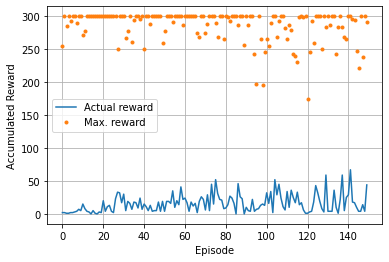

In [9]:
plt.plot(episode_reward, label='Actual reward')
plt.plot(max_reward, '.', label='Max. reward')
plt.xlabel('Episode')
plt.ylabel('Accumulated Reward')
plt.grid()
plt.legend()
plt.show()

In [10]:
max_reward

array([255., 300., 285., 300., 293., 300., 300., 290., 300., 300., 271.,
       278., 300., 300., 300., 300., 300., 300., 300., 300., 300., 300.,
       300., 300., 300., 300., 300., 251., 300., 300., 300., 267., 277.,
       300., 261., 295., 300., 300., 296., 300., 250., 300., 300., 288.,
       300., 300., 300., 300., 300., 259., 278., 300., 300., 300., 291.,
       300., 300., 300., 300., 286., 300., 300., 300., 300., 300., 300.,
       274., 268., 300., 300., 275., 288., 300., 300., 300., 290., 268.,
       300., 300., 266., 300., 299., 293., 300., 300., 300., 287., 300.,
       300., 256., 300., 287., 300., 300., 243., 197., 300., 266., 195.,
       246., 265., 255., 289., 300., 300., 268., 293., 300., 300., 282.,
       265., 287., 279., 243., 239., 231., 299., 300., 299., 300., 175.,
       246., 293., 260., 300., 300., 300., 250., 300., 283., 300., 286.,
       300., 300., 243., 283., 300., 284., 268., 265., 300., 300., 296.,
       294., 248., 221., 300., 238., 300., 291.])

In [11]:
episode_reward

array([ 2.,  2.,  1.,  1.,  2.,  2.,  3.,  4.,  7.,  5., 15.,  8.,  4.,
        3.,  0.,  5.,  1.,  0.,  3.,  2., 20.,  4., 11., 13.,  4.,  2.,
       23., 33., 32., 17., 30.,  5., 19., 16.,  7., 18., 17.,  9., 24.,
        7., 15., 11.,  5., 13.,  4.,  5.,  5., 18.,  4., 19.,  4., 19.,
       19., 16., 35., 10., 20., 14., 41., 22., 24., 17.,  4., 18., 12.,
       16.,  2., 19., 26., 22.,  6., 29.,  5., 45., 15., 52., 31., 22.,
       21.,  8.,  9., 14., 27., 24., 16.,  0., 46., 26., 23.,  0., 10.,
        5.,  4., 22.,  4.,  7.,  8., 13., 15., 13., 32., 16., 34.,  2.,
       52., 29., 45., 24., 11.,  6., 34., 10., 36., 25., 17., 33., 14.,
       17.,  6.,  1.,  1.,  3.,  4., 18., 43., 32., 19.,  8.,  3., 59.,
        4.,  4.,  4., 36., 10.,  1., 22., 59.,  5., 25., 29., 67., 18.,
       17., 10.,  4.,  4., 14.,  4., 44.])

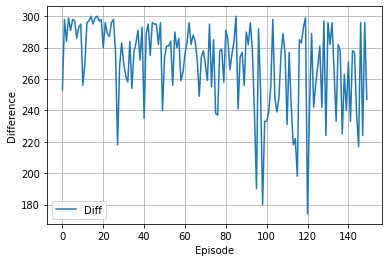

In [12]:
diff  = (max_reward - episode_reward)
plt.plot(diff, label='Diff')
plt.xlabel('Episode')
plt.ylabel('Difference')
plt.grid()
plt.legend()
plt.show()

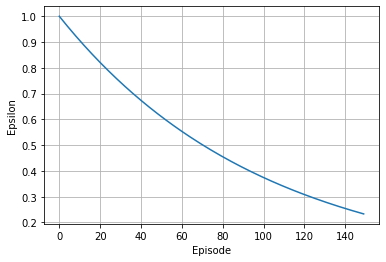

In [13]:
plt.plot(epsilon_vec)
plt.xlabel('Episode')
plt.ylabel('Epsilon')
plt.grid()
plt.show()

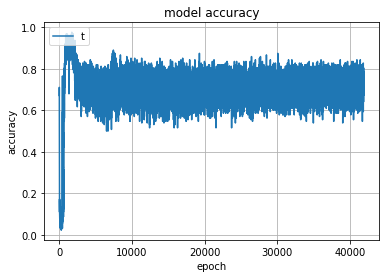

In [14]:
# summarize history for accuracy
plt.plot(acc_history)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend('train', loc='upper left')
plt.grid()
plt.show()

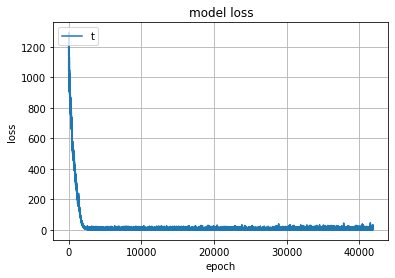

In [15]:
# summarize history for loss
plt.plot(loss_history)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend('train', loc='upper left')
plt.grid()
plt.show()

In [17]:
print(episode_reward[episode])

187.0


/home/sheila/anaconda3/envs/environment_py3_7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


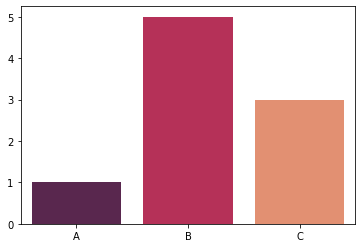

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

x = ['A', 'B', 'C']
y = [1, 5, 3]

sns.barplot(x, y, palette='rocket')
plt.show()